## Imports and Setup

In [4]:
import pandas as pd
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import seaborn as sns

# ML Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier

# Preprocessing and Evaluation
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, StratifiedKFold, KFold, cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_auc_score

import warnings
warnings.filterwarnings('ignore')

### Helper Functions

In [5]:
# Utility Functions
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred, average='weighted')
    rec = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print(classification_report(y_test, y_pred))
    print("Accuracy: {:.2f}%".format(acc * 100))
    print("Precision: {:.2f}%".format(prec * 100))
    print("Recall: {:.2f}%".format(rec * 100))
    print("F1 Score: {:.2f}%".format(f1 * 100))
    
    roc_auc = None
    if hasattr(model, "predict_proba"):
        y_prob = model.predict_proba(X_test)
        if len(np.unique(y_test)) == 2:
            y_prob = y_prob[:, 1]
            roc_auc = roc_auc_score(y_test, y_prob)
        else:
            roc_auc = roc_auc_score(y_test, y_prob, multi_class='ovr')
        # roc_auc = roc_auc_score(y_test, y_prob)
        print("ROC AUC: {:.2f}%".format(roc_auc * 100))
    return acc, prec, rec, f1, roc_auc

def plot_confusion(model, X_test, y_test, title):
    disp = ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, cmap=plt.cm.Blues)
    plt.title(title)
    plt.show()
    plt.close()

## Load Feature Files

In [ ]:
current_directory = os.getcwd()
pattern = os.path.join(current_directory, "Feature*.csv")
fileList = glob.glob(pattern)
print(fileList)

## Model Training and Hyperparameter Validation

### Logistic Regression (Stratified K-Fold)

Processing file 1/10: Feature_W100_Olap0.csv

 Logistic Regression on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W100_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.44      0.40      0.42       316
           1       0.46      0.43      0.44       311
           2       0.50      0.62      0.56       273
           3       0.72      0.73      0.72       194
           4       0.53      0.62      0.57       282
           5       0.62      0.65      0.64       311
           6       0.42      0.42      0.42       368
           7       0.52      0.44      0.48       305
           8       0.30      0.06      0.10        49
           9       0.49      0.64      0.56       310
          10       0.76      0.46      0.58       237

    accuracy                           0.52      2956
   macro avg       0.52      0.50      0.50      2956
weighted avg       0.53      0.52   

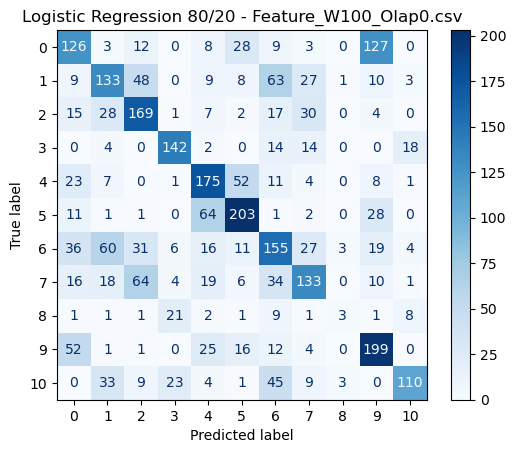

80/20 Split Cross-Validation Scores: [0.50913396 0.52825719 0.51708968 0.53164129 0.53096447]
80/20 Split Mean Accuracy: 52.34%
80/20 Split Std Deviation: 0.0089
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.43      0.37      0.40       474
           1       0.48      0.44      0.46       466
           2       0.51      0.62      0.56       409
           3       0.71      0.74      0.73       291
           4       0.52      0.61      0.56       422
           5       0.63      0.66      0.65       467
           6       0.43      0.46      0.45       551
           7       0.52      0.43      0.47       458
           8       0.26      0.07      0.11        73
           9       0.49      0.64      0.55       466
          10       0.73      0.42      0.53       356

    accuracy                           0.52      4433
   macro avg       0.52      0.50      0.50      4433
weighted avg       

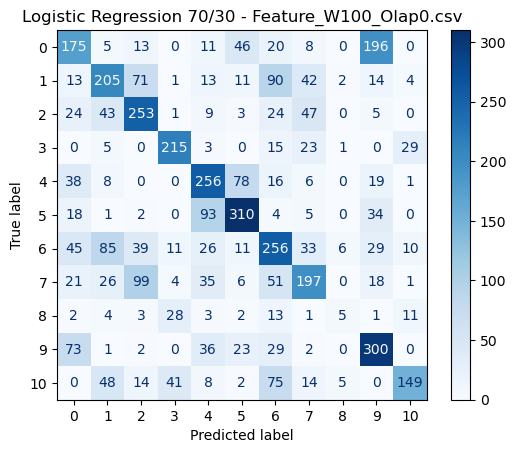


70/30 Split Cross-Validation Scores: [0.50913396 0.52825719 0.51708968 0.53164129 0.53096447]
70/30 Split Mean Accuracy: 52.34%
70/30 Split Std Deviation: 0.0089
Processing file 2/10: Feature_W100_Olap50.csv

 Logistic Regression on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W100_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.43      0.38      0.40       631
           1       0.48      0.43      0.45       621
           2       0.51      0.60      0.55       545
           3       0.71      0.75      0.73       387
           4       0.55      0.59      0.57       562
           5       0.60      0.63      0.62       621
           6       0.46      0.48      0.47       734
           7       0.51      0.46      0.49       608
           8       0.50      0.13      0.21        97
           9       0.48      0.66      0.56       620
          10       0.77      0.48 

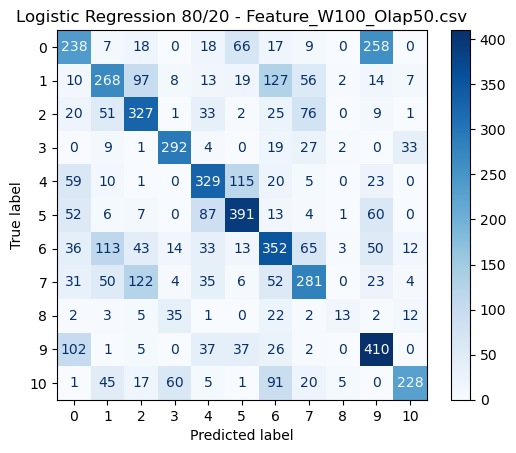

80/20 Split Cross-Validation Scores: [0.54568571 0.54043058 0.53856586 0.52534328 0.53449737]
80/20 Split Mean Accuracy: 53.69%
80/20 Split Std Deviation: 0.0068
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.46      0.40      0.42       946
           1       0.48      0.44      0.46       932
           2       0.51      0.60      0.55       817
           3       0.70      0.74      0.72       580
           4       0.56      0.61      0.59       843
           5       0.61      0.64      0.62       932
           6       0.46      0.46      0.46      1102
           7       0.51      0.45      0.48       912
           8       0.45      0.16      0.24       146
           9       0.48      0.67      0.56       929
          10       0.76      0.47      0.58       710

    accuracy                           0.53      8849
   macro avg       0.54      0.51      0.52      8849
weighted avg       

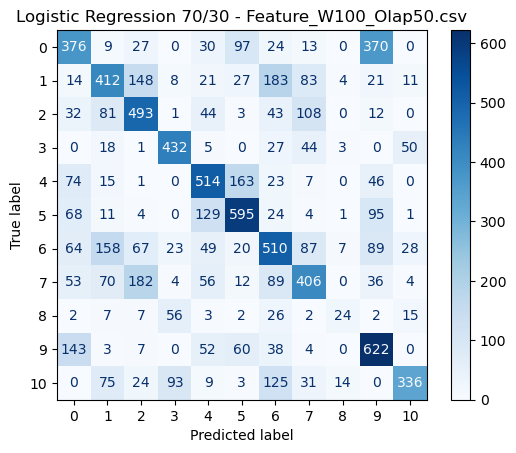


70/30 Split Cross-Validation Scores: [0.54568571 0.54043058 0.53856586 0.52534328 0.53449737]
70/30 Split Mean Accuracy: 53.69%
70/30 Split Std Deviation: 0.0068
Processing file 3/10: Feature_W200_Olap0.csv

 Logistic Regression on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W200_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.47      0.39      0.42       157
           1       0.53      0.55      0.54       155
           2       0.49      0.60      0.54       136
           3       0.80      0.70      0.74        96
           4       0.61      0.60      0.61       140
           5       0.66      0.72      0.69       155
           6       0.57      0.61      0.59       183
           7       0.58      0.44      0.50       152
           8       0.75      0.12      0.21        24
           9       0.52      0.68      0.59       155
          10       0.68      0.59   

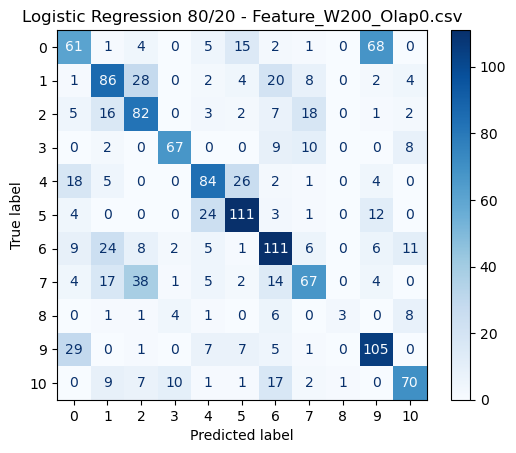

80/20 Split Cross-Validation Scores: [0.56492182 0.5560843  0.56832087 0.55404487 0.5462585 ]
80/20 Split Mean Accuracy: 55.79%
80/20 Split Std Deviation: 0.0079
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.44      0.38      0.41       236
           1       0.51      0.51      0.51       232
           2       0.52      0.59      0.55       204
           3       0.73      0.74      0.73       145
           4       0.61      0.60      0.60       210
           5       0.63      0.70      0.67       232
           6       0.54      0.58      0.56       275
           7       0.53      0.40      0.45       228
           8       0.62      0.14      0.23        36
           9       0.49      0.66      0.56       232
          10       0.70      0.56      0.62       177

    accuracy                           0.56      2207
   macro avg       0.57      0.53      0.54      2207
weighted avg       

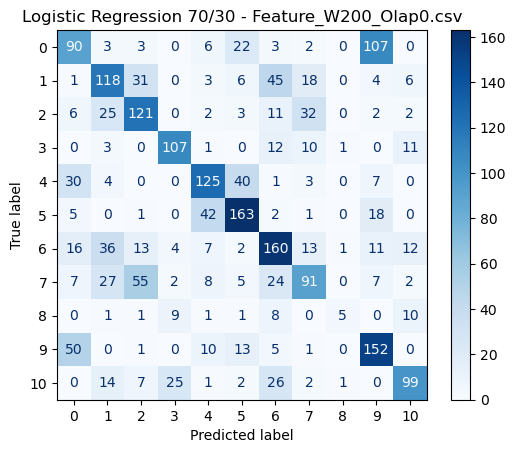


70/30 Split Cross-Validation Scores: [0.56492182 0.5560843  0.56832087 0.55404487 0.5462585 ]
70/30 Split Mean Accuracy: 55.79%
70/30 Split Std Deviation: 0.0079
Processing file 4/10: Feature_W200_Olap50.csv

 Logistic Regression on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W200_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.49      0.42      0.45       313
           1       0.52      0.48      0.50       308
           2       0.55      0.62      0.58       271
           3       0.81      0.78      0.79       192
           4       0.59      0.64      0.61       279
           5       0.66      0.66      0.66       309
           6       0.53      0.62      0.57       365
           7       0.55      0.45      0.50       302
           8       0.65      0.27      0.38        48
           9       0.52      0.65      0.58       308
          10       0.77      0.63 

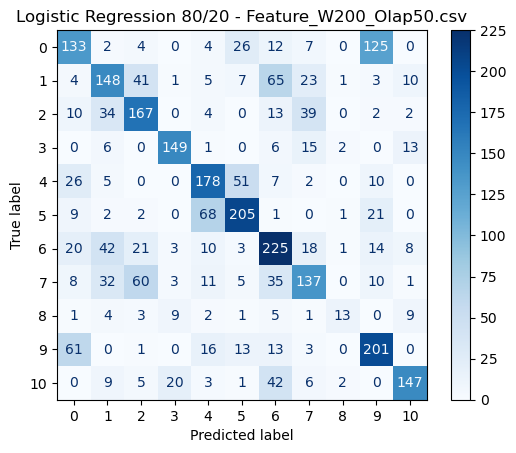

80/20 Split Cross-Validation Scores: [0.57303754 0.57064846 0.57937863 0.56879481 0.58245135]
80/20 Split Mean Accuracy: 57.49%
80/20 Split Std Deviation: 0.0052
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.46      0.40      0.43       470
           1       0.53      0.50      0.51       463
           2       0.56      0.64      0.60       406
           3       0.81      0.78      0.79       287
           4       0.59      0.63      0.61       419
           5       0.66      0.67      0.67       463
           6       0.53      0.61      0.56       548
           7       0.54      0.44      0.49       453
           8       0.63      0.26      0.37        72
           9       0.52      0.65      0.57       462
          10       0.77      0.63      0.69       352

    accuracy                           0.58      4395
   macro avg       0.60      0.56      0.57      4395
weighted avg       

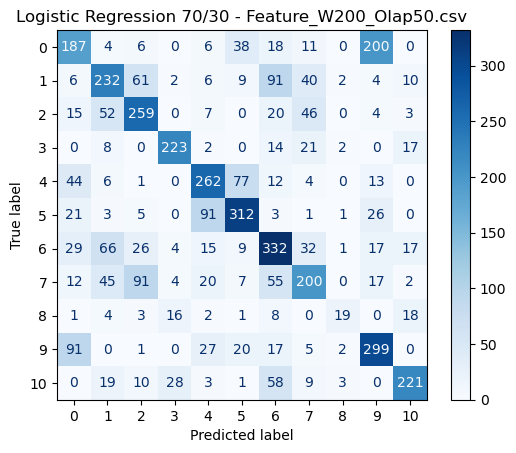


70/30 Split Cross-Validation Scores: [0.57269625 0.57303754 0.58006145 0.57084329 0.58415842]
70/30 Split Mean Accuracy: 57.62%
70/30 Split Std Deviation: 0.0051
Processing file 5/10: Feature_W300_Olap0.csv

 Logistic Regression on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W300_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.53      0.39      0.45       105
           1       0.57      0.60      0.59       103
           2       0.57      0.64      0.61        90
           3       0.78      0.72      0.75        64
           4       0.59      0.70      0.64        93
           5       0.78      0.70      0.74       102
           6       0.65      0.76      0.70       122
           7       0.49      0.41      0.45       101
           8       1.00      0.25      0.40        16
           9       0.50      0.72      0.59       103
          10       0.75      0.50   

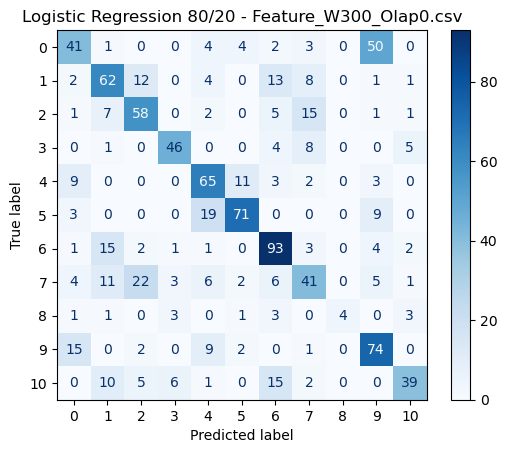

80/20 Split Cross-Validation Scores: [0.59365404 0.59160696 0.58853634 0.59733607 0.57786885]
80/20 Split Mean Accuracy: 58.98%
80/20 Split Std Deviation: 0.0066
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.52      0.41      0.46       157
           1       0.51      0.56      0.54       154
           2       0.61      0.63      0.62       135
           3       0.78      0.74      0.76        96
           4       0.60      0.67      0.63       139
           5       0.73      0.71      0.72       154
           6       0.63      0.74      0.68       183
           7       0.53      0.45      0.49       151
           8       0.57      0.17      0.26        24
           9       0.52      0.71      0.60       155
          10       0.72      0.43      0.54       117

    accuracy                           0.60      1465
   macro avg       0.61      0.57      0.57      1465
weighted avg       

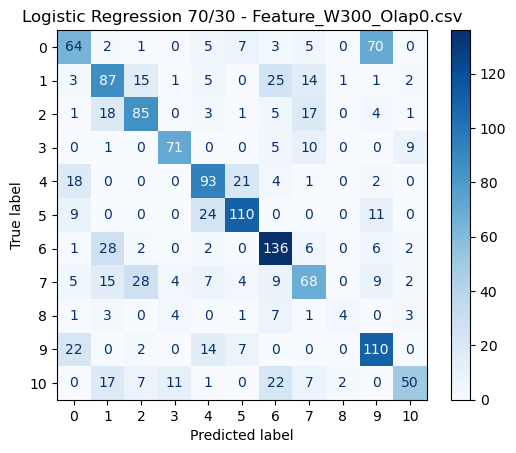


70/30 Split Cross-Validation Scores: [0.59365404 0.59160696 0.58853634 0.59733607 0.57786885]
70/30 Split Mean Accuracy: 58.98%
70/30 Split Std Deviation: 0.0066
Processing file 6/10: Feature_W300_Olap50.csv

 Logistic Regression on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W300_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.43      0.37      0.40       208
           1       0.57      0.56      0.56       205
           2       0.58      0.60      0.59       179
           3       0.84      0.78      0.81       127
           4       0.64      0.58      0.61       185
           5       0.68      0.75      0.71       204
           6       0.64      0.64      0.64       243
           7       0.57      0.51      0.54       199
           8       0.69      0.29      0.41        31
           9       0.50      0.68      0.58       204
          10       0.77      0.78 

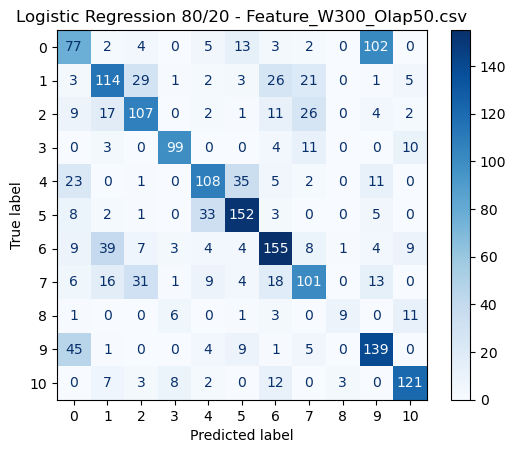

80/20 Split Cross-Validation Scores: [0.62235961 0.60020608 0.61823802 0.5945389  0.60793405]
80/20 Split Mean Accuracy: 60.87%
80/20 Split Std Deviation: 0.0105
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.45      0.38      0.42       312
           1       0.58      0.58      0.58       307
           2       0.58      0.59      0.59       269
           3       0.83      0.77      0.80       190
           4       0.66      0.63      0.64       278
           5       0.68      0.71      0.70       307
           6       0.65      0.66      0.66       364
           7       0.56      0.51      0.53       299
           8       0.55      0.24      0.33        46
           9       0.50      0.67      0.57       307
          10       0.75      0.72      0.74       233

    accuracy                           0.61      2912
   macro avg       0.62      0.59      0.60      2912
weighted avg       

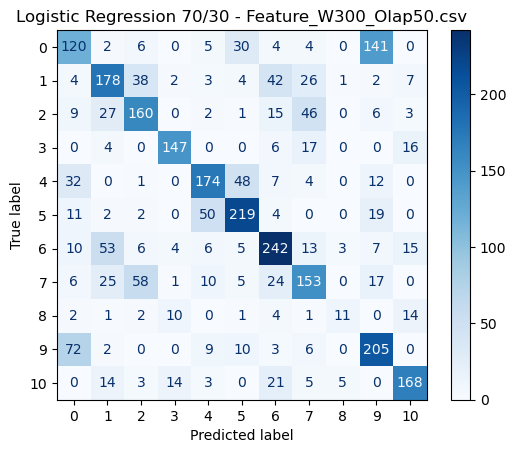


70/30 Split Cross-Validation Scores: [0.62029882 0.60329727 0.62081401 0.5950541  0.61154044]
70/30 Split Mean Accuracy: 61.02%
70/30 Split Std Deviation: 0.0099
Processing file 7/10: Feature_W400_Olap0.csv

 Logistic Regression on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W400_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.37      0.32      0.34        78
           1       0.52      0.51      0.51        77
           2       0.60      0.58      0.59        67
           3       0.74      0.71      0.72        48
           4       0.65      0.64      0.64        69
           5       0.68      0.69      0.68        77
           6       0.67      0.71      0.69        91
           7       0.54      0.53      0.54        75
           8       0.50      0.25      0.33        12
           9       0.43      0.56      0.49        77
          10       0.74      0.69   

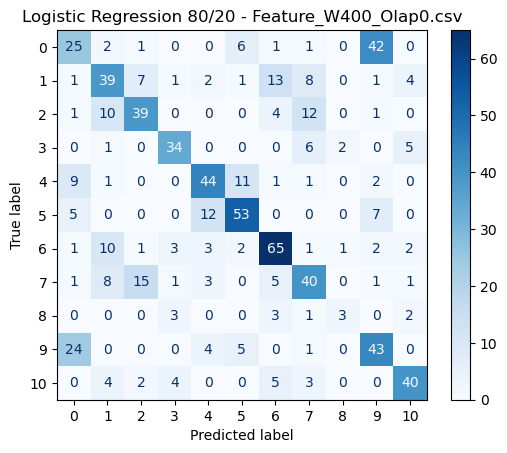

80/20 Split Cross-Validation Scores: [0.61042524 0.61865569 0.64060357 0.59396433 0.58241758]
80/20 Split Mean Accuracy: 60.92%
80/20 Split Std Deviation: 0.0201
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.42      0.36      0.39       117
           1       0.52      0.50      0.51       115
           2       0.59      0.51      0.55       101
           3       0.76      0.78      0.77        72
           4       0.61      0.62      0.62       104
           5       0.60      0.61      0.61       115
           6       0.67      0.72      0.69       136
           7       0.53      0.55      0.54       113
           8       0.50      0.22      0.31        18
           9       0.47      0.59      0.53       115
          10       0.70      0.65      0.67        88

    accuracy                           0.58      1094
   macro avg       0.58      0.56      0.56      1094
weighted avg       

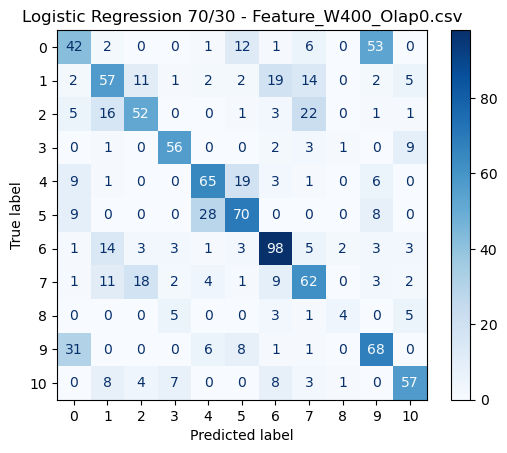


70/30 Split Cross-Validation Scores: [0.61042524 0.61865569 0.64060357 0.59396433 0.58241758]
70/30 Split Mean Accuracy: 60.92%
70/30 Split Std Deviation: 0.0201
Processing file 8/10: Feature_W400_Olap50.csv

 Logistic Regression on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W400_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.50      0.41      0.45       155
           1       0.57      0.60      0.58       152
           2       0.61      0.72      0.66       134
           3       0.79      0.81      0.80        94
           4       0.69      0.69      0.69       138
           5       0.69      0.74      0.72       152
           6       0.73      0.81      0.77       181
           7       0.57      0.48      0.52       149
           8       0.64      0.39      0.49        23
           9       0.53      0.66      0.59       152
          10       0.90      0.53 

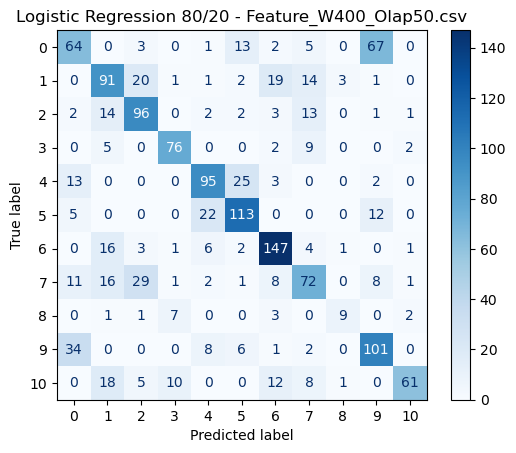

80/20 Split Cross-Validation Scores: [0.63321799 0.62629758 0.64083045 0.62698962 0.63114187]
80/20 Split Mean Accuracy: 63.17%
80/20 Split Std Deviation: 0.0052
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.50      0.45      0.47       233
           1       0.61      0.63      0.62       228
           2       0.60      0.69      0.64       200
           3       0.80      0.86      0.83       141
           4       0.66      0.65      0.66       207
           5       0.68      0.70      0.69       229
           6       0.74      0.80      0.77       271
           7       0.59      0.49      0.54       223
           8       0.78      0.40      0.53        35
           9       0.51      0.64      0.56       228
          10       0.83      0.55      0.66       173

    accuracy                           0.64      2168
   macro avg       0.66      0.62      0.63      2168
weighted avg       

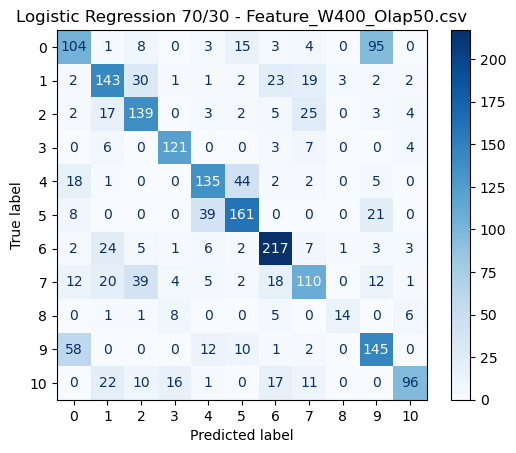


70/30 Split Cross-Validation Scores: [0.63321799 0.62629758 0.64083045 0.62698962 0.63114187]
70/30 Split Mean Accuracy: 63.17%
70/30 Split Std Deviation: 0.0052
Processing file 9/10: Feature_W500_Olap0.csv

 Logistic Regression on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W500_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.49      0.42      0.45        62
           1       0.62      0.52      0.57        61
           2       0.59      0.69      0.63        54
           3       0.72      0.82      0.77        38
           4       0.53      0.50      0.51        56
           5       0.62      0.66      0.63        61
           6       0.67      0.88      0.76        73
           7       0.54      0.42      0.47        60
           8       0.20      0.11      0.14         9
           9       0.53      0.69      0.60        61
          10       0.81      0.47   

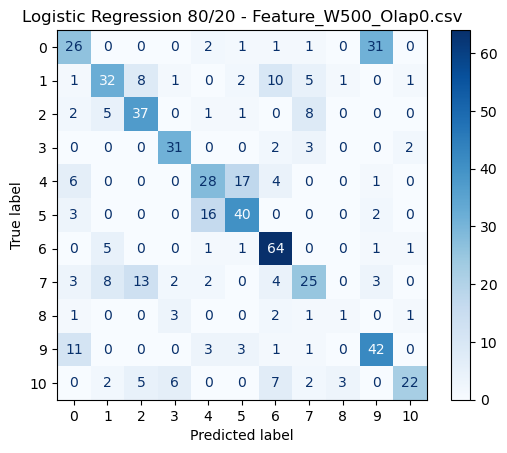

80/20 Split Cross-Validation Scores: [0.63402062 0.57388316 0.616179   0.61273666 0.56798623]
80/20 Split Mean Accuracy: 60.10%
80/20 Split Std Deviation: 0.0256
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.47      0.43      0.45        93
           1       0.55      0.46      0.50        92
           2       0.58      0.62      0.60        81
           3       0.72      0.86      0.78        56
           4       0.59      0.54      0.56        84
           5       0.65      0.70      0.67        92
           6       0.68      0.82      0.74       109
           7       0.55      0.52      0.53        90
           8       0.20      0.14      0.17        14
           9       0.49      0.63      0.55        92
          10       0.77      0.43      0.55        70

    accuracy                           0.59       873
   macro avg       0.57      0.56      0.56       873
weighted avg       

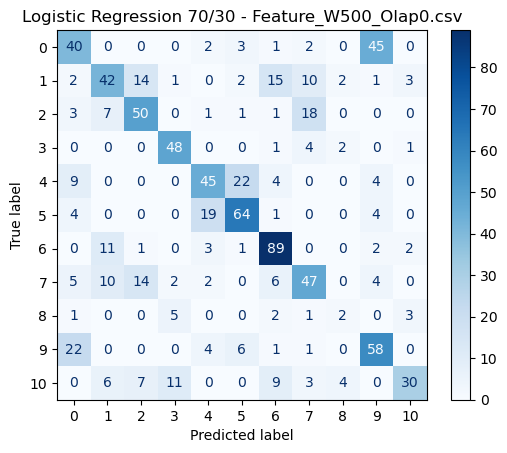


70/30 Split Cross-Validation Scores: [0.63402062 0.57388316 0.616179   0.61273666 0.56798623]
70/30 Split Mean Accuracy: 60.10%
70/30 Split Std Deviation: 0.0256
Processing file 10/10: Feature_W500_Olap50.csv

 Logistic Regression on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W500_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.39      0.31      0.35       124
           1       0.54      0.50      0.52       121
           2       0.59      0.65      0.62       106
           3       0.75      0.80      0.77        74
           4       0.58      0.61      0.59       110
           5       0.69      0.66      0.68       121
           6       0.69      0.83      0.75       144
           7       0.63      0.53      0.58       118
           8       0.73      0.44      0.55        18
           9       0.48      0.64      0.55       121
          10       0.85      0.58

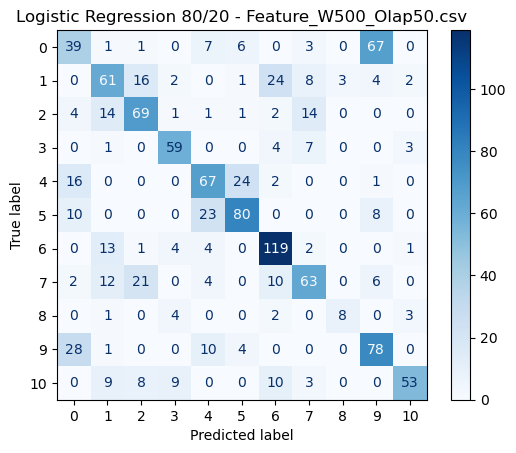

80/20 Split Cross-Validation Scores: [0.6283725  0.64403829 0.63533507 0.63359443 0.62630662]
80/20 Split Mean Accuracy: 63.35%
80/20 Split Std Deviation: 0.0062
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.46      0.37      0.41       185
           1       0.56      0.52      0.54       182
           2       0.60      0.66      0.63       159
           3       0.77      0.80      0.79       111
           4       0.60      0.63      0.62       165
           5       0.67      0.69      0.68       182
           6       0.71      0.83      0.76       216
           7       0.61      0.49      0.54       177
           8       0.67      0.44      0.53        27
           9       0.49      0.64      0.55       182
          10       0.80      0.62      0.70       138

    accuracy                           0.62      1724
   macro avg       0.63      0.61      0.61      1724
weighted avg       

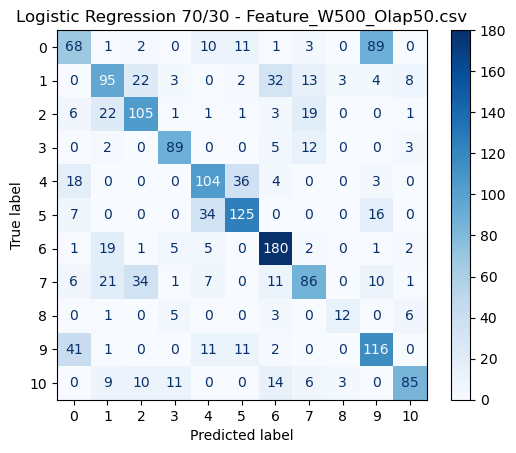


70/30 Split Cross-Validation Scores: [0.6283725  0.64403829 0.63533507 0.63359443 0.62630662]
70/30 Split Mean Accuracy: 63.35%
70/30 Split Std Deviation: 0.0062


,Feature File,Model,Split,Accuracy,Precision,Recall,F1-Score,ROC_AUC,CV Mean Accuracy,CV Std Accuracy,Best Params
0,Feature_W100_Olap0.csv,Logistic Regression,80/20,0.523681,0.527476,0.523681,0.518839,0.909472,0.523417,0.008855,"{'C': 1, 'penalty': 'l2', 'solver': 'liblinear'}"
1,Feature_W100_Olap0.csv,Logistic Regression,70/30,0.523573,0.526910,0.523573,0.518133,0.908565,0.523417,0.008855,"{'C': 1, 'penalty': 'l2', 'solver': 'liblinear'}"
2,Feature_W100_Olap50.csv,Logistic Regression,80/20,0.530429,0.536384,0.530429,0.526633,0.915257,0.536905,0.006808,"{'C': 1, 'penalty': 'l2', 'solver': 'liblinear'}"
3,Feature_W100_Olap50.csv,Logistic Regression,70/30,0.533394,0.538646,0.533394,0.529629,0.913314,0.536905,0.006808,"{'C': 1, 'penalty': 'l2', 'solver': 'liblinear'}"
4,Feature_W200_Olap0.csv,Logistic Regression,80/20,0.575799,0.582640,0.575799,0.571808,0.924611,0.557926,0.007894,"{'C': 100, 'l1_ratio': 0.596850157946487, 'pen..."
5,Feature_W200_Olap0.csv,Logistic Regression,70/30,0.557771,0.560331,0.557771,0.553088,0.923691,0.557926,0.007894,"{'C': 100, 'l1_ratio': 0.596850157946487, 'pen..."
6,Feature_W200_Olap50.csv,Logistic Regression,80/20,0.581229,0.585824,0.581229,0.579387,0.929428,0.574862,0.005213,"{'C': 100, 'l1_ratio': 0.596850157946487, 'pen..."
7,Feature_W200_Olap50.csv,Logistic Regression,70/30,0.579295,0.582965,0.579295,0.577099,0.928970,0.576159,0.005084,"{'C': 1, 'l1_ratio': 0.8661761457749352, 'pena..."
8,Feature_W300_Olap0.csv,Logistic Regression,80/20,0.607984,0.619955,0.607984,0.603045,0.928709,0.589800,0.006616,"{'C': 1, 'penalty': 'l2', 'solver': 'liblinear'}"
9,Feature_W300_Olap0.csv,Logistic Regression,70/30,0.599317,0.604600,0.599317,0.593511,0.927949,0.589800,0.006616,"{'C': 1, 'penalty': 'l2', 'solver': 'liblinear'}"


In [ ]:
from scipy.stats import uniform


log_reg_params = [
    {
        'penalty': ['l1'],
        'C': [0.01, 0.1, 1, 10, 100],
        'solver': ['liblinear', 'saga']
    },
    {
        'penalty': ['l2'],
        'C': [0.01, 0.1, 1, 10, 100],
        'solver': ['liblinear', 'saga']
    },
    {
        'penalty': ['elasticnet'],
        'C': [0.01, 0.1, 1, 10, 100],
        'solver': ['saga'],  # elastic net only works with saga solver
        'l1_ratio': uniform(0, 1)
    }
]
logistic_results = []

# for file_path in fileList:
for i, file_path in enumerate(fileList):
    print(f"Processing file {i+1}/{len(fileList)}: {os.path.basename(file_path)}")
    print(f"\n Logistic Regression on {file_path}...")

    df = pd.read_csv(file_path)
    X = df.drop(columns=['exp_Name'])
    y = df['exp_Name']
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # 80/20 Split
    X_train_80, X_test_20, y_train_80, y_test_20 = train_test_split(X_scaled, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)

    log_reg_80 = LogisticRegression(random_state=42)
    log_search_80 = RandomizedSearchCV(
        estimator=log_reg_80,
        param_distributions=log_reg_params,
        n_iter=10,
        cv=5,
        scoring='accuracy',
        refit=True,
        n_jobs=-1,
        random_state=42,
        verbose=2
    )
    log_search_80.fit(X_train_80, y_train_80)
    best_log_reg_80 = log_search_80.best_estimator_

    acc80, prec80, rec80, f180, roc_auc80 = evaluate_model(best_log_reg_80, X_test_20, y_test_20)
    plot_confusion(best_log_reg_80, X_test_20, y_test_20, title=f"Logistic Regression 80/20 - {os.path.basename(file_path)}")

    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    skf_scores_80 = cross_val_score(best_log_reg_80, X_scaled, y_encoded, cv=skf, scoring='accuracy', n_jobs=-1)
    print("80/20 Split Cross-Validation Scores:", skf_scores_80)
    print("80/20 Split Mean Accuracy: {:.2f}%".format(skf_scores_80.mean() * 100))
    print("80/20 Split Std Deviation: {:.4f}".format(skf_scores_80.std()))

    # 70/30 Split
    X_train_70, X_test_30, y_train_70, y_test_30 = train_test_split(X_scaled, y_encoded, test_size=0.3, random_state=42, stratify=y_encoded)

    log_reg_70 = LogisticRegression(random_state=42)
    log_search_70 = RandomizedSearchCV(
        estimator=log_reg_70,
        param_distributions=log_reg_params,
        n_iter=10,
        cv=5,
        scoring='accuracy',
        refit=True,
        n_jobs=-1,
        random_state=42,
        verbose=2
    )
    log_search_70.fit(X_train_70, y_train_70)
    best_log_reg_70 = log_search_70.best_estimator_

    acc70, prec70, rec70, f170, roc_auc70 = evaluate_model(best_log_reg_70, X_test_30, y_test_30)
    plot_confusion(best_log_reg_70, X_test_30, y_test_30, title=f"Logistic Regression 70/30 - {os.path.basename(file_path)}")

    skf_scores_70 = cross_val_score(best_log_reg_70, X_scaled, y_encoded, cv=skf, scoring='accuracy', n_jobs=-1)
    print("\n70/30 Split Cross-Validation Scores:", skf_scores_70)
    print("70/30 Split Mean Accuracy: {:.2f}%".format(skf_scores_70.mean() * 100))
    print("70/30 Split Std Deviation: {:.4f}".format(skf_scores_70.std()))

    # Save all to logistic_results
    logistic_results.append([
        os.path.basename(file_path), "Logistic Regression", "80/20", acc80, prec80, rec80, f180, roc_auc80,
        skf_scores_80.mean(), skf_scores_80.std(), log_search_80.best_params_
    ])
    logistic_results.append([
        os.path.basename(file_path), "Logistic Regression", "70/30", acc70, prec70, rec70, f170, roc_auc70,
        skf_scores_70.mean(), skf_scores_70.std(), log_search_70.best_params_
    ])

# Create final dataframe
logistic_results_df = pd.DataFrame(logistic_results, columns=[
    "Feature File", "Model", "Split", "Accuracy", "Precision", "Recall", "F1-Score", "ROC_AUC",
    "CV Mean Accuracy", "CV Std Accuracy", "Best Params"
])

# Save results
logistic_results_df.to_csv('results_logistic_regression.csv', index=False)

# Display
logistic_results_df

### Decision Tree (K-Fold)

Processing file 1/10: Feature_W100_Olap0.csv

 Decision Tree on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W100_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.5s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.6s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.5s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.5s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.6s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   1.2s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   1.2s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total

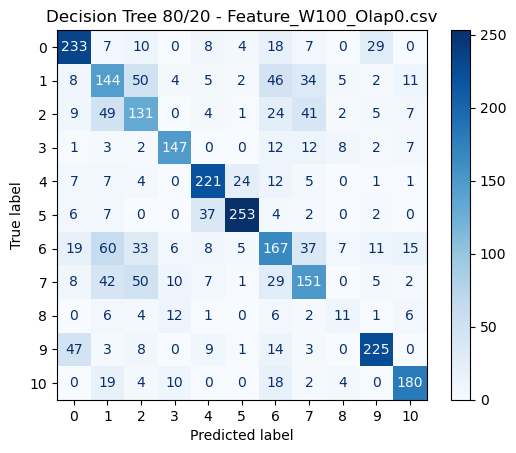

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.5s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.4s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.4s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.4s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.4s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   1.0s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   1.0s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   1.0s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   1.0s
[CV] END criterion=ent

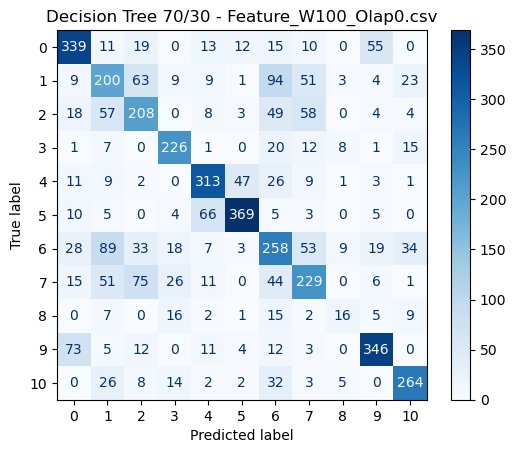

KFold Cross-Validation Scores (80/20 model): [0.62889039 0.63147208 0.61556684 0.61455161 0.6142132 ]
KFold Mean Accuracy (80/20 model): 62.09%
KFold Std Deviation (80/20 model): 0.0076

KFold Cross-Validation Scores (70/30 model): [0.62719892 0.63553299 0.61049069 0.61725888 0.61827411]
KFold Mean Accuracy (70/30 model): 62.18%
KFold Std Deviation (70/30 model): 0.0087
Processing file 2/10: Feature_W100_Olap50.csv

 Decision Tree on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W100_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   1.3s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   1.3s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   1.3s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   1.3s
[CV] END criterion=gi

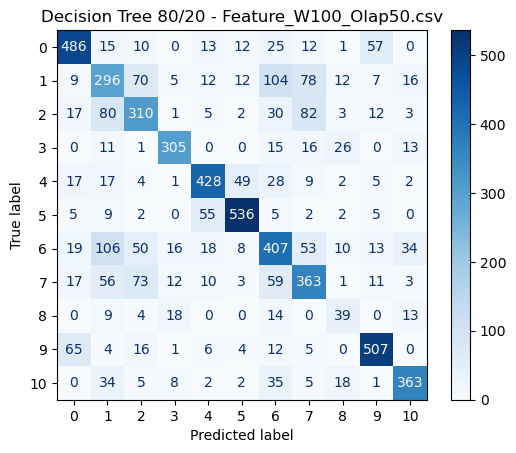

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   1.1s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   1.1s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   1.1s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   1.1s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   1.1s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   2.2s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   2.2s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   2.2s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   2.2s
[CV] END criterion=ent

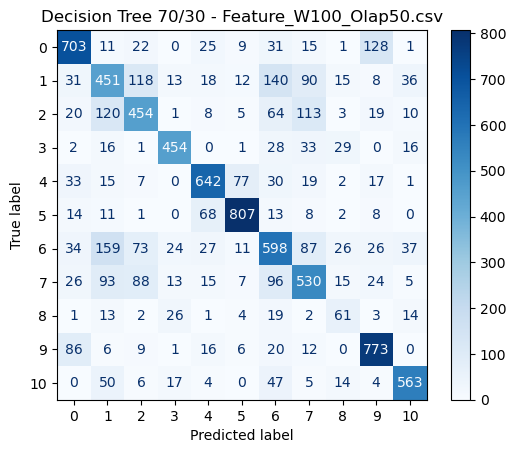

KFold Cross-Validation Scores (80/20 model): [0.67502967 0.68333616 0.67299542 0.67875911 0.69520258]
KFold Mean Accuracy (80/20 model): 68.11%
KFold Std Deviation (80/20 model): 0.0079

KFold Cross-Validation Scores (70/30 model): [0.67502967 0.68079335 0.67180878 0.68503136 0.69181217]
KFold Mean Accuracy (70/30 model): 68.09%
KFold Std Deviation (70/30 model): 0.0071
Processing file 3/10: Feature_W200_Olap0.csv

 Decision Tree on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W200_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.2s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.2s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.2s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.2s
[CV] END criterion=gini

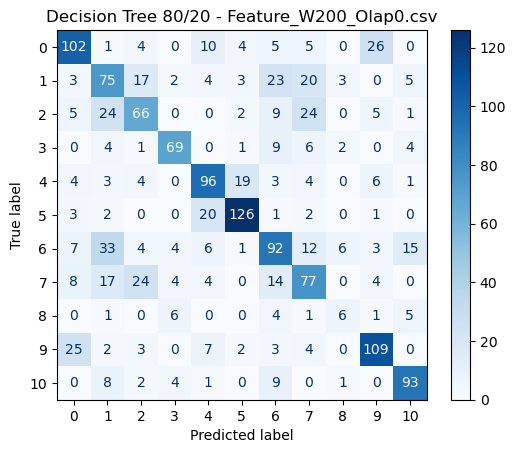

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.2s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.4s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.4s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.4s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.4s
[CV] END criterion=ent

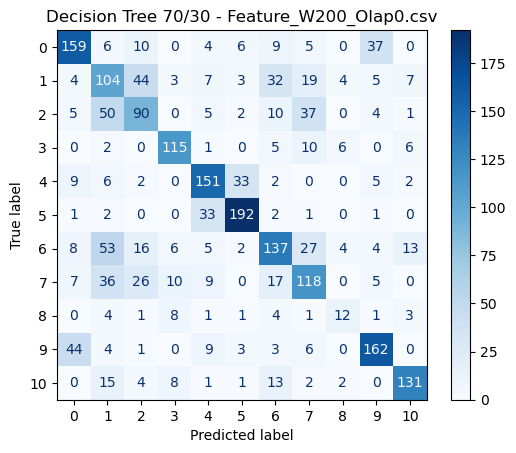

KFold Cross-Validation Scores (80/20 model): [0.64038069 0.61930659 0.59551326 0.65261727 0.61088435]
KFold Mean Accuracy (80/20 model): 62.37%
KFold Std Deviation (80/20 model): 0.0205

KFold Cross-Validation Scores (70/30 model): [0.66145479 0.61726717 0.61930659 0.61726717 0.62380952]
KFold Mean Accuracy (70/30 model): 62.78%
KFold Std Deviation (70/30 model): 0.0170
Processing file 4/10: Feature_W200_Olap50.csv

 Decision Tree on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W200_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.5s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.5s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.5s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.5s
[CV] END criterion=gi

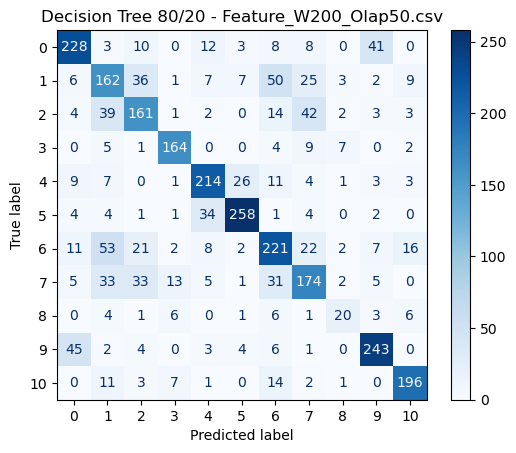

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.4s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.4s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.4s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.4s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.4s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.9s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.9s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.9s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.9s
[CV] END criterion=ent

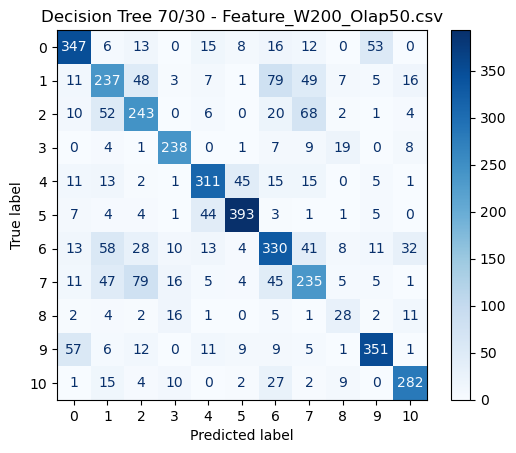

KFold Cross-Validation Scores (80/20 model): [0.70580205 0.70853242 0.70126323 0.70262888 0.69443496]
KFold Mean Accuracy (80/20 model): 70.25%
KFold Std Deviation (80/20 model): 0.0048

KFold Cross-Validation Scores (70/30 model): [0.69624573 0.69761092 0.69204507 0.69750768 0.68999659]
KFold Mean Accuracy (70/30 model): 69.47%
KFold Std Deviation (70/30 model): 0.0031
Processing file 5/10: Feature_W300_Olap0.csv

 Decision Tree on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W300_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=gini

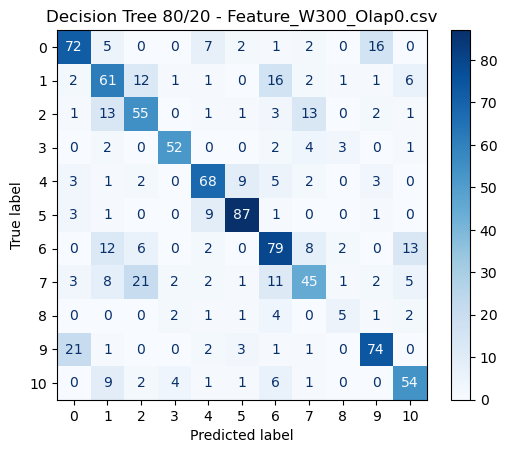

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.2s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.2s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.2s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.2s
[CV] END criterion=ent

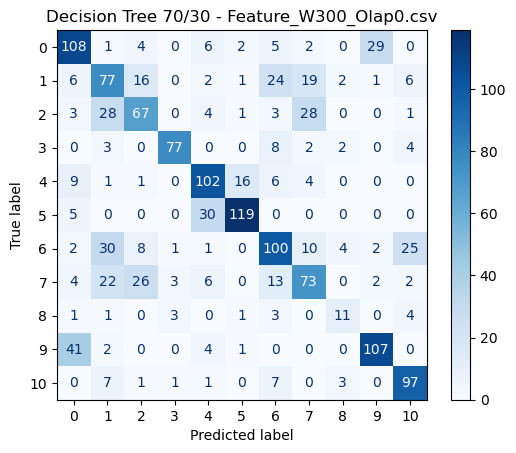

KFold Cross-Validation Scores (80/20 model): [0.62947799 0.64073695 0.65813715 0.61680328 0.64856557]
KFold Mean Accuracy (80/20 model): 63.87%
KFold Std Deviation (80/20 model): 0.0144

KFold Cross-Validation Scores (70/30 model): [0.63561924 0.64483112 0.65404299 0.61168033 0.65061475]
KFold Mean Accuracy (70/30 model): 63.94%
KFold Std Deviation (70/30 model): 0.0152
Processing file 6/10: Feature_W300_Olap50.csv

 Decision Tree on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W300_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.3s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.3s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.3s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.3s
[CV] END criterion=gi

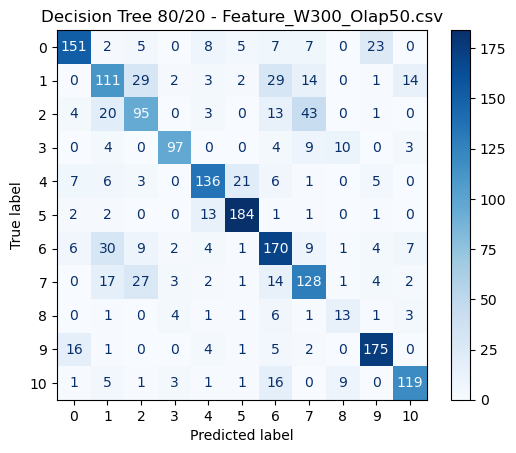

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.2s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.2s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.2s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.2s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.2s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.5s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.5s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.5s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.5s
[CV] END criterion=ent

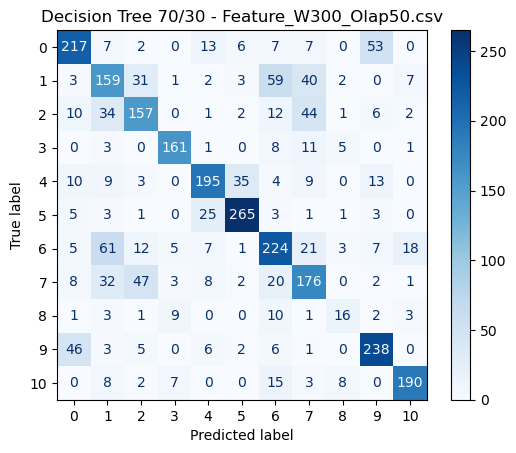

KFold Cross-Validation Scores (80/20 model): [0.73621844 0.72385368 0.69654817 0.70839773 0.69191139]
KFold Mean Accuracy (80/20 model): 71.14%
KFold Std Deviation (80/20 model): 0.0166

KFold Cross-Validation Scores (70/30 model): [0.71303452 0.70479134 0.69757857 0.70891293 0.68985059]
KFold Mean Accuracy (70/30 model): 70.28%
KFold Std Deviation (70/30 model): 0.0083
Processing file 7/10: Feature_W400_Olap0.csv

 Decision Tree on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W400_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini

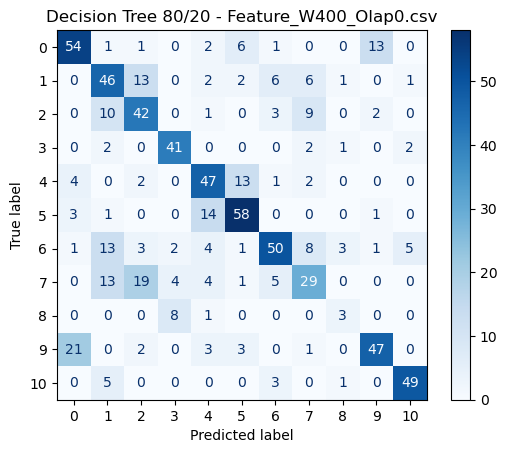

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.1s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.1s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.1s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.1s
[CV] END criterion=ent

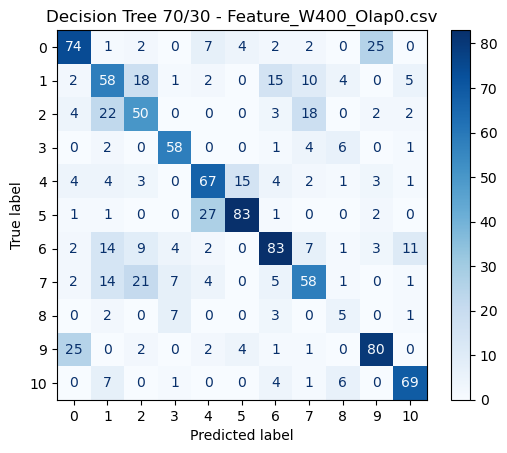

KFold Cross-Validation Scores (80/20 model): [0.65294925 0.66392318 0.63237311 0.67078189 0.64285714]
KFold Mean Accuracy (80/20 model): 65.26%
KFold Std Deviation (80/20 model): 0.0139

KFold Cross-Validation Scores (70/30 model): [0.64334705 0.65294925 0.62688615 0.6611797  0.62225275]
KFold Mean Accuracy (70/30 model): 64.13%
KFold Std Deviation (70/30 model): 0.0149
Processing file 8/10: Feature_W400_Olap50.csv

 Decision Tree on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W400_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.2s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.2s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.2s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.2s
[CV] END criterion=gi

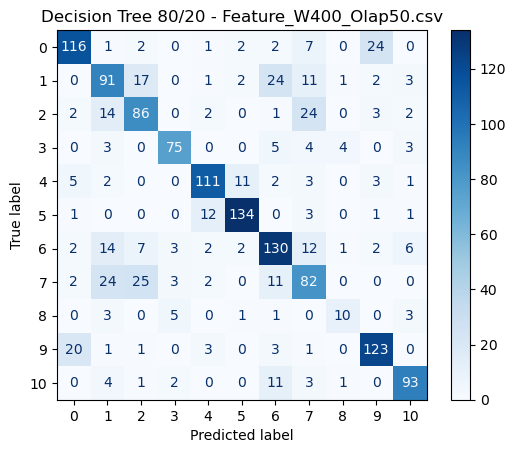

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.4s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.4s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.3s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.3s
[CV] END criterion=ent

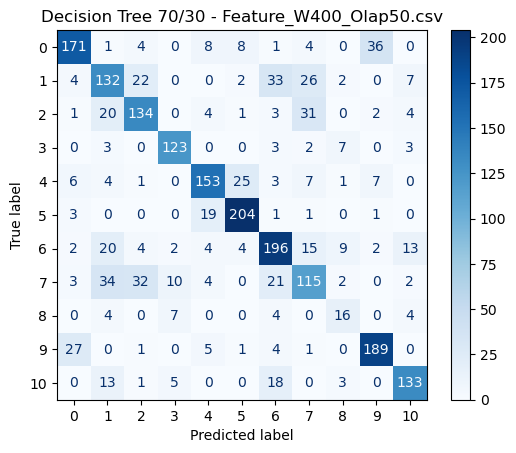

KFold Cross-Validation Scores (80/20 model): [0.70449827 0.72871972 0.73079585 0.73217993 0.72595156]
KFold Mean Accuracy (80/20 model): 72.44%
KFold Std Deviation (80/20 model): 0.0102

KFold Cross-Validation Scores (70/30 model): [0.69480969 0.74117647 0.72249135 0.71972318 0.71418685]
KFold Mean Accuracy (70/30 model): 71.85%
KFold Std Deviation (70/30 model): 0.0149
Processing file 9/10: Feature_W500_Olap0.csv

 Decision Tree on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W500_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini

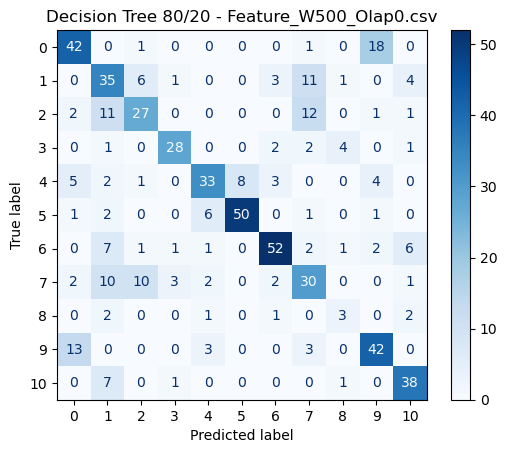

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.1s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.1s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.1s
[CV] END criterion=ent

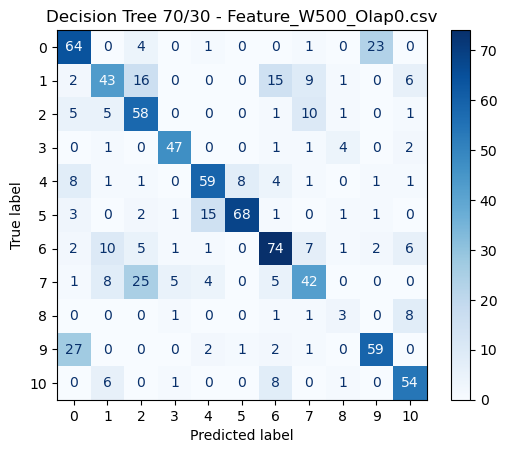

KFold Cross-Validation Scores (80/20 model): [0.64089347 0.63573883 0.64027539 0.64371773 0.62822719]
KFold Mean Accuracy (80/20 model): 63.78%
KFold Std Deviation (80/20 model): 0.0054

KFold Cross-Validation Scores (70/30 model): [0.6443299  0.62714777 0.62650602 0.64716007 0.62994836]
KFold Mean Accuracy (70/30 model): 63.50%
KFold Std Deviation (70/30 model): 0.0089
Processing file 10/10: Feature_W500_Olap50.csv

 Decision Tree on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W500_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=g

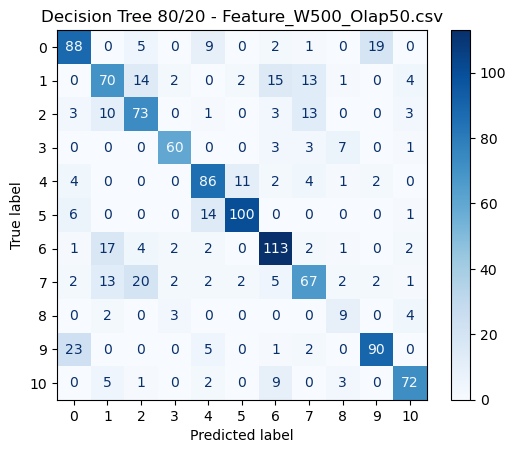

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=gini, max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.1s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.2s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.3s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.2s
[CV] END criterion=entropy, max_depth=20, min_samples_leaf=4, min_samples_split=10; total time=   0.2s
[CV] END criterion=ent

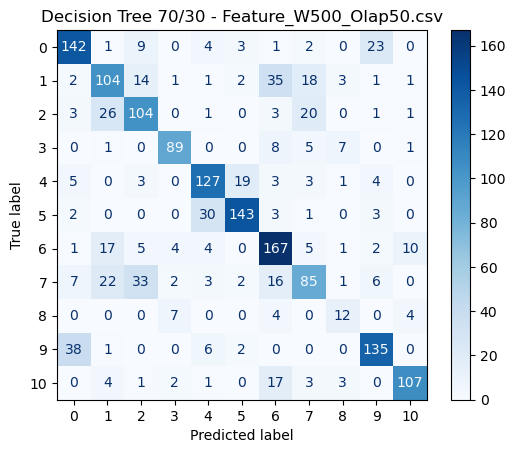

KFold Cross-Validation Scores (80/20 model): [0.72410792 0.72932985 0.7232376  0.72584856 0.74651568]
KFold Mean Accuracy (80/20 model): 72.98%
KFold Std Deviation (80/20 model): 0.0086

KFold Cross-Validation Scores (70/30 model): [0.72410792 0.71801567 0.71975631 0.73281114 0.72909408]
KFold Mean Accuracy (70/30 model): 72.48%
KFold Std Deviation (70/30 model): 0.0056


,Feature File,Model,Split,Accuracy,Precision,Recall,F1-Score,ROC_AUC,CV Mean Accuracy,CV Std Accuracy,Best Params
0,Feature_W100_Olap0.csv,Decision Tree,80/20,0.630244,0.634383,0.630244,0.631527,0.832529,0.620939,0.007603,"{'min_samples_split': 10, 'min_samples_leaf': ..."
1,Feature_W100_Olap0.csv,Decision Tree,70/30,0.624408,0.623999,0.624408,0.623504,0.833826,0.621751,0.008703,"{'min_samples_split': 10, 'min_samples_leaf': ..."
2,Feature_W100_Olap50.csv,Decision Tree,80/20,0.684862,0.687803,0.684862,0.686171,0.821406,0.681065,0.007898,"{'min_samples_split': 2, 'min_samples_leaf': 1..."
3,Feature_W100_Olap50.csv,Decision Tree,70/30,0.682111,0.682802,0.682111,0.682170,0.819389,0.680895,0.007117,"{'min_samples_split': 2, 'min_samples_leaf': 1..."
4,Feature_W200_Olap0.csv,Decision Tree,80/20,0.619307,0.618579,0.619307,0.618427,0.780150,0.623740,0.020457,"{'min_samples_split': 2, 'min_samples_leaf': 1..."
5,Feature_W200_Olap0.csv,Decision Tree,70/30,0.621205,0.624752,0.621205,0.621732,0.838716,0.627821,0.016986,"{'min_samples_split': 10, 'min_samples_leaf': ..."
6,Feature_W200_Olap50.csv,Decision Tree,80/20,0.696587,0.696735,0.696587,0.696480,0.827013,0.702532,0.004772,"{'min_samples_split': 2, 'min_samples_leaf': 1..."
7,Feature_W200_Olap50.csv,Decision Tree,70/30,0.681456,0.682270,0.681456,0.681664,0.826677,0.694681,0.003096,"{'min_samples_split': 2, 'min_samples_leaf': 1..."
8,Feature_W300_Olap0.csv,Decision Tree,80/20,0.667349,0.667037,0.667349,0.665809,0.806002,0.638744,0.014448,"{'min_samples_split': 2, 'min_samples_leaf': 1..."
9,Feature_W300_Olap0.csv,Decision Tree,70/30,0.640273,0.644681,0.640273,0.640480,0.848704,0.639358,0.015181,"{'min_samples_split': 5, 'min_samples_leaf': 4..."


In [ ]:
dt_params = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}

dt_results = []

# for file_path in fileList:
for i, file_path in enumerate(fileList):
    print(f"Processing file {i+1}/{len(fileList)}: {os.path.basename(file_path)}")
    print(f"\n Decision Tree on {file_path}...")

    df = pd.read_csv(file_path)
    X = df.drop(columns=['exp_Name'])
    y = df['exp_Name']
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # 80/20 Split
    X_train_80, X_test_20, y_train_80, y_test_20 = train_test_split(X_scaled, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)

    dt_80 = DecisionTreeClassifier()
    dt_search_80 = RandomizedSearchCV(
        dt_80, 
        param_distributions=dt_params, 
        n_iter=10, 
        cv=5, 
        random_state=42, 
        verbose=2,
        n_jobs=-1
    )
    dt_search_80.fit(X_train_80, y_train_80)
    best_dt_80 = dt_search_80.best_estimator_

    acc80, prec80, rec80, f180, roc_auc80 = evaluate_model(best_dt_80, X_test_20, y_test_20)
    plot_confusion(best_dt_80, X_test_20, y_test_20, title=f"Decision Tree 80/20 - {os.path.basename(file_path)}")

    # 70/30 Split
    X_train_70, X_test_30, y_train_70, y_test_30 = train_test_split(X_scaled, y_encoded, test_size=0.3, random_state=42, stratify=y_encoded)

    dt_70 = DecisionTreeClassifier()
    dt_search_70 = RandomizedSearchCV(
        dt_70, 
        param_distributions=dt_params, 
        n_iter=10, 
        cv=5, 
        random_state=42, 
        verbose=2,
        n_jobs=-1
    )
    dt_search_70.fit(X_train_70, y_train_70)
    best_dt_70 = dt_search_70.best_estimator_

    acc70, prec70, rec70, f170, roc_auc70 = evaluate_model(best_dt_70, X_test_30, y_test_30)
    plot_confusion(best_dt_70, X_test_30, y_test_30, title=f"Decision Tree 70/30 - {os.path.basename(file_path)}")

    # KFold Cross-validation for both models
    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    # For 80/20 model
    kf_scores_80 = cross_val_score(best_dt_80, X_scaled, y_encoded, cv=kf, scoring='accuracy', n_jobs=-1)
    print("KFold Cross-Validation Scores (80/20 model):", kf_scores_80)
    print("KFold Mean Accuracy (80/20 model): {:.2f}%".format(kf_scores_80.mean() * 100))
    print("KFold Std Deviation (80/20 model): {:.4f}".format(kf_scores_80.std()))

    # For 70/30 model
    kf_scores_70 = cross_val_score(best_dt_70, X_scaled, y_encoded, cv=kf, scoring='accuracy', n_jobs=-1)
    print("\nKFold Cross-Validation Scores (70/30 model):", kf_scores_70)
    print("KFold Mean Accuracy (70/30 model): {:.2f}%".format(kf_scores_70.mean() * 100))
    print("KFold Std Deviation (70/30 model): {:.4f}".format(kf_scores_70.std()))

    # Save both splits' results including CV Mean, CV Std, and Best Params
    dt_results.append([
        os.path.basename(file_path), "Decision Tree", "80/20", acc80, prec80, rec80, f180, roc_auc80,
        kf_scores_80.mean(), kf_scores_80.std(), dt_search_80.best_params_
    ])
    dt_results.append([
        os.path.basename(file_path), "Decision Tree", "70/30", acc70, prec70, rec70, f170, roc_auc70,
        kf_scores_70.mean(), kf_scores_70.std(), dt_search_70.best_params_
    ])

# After looping all files
dt_results_df = pd.DataFrame(dt_results, columns=[
    "Feature File", "Model", "Split", "Accuracy", "Precision", "Recall", "F1-Score", "ROC_AUC",
    "CV Mean Accuracy", "CV Std Accuracy", "Best Params"
])

# Save to CSV
dt_results_df.to_csv('results_decision_tree.csv', index=False)

# Show final table
dt_results_df

### Random Forest (K-Fold)

Processing file 1/10: Feature_W100_Olap0.csv

 Random Forest on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W100_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.79      0.80      0.79       316
           1       0.53      0.60      0.56       311
           2       0.64      0.67      0.65       273
           3       0.86      0.87      0.87       194
           4       0.85      0.84      0.85       282
           5       0.93      0.91      0.92       311
           6       0.64      0.61      0.62       368
           7       0.70      0.64      0.67       305
           8       0.78      0.29      0.42        49
           9       0.83      0.87      0.85       310
          10       0.85      0.86      0.86       237

    accuracy                           0.75      2956
   macro avg       0.76      0.72      0.73      2956
weighted avg       0.75      0.75      0.7

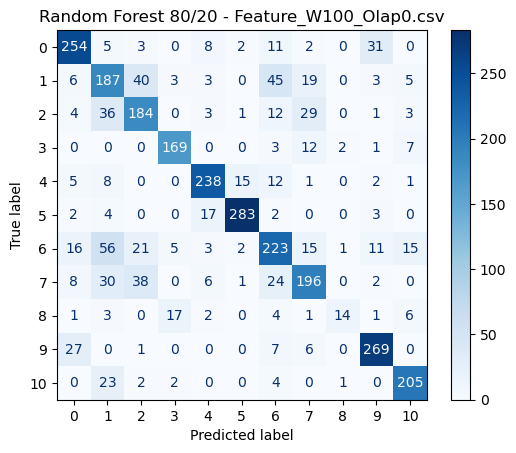

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.80      0.80      0.80       474
           1       0.56      0.62      0.59       466
           2       0.62      0.68      0.65       409
           3       0.87      0.88      0.88       291
           4       0.82      0.85      0.83       422
           5       0.91      0.88      0.90       467
           6       0.63      0.64      0.63       551
           7       0.72      0.59      0.64       458
           8       0.71      0.33      0.45        73
           9       0.83      0.86      0.85       466
          10       0.87      0.85      0.86       356

    accuracy                           0.75      4433
   macro avg       0.76      0.73      0.73      4433
weighted avg       0.75      0.75      0.75      4433

Accuracy: 74.98%
Precision: 75.28%
Recall: 74.98%
F1 Score: 74.91%
ROC AUC: 96.81%


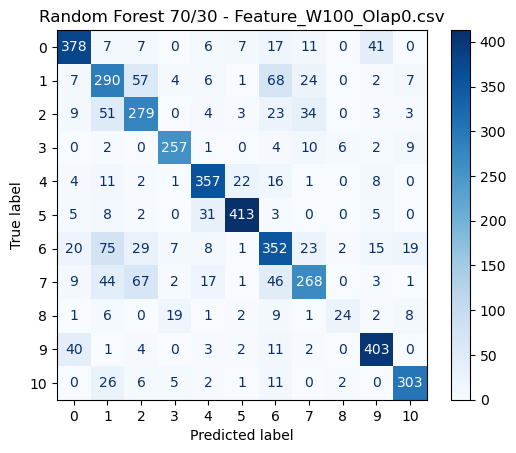

KFold Cross-Validation Scores (80/20 model): [0.75947226 0.75465313 0.7323181  0.75736041 0.74957699]
KFold Mean Accuracy (80/20 model): 75.07%
KFold Std Deviation (80/20 model): 0.0098

KFold Cross-Validation Scores (70/30 model): [0.75710419 0.7499154  0.73130288 0.757022   0.75093063]
KFold Mean Accuracy (70/30 model): 74.93%
KFold Std Deviation (70/30 model): 0.0095
Processing file 2/10: Feature_W100_Olap50.csv

 Random Forest on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W100_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.85      0.87      0.86       631
           1       0.59      0.66      0.62       621
           2       0.70      0.75      0.73       545
           3       0.92      0.90      0.91       387
           4       0.88      0.88      0.88       562
           5       0.94      0.93      0.94       621
           6       0.76      0.72      0.74   

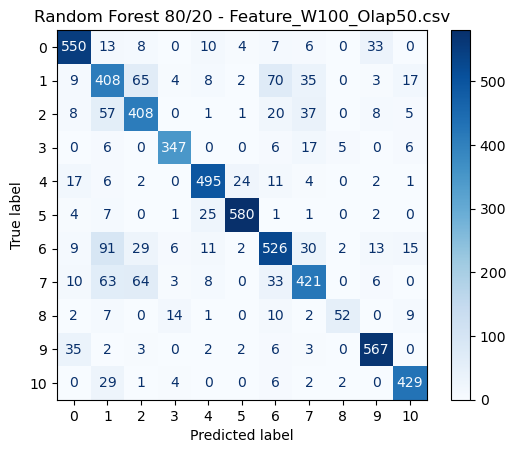

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.86      0.88      0.87       946
           1       0.59      0.65      0.62       932
           2       0.69      0.73      0.71       817
           3       0.90      0.88      0.89       580
           4       0.88      0.88      0.88       843
           5       0.94      0.93      0.93       932
           6       0.73      0.70      0.71      1102
           7       0.75      0.68      0.71       912
           8       0.77      0.49      0.60       146
           9       0.89      0.92      0.90       929
          10       0.89      0.90      0.89       710

    accuracy                           0.80      8849
   macro avg       0.81      0.79      0.79      8849
weighted avg       0.81      0.80      0.80      8849

Accuracy: 80.35%
Precision: 80.53%
Recall: 80.35%
F1 Score: 80.34%
ROC AUC: 97.99%


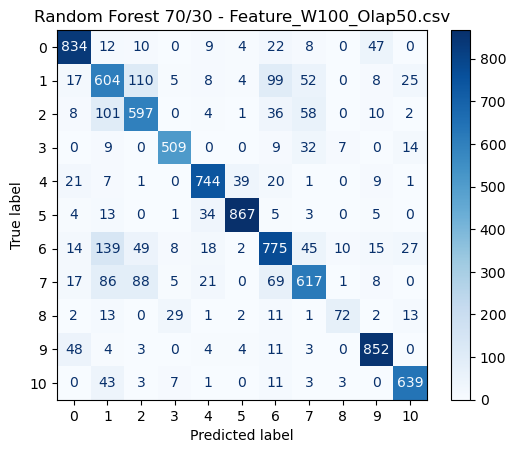

KFold Cross-Validation Scores (80/20 model): [0.81081539 0.81115443 0.80810307 0.8042041  0.81522292]
KFold Mean Accuracy (80/20 model): 80.99%
KFold Std Deviation (80/20 model): 0.0036

KFold Cross-Validation Scores (70/30 model): [0.81081539 0.81115443 0.80810307 0.8042041  0.81522292]
KFold Mean Accuracy (70/30 model): 80.99%
KFold Std Deviation (70/30 model): 0.0036
Processing file 3/10: Feature_W200_Olap0.csv

 Random Forest on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W200_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.79      0.79      0.79       157
           1       0.61      0.68      0.64       155
           2       0.59      0.62      0.60       136
           3       0.87      0.81      0.84        96
           4       0.78      0.84      0.81       140
           5       0.92      0.90      0.91       155
           6       0.75      0.69      0.72     

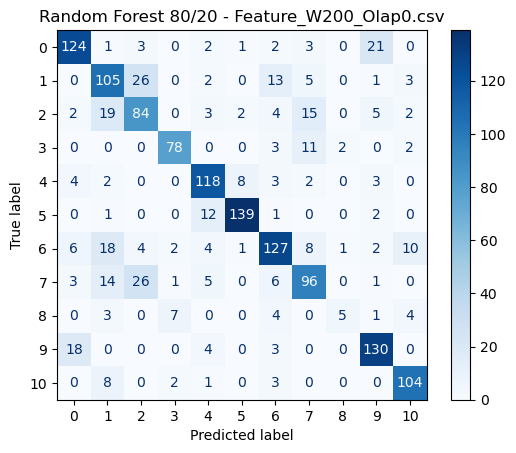

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.76      0.78      0.77       236
           1       0.58      0.64      0.61       232
           2       0.63      0.63      0.63       204
           3       0.88      0.85      0.87       145
           4       0.80      0.82      0.81       210
           5       0.88      0.92      0.90       232
           6       0.75      0.67      0.71       275
           7       0.65      0.66      0.66       228
           8       0.56      0.28      0.37        36
           9       0.81      0.83      0.82       232
          10       0.87      0.86      0.86       177

    accuracy                           0.75      2207
   macro avg       0.74      0.72      0.73      2207
weighted avg       0.75      0.75      0.75      2207

Accuracy: 75.22%
Precision: 75.23%
Recall: 75.22%
F1 Score: 75.09%
ROC AUC: 96.71%


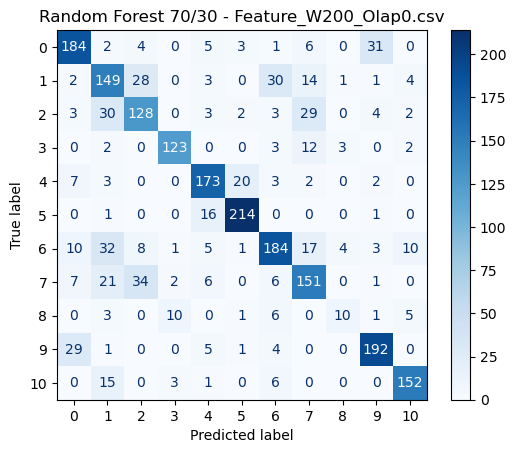

KFold Cross-Validation Scores (80/20 model): [0.77566281 0.75050986 0.760707   0.7743032  0.76938776]
KFold Mean Accuracy (80/20 model): 76.61%
KFold Std Deviation (80/20 model): 0.0094

KFold Cross-Validation Scores (70/30 model): [0.77974167 0.75662814 0.77226377 0.774983   0.76326531]
KFold Mean Accuracy (70/30 model): 76.94%
KFold Std Deviation (70/30 model): 0.0083
Processing file 4/10: Feature_W200_Olap50.csv

 Random Forest on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W200_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.85      0.89      0.87       313
           1       0.66      0.73      0.69       308
           2       0.75      0.76      0.75       271
           3       0.93      0.91      0.92       192
           4       0.88      0.89      0.88       279
           5       0.94      0.94      0.94       309
           6       0.77      0.76      0.77   

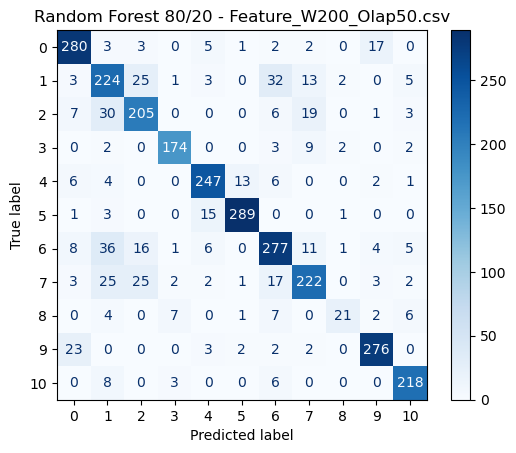

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.86      0.87      0.87       470
           1       0.66      0.72      0.69       463
           2       0.72      0.78      0.75       406
           3       0.92      0.92      0.92       287
           4       0.89      0.87      0.88       419
           5       0.91      0.93      0.92       463
           6       0.75      0.73      0.74       548
           7       0.80      0.71      0.75       453
           8       0.87      0.56      0.68        72
           9       0.88      0.90      0.89       462
          10       0.90      0.91      0.90       352

    accuracy                           0.82      4395
   macro avg       0.83      0.81      0.82      4395
weighted avg       0.82      0.82      0.82      4395

Accuracy: 82.21%
Precision: 82.39%
Recall: 82.21%
F1 Score: 82.18%
ROC AUC: 98.13%


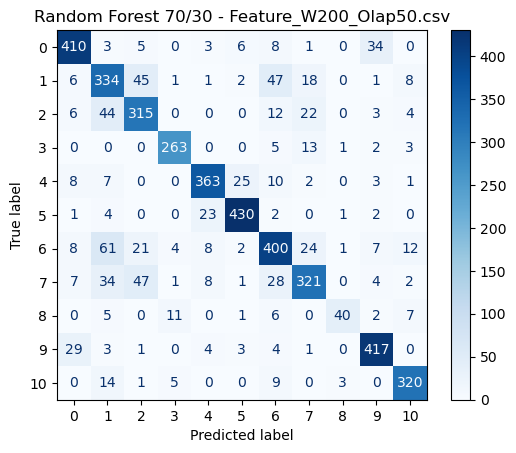

KFold Cross-Validation Scores (80/20 model): [0.83788396 0.82525597 0.81870946 0.82724479 0.82861045]
KFold Mean Accuracy (80/20 model): 82.75%
KFold Std Deviation (80/20 model): 0.0062

KFold Cross-Validation Scores (70/30 model): [0.83788396 0.82525597 0.81870946 0.82724479 0.82861045]
KFold Mean Accuracy (70/30 model): 82.75%
KFold Std Deviation (70/30 model): 0.0062
Processing file 5/10: Feature_W300_Olap0.csv

 Random Forest on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W300_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.78      0.85      0.81       105
           1       0.62      0.73      0.67       103
           2       0.68      0.74      0.71        90
           3       0.92      0.91      0.91        64
           4       0.84      0.86      0.85        93
           5       0.89      0.90      0.90       102
           6       0.80      0.75      0.77     

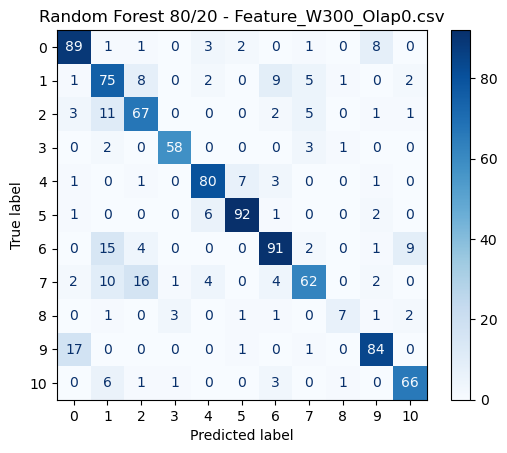

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.80      0.81      0.80       157
           1       0.63      0.73      0.68       154
           2       0.70      0.69      0.69       135
           3       0.92      0.89      0.90        96
           4       0.82      0.81      0.81       139
           5       0.86      0.92      0.89       154
           6       0.77      0.76      0.76       183
           7       0.74      0.59      0.65       151
           8       0.61      0.46      0.52        24
           9       0.84      0.86      0.85       155
          10       0.83      0.85      0.84       117

    accuracy                           0.78      1465
   macro avg       0.77      0.76      0.76      1465
weighted avg       0.78      0.78      0.78      1465

Accuracy: 78.09%
Precision: 78.13%
Recall: 78.09%
F1 Score: 77.94%
ROC AUC: 97.09%


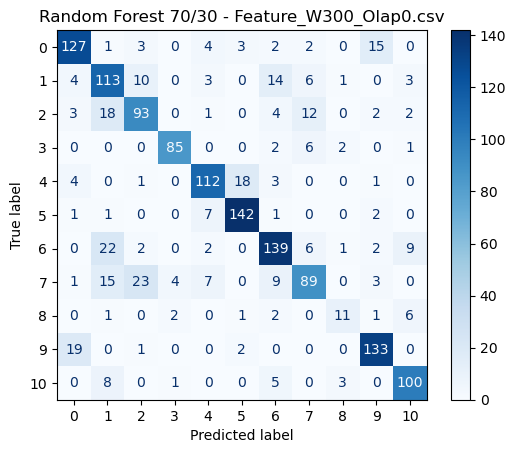

KFold Cross-Validation Scores (80/20 model): [0.79836233 0.78403275 0.75639713 0.7807377  0.78483607]
KFold Mean Accuracy (80/20 model): 78.09%
KFold Std Deviation (80/20 model): 0.0136

KFold Cross-Validation Scores (70/30 model): [0.80655067 0.78812692 0.76356192 0.77459016 0.78995902]
KFold Mean Accuracy (70/30 model): 78.46%
KFold Std Deviation (70/30 model): 0.0146
Processing file 6/10: Feature_W300_Olap50.csv

 Random Forest on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W300_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.86      0.92      0.89       208
           1       0.71      0.76      0.74       205
           2       0.80      0.75      0.77       179
           3       0.96      0.92      0.94       127
           4       0.89      0.87      0.88       185
           5       0.94      0.97      0.95       204
           6       0.81      0.80      0.80   

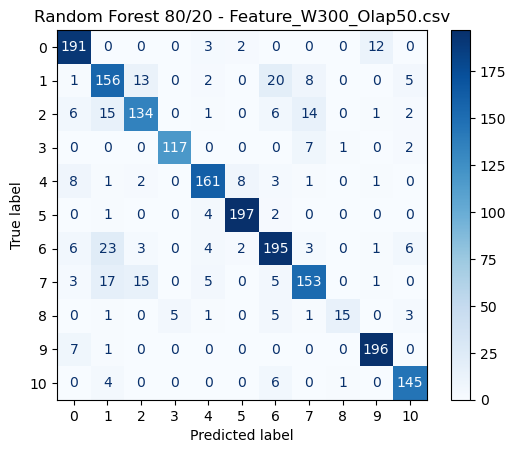

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.86      0.90      0.88       312
           1       0.70      0.80      0.74       307
           2       0.74      0.72      0.73       269
           3       0.92      0.92      0.92       190
           4       0.88      0.88      0.88       278
           5       0.94      0.95      0.94       307
           6       0.82      0.77      0.79       364
           7       0.81      0.75      0.78       299
           8       0.83      0.41      0.55        46
           9       0.91      0.94      0.92       307
          10       0.90      0.92      0.91       233

    accuracy                           0.84      2912
   macro avg       0.85      0.81      0.82      2912
weighted avg       0.84      0.84      0.84      2912

Accuracy: 84.24%
Precision: 84.34%
Recall: 84.24%
F1 Score: 84.11%
ROC AUC: 98.28%


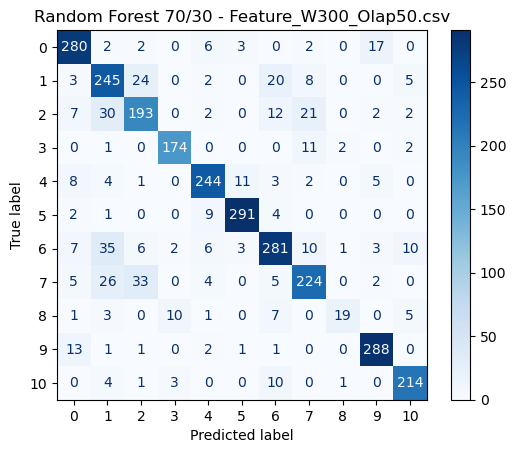

KFold Cross-Validation Scores (80/20 model): [0.86192684 0.8433797  0.84028851 0.85316847 0.8449253 ]
KFold Mean Accuracy (80/20 model): 84.87%
KFold Std Deviation (80/20 model): 0.0079

KFold Cross-Validation Scores (70/30 model): [0.85625966 0.83204534 0.83771252 0.84183411 0.8428645 ]
KFold Mean Accuracy (70/30 model): 84.21%
KFold Std Deviation (70/30 model): 0.0080
Processing file 7/10: Feature_W400_Olap0.csv

 Random Forest on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W400_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.75      0.79      0.77        78
           1       0.63      0.62      0.63        77
           2       0.65      0.69      0.67        67
           3       0.94      0.96      0.95        48
           4       0.76      0.80      0.78        69
           5       0.85      0.79      0.82        77
           6       0.79      0.81      0.80     

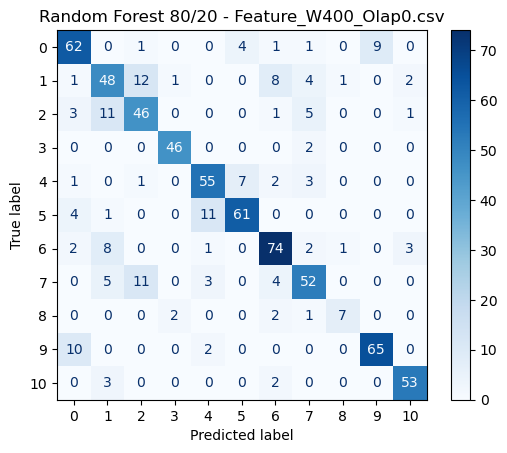

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.72      0.82      0.76       117
           1       0.64      0.68      0.66       115
           2       0.66      0.66      0.66       101
           3       0.92      0.96      0.94        72
           4       0.76      0.80      0.78       104
           5       0.85      0.81      0.83       115
           6       0.76      0.79      0.78       136
           7       0.77      0.68      0.72       113
           8       0.91      0.56      0.69        18
           9       0.87      0.78      0.83       115
          10       0.89      0.88      0.88        88

    accuracy                           0.78      1094
   macro avg       0.80      0.77      0.78      1094
weighted avg       0.78      0.78      0.78      1094

Accuracy: 77.51%
Precision: 77.92%
Recall: 77.51%
F1 Score: 77.53%
ROC AUC: 97.80%


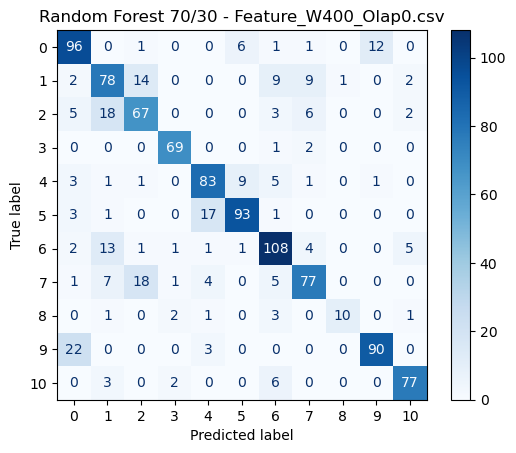

KFold Cross-Validation Scores (80/20 model): [0.78463649 0.77914952 0.78052126 0.7914952  0.78846154]
KFold Mean Accuracy (80/20 model): 78.49%
KFold Std Deviation (80/20 model): 0.0047

KFold Cross-Validation Scores (70/30 model): [0.78600823 0.78463649 0.78875171 0.79012346 0.78296703]
KFold Mean Accuracy (70/30 model): 78.65%
KFold Std Deviation (70/30 model): 0.0026
Processing file 8/10: Feature_W400_Olap50.csv

 Random Forest on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W400_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.89      0.90      0.89       155
           1       0.73      0.74      0.74       152
           2       0.80      0.81      0.81       134
           3       0.92      0.95      0.93        94
           4       0.89      0.91      0.90       138
           5       0.94      0.95      0.94       152
           6       0.81      0.87      0.84   

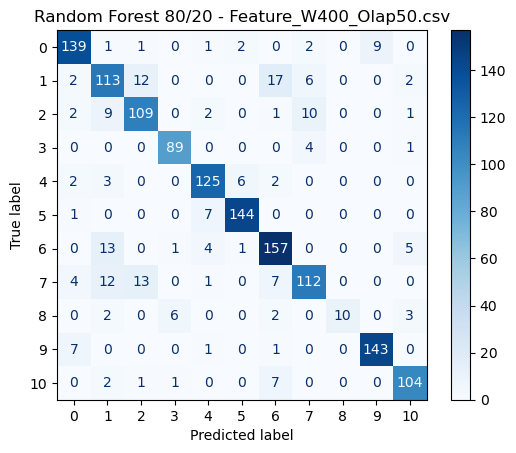

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.88      0.89      0.89       233
           1       0.72      0.79      0.75       228
           2       0.82      0.82      0.82       200
           3       0.93      0.96      0.94       141
           4       0.89      0.88      0.88       207
           5       0.92      0.95      0.94       229
           6       0.84      0.84      0.84       271
           7       0.85      0.70      0.77       223
           8       0.88      0.63      0.73        35
           9       0.91      0.93      0.92       228
          10       0.89      0.92      0.91       173

    accuracy                           0.86      2168
   macro avg       0.87      0.85      0.85      2168
weighted avg       0.86      0.86      0.86      2168

Accuracy: 86.02%
Precision: 86.12%
Recall: 86.02%
F1 Score: 85.94%
ROC AUC: 98.82%


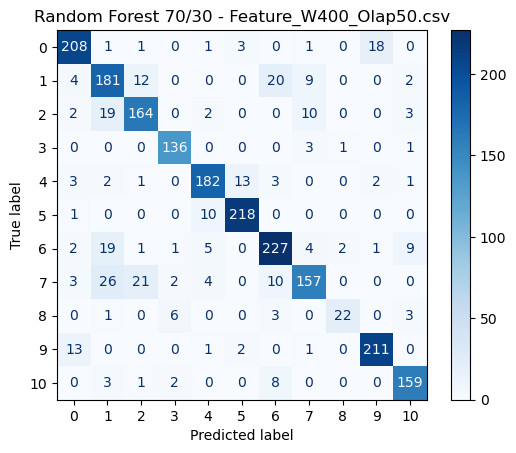

KFold Cross-Validation Scores (80/20 model): [0.8449827  0.8449827  0.85605536 0.86435986 0.85051903]
KFold Mean Accuracy (80/20 model): 85.22%
KFold Std Deviation (80/20 model): 0.0073

KFold Cross-Validation Scores (70/30 model): [0.85190311 0.84705882 0.86020761 0.85882353 0.86366782]
KFold Mean Accuracy (70/30 model): 85.63%
KFold Std Deviation (70/30 model): 0.0060
Processing file 9/10: Feature_W500_Olap0.csv

 Random Forest on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W500_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.83      0.85      0.84        62
           1       0.61      0.62      0.62        61
           2       0.65      0.76      0.70        54
           3       0.97      0.92      0.95        38
           4       0.83      0.70      0.76        56
           5       0.88      0.93      0.90        61
           6       0.76      0.81      0.78     

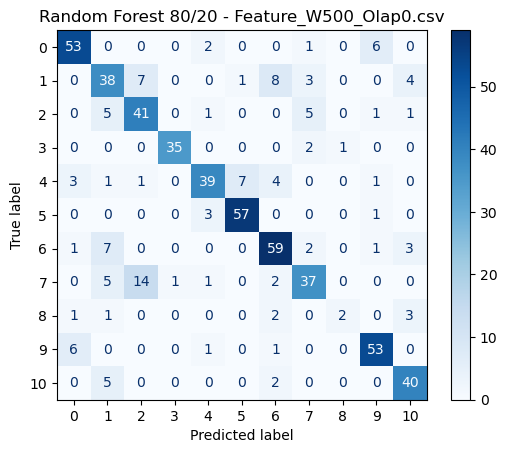

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.74      0.83      0.78        93
           1       0.63      0.59      0.61        92
           2       0.67      0.73      0.70        81
           3       0.94      0.89      0.92        56
           4       0.84      0.79      0.81        84
           5       0.89      0.88      0.89        92
           6       0.73      0.78      0.76       109
           7       0.69      0.64      0.67        90
           8       0.36      0.29      0.32        14
           9       0.83      0.78      0.80        92
          10       0.77      0.81      0.79        70

    accuracy                           0.76       873
   macro avg       0.74      0.73      0.73       873
weighted avg       0.76      0.76      0.76       873

Accuracy: 75.95%
Precision: 75.94%
Recall: 75.95%
F1 Score: 75.85%
ROC AUC: 97.23%


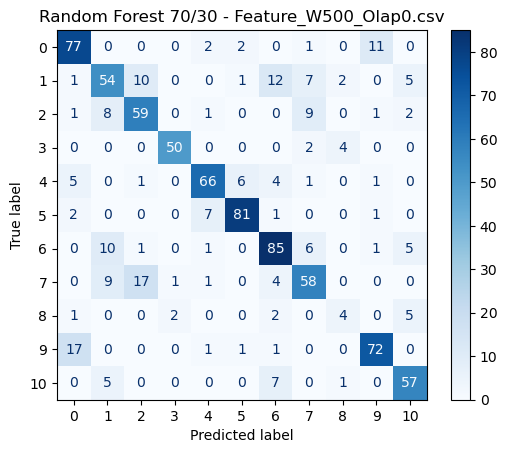

KFold Cross-Validation Scores (80/20 model): [0.77491409 0.81443299 0.77969019 0.78657487 0.79173838]
KFold Mean Accuracy (80/20 model): 78.95%
KFold Std Deviation (80/20 model): 0.0137

KFold Cross-Validation Scores (70/30 model): [0.77491409 0.80927835 0.76592083 0.79345955 0.78657487]
KFold Mean Accuracy (70/30 model): 78.60%
KFold Std Deviation (70/30 model): 0.0150
Processing file 10/10: Feature_W500_Olap50.csv

 Random Forest on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W500_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.89      0.94      0.91       124
           1       0.72      0.75      0.74       121
           2       0.77      0.78      0.78       106
           3       0.98      0.88      0.93        74
           4       0.85      0.92      0.88       110
           5       0.95      0.88      0.91       121
           6       0.82      0.89      0.85  

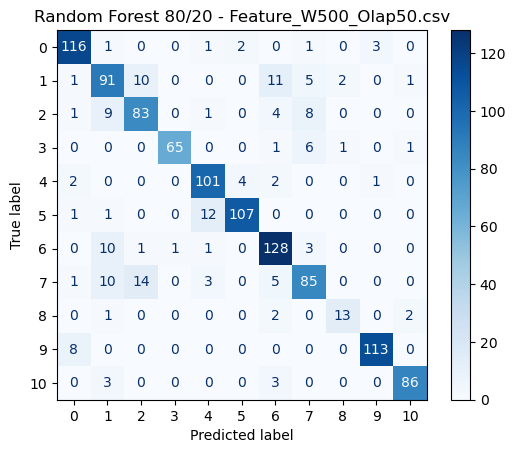

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.87      0.89      0.88       185
           1       0.74      0.74      0.74       182
           2       0.79      0.79      0.79       159
           3       0.96      0.89      0.93       111
           4       0.85      0.88      0.87       165
           5       0.93      0.91      0.92       182
           6       0.81      0.86      0.84       216
           7       0.80      0.75      0.78       177
           8       0.83      0.70      0.76        27
           9       0.92      0.92      0.92       182
          10       0.90      0.93      0.91       138

    accuracy                           0.85      1724
   macro avg       0.86      0.84      0.85      1724
weighted avg       0.85      0.85      0.85      1724

Accuracy: 85.21%
Precision: 85.26%
Recall: 85.21%
F1 Score: 85.19%
ROC AUC: 98.72%


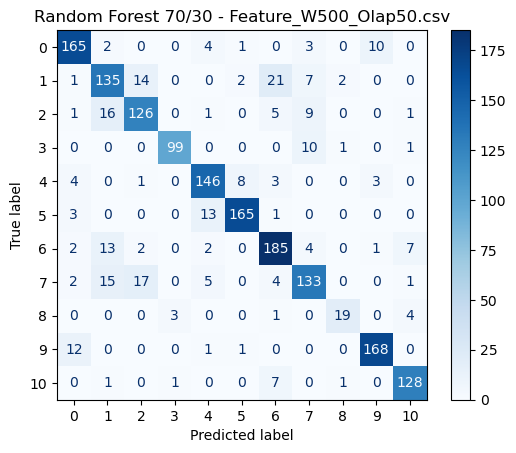

KFold Cross-Validation Scores (80/20 model): [0.87989556 0.85900783 0.85204526 0.85639687 0.87543554]
KFold Mean Accuracy (80/20 model): 86.46%
KFold Std Deviation (80/20 model): 0.0110

KFold Cross-Validation Scores (70/30 model): [0.87989556 0.85900783 0.85204526 0.85639687 0.87543554]
KFold Mean Accuracy (70/30 model): 86.46%
KFold Std Deviation (70/30 model): 0.0110


,Feature File,Model,Split,Accuracy,Precision,Recall,F1-Score,ROC_AUC,CV Mean Accuracy,CV Std Accuracy,Best Params
0,Feature_W100_Olap0.csv,Random Forest,80/20,0.751691,0.754231,0.751691,0.750538,0.968259,0.750676,0.009758,"{'n_estimators': 200, 'min_samples_split': 2, ..."
1,Feature_W100_Olap0.csv,Random Forest,70/30,0.749831,0.752802,0.749831,0.749063,0.968143,0.749255,0.009460,"{'n_estimators': 200, 'min_samples_split': 5, ..."
2,Feature_W100_Olap50.csv,Random Forest,80/20,0.810815,0.813269,0.810815,0.810969,0.981704,0.809900,0.003645,"{'n_estimators': 100, 'min_samples_split': 2, ..."
3,Feature_W100_Olap50.csv,Random Forest,70/30,0.803481,0.805255,0.803481,0.803381,0.979866,0.809900,0.003645,"{'n_estimators': 100, 'min_samples_split': 2, ..."
4,Feature_W200_Olap0.csv,Random Forest,80/20,0.754589,0.755038,0.754589,0.752316,0.970066,0.766114,0.009399,"{'n_estimators': 200, 'min_samples_split': 5, ..."
5,Feature_W200_Olap0.csv,Random Forest,70/30,0.752152,0.752275,0.752152,0.750877,0.967085,0.769376,0.008332,"{'n_estimators': 100, 'min_samples_split': 2, ..."
6,Feature_W200_Olap50.csv,Random Forest,80/20,0.830375,0.831466,0.830375,0.829727,0.980604,0.827541,0.006187,"{'n_estimators': 100, 'min_samples_split': 2, ..."
7,Feature_W200_Olap50.csv,Random Forest,70/30,0.822071,0.823926,0.822071,0.821847,0.981313,0.827541,0.006187,"{'n_estimators': 100, 'min_samples_split': 2, ..."
8,Feature_W300_Olap0.csv,Random Forest,80/20,0.789150,0.792643,0.789150,0.788439,0.970374,0.780873,0.013643,"{'n_estimators': 200, 'min_samples_split': 5, ..."
9,Feature_W300_Olap0.csv,Random Forest,70/30,0.780887,0.781254,0.780887,0.779446,0.970898,0.784558,0.014600,"{'n_estimators': 200, 'min_samples_split': 2, ..."


In [ ]:
rf_params = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'bootstrap': [True, False]
}

rf_results = []

# for file_path in fileList:
for i, file_path in enumerate(fileList):
    print(f"Processing file {i+1}/{len(fileList)}: {os.path.basename(file_path)}")
    print(f"\n Random Forest on {file_path}...")

    df = pd.read_csv(file_path)
    X = df.drop(columns=['exp_Name'])
    y = df['exp_Name']
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)

    # Apply StandardScaler (for consistency even if RF is scale-invariant)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # 80/20 Split
    X_train_80, X_test_20, y_train_80, y_test_20 = train_test_split(
        X_scaled, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
    )

    rf_80 = RandomForestClassifier(random_state=42)
    rf_search_80 = RandomizedSearchCV(
        rf_80, param_distributions=rf_params, n_iter=10, cv=5, 
        random_state=42, verbose=2, n_jobs=-1
    )
    rf_search_80.fit(X_train_80, y_train_80)
    best_rf_80 = rf_search_80.best_estimator_

    acc80, prec80, rec80, f180, roc_auc80 = evaluate_model(best_rf_80, X_test_20, y_test_20)
    plot_confusion(best_rf_80, X_test_20, y_test_20, title=f"Random Forest 80/20 - {os.path.basename(file_path)}")

    # 70/30 Split
    X_train_70, X_test_30, y_train_70, y_test_30 = train_test_split(
        X_scaled, y_encoded, test_size=0.3, random_state=42, stratify=y_encoded
    )

    rf_70 = RandomForestClassifier(random_state=42)
    rf_search_70 = RandomizedSearchCV(
        rf_70, param_distributions=rf_params, n_iter=10, cv=5, 
        random_state=42, verbose=2, n_jobs=-1
    )
    rf_search_70.fit(X_train_70, y_train_70)
    best_rf_70 = rf_search_70.best_estimator_

    acc70, prec70, rec70, f170, roc_auc70 = evaluate_model(best_rf_70, X_test_30, y_test_30)
    plot_confusion(best_rf_70, X_test_30, y_test_30, title=f"Random Forest 70/30 - {os.path.basename(file_path)}")

    # KFold Cross-validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    # For 80/20
    kf_scores_80 = cross_val_score(best_rf_80, X_scaled, y_encoded, cv=kf, scoring='accuracy', n_jobs=-1)
    print("KFold Cross-Validation Scores (80/20 model):", kf_scores_80)
    print("KFold Mean Accuracy (80/20 model): {:.2f}%".format(kf_scores_80.mean() * 100))
    print("KFold Std Deviation (80/20 model): {:.4f}".format(kf_scores_80.std()))

    # For 70/30
    kf_scores_70 = cross_val_score(best_rf_70, X_scaled, y_encoded, cv=kf, scoring='accuracy', n_jobs=-1)
    print("\nKFold Cross-Validation Scores (70/30 model):", kf_scores_70)
    print("KFold Mean Accuracy (70/30 model): {:.2f}%".format(kf_scores_70.mean() * 100))
    print("KFold Std Deviation (70/30 model): {:.4f}".format(kf_scores_70.std()))

    # Save both splits' results including CV Mean, CV Std, Best Params
    rf_results.append([
        os.path.basename(file_path), "Random Forest", "80/20", acc80, prec80, rec80, f180, roc_auc80,
        kf_scores_80.mean(), kf_scores_80.std(), rf_search_80.best_params_
    ])
    rf_results.append([
        os.path.basename(file_path), "Random Forest", "70/30", acc70, prec70, rec70, f170, roc_auc70,
        kf_scores_70.mean(), kf_scores_70.std(), rf_search_70.best_params_
    ])

# Create final dataframe
rf_results_df = pd.DataFrame(
    rf_results, 
    columns=[
        "Feature File", "Model", "Split", "Accuracy", "Precision", "Recall", "F1-Score", "ROC_AUC",
        "CV Mean Accuracy", "CV Std Accuracy", "Best Params"
    ]
)

# Save results to CSV
rf_results_df.to_csv('results_random_forest.csv', index=False)

# Display
rf_results_df

### Gaussian Naive Bayes (K-Fold)

Processing file 1/10: Feature_W100_Olap0.csv

Gaussian Naive Bayes on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W100_Olap0.csv...
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; tota

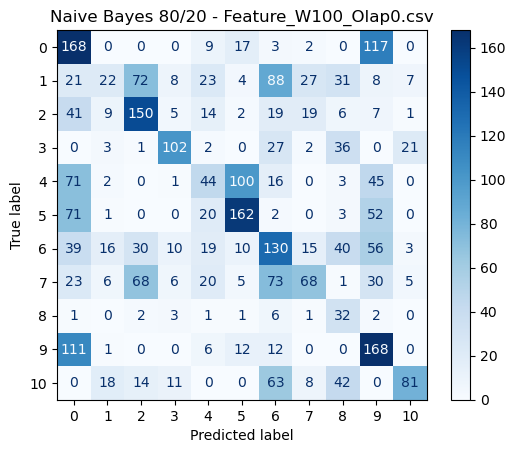

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-07; total time=   0.0s
[CV] END ................................var_smoo

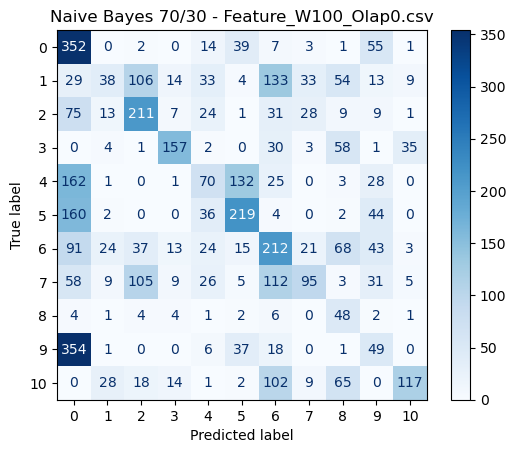

KFold Cross-Validation Scores (80/20 model): [0.35622463 0.35871404 0.36751269 0.37021997 0.37394247]
KFold Mean Accuracy (80/20 model): 36.53%
KFold Std Deviation (80/20 model): 0.0068

KFold Cross-Validation Scores (70/30 model): [0.35622463 0.35871404 0.36751269 0.37021997 0.37394247]
KFold Mean Accuracy (70/30 model): 36.53%
KFold Std Deviation (70/30 model): 0.0068
Processing file 2/10: Feature_W100_Olap50.csv

Gaussian Naive Bayes on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W100_Olap50.csv...
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ......

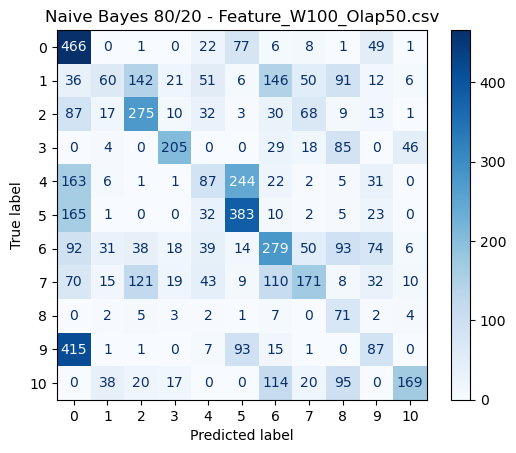

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-07; total time=   0.0s
[CV] END ................................var_smoo

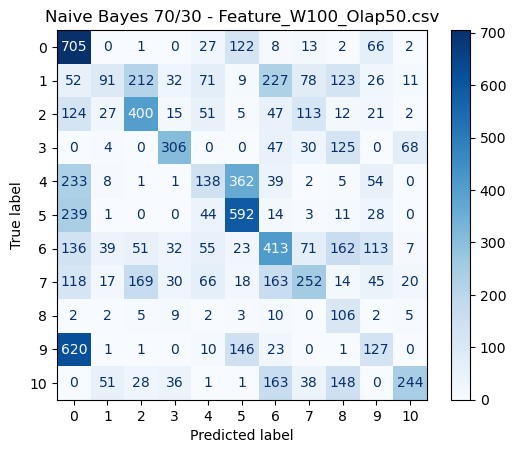

KFold Cross-Validation Scores (80/20 model): [0.37040176 0.3707408  0.37260553 0.36277335 0.39362604]
KFold Mean Accuracy (80/20 model): 37.40%
KFold Std Deviation (80/20 model): 0.0104

KFold Cross-Validation Scores (70/30 model): [0.37040176 0.3707408  0.37260553 0.36277335 0.39362604]
KFold Mean Accuracy (70/30 model): 37.40%
KFold Std Deviation (70/30 model): 0.0104
Processing file 3/10: Feature_W200_Olap0.csv

Gaussian Naive Bayes on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W200_Olap0.csv...
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ........

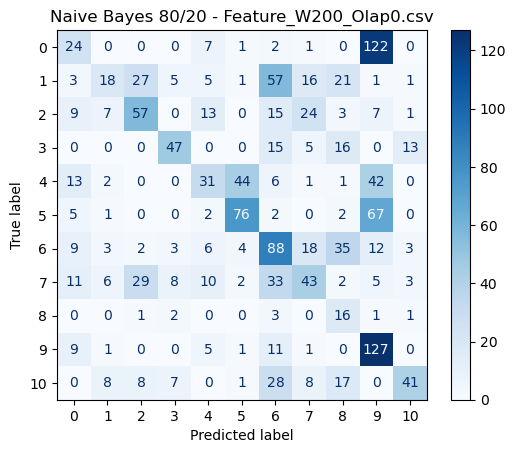

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-07; total time=   0.0s
[CV] END ................................var_smoo

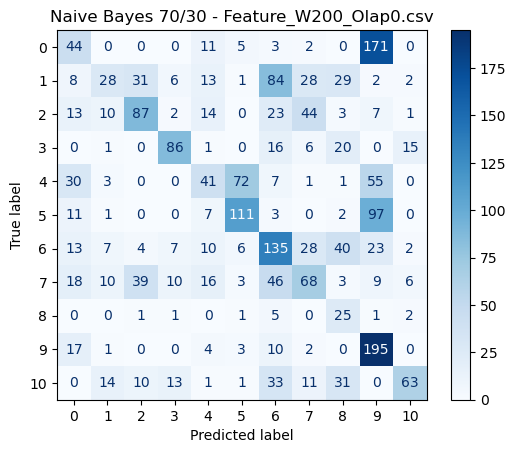

KFold Cross-Validation Scores (80/20 model): [0.40244731 0.39700884 0.37865398 0.39360979 0.39863946]
KFold Mean Accuracy (80/20 model): 39.41%
KFold Std Deviation (80/20 model): 0.0082

KFold Cross-Validation Scores (70/30 model): [0.40244731 0.39700884 0.37865398 0.39360979 0.39863946]
KFold Mean Accuracy (70/30 model): 39.41%
KFold Std Deviation (70/30 model): 0.0082
Processing file 4/10: Feature_W200_Olap50.csv

Gaussian Naive Bayes on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W200_Olap50.csv...
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ......

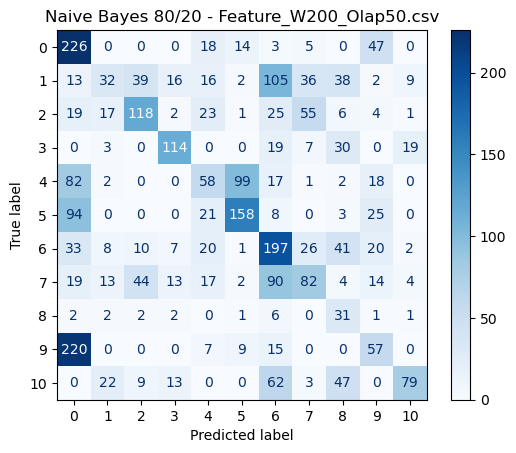

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-07; total time=   0.0s
[CV] END ................................var_smoo

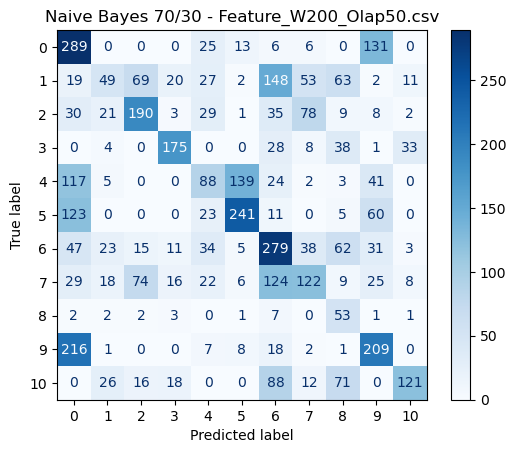

KFold Cross-Validation Scores (80/20 model): [0.39863481 0.4116041  0.39057699 0.39945374 0.39706384]
KFold Mean Accuracy (80/20 model): 39.95%
KFold Std Deviation (80/20 model): 0.0068

KFold Cross-Validation Scores (70/30 model): [0.39863481 0.4116041  0.39057699 0.39945374 0.39706384]
KFold Mean Accuracy (70/30 model): 39.95%
KFold Std Deviation (70/30 model): 0.0068
Processing file 5/10: Feature_W300_Olap0.csv

Gaussian Naive Bayes on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W300_Olap0.csv...
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ........

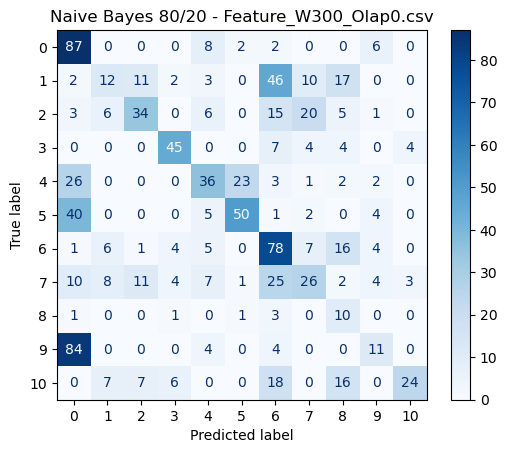

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-07; total time=   0.0s
[CV] END ................................var_smoo

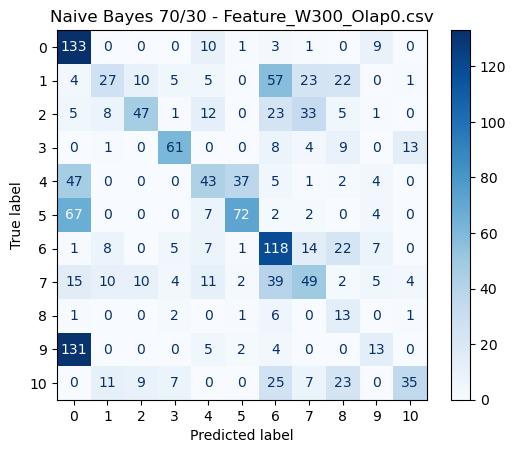

KFold Cross-Validation Scores (80/20 model): [0.4247697  0.40532242 0.42272262 0.42110656 0.41393443]
KFold Mean Accuracy (80/20 model): 41.76%
KFold Std Deviation (80/20 model): 0.0071

KFold Cross-Validation Scores (70/30 model): [0.4247697  0.40532242 0.42272262 0.42110656 0.41393443]
KFold Mean Accuracy (70/30 model): 41.76%
KFold Std Deviation (70/30 model): 0.0071
Processing file 6/10: Feature_W300_Olap50.csv

Gaussian Naive Bayes on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W300_Olap50.csv...
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ......

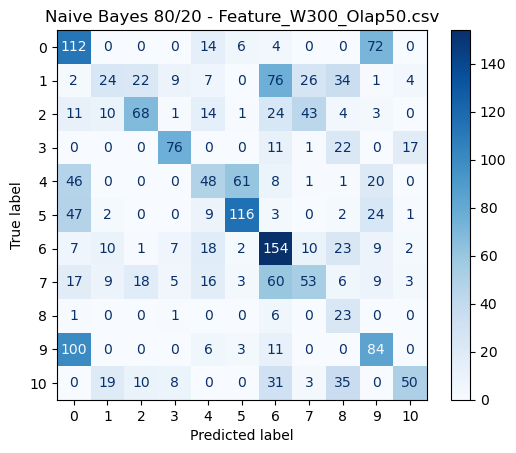

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-07; total time=   0.0s
[CV] END ................................var_smoo

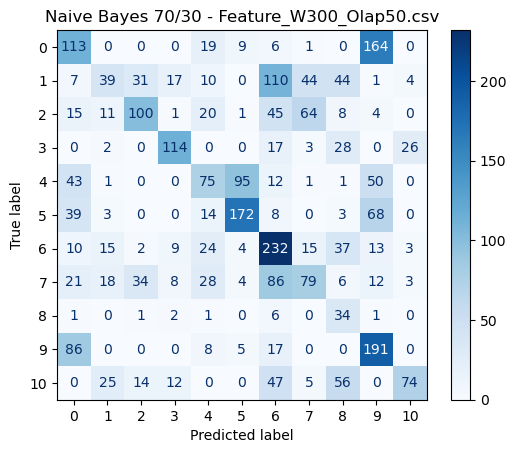

KFold Cross-Validation Scores (80/20 model): [0.41473467 0.42091705 0.42143225 0.40906749 0.41267388]
KFold Mean Accuracy (80/20 model): 41.58%
KFold Std Deviation (80/20 model): 0.0048

KFold Cross-Validation Scores (70/30 model): [0.41473467 0.42091705 0.42143225 0.40906749 0.41267388]
KFold Mean Accuracy (70/30 model): 41.58%
KFold Std Deviation (70/30 model): 0.0048
Processing file 7/10: Feature_W400_Olap0.csv

Gaussian Naive Bayes on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W400_Olap0.csv...
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ........

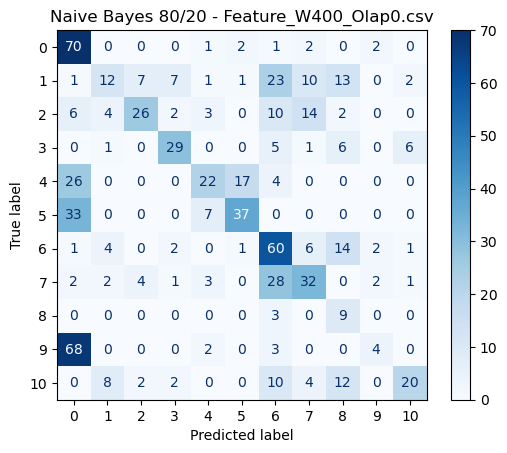

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-07; total time=   0.0s
[CV] END ................................var_smoo

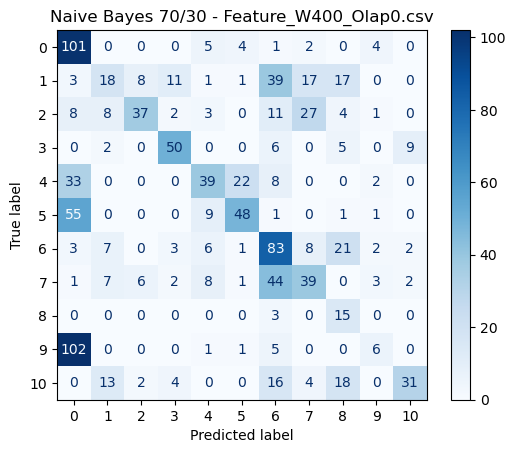

KFold Cross-Validation Scores (80/20 model): [0.42524005 0.43347051 0.40466392 0.44032922 0.41895604]
KFold Mean Accuracy (80/20 model): 42.45%
KFold Std Deviation (80/20 model): 0.0123

KFold Cross-Validation Scores (70/30 model): [0.42524005 0.43347051 0.40466392 0.44032922 0.41895604]
KFold Mean Accuracy (70/30 model): 42.45%
KFold Std Deviation (70/30 model): 0.0123
Processing file 8/10: Feature_W400_Olap50.csv

Gaussian Naive Bayes on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W400_Olap50.csv...
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ......

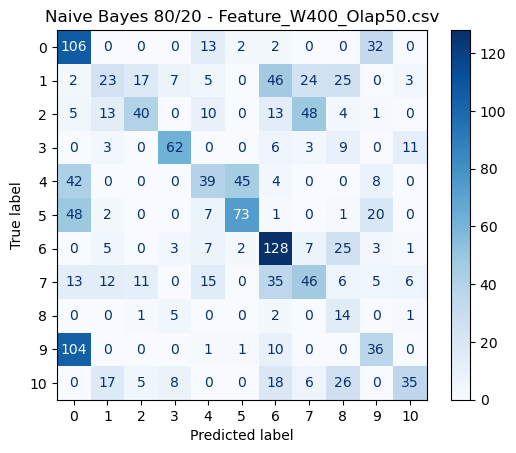

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-07; total time=   0.0s
[CV] END ................................var_smoo

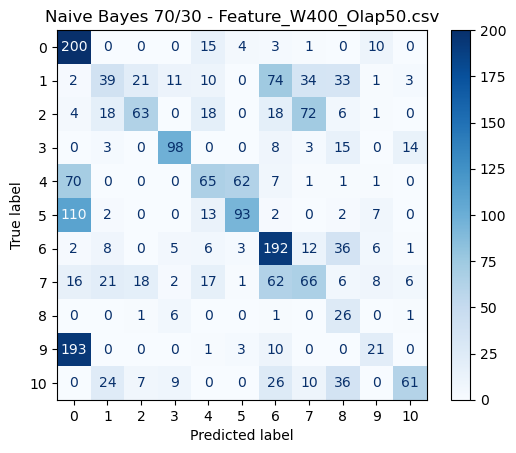

KFold Cross-Validation Scores (80/20 model): [0.44290657 0.43460208 0.4200692  0.43460208 0.42975779]
KFold Mean Accuracy (80/20 model): 43.24%
KFold Std Deviation (80/20 model): 0.0075

KFold Cross-Validation Scores (70/30 model): [0.44290657 0.43460208 0.4200692  0.43529412 0.42975779]
KFold Mean Accuracy (70/30 model): 43.25%
KFold Std Deviation (70/30 model): 0.0075
Processing file 9/10: Feature_W500_Olap0.csv

Gaussian Naive Bayes on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W500_Olap0.csv...
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ........

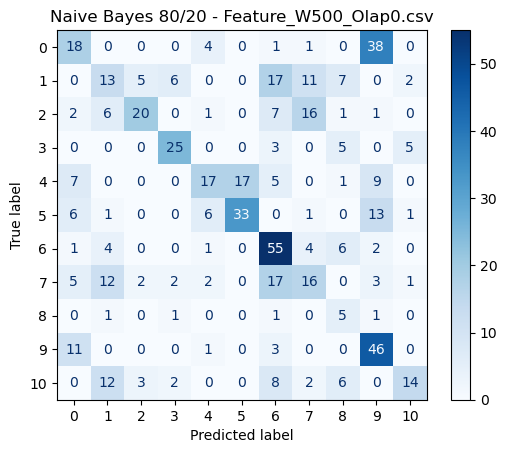

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-07; total time=   0.0s
[CV] END ................................var_smoo

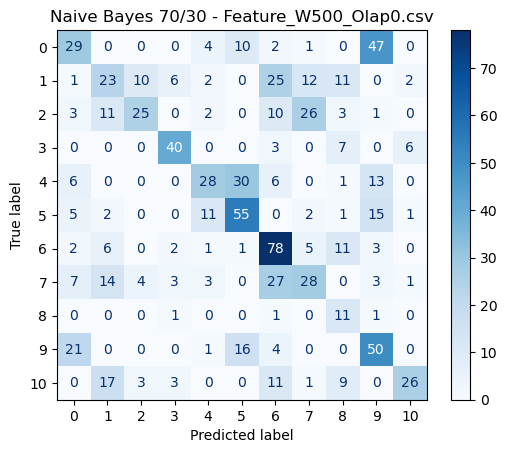

KFold Cross-Validation Scores (80/20 model): [0.43986254 0.46391753 0.40447504 0.45611015 0.43373494]
KFold Mean Accuracy (80/20 model): 43.96%
KFold Std Deviation (80/20 model): 0.0207

KFold Cross-Validation Scores (70/30 model): [0.43986254 0.46391753 0.40447504 0.45611015 0.43373494]
KFold Mean Accuracy (70/30 model): 43.96%
KFold Std Deviation (70/30 model): 0.0207
Processing file 10/10: Feature_W500_Olap50.csv

Gaussian Naive Bayes on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W500_Olap50.csv...
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END .....

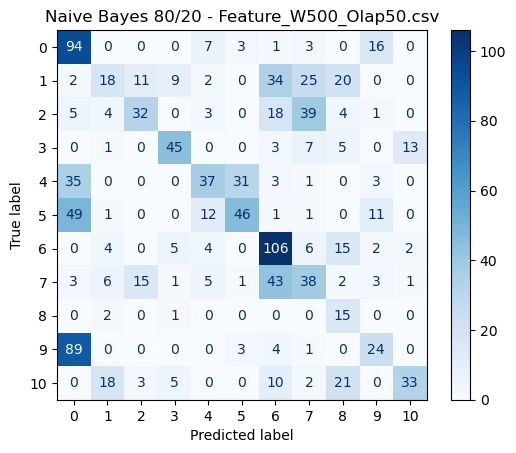

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-09; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-08; total time=   0.0s
[CV] END ................................var_smoothing=1e-07; total time=   0.0s
[CV] END ................................var_smoo

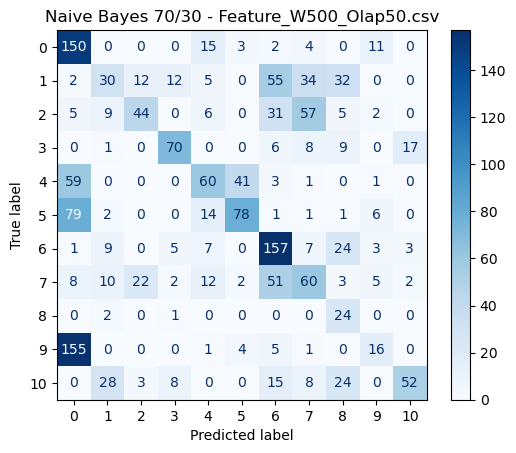

KFold Cross-Validation Scores (80/20 model): [0.44560487 0.44560487 0.44125326 0.44821584 0.46602787]
KFold Mean Accuracy (80/20 model): 44.93%
KFold Std Deviation (80/20 model): 0.0086

KFold Cross-Validation Scores (70/30 model): [0.44560487 0.44560487 0.44125326 0.44821584 0.46602787]
KFold Mean Accuracy (70/30 model): 44.93%
KFold Std Deviation (70/30 model): 0.0086


,Feature File,Model,Split,Accuracy,Precision,Recall,F1-Score,ROC_AUC,CV Mean Accuracy,CV Std Accuracy,Best Params
0,Feature_W100_Olap0.csv,GaussianNB,80/20,0.381258,0.410918,0.381258,0.368853,0.858903,0.365323,0.006775,{'var_smoothing': 1e-07}
1,Feature_W100_Olap0.csv,GaussianNB,70/30,0.353711,0.394058,0.353711,0.337246,0.858740,0.365323,0.006775,{'var_smoothing': 1e-07}
2,Feature_W100_Olap50.csv,GaussianNB,80/20,0.381929,0.409147,0.381929,0.363943,0.864755,0.374029,0.010361,{'var_smoothing': 1e-09}
3,Feature_W100_Olap50.csv,GaussianNB,70/30,0.381286,0.409097,0.381286,0.362204,0.864202,0.374029,0.010361,{'var_smoothing': 1e-09}
4,Feature_W200_Olap0.csv,GaussianNB,80/20,0.386132,0.425589,0.386132,0.372681,0.873061,0.394072,0.008217,{'var_smoothing': 1e-09}
5,Feature_W200_Olap0.csv,GaussianNB,70/30,0.400091,0.430128,0.400091,0.385308,0.874657,0.394072,0.008217,{'var_smoothing': 1e-09}
6,Feature_W200_Olap50.csv,GaussianNB,80/20,0.393174,0.424372,0.393174,0.380639,0.873985,0.399467,0.006824,{'var_smoothing': 1e-07}
7,Feature_W200_Olap50.csv,GaussianNB,70/30,0.413197,0.442965,0.413197,0.405556,0.876658,0.399467,0.006824,{'var_smoothing': 1e-07}
8,Feature_W300_Olap0.csv,GaussianNB,80/20,0.422723,0.466773,0.422723,0.404358,0.884153,0.417571,0.007129,{'var_smoothing': 1e-09}
9,Feature_W300_Olap0.csv,GaussianNB,70/30,0.417065,0.463446,0.417065,0.400004,0.882939,0.417571,0.007129,{'var_smoothing': 1e-09}


In [ ]:
nb_params = {
    'var_smoothing': [1e-9, 1e-8, 1e-7]
}

nb_results = []

for i, file_path in enumerate(fileList):
    print(f"Processing file {i+1}/{len(fileList)}: {os.path.basename(file_path)}")
    print(f"\nGaussian Naive Bayes on {file_path}...")

    df = pd.read_csv(file_path)
    X = df.drop(columns=['exp_Name'])
    y = df['exp_Name']
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)
    
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # 80/20 Split
    X_train_80, X_test_20, y_train_80, y_test_20 = train_test_split(
        X_scaled, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
    )
    nb_80 = GaussianNB()
    nb_search_80 = RandomizedSearchCV(
        nb_80, param_distributions=nb_params, n_iter=10, cv=5, random_state=42, verbose=2, n_jobs=-1
    )
    nb_search_80.fit(X_train_80, y_train_80)
    best_nb_80 = nb_search_80.best_estimator_

    acc80, prec80, rec80, f180, roc_auc80 = evaluate_model(best_nb_80, X_test_20, y_test_20)
    plot_confusion(best_nb_80, X_test_20, y_test_20, title=f"Naive Bayes 80/20 - {os.path.basename(file_path)}")

    # 70/30 Split
    X_train_70, X_test_30, y_train_70, y_test_30 = train_test_split(
        X_scaled, y_encoded, test_size=0.3, random_state=42, stratify=y_encoded
    )
    nb_70 = GaussianNB()
    nb_search_70 = RandomizedSearchCV(
        nb_70, param_distributions=nb_params, n_iter=10, cv=5, random_state=42, verbose=2, n_jobs=-1
    )
    nb_search_70.fit(X_train_70, y_train_70)
    best_nb_70 = nb_search_70.best_estimator_

    acc70, prec70, rec70, f170, roc_auc70 = evaluate_model(best_nb_70, X_test_30, y_test_30)
    plot_confusion(best_nb_70, X_test_30, y_test_30, title=f"Naive Bayes 70/30 - {os.path.basename(file_path)}")

    # KFold Cross-validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    kf_scores_80 = cross_val_score(best_nb_80, X_scaled, y_encoded, cv=kf, scoring='accuracy', n_jobs=-1)
    print("KFold Cross-Validation Scores (80/20 model):", kf_scores_80)
    print("KFold Mean Accuracy (80/20 model): {:.2f}%".format(kf_scores_80.mean() * 100))
    print("KFold Std Deviation (80/20 model): {:.4f}".format(kf_scores_80.std()))

    kf_scores_70 = cross_val_score(best_nb_70, X_scaled, y_encoded, cv=kf, scoring='accuracy', n_jobs=-1)
    print("\nKFold Cross-Validation Scores (70/30 model):", kf_scores_70)
    print("KFold Mean Accuracy (70/30 model): {:.2f}%".format(kf_scores_70.mean() * 100))
    print("KFold Std Deviation (70/30 model): {:.4f}".format(kf_scores_70.std()))

    # Append results
    nb_results.append([
        os.path.basename(file_path), "GaussianNB", "80/20", acc80, prec80, rec80, f180, roc_auc80,
        kf_scores_80.mean(), kf_scores_80.std(), nb_search_80.best_params_
    ])
    nb_results.append([
        os.path.basename(file_path), "GaussianNB", "70/30", acc70, prec70, rec70, f170, roc_auc70,
        kf_scores_70.mean(), kf_scores_70.std(), nb_search_70.best_params_
    ])

# Final DataFrame and CSV
nb_results_df = pd.DataFrame(
    nb_results,
    columns=[
        "Feature File", "Model", "Split", "Accuracy", "Precision", "Recall", "F1-Score", "ROC_AUC",
        "CV Mean Accuracy", "CV Std Accuracy", "Best Params"
    ]
)

nb_results_df.to_csv('results_gaussian_nb.csv', index=False)
nb_results_df

### Support Vector Machine (K-Fold)

Processing file 1/10: Feature_W100_Olap0.csv

 SVM on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W100_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.62      0.75      0.68       316
           1       0.48      0.55      0.51       311
           2       0.60      0.60      0.60       273
           3       0.79      0.81      0.80       194
           4       0.79      0.80      0.80       282
           5       0.87      0.89      0.88       311
           6       0.66      0.53      0.59       368
           7       0.65      0.56      0.60       305
           8       0.41      0.37      0.39        49
           9       0.74      0.71      0.72       310
          10       0.78      0.78      0.78       237

    accuracy                           0.68      2956
   macro avg       0.67      0.67      0.67      2956
weighted avg       0.69      0.68      0.68      295

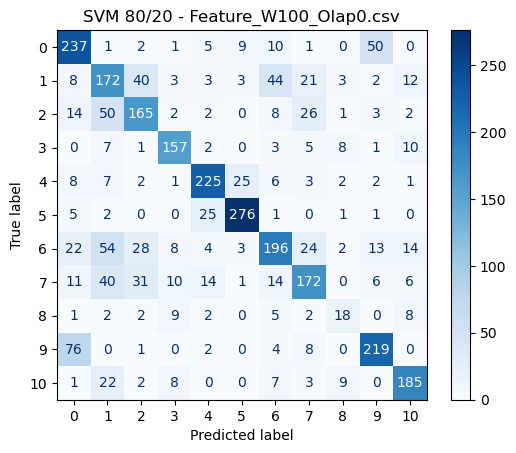

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.64      0.74      0.68       474
           1       0.47      0.54      0.50       466
           2       0.57      0.60      0.58       409
           3       0.74      0.81      0.77       291
           4       0.77      0.78      0.77       422
           5       0.85      0.88      0.87       467
           6       0.66      0.55      0.60       551
           7       0.66      0.54      0.59       458
           8       0.37      0.30      0.33        73
           9       0.75      0.71      0.73       466
          10       0.78      0.77      0.77       356

    accuracy                           0.68      4433
   macro avg       0.66      0.66      0.66      4433
weighted avg       0.68      0.68      0.68      4433

Accuracy: 67.70%
Precision: 67.89%
Recall: 67.70%
F1 Score: 67.59%
ROC AUC: 94.02%


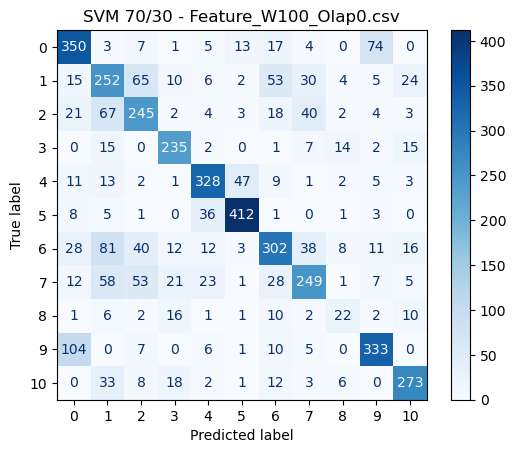

KFold Cross-Validation Scores (80/20 model): [0.68707713 0.70186125 0.67884941 0.69915398 0.69204738]
KFold Mean Accuracy (80/20 model): 69.18%
KFold Std Deviation (80/20 model): 0.0083

KFold Cross-Validation Scores (70/30 model): [0.68707713 0.70186125 0.67884941 0.69915398 0.69204738]
KFold Mean Accuracy (70/30 model): 69.18%
KFold Std Deviation (70/30 model): 0.0083
Processing file 2/10: Feature_W100_Olap50.csv

 SVM on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W100_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.75      0.82      0.79       631
           1       0.49      0.60      0.54       621
           2       0.65      0.66      0.65       545
           3       0.78      0.85      0.81       387
           4       0.84      0.82      0.83       562
           5       0.90      0.89      0.90       621
           6       0.64      0.57      0.61       734
  

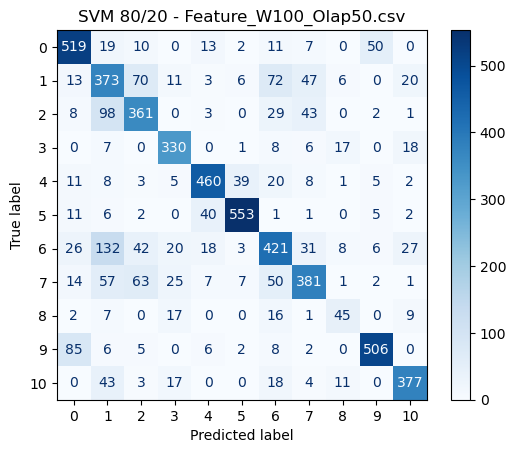

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.75      0.82      0.78       946
           1       0.51      0.62      0.56       932
           2       0.65      0.63      0.64       817
           3       0.74      0.85      0.80       580
           4       0.83      0.82      0.83       843
           5       0.91      0.89      0.90       932
           6       0.66      0.58      0.61      1102
           7       0.69      0.60      0.64       912
           8       0.51      0.51      0.51       146
           9       0.86      0.82      0.84       929
          10       0.83      0.78      0.81       710

    accuracy                           0.73      8849
   macro avg       0.72      0.72      0.72      8849
weighted avg       0.73      0.73      0.73      8849

Accuracy: 73.01%
Precision: 73.48%
Recall: 73.01%
F1 Score: 73.07%
ROC AUC: 94.71%


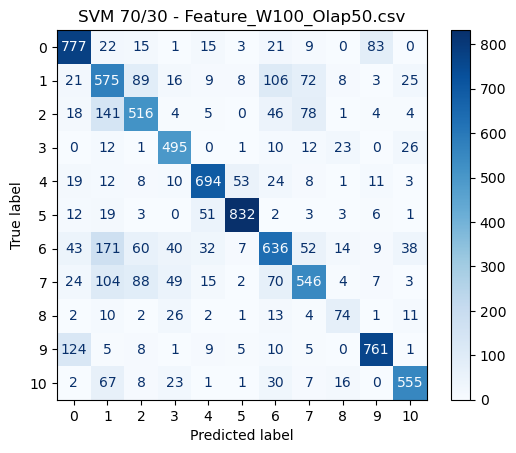

KFold Cross-Validation Scores (80/20 model): [0.74080353 0.7355484  0.73859976 0.7263943  0.74538057]
KFold Mean Accuracy (80/20 model): 73.73%
KFold Std Deviation (80/20 model): 0.0063

KFold Cross-Validation Scores (70/30 model): [0.74080353 0.7355484  0.73859976 0.7263943  0.74538057]
KFold Mean Accuracy (70/30 model): 73.73%
KFold Std Deviation (70/30 model): 0.0063
Processing file 3/10: Feature_W200_Olap0.csv

 SVM on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W200_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.63      0.75      0.69       157
           1       0.48      0.57      0.52       155
           2       0.58      0.54      0.56       136
           3       0.78      0.73      0.75        96
           4       0.78      0.79      0.79       140
           5       0.85      0.87      0.86       155
           6       0.69      0.56      0.62       183
    

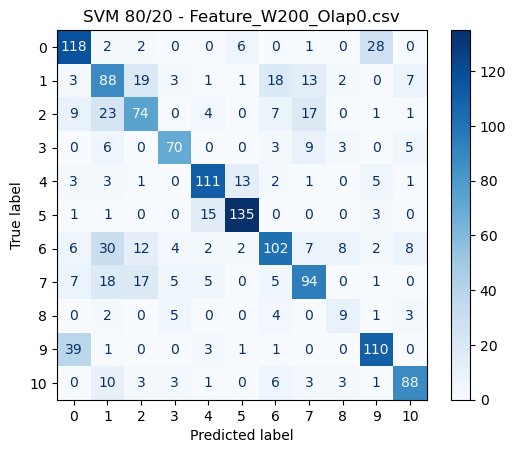

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.66      0.73      0.69       236
           1       0.50      0.61      0.55       232
           2       0.61      0.56      0.59       204
           3       0.80      0.83      0.81       145
           4       0.78      0.78      0.78       210
           5       0.84      0.91      0.87       232
           6       0.69      0.57      0.62       275
           7       0.66      0.59      0.62       228
           8       0.39      0.36      0.38        36
           9       0.73      0.74      0.74       232
          10       0.79      0.75      0.77       177

    accuracy                           0.69      2207
   macro avg       0.68      0.68      0.67      2207
weighted avg       0.70      0.69      0.69      2207

Accuracy: 69.37%
Precision: 69.57%
Recall: 69.37%
F1 Score: 69.27%
ROC AUC: 94.35%


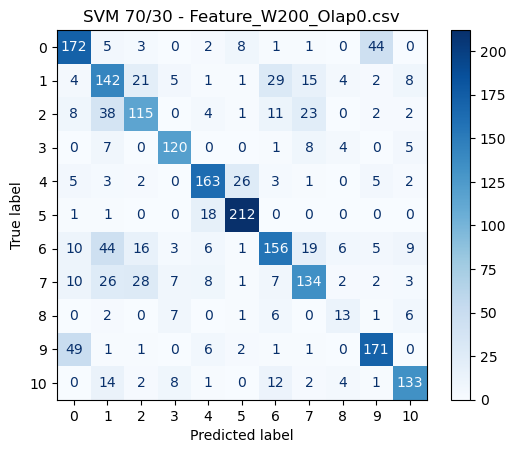

KFold Cross-Validation Scores (80/20 model): [0.71651937 0.71244052 0.69544528 0.69340585 0.69319728]
KFold Mean Accuracy (80/20 model): 70.22%
KFold Std Deviation (80/20 model): 0.0101

KFold Cross-Validation Scores (70/30 model): [0.71651937 0.71244052 0.69544528 0.69340585 0.69319728]
KFold Mean Accuracy (70/30 model): 70.22%
KFold Std Deviation (70/30 model): 0.0101
Processing file 4/10: Feature_W200_Olap50.csv

 SVM on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W200_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.71      0.78      0.74       313
           1       0.61      0.66      0.63       308
           2       0.71      0.68      0.69       271
           3       0.84      0.91      0.87       192
           4       0.84      0.84      0.84       279
           5       0.88      0.90      0.89       309
           6       0.75      0.72      0.73       365
  

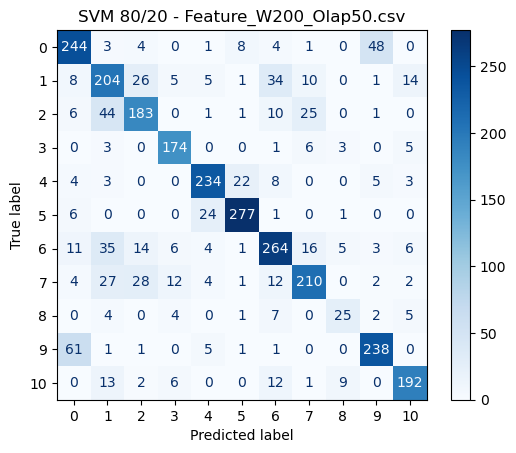

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.70      0.78      0.74       470
           1       0.57      0.62      0.60       463
           2       0.67      0.69      0.68       406
           3       0.86      0.91      0.89       287
           4       0.84      0.83      0.83       419
           5       0.88      0.89      0.89       463
           6       0.73      0.70      0.71       548
           7       0.76      0.65      0.70       453
           8       0.61      0.60      0.61        72
           9       0.81      0.78      0.79       462
          10       0.88      0.82      0.85       352

    accuracy                           0.76      4395
   macro avg       0.76      0.75      0.75      4395
weighted avg       0.76      0.76      0.76      4395

Accuracy: 75.70%
Precision: 75.98%
Recall: 75.70%
F1 Score: 75.74%
ROC AUC: 96.15%


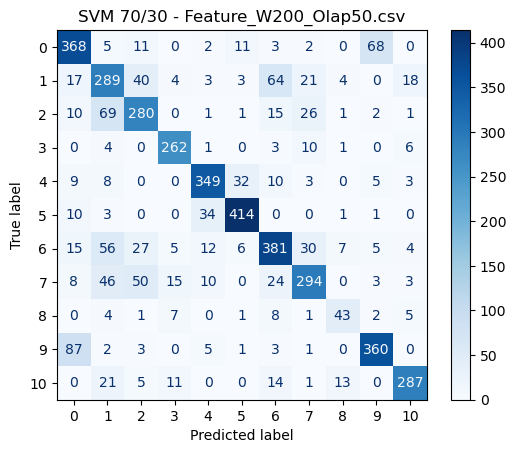

KFold Cross-Validation Scores (80/20 model): [0.77133106 0.75392491 0.76066917 0.76203482 0.75827928]
KFold Mean Accuracy (80/20 model): 76.12%
KFold Std Deviation (80/20 model): 0.0057

KFold Cross-Validation Scores (70/30 model): [0.77133106 0.75392491 0.76066917 0.76203482 0.75827928]
KFold Mean Accuracy (70/30 model): 76.12%
KFold Std Deviation (70/30 model): 0.0057
Processing file 5/10: Feature_W300_Olap0.csv

 SVM on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W300_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.71      0.73      0.72       105
           1       0.50      0.63      0.56       103
           2       0.67      0.67      0.67        90
           3       0.82      0.77      0.79        64
           4       0.83      0.77      0.80        93
           5       0.86      0.91      0.89       102
           6       0.77      0.67      0.72       122
    

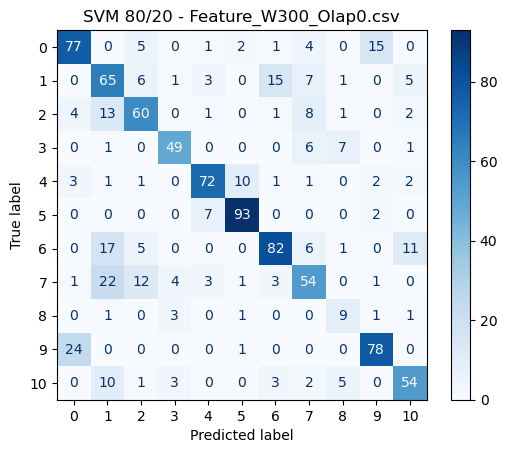

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.75      0.75      0.75       157
           1       0.47      0.62      0.53       154
           2       0.65      0.62      0.64       135
           3       0.83      0.79      0.81        96
           4       0.82      0.78      0.80       139
           5       0.84      0.88      0.86       154
           6       0.71      0.68      0.70       183
           7       0.63      0.50      0.56       151
           8       0.40      0.42      0.41        24
           9       0.81      0.81      0.81       155
          10       0.73      0.73      0.73       117

    accuracy                           0.71      1465
   macro avg       0.70      0.69      0.69      1465
weighted avg       0.72      0.71      0.71      1465

Accuracy: 70.78%
Precision: 71.52%
Recall: 70.78%
F1 Score: 70.93%
ROC AUC: 94.87%


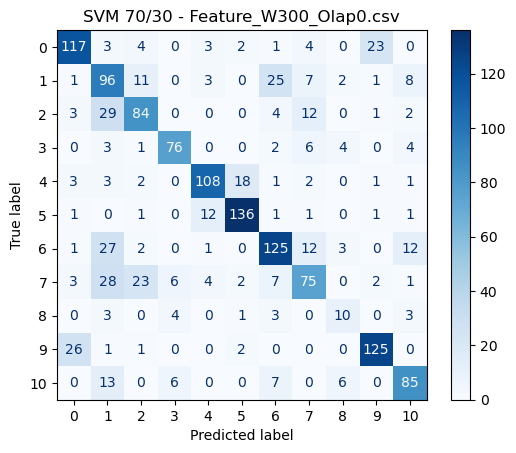

KFold Cross-Validation Scores (80/20 model): [0.71545548 0.70317298 0.71750256 0.72848361 0.71413934]
KFold Mean Accuracy (80/20 model): 71.58%
KFold Std Deviation (80/20 model): 0.0081

KFold Cross-Validation Scores (70/30 model): [0.70010235 0.68167861 0.69907881 0.71413934 0.70184426]
KFold Mean Accuracy (70/30 model): 69.94%
KFold Std Deviation (70/30 model): 0.0104
Processing file 6/10: Feature_W300_Olap50.csv

 SVM on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W300_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.78      0.80      0.79       208
           1       0.59      0.77      0.67       205
           2       0.79      0.63      0.70       179
           3       0.83      0.91      0.87       127
           4       0.88      0.87      0.88       185
           5       0.91      0.92      0.91       204
           6       0.83      0.73      0.78       243
  

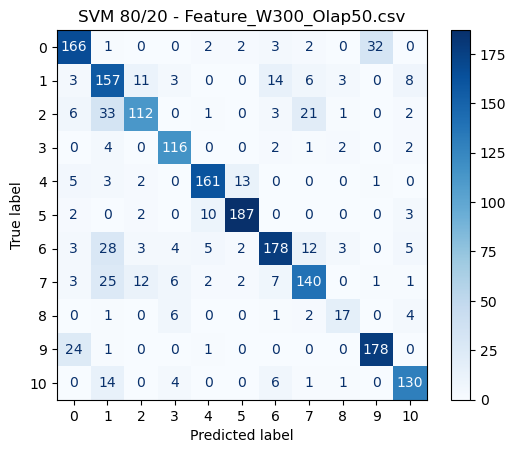

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.82      0.80      0.81       312
           1       0.55      0.73      0.63       307
           2       0.74      0.65      0.69       269
           3       0.85      0.92      0.88       190
           4       0.87      0.86      0.86       278
           5       0.91      0.91      0.91       307
           6       0.81      0.71      0.75       364
           7       0.73      0.66      0.69       299
           8       0.52      0.52      0.52        46
           9       0.84      0.87      0.85       307
          10       0.86      0.80      0.83       233

    accuracy                           0.78      2912
   macro avg       0.77      0.77      0.77      2912
weighted avg       0.79      0.78      0.78      2912

Accuracy: 78.06%
Precision: 78.80%
Recall: 78.06%
F1 Score: 78.19%
ROC AUC: 96.71%


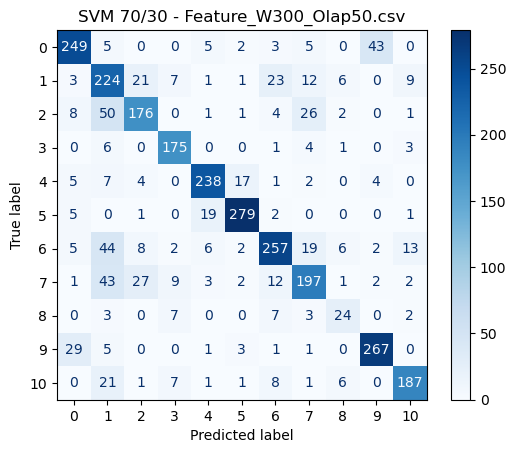

KFold Cross-Validation Scores (80/20 model): [0.78876868 0.77485832 0.77640392 0.79031427 0.7800103 ]
KFold Mean Accuracy (80/20 model): 78.21%
KFold Std Deviation (80/20 model): 0.0063

KFold Cross-Validation Scores (70/30 model): [0.78876868 0.77485832 0.77640392 0.79031427 0.7800103 ]
KFold Mean Accuracy (70/30 model): 78.21%
KFold Std Deviation (70/30 model): 0.0063
Processing file 7/10: Feature_W400_Olap0.csv

 SVM on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W400_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.64      0.77      0.70        78
           1       0.54      0.58      0.56        77
           2       0.67      0.67      0.67        67
           3       0.70      0.77      0.73        48
           4       0.75      0.75      0.75        69
           5       0.80      0.78      0.79        77
           6       0.71      0.71      0.71        91
    

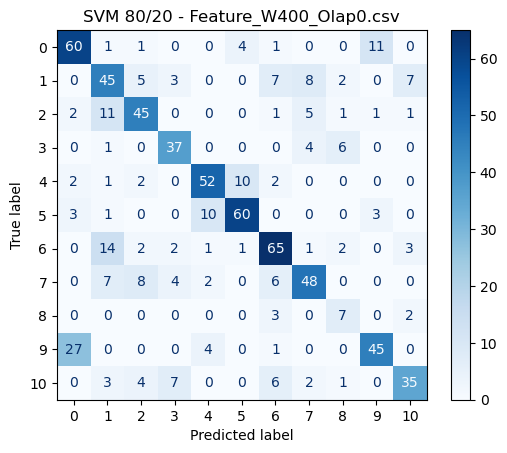

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.66      0.74      0.69       117
           1       0.50      0.67      0.57       115
           2       0.67      0.50      0.57       101
           3       0.74      0.89      0.81        72
           4       0.77      0.79      0.78       104
           5       0.88      0.80      0.84       115
           6       0.69      0.69      0.69       136
           7       0.65      0.57      0.60       113
           8       0.43      0.67      0.52        18
           9       0.77      0.69      0.72       115
          10       0.79      0.65      0.71        88

    accuracy                           0.69      1094
   macro avg       0.69      0.69      0.68      1094
weighted avg       0.70      0.69      0.69      1094

Accuracy: 69.20%
Precision: 70.39%
Recall: 69.20%
F1 Score: 69.31%
ROC AUC: 95.07%


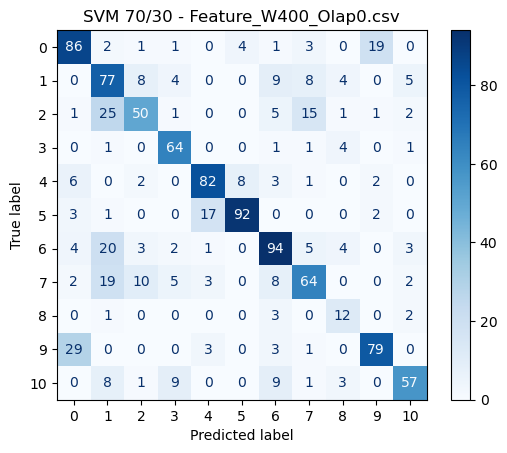

KFold Cross-Validation Scores (80/20 model): [0.70919067 0.70507545 0.72702332 0.74759945 0.71428571]
KFold Mean Accuracy (80/20 model): 72.06%
KFold Std Deviation (80/20 model): 0.0154

KFold Cross-Validation Scores (70/30 model): [0.70507545 0.69684499 0.69821674 0.74759945 0.69368132]
KFold Mean Accuracy (70/30 model): 70.83%
KFold Std Deviation (70/30 model): 0.0200
Processing file 8/10: Feature_W400_Olap50.csv

 SVM on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W400_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.80      0.85      0.83       155
           1       0.63      0.75      0.69       152
           2       0.73      0.70      0.72       134
           3       0.91      0.93      0.92        94
           4       0.84      0.89      0.87       138
           5       0.89      0.88      0.88       152
           6       0.82      0.82      0.82       181
  

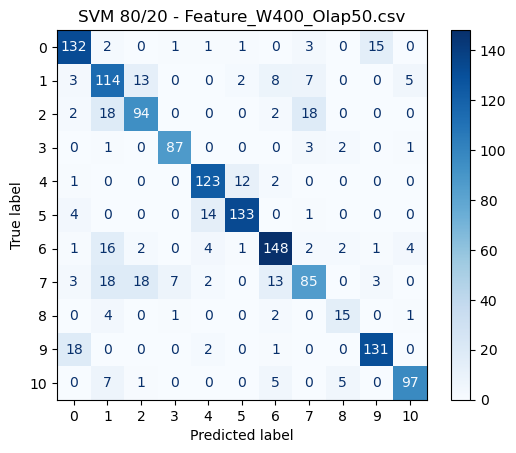

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.79      0.84      0.81       233
           1       0.60      0.72      0.65       228
           2       0.70      0.71      0.71       200
           3       0.83      0.91      0.87       141
           4       0.87      0.85      0.86       207
           5       0.87      0.90      0.89       229
           6       0.86      0.80      0.83       271
           7       0.76      0.58      0.66       223
           8       0.62      0.66      0.64        35
           9       0.86      0.85      0.85       228
          10       0.86      0.81      0.84       173

    accuracy                           0.79      2168
   macro avg       0.78      0.78      0.78      2168
weighted avg       0.80      0.79      0.79      2168

Accuracy: 79.15%
Precision: 79.59%
Recall: 79.15%
F1 Score: 79.14%
ROC AUC: 97.10%


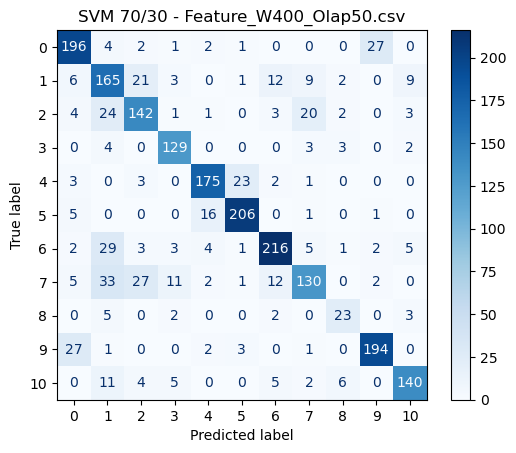

KFold Cross-Validation Scores (80/20 model): [0.78062284 0.77785467 0.79377163 0.80968858 0.79792388]
KFold Mean Accuracy (80/20 model): 79.20%
KFold Std Deviation (80/20 model): 0.0117

KFold Cross-Validation Scores (70/30 model): [0.78062284 0.77785467 0.79377163 0.80968858 0.79792388]
KFold Mean Accuracy (70/30 model): 79.20%
KFold Std Deviation (70/30 model): 0.0117
Processing file 9/10: Feature_W500_Olap0.csv

 SVM on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W500_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.79      0.81      0.80        62
           1       0.47      0.57      0.51        61
           2       0.72      0.63      0.67        54
           3       0.73      0.87      0.80        38
           4       0.78      0.64      0.71        56
           5       0.81      0.89      0.84        61
           6       0.83      0.82      0.83        73
    

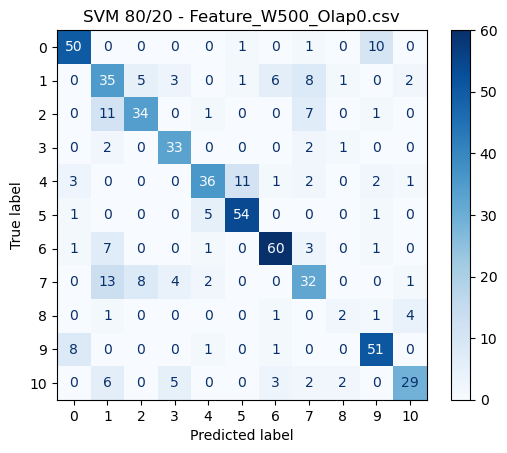

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.68      0.82      0.74        93
           1       0.49      0.58      0.53        92
           2       0.71      0.62      0.66        81
           3       0.74      0.86      0.79        56
           4       0.78      0.75      0.76        84
           5       0.83      0.79      0.81        92
           6       0.79      0.70      0.74       109
           7       0.58      0.62      0.60        90
           8       0.44      0.50      0.47        14
           9       0.75      0.68      0.72        92
          10       0.81      0.66      0.72        70

    accuracy                           0.70       873
   macro avg       0.69      0.69      0.69       873
weighted avg       0.71      0.70      0.70       873

Accuracy: 69.99%
Precision: 70.97%
Recall: 69.99%
F1 Score: 70.18%
ROC AUC: 95.45%


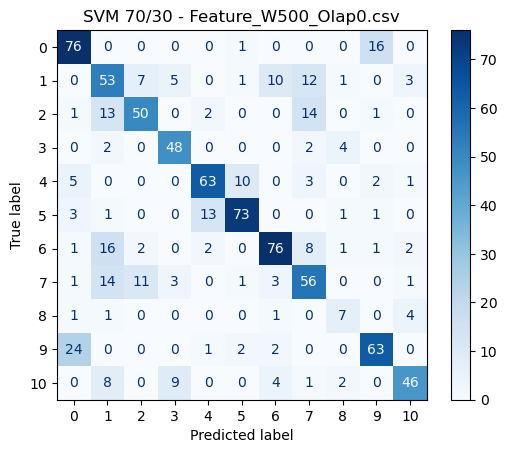

KFold Cross-Validation Scores (80/20 model): [0.71821306 0.74054983 0.70223752 0.72461274 0.73666093]
KFold Mean Accuracy (80/20 model): 72.45%
KFold Std Deviation (80/20 model): 0.0137

KFold Cross-Validation Scores (70/30 model): [0.71649485 0.72680412 0.70051635 0.71084337 0.72633391]
KFold Mean Accuracy (70/30 model): 71.62%
KFold Std Deviation (70/30 model): 0.0099
Processing file 10/10: Feature_W500_Olap50.csv

 SVM on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W500_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.72      0.87      0.79       124
           1       0.64      0.72      0.68       121
           2       0.81      0.78      0.80       106
           3       0.87      0.81      0.84        74
           4       0.82      0.88      0.85       110
           5       0.90      0.82      0.86       121
           6       0.86      0.84      0.85       144
 

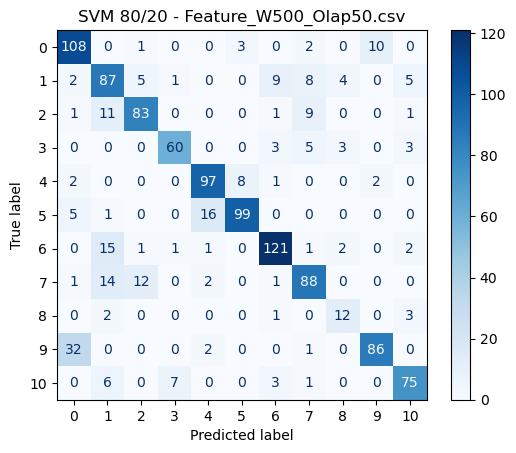

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.82      0.79      0.80       185
           1       0.59      0.68      0.63       182
           2       0.82      0.67      0.73       159
           3       0.89      0.85      0.87       111
           4       0.84      0.87      0.85       165
           5       0.89      0.88      0.88       182
           6       0.86      0.85      0.85       216
           7       0.73      0.73      0.73       177
           8       0.65      0.74      0.69        27
           9       0.81      0.82      0.82       182
          10       0.83      0.85      0.84       138

    accuracy                           0.80      1724
   macro avg       0.79      0.79      0.79      1724
weighted avg       0.80      0.80      0.80      1724

Accuracy: 79.64%
Precision: 80.05%
Recall: 79.64%
F1 Score: 79.73%
ROC AUC: 97.52%


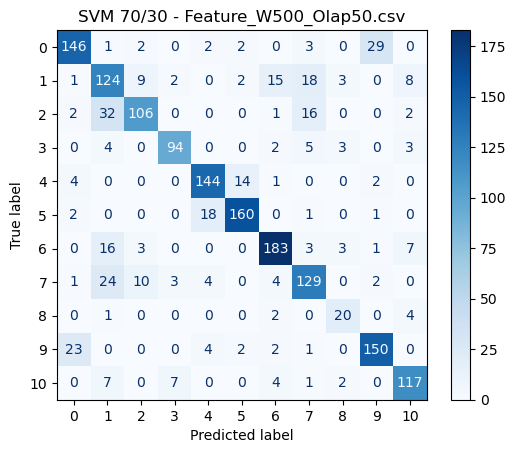

KFold Cross-Validation Scores (80/20 model): [0.81636205 0.79286336 0.80417755 0.80765883 0.81620209]
KFold Mean Accuracy (80/20 model): 80.75%
KFold Std Deviation (80/20 model): 0.0087

KFold Cross-Validation Scores (70/30 model): [0.81288077 0.79547433 0.80156658 0.80069626 0.81620209]
KFold Mean Accuracy (70/30 model): 80.54%
KFold Std Deviation (70/30 model): 0.0078


,Feature File,Model,Split,Accuracy,Precision,Recall,F1-Score,ROC_AUC,CV Mean Accuracy,CV Std Accuracy,Best Params
0,Feature_W100_Olap0.csv,SVM,80/20,0.684032,0.686698,0.684032,0.683237,0.942509,0.691798,0.008311,"{'kernel': 'poly', 'gamma': 0.1, 'C': 1}"
1,Feature_W100_Olap0.csv,SVM,70/30,0.676968,0.678920,0.676968,0.675910,0.940242,0.691798,0.008311,"{'kernel': 'poly', 'gamma': 0.1, 'C': 1}"
2,Feature_W100_Olap50.csv,SVM,80/20,0.733345,0.738609,0.733345,0.734398,0.949984,0.737345,0.006344,"{'kernel': 'poly', 'gamma': 0.1, 'C': 100}"
3,Feature_W100_Olap50.csv,SVM,70/30,0.730139,0.734799,0.730139,0.730681,0.947147,0.737345,0.006344,"{'kernel': 'poly', 'gamma': 0.1, 'C': 100}"
4,Feature_W200_Olap0.csv,SVM,80/20,0.679130,0.684067,0.679130,0.679614,0.944120,0.702202,0.010138,"{'kernel': 'poly', 'gamma': 0.1, 'C': 1}"
5,Feature_W200_Olap0.csv,SVM,70/30,0.693702,0.695709,0.693702,0.692725,0.943492,0.702202,0.010138,"{'kernel': 'poly', 'gamma': 0.1, 'C': 1}"
6,Feature_W200_Olap50.csv,SVM,80/20,0.766212,0.767698,0.766212,0.766183,0.964435,0.761248,0.005746,"{'kernel': 'poly', 'gamma': 0.1, 'C': 1}"
7,Feature_W200_Olap50.csv,SVM,70/30,0.756997,0.759837,0.756997,0.757411,0.961480,0.761248,0.005746,"{'kernel': 'poly', 'gamma': 0.1, 'C': 1}"
8,Feature_W300_Olap0.csv,SVM,80/20,0.709314,0.718185,0.709314,0.711634,0.943316,0.715751,0.008076,"{'kernel': 'poly', 'gamma': 0.1, 'C': 1}"
9,Feature_W300_Olap0.csv,SVM,70/30,0.707850,0.715168,0.707850,0.709293,0.948662,0.699369,0.010372,"{'kernel': 'poly', 'gamma': 0.1, 'C': 100}"


In [4]:
svm_params = {
    'C': [0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
    'gamma': ['scale', 'auto', 0.1, 0.01, 0.001]
}

svm_results = []

# for file_path in fileList:
for i, file_path in enumerate(fileList):
    print(f"Processing file {i+1}/{len(fileList)}: {os.path.basename(file_path)}")
    print(f"\n SVM on {file_path}...")

    df = pd.read_csv(file_path)
    X = df.drop(columns=['exp_Name'])
    y = df['exp_Name']
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)

    # Apply StandardScaler
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # 80/20 Split
    X_train_80, X_test_20, y_train_80, y_test_20 = train_test_split(
        X_scaled, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
    )

    svm_80 = SVC(probability=True)
    svm_search_80 = RandomizedSearchCV(
        svm_80, param_distributions=svm_params, n_iter=10, cv=5, random_state=42, verbose=2, n_jobs=-1
    )
    svm_search_80.fit(X_train_80, y_train_80)
    best_svm_80 = svm_search_80.best_estimator_

    acc80, prec80, rec80, f180, roc_auc80 = evaluate_model(best_svm_80, X_test_20, y_test_20)
    plot_confusion(best_svm_80, X_test_20, y_test_20, title=f"SVM 80/20 - {os.path.basename(file_path)}")

    # 70/30 Split
    X_train_70, X_test_30, y_train_70, y_test_30 = train_test_split(
        X_scaled, y_encoded, test_size=0.3, random_state=42, stratify=y_encoded
    )

    svm_70 = SVC(probability=True)
    svm_search_70 = RandomizedSearchCV(
        svm_70, param_distributions=svm_params, n_iter=10, cv=5, random_state=42, verbose=2, n_jobs=-1
    )
    svm_search_70.fit(X_train_70, y_train_70)
    best_svm_70 = svm_search_70.best_estimator_

    acc70, prec70, rec70, f170, roc_auc70 = evaluate_model(best_svm_70, X_test_30, y_test_30)
    plot_confusion(best_svm_70, X_test_30, y_test_30, title=f"SVM 70/30 - {os.path.basename(file_path)}")

    # KFold Cross-validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    # For 80/20
    kf_scores_80 = cross_val_score(best_svm_80, X_scaled, y_encoded, cv=kf, scoring='accuracy', n_jobs=-1)
    print("KFold Cross-Validation Scores (80/20 model):", kf_scores_80)
    print("KFold Mean Accuracy (80/20 model): {:.2f}%".format(kf_scores_80.mean() * 100))
    print("KFold Std Deviation (80/20 model): {:.4f}".format(kf_scores_80.std()))

    # For 70/30
    kf_scores_70 = cross_val_score(best_svm_70, X_scaled, y_encoded, cv=kf, scoring='accuracy', n_jobs=-1)
    print("\nKFold Cross-Validation Scores (70/30 model):", kf_scores_70)
    print("KFold Mean Accuracy (70/30 model): {:.2f}%".format(kf_scores_70.mean() * 100))
    print("KFold Std Deviation (70/30 model): {:.4f}".format(kf_scores_70.std()))

    # Save results for both splits
    svm_results.append([
        os.path.basename(file_path), "SVM", "80/20", acc80, prec80, rec80, f180, roc_auc80,
        kf_scores_80.mean(), kf_scores_80.std(), svm_search_80.best_params_
    ])
    svm_results.append([
        os.path.basename(file_path), "SVM", "70/30", acc70, prec70, rec70, f170, roc_auc70,
        kf_scores_70.mean(), kf_scores_70.std(), svm_search_70.best_params_
    ])

# Create final dataframe
svm_results_df = pd.DataFrame(
    svm_results,
    columns=[
        "Feature File", "Model", "Split", "Accuracy", "Precision", "Recall", "F1-Score", "ROC_AUC",
        "CV Mean Accuracy", "CV Std Accuracy", "Best Params"
    ]
)

# Save results
svm_results_df.to_csv('results_svm.csv', index=False)

# Display
svm_results_df

### K-Nearest Neighbors (K-Fold)

Processing file 1/10: Feature_W100_Olap0.csv

 KNN on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W100_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.75      0.76      0.76       316
           1       0.46      0.38      0.41       311
           2       0.57      0.64      0.60       273
           3       0.81      0.75      0.78       194
           4       0.84      0.76      0.80       282
           5       0.85      0.93      0.89       311
           6       0.59      0.57      0.58       368
           7       0.56      0.57      0.57       305
           8       0.46      0.22      0.30        49
           9       0.78      0.89      0.83       310
          10       0.69      0.74      0.72       237

    accuracy                           0.69      2956
   macro avg       0.67      0.65      0.66      2956
weighted avg       0.68      0.69      0.68      295

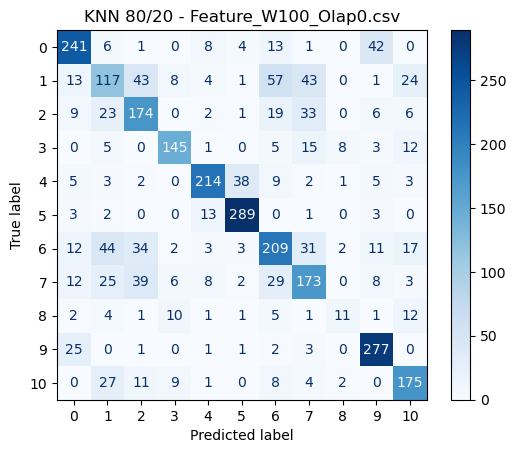

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.77      0.80      0.78       474
           1       0.46      0.39      0.42       466
           2       0.56      0.64      0.60       409
           3       0.83      0.75      0.79       291
           4       0.81      0.77      0.79       422
           5       0.84      0.93      0.88       467
           6       0.58      0.57      0.57       551
           7       0.56      0.54      0.55       458
           8       0.45      0.27      0.34        73
           9       0.79      0.89      0.84       466
          10       0.71      0.69      0.70       356

    accuracy                           0.69      4433
   macro avg       0.67      0.66      0.66      4433
weighted avg       0.68      0.69      0.68      4433

Accuracy: 68.55%
Precision: 67.97%
Recall: 68.55%
F1 Score: 68.09%
ROC AUC: 90.44%


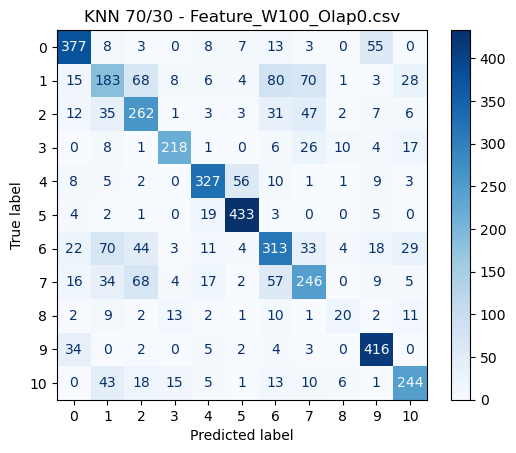

KFold Cross-Validation Scores (80/20 model): [0.69215156 0.68967851 0.67715736 0.69001692 0.68967851]
KFold Mean Accuracy (80/20 model): 68.77%
KFold Std Deviation (80/20 model): 0.0054

KFold Cross-Validation Scores (70/30 model): [0.69215156 0.68967851 0.67715736 0.69001692 0.68967851]
KFold Mean Accuracy (70/30 model): 68.77%
KFold Std Deviation (70/30 model): 0.0054
Processing file 2/10: Feature_W100_Olap50.csv

 KNN on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W100_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.84      0.86      0.85       631
           1       0.58      0.49      0.53       621
           2       0.64      0.71      0.67       545
           3       0.90      0.82      0.86       387
           4       0.89      0.84      0.87       562
           5       0.90      0.95      0.93       621
           6       0.70      0.62      0.66       734
  

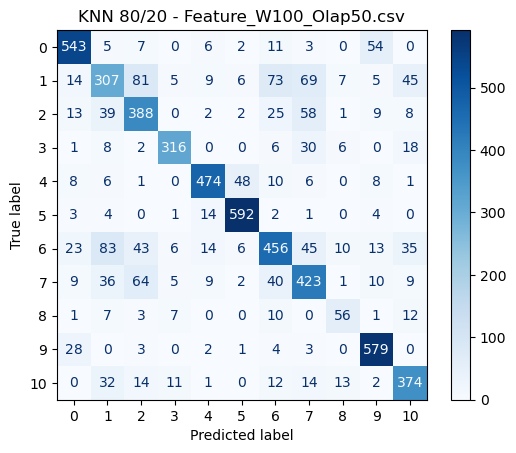

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.83      0.86      0.85       946
           1       0.58      0.50      0.54       932
           2       0.64      0.70      0.67       817
           3       0.89      0.81      0.85       580
           4       0.88      0.85      0.87       843
           5       0.91      0.95      0.93       932
           6       0.70      0.62      0.65      1102
           7       0.64      0.70      0.67       912
           8       0.57      0.56      0.57       146
           9       0.85      0.94      0.89       929
          10       0.76      0.76      0.76       710

    accuracy                           0.76      8849
   macro avg       0.75      0.75      0.75      8849
weighted avg       0.76      0.76      0.76      8849

Accuracy: 76.12%
Precision: 75.91%
Recall: 76.12%
F1 Score: 75.89%
ROC AUC: 92.59%


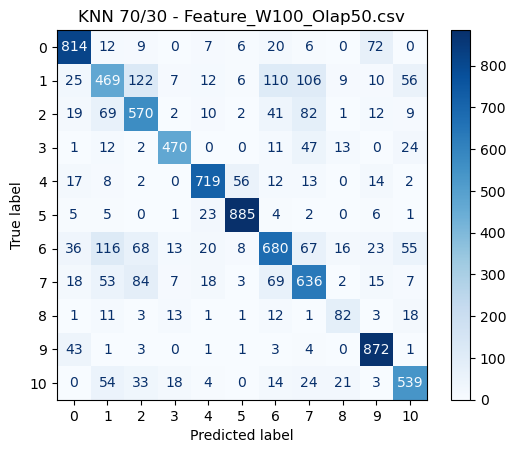

KFold Cross-Validation Scores (80/20 model): [0.76623156 0.76826581 0.7631802  0.75894219 0.76640108]
KFold Mean Accuracy (80/20 model): 76.46%
KFold Std Deviation (80/20 model): 0.0033

KFold Cross-Validation Scores (70/30 model): [0.76623156 0.76826581 0.7631802  0.75894219 0.76640108]
KFold Mean Accuracy (70/30 model): 76.46%
KFold Std Deviation (70/30 model): 0.0033
Processing file 3/10: Feature_W200_Olap0.csv

 KNN on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W200_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.81      0.78      0.79       157
           1       0.44      0.46      0.45       155
           2       0.53      0.53      0.53       136
           3       0.82      0.68      0.74        96
           4       0.84      0.77      0.81       140
           5       0.85      0.94      0.90       155
           6       0.72      0.60      0.65       183
    

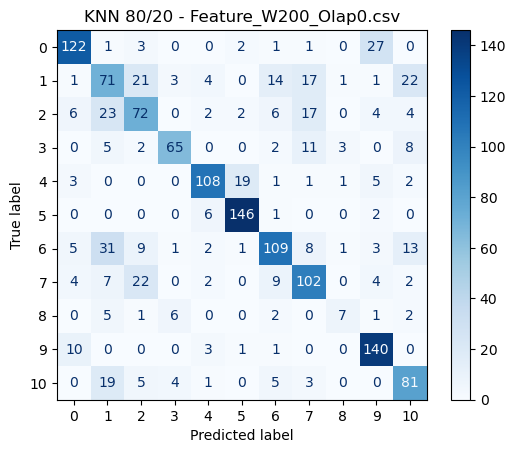

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.77      0.75      0.76       236
           1       0.45      0.48      0.46       232
           2       0.56      0.54      0.55       204
           3       0.82      0.73      0.77       145
           4       0.82      0.74      0.78       210
           5       0.82      0.94      0.88       232
           6       0.68      0.57      0.62       275
           7       0.63      0.64      0.63       228
           8       0.45      0.28      0.34        36
           9       0.75      0.89      0.81       232
          10       0.65      0.69      0.67       177

    accuracy                           0.69      2207
   macro avg       0.67      0.66      0.66      2207
weighted avg       0.69      0.69      0.68      2207

Accuracy: 68.74%
Precision: 68.62%
Recall: 68.74%
F1 Score: 68.43%
ROC AUC: 90.95%


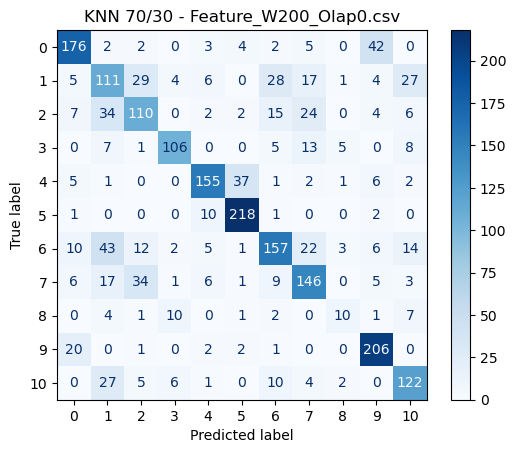

KFold Cross-Validation Scores (80/20 model): [0.69612508 0.69340585 0.69340585 0.67980965 0.69863946]
KFold Mean Accuracy (80/20 model): 69.23%
KFold Std Deviation (80/20 model): 0.0065

KFold Cross-Validation Scores (70/30 model): [0.69612508 0.69340585 0.69340585 0.67980965 0.69863946]
KFold Mean Accuracy (70/30 model): 69.23%
KFold Std Deviation (70/30 model): 0.0065
Processing file 4/10: Feature_W200_Olap50.csv

 KNN on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W200_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.84      0.85      0.84       313
           1       0.63      0.59      0.61       308
           2       0.72      0.75      0.73       271
           3       0.89      0.84      0.86       192
           4       0.88      0.81      0.84       279
           5       0.88      0.95      0.91       309
           6       0.74      0.68      0.71       365
  

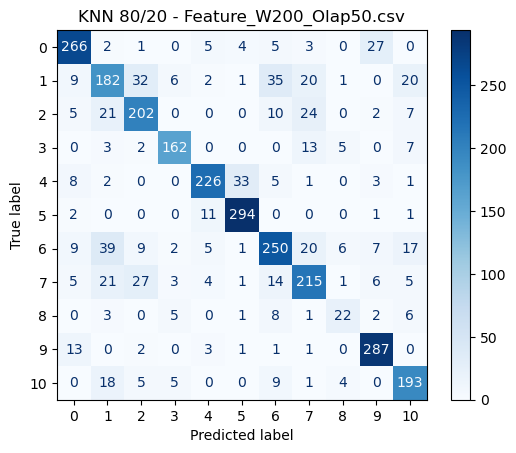

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.83      0.84      0.83       470
           1       0.61      0.56      0.58       463
           2       0.69      0.74      0.72       406
           3       0.86      0.84      0.85       287
           4       0.89      0.79      0.84       419
           5       0.87      0.95      0.91       463
           6       0.73      0.68      0.70       548
           7       0.69      0.70      0.69       453
           8       0.58      0.53      0.55        72
           9       0.85      0.92      0.88       462
          10       0.77      0.80      0.78       352

    accuracy                           0.77      4395
   macro avg       0.76      0.76      0.76      4395
weighted avg       0.77      0.77      0.77      4395

Accuracy: 77.38%
Precision: 77.20%
Recall: 77.38%
F1 Score: 77.19%
ROC AUC: 93.25%


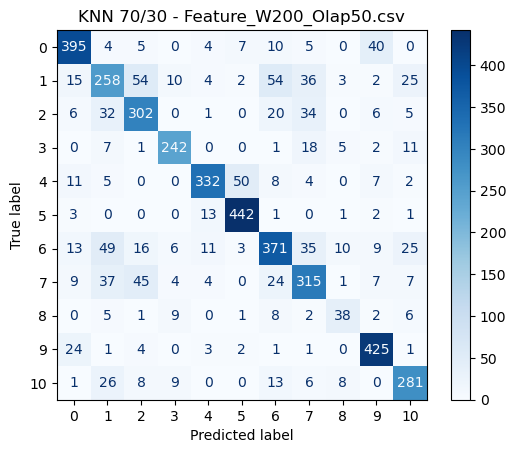

KFold Cross-Validation Scores (80/20 model): [0.76962457 0.78259386 0.78115398 0.77227723 0.77705702]
KFold Mean Accuracy (80/20 model): 77.65%
KFold Std Deviation (80/20 model): 0.0050

KFold Cross-Validation Scores (70/30 model): [0.76962457 0.78259386 0.78115398 0.77227723 0.77705702]
KFold Mean Accuracy (70/30 model): 77.65%
KFold Std Deviation (70/30 model): 0.0050
Processing file 5/10: Feature_W300_Olap0.csv

 KNN on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W300_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.78      0.80      0.79       105
           1       0.48      0.48      0.48       103
           2       0.72      0.68      0.70        90
           3       0.79      0.75      0.77        64
           4       0.89      0.75      0.81        93
           5       0.85      0.96      0.90       102
           6       0.72      0.71      0.72       122
    

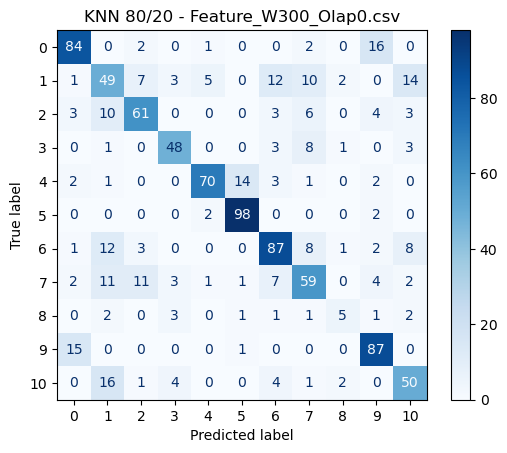

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.77      0.75      0.76       157
           1       0.53      0.53      0.53       154
           2       0.74      0.68      0.71       135
           3       0.80      0.72      0.76        96
           4       0.86      0.71      0.77       139
           5       0.81      0.95      0.88       154
           6       0.68      0.72      0.70       183
           7       0.62      0.60      0.61       151
           8       0.58      0.29      0.39        24
           9       0.75      0.86      0.80       155
          10       0.59      0.61      0.60       117

    accuracy                           0.71      1465
   macro avg       0.70      0.67      0.68      1465
weighted avg       0.71      0.71      0.71      1465

Accuracy: 70.92%
Precision: 70.94%
Recall: 70.92%
F1 Score: 70.63%
ROC AUC: 91.43%


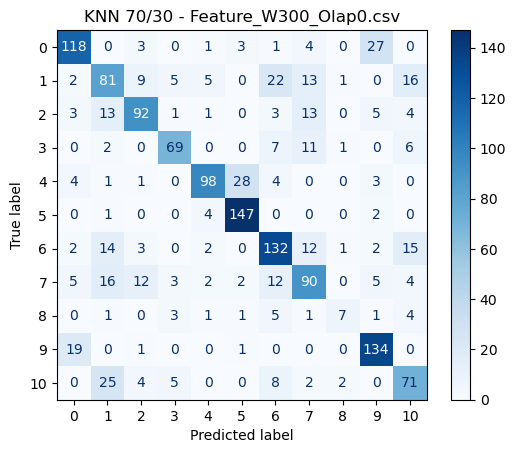

KFold Cross-Validation Scores (80/20 model): [0.71340839 0.70931423 0.71954964 0.70081967 0.71413934]
KFold Mean Accuracy (80/20 model): 71.14%
KFold Std Deviation (80/20 model): 0.0062

KFold Cross-Validation Scores (70/30 model): [0.71340839 0.70931423 0.71954964 0.70081967 0.71413934]
KFold Mean Accuracy (70/30 model): 71.14%
KFold Std Deviation (70/30 model): 0.0062
Processing file 6/10: Feature_W300_Olap50.csv

 KNN on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W300_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.86      0.85      0.86       208
           1       0.65      0.62      0.64       205
           2       0.74      0.66      0.70       179
           3       0.92      0.87      0.89       127
           4       0.91      0.82      0.86       185
           5       0.90      0.98      0.93       204
           6       0.75      0.75      0.75       243
  

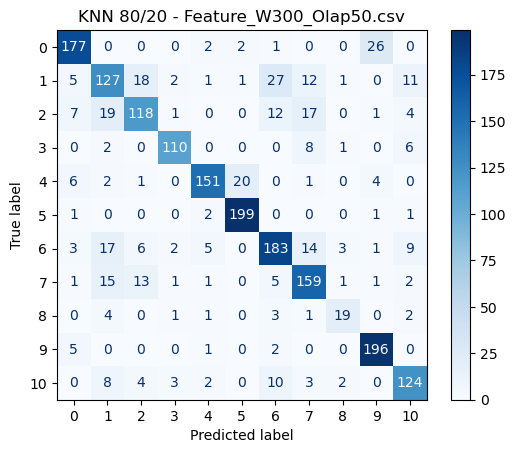

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.84      0.82      0.83       312
           1       0.61      0.58      0.60       307
           2       0.75      0.68      0.72       269
           3       0.89      0.87      0.88       190
           4       0.89      0.79      0.84       278
           5       0.88      0.96      0.92       307
           6       0.73      0.71      0.72       364
           7       0.70      0.75      0.73       299
           8       0.76      0.54      0.63        46
           9       0.80      0.94      0.86       307
          10       0.76      0.76      0.76       233

    accuracy                           0.78      2912
   macro avg       0.78      0.76      0.77      2912
weighted avg       0.78      0.78      0.78      2912

Accuracy: 77.99%
Precision: 77.95%
Recall: 77.99%
F1 Score: 77.80%
ROC AUC: 95.07%


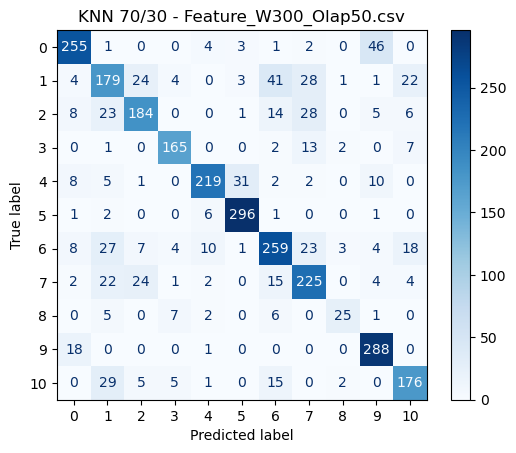

KFold Cross-Validation Scores (80/20 model): [0.79804225 0.77794951 0.78979907 0.79134467 0.77846471]
KFold Mean Accuracy (80/20 model): 78.71%
KFold Std Deviation (80/20 model): 0.0078

KFold Cross-Validation Scores (70/30 model): [0.79289026 0.77382792 0.79289026 0.78361669 0.77331273]
KFold Mean Accuracy (70/30 model): 78.33%
KFold Std Deviation (70/30 model): 0.0086
Processing file 7/10: Feature_W400_Olap0.csv

 KNN on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W400_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.70      0.73      0.71        78
           1       0.49      0.47      0.48        77
           2       0.62      0.55      0.58        67
           3       0.82      0.75      0.78        48
           4       0.84      0.75      0.79        69
           5       0.85      0.91      0.88        77
           6       0.66      0.76      0.70        91
    

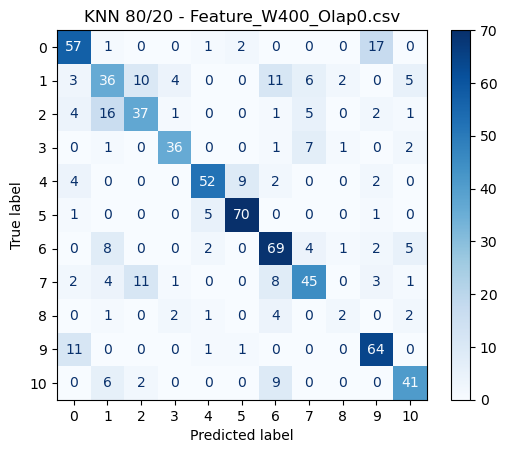

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.69      0.77      0.73       117
           1       0.41      0.39      0.40       115
           2       0.69      0.59      0.64       101
           3       0.81      0.82      0.81        72
           4       0.80      0.75      0.77       104
           5       0.89      0.90      0.89       115
           6       0.66      0.70      0.68       136
           7       0.62      0.62      0.62       113
           8       0.20      0.17      0.18        18
           9       0.73      0.79      0.76       115
          10       0.69      0.67      0.68        88

    accuracy                           0.69      1094
   macro avg       0.65      0.65      0.65      1094
weighted avg       0.69      0.69      0.69      1094

Accuracy: 68.83%
Precision: 68.56%
Recall: 68.83%
F1 Score: 68.61%
ROC AUC: 89.56%


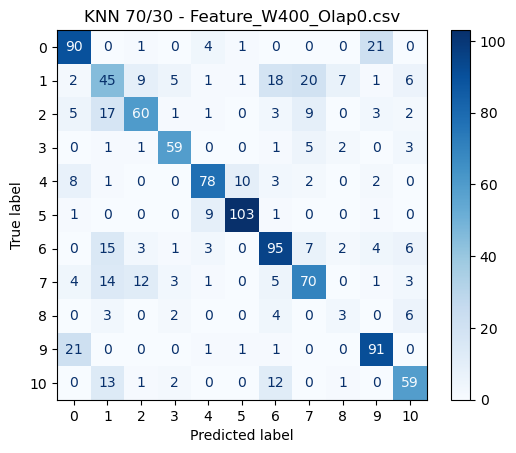

KFold Cross-Validation Scores (80/20 model): [0.70644719 0.70233196 0.71056241 0.71193416 0.69230769]
KFold Mean Accuracy (80/20 model): 70.47%
KFold Std Deviation (80/20 model): 0.0071

KFold Cross-Validation Scores (70/30 model): [0.71193416 0.68587106 0.7037037  0.71604938 0.69368132]
KFold Mean Accuracy (70/30 model): 70.22%
KFold Std Deviation (70/30 model): 0.0112
Processing file 8/10: Feature_W400_Olap50.csv

 KNN on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W400_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.90      0.84      0.87       155
           1       0.68      0.68      0.68       152
           2       0.79      0.72      0.75       134
           3       0.88      0.87      0.88        94
           4       0.93      0.83      0.88       138
           5       0.88      0.97      0.93       152
           6       0.80      0.83      0.81       181
  

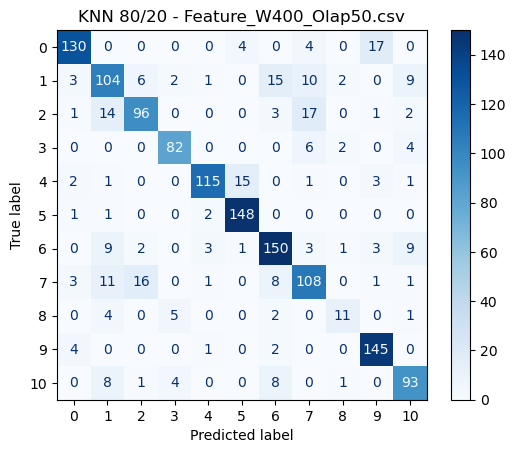

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.88      0.84      0.86       233
           1       0.60      0.63      0.62       228
           2       0.80      0.69      0.74       200
           3       0.85      0.84      0.85       141
           4       0.90      0.82      0.86       207
           5       0.87      0.96      0.91       229
           6       0.78      0.80      0.79       271
           7       0.72      0.72      0.72       223
           8       0.66      0.54      0.59        35
           9       0.83      0.92      0.88       228
          10       0.77      0.76      0.77       173

    accuracy                           0.79      2168
   macro avg       0.79      0.77      0.78      2168
weighted avg       0.80      0.79      0.79      2168

Accuracy: 79.47%
Precision: 79.52%
Recall: 79.47%
F1 Score: 79.38%
ROC AUC: 93.93%


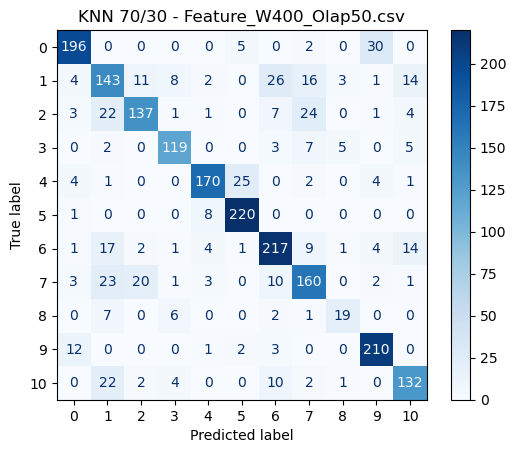

KFold Cross-Validation Scores (80/20 model): [0.79446367 0.79238754 0.82145329 0.80761246 0.79723183]
KFold Mean Accuracy (80/20 model): 80.26%
KFold Std Deviation (80/20 model): 0.0108

KFold Cross-Validation Scores (70/30 model): [0.79446367 0.79238754 0.82145329 0.80761246 0.79723183]
KFold Mean Accuracy (70/30 model): 80.26%
KFold Std Deviation (70/30 model): 0.0108
Processing file 9/10: Feature_W500_Olap0.csv

 KNN on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W500_Olap0.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.77      0.79      0.78        62
           1       0.48      0.38      0.42        61
           2       0.73      0.65      0.69        54
           3       0.83      0.76      0.79        38
           4       0.87      0.61      0.72        56
           5       0.76      0.92      0.83        61
           6       0.72      0.78      0.75        73
    

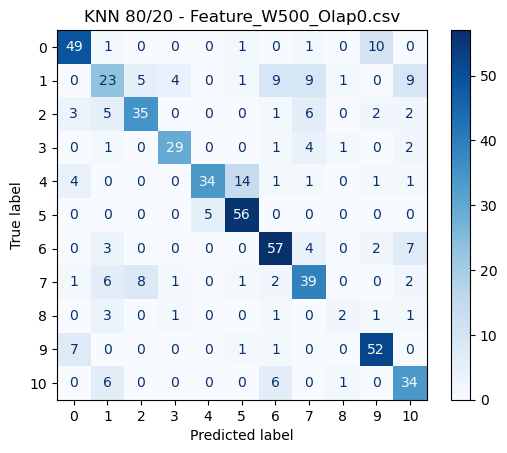

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.79      0.80      0.79        93
           1       0.47      0.39      0.43        92
           2       0.67      0.63      0.65        81
           3       0.85      0.80      0.83        56
           4       0.83      0.65      0.73        84
           5       0.76      0.88      0.82        92
           6       0.74      0.73      0.74       109
           7       0.61      0.70      0.65        90
           8       0.30      0.21      0.25        14
           9       0.78      0.88      0.83        92
          10       0.61      0.67      0.64        70

    accuracy                           0.71       873
   macro avg       0.67      0.67      0.67       873
weighted avg       0.70      0.71      0.70       873

Accuracy: 70.56%
Precision: 70.26%
Recall: 70.56%
F1 Score: 70.13%
ROC AUC: 89.69%


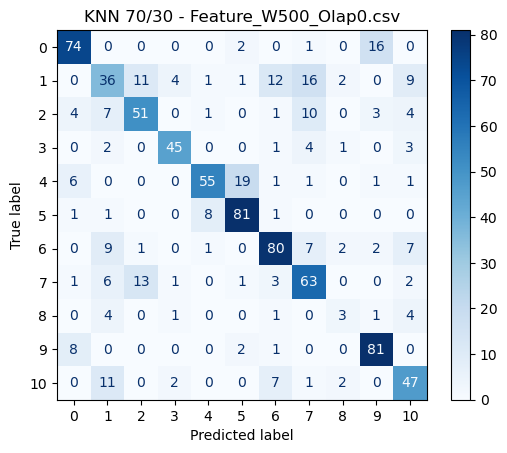

KFold Cross-Validation Scores (80/20 model): [0.72508591 0.72164948 0.68158348 0.72633391 0.73666093]
KFold Mean Accuracy (80/20 model): 71.83%
KFold Std Deviation (80/20 model): 0.0190

KFold Cross-Validation Scores (70/30 model): [0.72508591 0.72164948 0.68158348 0.72633391 0.73666093]
KFold Mean Accuracy (70/30 model): 71.83%
KFold Std Deviation (70/30 model): 0.0190
Processing file 10/10: Feature_W500_Olap50.csv

 KNN on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W500_Olap50.csv...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.88      0.90      0.89       124
           1       0.61      0.50      0.55       121
           2       0.74      0.71      0.72       106
           3       0.92      0.81      0.86        74
           4       0.90      0.86      0.88       110
           5       0.92      0.92      0.92       121
           6       0.78      0.90      0.83       144
 

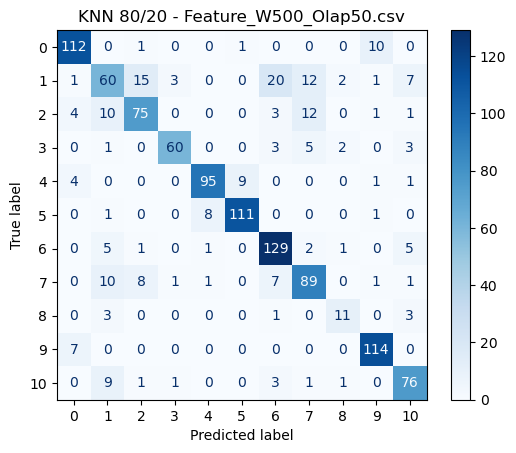

Fitting 5 folds for each of 10 candidates, totalling 50 fits
              precision    recall  f1-score   support

           0       0.89      0.89      0.89       185
           1       0.62      0.55      0.58       182
           2       0.78      0.66      0.71       159
           3       0.96      0.81      0.88       111
           4       0.90      0.84      0.87       165
           5       0.90      0.92      0.91       182
           6       0.75      0.88      0.81       216
           7       0.73      0.74      0.73       177
           8       0.71      0.63      0.67        27
           9       0.88      0.95      0.91       182
          10       0.76      0.86      0.81       138

    accuracy                           0.81      1724
   macro avg       0.81      0.79      0.80      1724
weighted avg       0.81      0.81      0.81      1724

Accuracy: 80.86%
Precision: 80.90%
Recall: 80.86%
F1 Score: 80.67%
ROC AUC: 94.56%


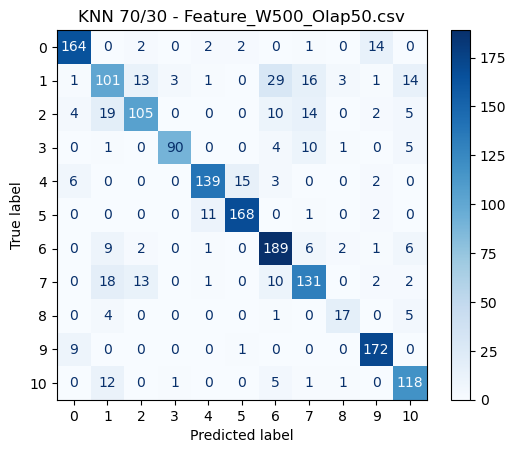

KFold Cross-Validation Scores (80/20 model): [0.81549173 0.80852916 0.81549173 0.80417755 0.83101045]
KFold Mean Accuracy (80/20 model): 81.49%
KFold Std Deviation (80/20 model): 0.0091

KFold Cross-Validation Scores (70/30 model): [0.81549173 0.80852916 0.81549173 0.80417755 0.83101045]
KFold Mean Accuracy (70/30 model): 81.49%
KFold Std Deviation (70/30 model): 0.0091

Final Results:


,Feature File,Model,Split,Accuracy,Precision,Recall,F1-Score,ROC_AUC,CV Mean Accuracy,CV Std Accuracy,Best Params
0,Feature_W100_Olap0.csv,KNN,80/20,0.685047,0.678530,0.685047,0.679581,0.908667,0.687737,0.005369,"{'weights': 'distance', 'p': 1, 'n_neighbors': 5}"
1,Feature_W100_Olap0.csv,KNN,70/30,0.685540,0.679722,0.685540,0.680891,0.904393,0.687737,0.005369,"{'weights': 'distance', 'p': 1, 'n_neighbors': 5}"
2,Feature_W100_Olap50.csv,KNN,80/20,0.764197,0.762152,0.764197,0.761640,0.929468,0.764604,0.003267,"{'weights': 'distance', 'p': 1, 'n_neighbors': 3}"
3,Feature_W100_Olap50.csv,KNN,70/30,0.761216,0.759079,0.761216,0.758882,0.925881,0.764604,0.003267,"{'weights': 'distance', 'p': 1, 'n_neighbors': 3}"
4,Feature_W200_Olap0.csv,KNN,80/20,0.695445,0.697524,0.695445,0.693219,0.908713,0.692277,0.006531,"{'weights': 'distance', 'p': 1, 'n_neighbors': 5}"
5,Feature_W200_Olap0.csv,KNN,70/30,0.687358,0.686225,0.687358,0.684274,0.909502,0.692277,0.006531,"{'weights': 'distance', 'p': 1, 'n_neighbors': 5}"
6,Feature_W200_Olap50.csv,KNN,80/20,0.784642,0.782520,0.784642,0.782632,0.936361,0.776541,0.004984,"{'weights': 'distance', 'p': 1, 'n_neighbors': 3}"
7,Feature_W200_Olap50.csv,KNN,70/30,0.773834,0.771993,0.773834,0.771913,0.932470,0.776541,0.004984,"{'weights': 'distance', 'p': 1, 'n_neighbors': 3}"
8,Feature_W300_Olap0.csv,KNN,80/20,0.714432,0.713122,0.714432,0.712144,0.917696,0.711446,0.006233,"{'weights': 'distance', 'p': 1, 'n_neighbors': 5}"
9,Feature_W300_Olap0.csv,KNN,70/30,0.709215,0.709352,0.709215,0.706318,0.914273,0.711446,0.006233,"{'weights': 'distance', 'p': 1, 'n_neighbors': 5}"


In [5]:
knn_params = {
    'n_neighbors': [3, 5, 7, 11],
    'weights': ['uniform', 'distance'],
    'p': [1, 2]  # 1: Manhattan, 2: Euclidean
}

knn_results = []

# for file_path in fileList:
for i, file_path in enumerate(fileList):
    print(f"Processing file {i+1}/{len(fileList)}: {os.path.basename(file_path)}")
    print(f"\n KNN on {file_path}...")

    df = pd.read_csv(file_path)
    X = df.drop(columns=['exp_Name'])
    y = df['exp_Name']
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)

    # Apply StandardScaler (important for KNN)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # 80/20 Split
    X_train_80, X_test_20, y_train_80, y_test_20 = train_test_split(
        X_scaled, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
    )

    knn_80 = KNeighborsClassifier()
    knn_search_80 = RandomizedSearchCV(
        knn_80, param_distributions=knn_params, n_iter=10, cv=5,
        random_state=42, verbose=2, n_jobs=-1
    )
    knn_search_80.fit(X_train_80, y_train_80)
    best_knn_80 = knn_search_80.best_estimator_

    acc80, prec80, rec80, f180, roc_auc80 = evaluate_model(best_knn_80, X_test_20, y_test_20)
    plot_confusion(best_knn_80, X_test_20, y_test_20, title=f"KNN 80/20 - {os.path.basename(file_path)}")

    # 70/30 Split
    X_train_70, X_test_30, y_train_70, y_test_30 = train_test_split(
        X_scaled, y_encoded, test_size=0.3, random_state=42, stratify=y_encoded
    )

    knn_70 = KNeighborsClassifier()
    knn_search_70 = RandomizedSearchCV(
        knn_70, param_distributions=knn_params, n_iter=10, cv=5,
        random_state=42, verbose=2, n_jobs=-1
    )
    knn_search_70.fit(X_train_70, y_train_70)
    best_knn_70 = knn_search_70.best_estimator_

    acc70, prec70, rec70, f170, roc_auc70 = evaluate_model(best_knn_70, X_test_30, y_test_30)
    plot_confusion(best_knn_70, X_test_30, y_test_30, title=f"KNN 70/30 - {os.path.basename(file_path)}")

    # KFold Cross-validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    # For 80/20
    kf_scores_80 = cross_val_score(best_knn_80, X_scaled, y_encoded, cv=kf, scoring='accuracy', n_jobs=-1)
    print("KFold Cross-Validation Scores (80/20 model):", kf_scores_80)
    print("KFold Mean Accuracy (80/20 model): {:.2f}%".format(kf_scores_80.mean() * 100))
    print("KFold Std Deviation (80/20 model): {:.4f}".format(kf_scores_80.std()))

    # For 70/30
    kf_scores_70 = cross_val_score(best_knn_70, X_scaled, y_encoded, cv=kf, scoring='accuracy', n_jobs=-1)
    print("\nKFold Cross-Validation Scores (70/30 model):", kf_scores_70)
    print("KFold Mean Accuracy (70/30 model): {:.2f}%".format(kf_scores_70.mean() * 100))
    print("KFold Std Deviation (70/30 model): {:.4f}".format(kf_scores_70.std()))

    # Save both splits' results including CV Mean, CV Std, Best Params
    knn_results.append([
        os.path.basename(file_path), "KNN", "80/20", acc80, prec80, rec80, f180, roc_auc80,
        kf_scores_80.mean(), kf_scores_80.std(), knn_search_80.best_params_
    ])
    knn_results.append([
        os.path.basename(file_path), "KNN", "70/30", acc70, prec70, rec70, f170, roc_auc70,
        kf_scores_70.mean(), kf_scores_70.std(), knn_search_70.best_params_
    ])

# Create final dataframe
knn_results_df = pd.DataFrame(
    knn_results,
    columns=[
        "Feature File", "Model", "Split", "Accuracy", "Precision", "Recall", "F1-Score", "ROC_AUC",
        "CV Mean Accuracy", "CV Std Accuracy", "Best Params"
    ]
)

# Save results to CSV
knn_results_df.to_csv('results_knn.csv', index=False)

# Display results
print("\nFinal Results:")
display(knn_results_df)

### AdaBoost (K-Fold)

Processing file 1/10: Feature_W100_Olap0.csv

 AdaBoost on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W100_Olap0.csv...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
              precision    recall  f1-score   support

           0       0.38      0.58      0.46       316
           1       0.35      0.56      0.44       311
           2       0.53      0.36      0.43       273
           3       0.25      0.49      0.33       194
           4       0.37      0.60      0.46       282
           5       0.66      0.42      0.51       311
           6       0.32      0.29      0.31       368
           7       0.19      0.02      0.03       305
           8       0.00      0.00      0.00        49
           9       0.31      0.21      0.25       310
          10       0.32      0.27      0.29       237

    accuracy                           0.37      2956
   macro avg       0.33      0.34      0.32      2956
weighted avg       0.37      0.37      0.34     

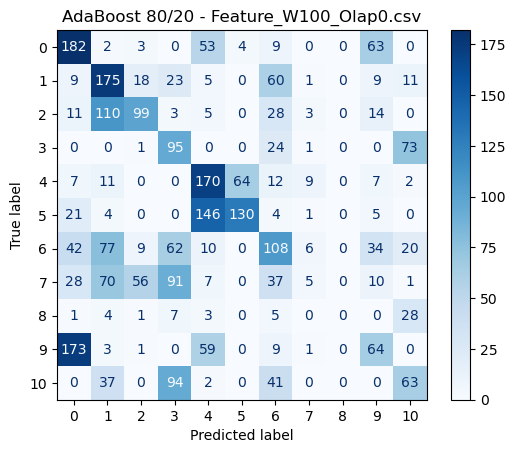

Fitting 5 folds for each of 9 candidates, totalling 45 fits
              precision    recall  f1-score   support

           0       0.41      0.64      0.50       474
           1       0.35      0.51      0.42       466
           2       0.59      0.27      0.37       409
           3       0.26      0.50      0.35       291
           4       0.45      0.70      0.55       422
           5       0.67      0.35      0.46       467
           6       0.34      0.24      0.28       551
           7       0.30      0.12      0.17       458
           8       0.00      0.00      0.00        73
           9       0.30      0.24      0.26       466
          10       0.32      0.37      0.35       356

    accuracy                           0.38      4433
   macro avg       0.36      0.36      0.34      4433
weighted avg       0.40      0.38      0.36      4433

Accuracy: 38.12%
Precision: 39.56%
Recall: 38.12%
F1 Score: 36.29%
ROC AUC: 82.91%


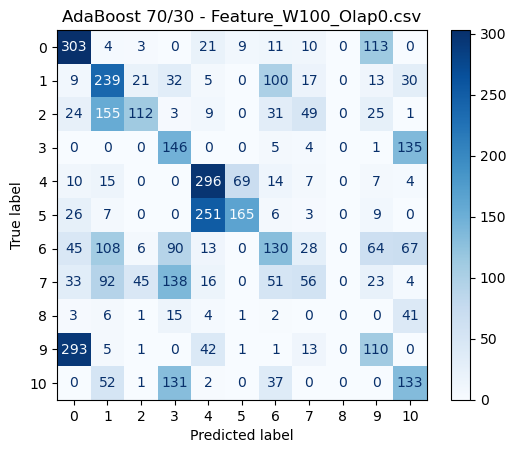

KFold Cross-Validation Scores (80/20 model): [0.36197564 0.36311337 0.38883249 0.39390863 0.31607445]
KFold Mean Accuracy (80/20 model): 36.48%
KFold Std Deviation (80/20 model): 0.0276

KFold Cross-Validation Scores (70/30 model): [0.36197564 0.36311337 0.38883249 0.39390863 0.31607445]
KFold Mean Accuracy (70/30 model): 36.48%
KFold Std Deviation (70/30 model): 0.0276
Processing file 2/10: Feature_W100_Olap50.csv

 AdaBoost on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W100_Olap50.csv...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
              precision    recall  f1-score   support

           0       0.36      0.79      0.49       631
           1       0.39      0.48      0.43       621
           2       0.58      0.29      0.39       545
           3       0.22      0.28      0.25       387
           4       0.33      0.66      0.44       562
           5       0.57      0.20      0.30       621
           6       0.39      0.35      0.37       73

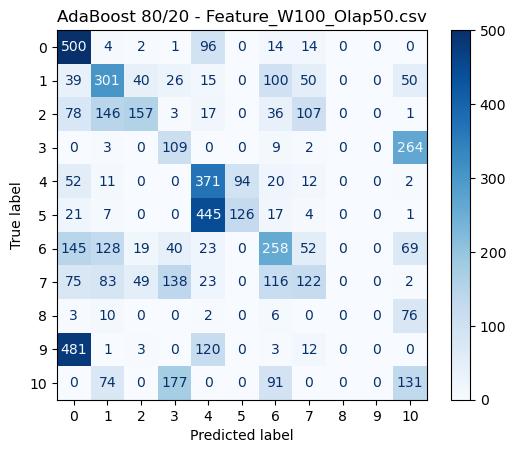

Fitting 5 folds for each of 9 candidates, totalling 45 fits
              precision    recall  f1-score   support

           0       0.36      0.73      0.49       946
           1       0.41      0.51      0.45       932
           2       0.53      0.38      0.44       817
           3       0.19      0.40      0.26       580
           4       0.38      0.67      0.49       843
           5       0.69      0.34      0.46       932
           6       0.34      0.35      0.35      1102
           7       0.27      0.02      0.03       912
           8       0.00      0.00      0.00       146
           9       0.56      0.12      0.20       929
          10       0.24      0.23      0.24       710

    accuracy                           0.37      8849
   macro avg       0.36      0.34      0.31      8849
weighted avg       0.40      0.37      0.34      8849

Accuracy: 36.86%
Precision: 40.02%
Recall: 36.86%
F1 Score: 33.74%
ROC AUC: 83.44%


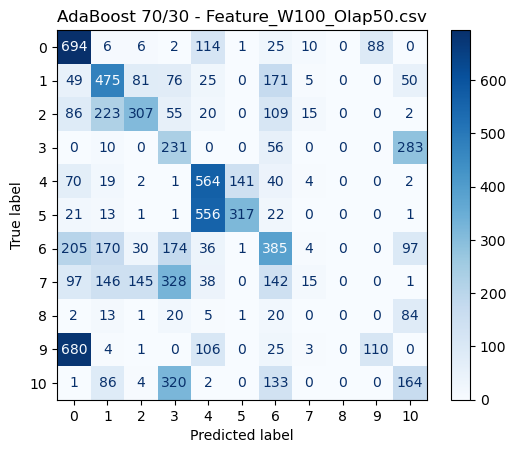

KFold Cross-Validation Scores (80/20 model): [0.37328361 0.3556535  0.36158671 0.34717749 0.3707408 ]
KFold Mean Accuracy (80/20 model): 36.17%
KFold Std Deviation (80/20 model): 0.0096

KFold Cross-Validation Scores (70/30 model): [0.37328361 0.3556535  0.36158671 0.34717749 0.3707408 ]
KFold Mean Accuracy (70/30 model): 36.17%
KFold Std Deviation (70/30 model): 0.0096
Processing file 3/10: Feature_W200_Olap0.csv

 AdaBoost on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W200_Olap0.csv...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
              precision    recall  f1-score   support

           0       0.43      0.68      0.53       157
           1       0.39      0.58      0.46       155
           2       0.45      0.32      0.38       136
           3       0.18      0.16      0.17        96
           4       0.32      0.59      0.41       140
           5       0.67      0.45      0.54       155
           6       0.38      0.52      0.44       183


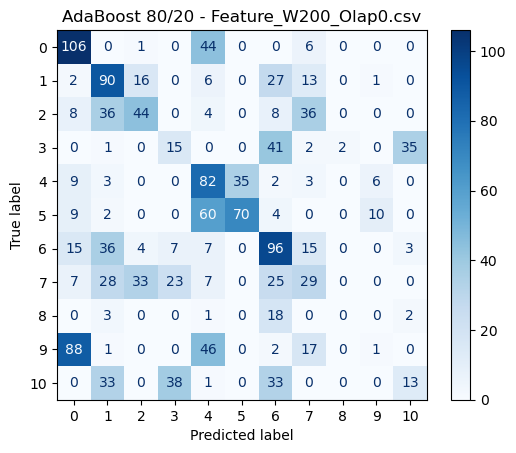

Fitting 5 folds for each of 9 candidates, totalling 45 fits
              precision    recall  f1-score   support

           0       0.37      0.67      0.47       236
           1       0.39      0.59      0.47       232
           2       0.51      0.44      0.47       204
           3       0.13      0.10      0.11       145
           4       0.37      0.77      0.50       210
           5       0.82      0.35      0.49       232
           6       0.32      0.49      0.39       275
           7       0.35      0.14      0.20       228
           8       0.00      0.00      0.00        36
           9       0.05      0.00      0.01       232
          10       0.32      0.10      0.15       177

    accuracy                           0.37      2207
   macro avg       0.33      0.33      0.30      2207
weighted avg       0.36      0.37      0.33      2207

Accuracy: 37.47%
Precision: 36.29%
Recall: 37.47%
F1 Score: 33.18%
ROC AUC: 84.15%


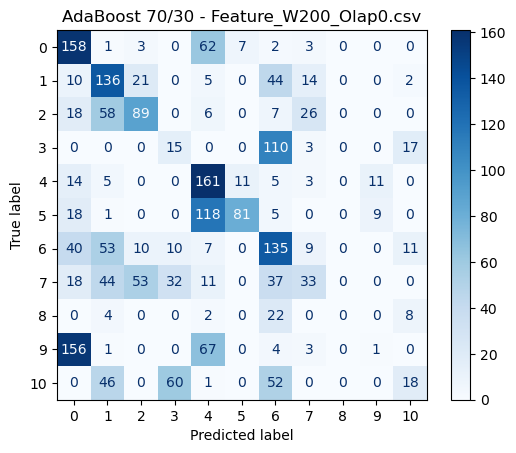

KFold Cross-Validation Scores (80/20 model): [0.36845683 0.36437797 0.32494901 0.3664174  0.3585034 ]
KFold Mean Accuracy (80/20 model): 35.65%
KFold Std Deviation (80/20 model): 0.0161

KFold Cross-Validation Scores (70/30 model): [0.36845683 0.36437797 0.32494901 0.3664174  0.3585034 ]
KFold Mean Accuracy (70/30 model): 35.65%
KFold Std Deviation (70/30 model): 0.0161
Processing file 4/10: Feature_W200_Olap50.csv

 AdaBoost on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W200_Olap50.csv...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
              precision    recall  f1-score   support

           0       0.38      0.65      0.48       313
           1       0.40      0.63      0.49       308
           2       0.57      0.27      0.37       271
           3       0.18      0.22      0.20       192
           4       0.34      0.87      0.49       279
           5       0.90      0.09      0.16       309
           6       0.40      0.30      0.35       36

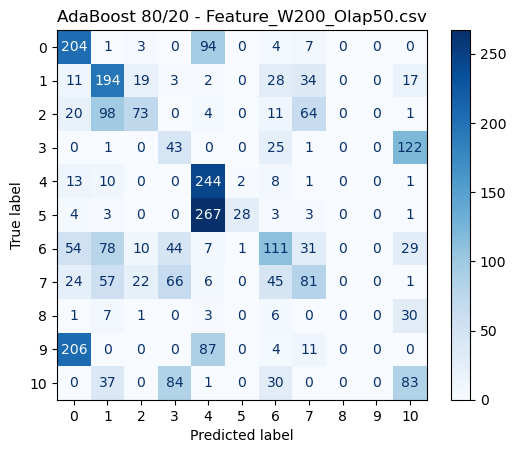

Fitting 5 folds for each of 9 candidates, totalling 45 fits
              precision    recall  f1-score   support

           0       0.37      0.59      0.46       470
           1       0.37      0.62      0.46       463
           2       0.56      0.15      0.23       406
           3       0.18      0.22      0.20       287
           4       0.33      0.86      0.48       419
           5       0.75      0.10      0.18       463
           6       0.44      0.34      0.38       548
           7       0.29      0.27      0.28       453
           8       0.00      0.00      0.00        72
           9       0.00      0.00      0.00       462
          10       0.25      0.28      0.26       352

    accuracy                           0.34      4395
   macro avg       0.32      0.31      0.27      4395
weighted avg       0.36      0.34      0.29      4395

Accuracy: 34.27%
Precision: 35.63%
Recall: 34.27%
F1 Score: 29.42%
ROC AUC: 84.47%


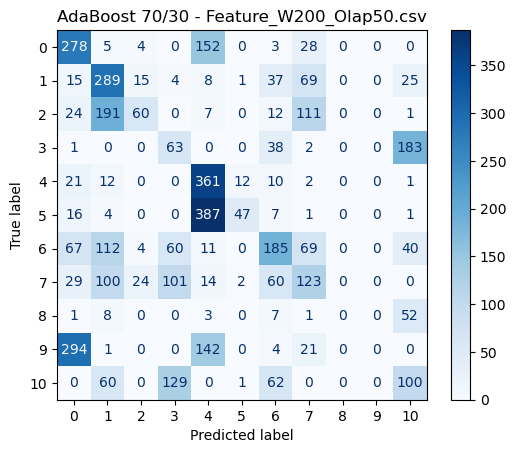

KFold Cross-Validation Scores (80/20 model): [0.36006826 0.35870307 0.36189826 0.36189826 0.38545579]
KFold Mean Accuracy (80/20 model): 36.56%
KFold Std Deviation (80/20 model): 0.0100

KFold Cross-Validation Scores (70/30 model): [0.36006826 0.35870307 0.36189826 0.36189826 0.38545579]
KFold Mean Accuracy (70/30 model): 36.56%
KFold Std Deviation (70/30 model): 0.0100
Processing file 5/10: Feature_W300_Olap0.csv

 AdaBoost on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W300_Olap0.csv...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
              precision    recall  f1-score   support

           0       0.58      0.14      0.23       105
           1       0.35      0.76      0.48       103
           2       0.50      0.09      0.15        90
           3       0.52      0.23      0.32        64
           4       0.40      0.25      0.30        93
           5       0.30      0.79      0.44       102
           6       0.39      0.58      0.47       122


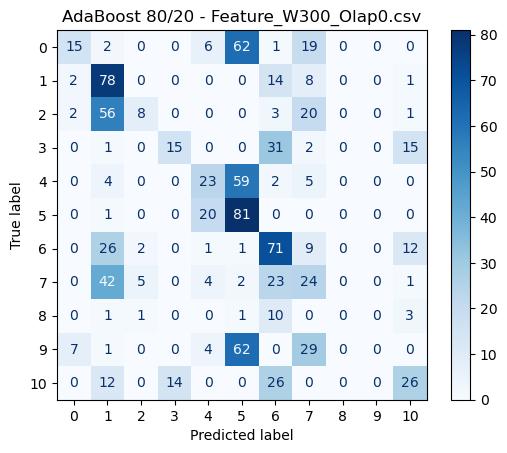

Fitting 5 folds for each of 9 candidates, totalling 45 fits
              precision    recall  f1-score   support

           0       0.80      0.15      0.26       157
           1       0.35      0.68      0.46       154
           2       0.45      0.11      0.18       135
           3       0.00      0.00      0.00        96
           4       0.46      0.36      0.40       139
           5       0.50      0.41      0.45       154
           6       0.36      0.77      0.49       183
           7       0.19      0.19      0.19       151
           8       0.00      0.00      0.00        24
           9       0.33      0.59      0.42       155
          10       0.06      0.03      0.04       117

    accuracy                           0.35      1465
   macro avg       0.32      0.30      0.26      1465
weighted avg       0.36      0.35      0.31      1465

Accuracy: 35.43%
Precision: 36.47%
Recall: 35.43%
F1 Score: 30.61%
ROC AUC: 85.69%


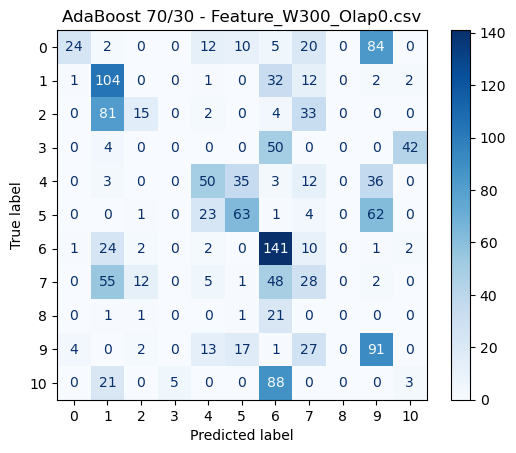

KFold Cross-Validation Scores (80/20 model): [0.34595701 0.32958035 0.25383828 0.38627049 0.30840164]
KFold Mean Accuracy (80/20 model): 32.48%
KFold Std Deviation (80/20 model): 0.0437

KFold Cross-Validation Scores (70/30 model): [0.34595701 0.32958035 0.25383828 0.38627049 0.30840164]
KFold Mean Accuracy (70/30 model): 32.48%
KFold Std Deviation (70/30 model): 0.0437
Processing file 6/10: Feature_W300_Olap50.csv

 AdaBoost on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W300_Olap50.csv...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
              precision    recall  f1-score   support

           0       0.37      0.36      0.37       208
           1       0.40      0.62      0.49       205
           2       0.45      0.37      0.41       179
           3       0.00      0.00      0.00       127
           4       0.34      0.83      0.48       185
           5       0.84      0.21      0.33       204
           6       0.29      0.61      0.40       24

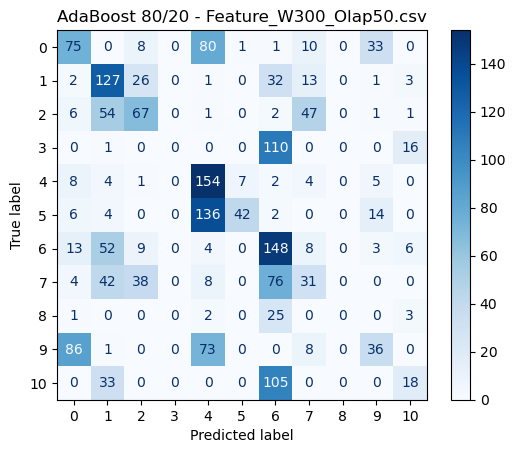

Fitting 5 folds for each of 9 candidates, totalling 45 fits
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       312
           1       0.41      0.50      0.45       307
           2       0.54      0.44      0.48       269
           3       0.25      0.15      0.19       190
           4       0.25      0.02      0.04       278
           5       0.22      0.02      0.04       307
           6       0.34      0.62      0.44       364
           7       0.35      0.22      0.27       299
           8       0.00      0.00      0.00        46
           9       0.24      0.97      0.38       307
          10       0.78      0.11      0.19       233

    accuracy                           0.32      2912
   macro avg       0.31      0.28      0.23      2912
weighted avg       0.32      0.32      0.25      2912

Accuracy: 31.87%
Precision: 32.25%
Recall: 31.87%
F1 Score: 25.00%
ROC AUC: 84.70%


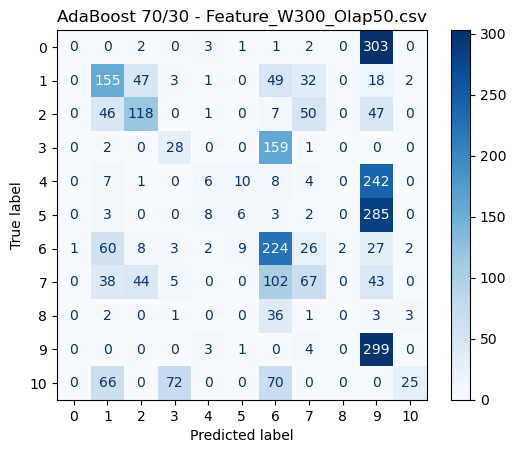

KFold Cross-Validation Scores (80/20 model): [0.35394127 0.39052035 0.3122102  0.33127254 0.33642452]
KFold Mean Accuracy (80/20 model): 34.49%
KFold Std Deviation (80/20 model): 0.0264

KFold Cross-Validation Scores (70/30 model): [0.3755796  0.42555384 0.36012365 0.35291087 0.35239567]
KFold Mean Accuracy (70/30 model): 37.33%
KFold Std Deviation (70/30 model): 0.0274
Processing file 7/10: Feature_W400_Olap0.csv

 AdaBoost on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W400_Olap0.csv...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        78
           1       0.34      0.52      0.41        77
           2       0.35      0.30      0.32        67
           3       0.00      0.00      0.00        48
           4       0.33      0.49      0.40        69
           5       0.00      0.00      0.00        77
           6       0.36      0.80      0.49        91


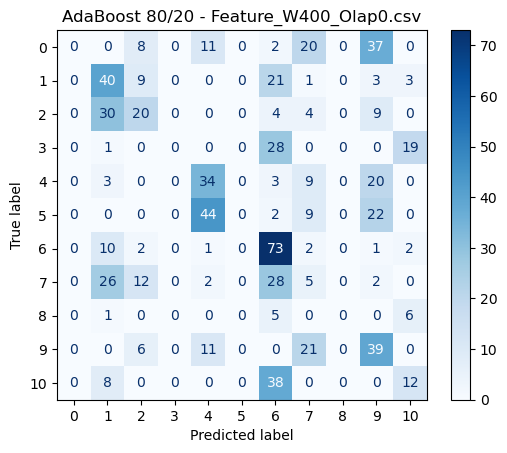

Fitting 5 folds for each of 9 candidates, totalling 45 fits
              precision    recall  f1-score   support

           0       0.25      0.92      0.40       117
           1       0.52      0.12      0.20       115
           2       0.37      0.75      0.50       101
           3       0.00      0.00      0.00        72
           4       0.43      0.03      0.05       104
           5       0.33      0.01      0.02       115
           6       0.28      0.87      0.43       136
           7       0.00      0.00      0.00       113
           8       0.00      0.00      0.00        18
           9       0.00      0.00      0.00       115
          10       0.00      0.00      0.00        88

    accuracy                           0.29      1094
   macro avg       0.20      0.25      0.14      1094
weighted avg       0.23      0.29      0.17      1094

Accuracy: 29.25%
Precision: 22.70%
Recall: 29.25%
F1 Score: 16.93%
ROC AUC: 83.61%


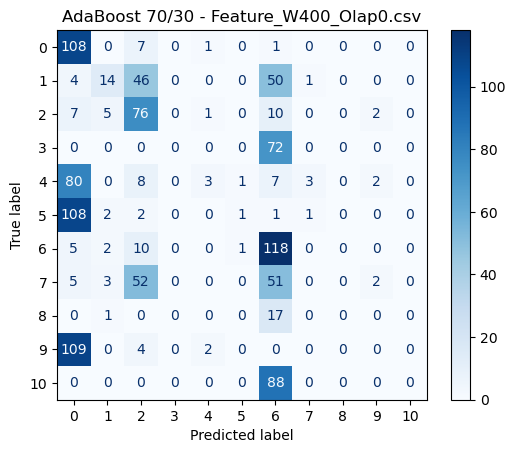

KFold Cross-Validation Scores (80/20 model): [0.33196159 0.30727023 0.27572016 0.29218107 0.31318681]
KFold Mean Accuracy (80/20 model): 30.41%
KFold Std Deviation (80/20 model): 0.0191

KFold Cross-Validation Scores (70/30 model): [0.2702332  0.27297668 0.31001372 0.28395062 0.27197802]
KFold Mean Accuracy (70/30 model): 28.18%
KFold Std Deviation (70/30 model): 0.0149
Processing file 8/10: Feature_W400_Olap50.csv

 AdaBoost on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W400_Olap50.csv...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       155
           1       0.38      0.65      0.48       152
           2       0.27      0.25      0.26       134
           3       0.00      0.00      0.00        94
           4       0.33      0.58      0.42       138
           5       0.50      0.01      0.01       152
           6       0.33      0.73      0.45       18

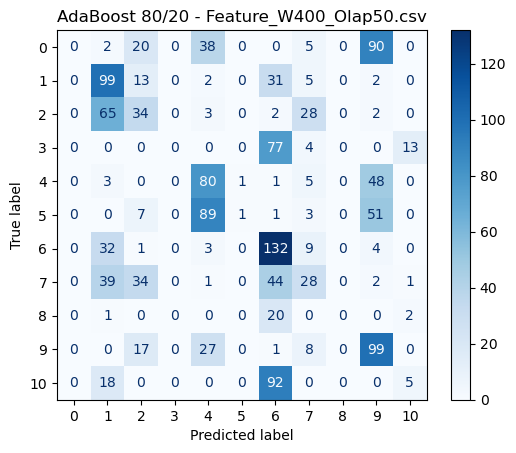

Fitting 5 folds for each of 9 candidates, totalling 45 fits
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       233
           1       0.39      0.67      0.49       228
           2       0.25      0.22      0.23       200
           3       0.00      0.00      0.00       141
           4       0.32      0.41      0.36       207
           5       0.43      0.01      0.03       229
           6       0.32      0.71      0.44       271
           7       0.27      0.25      0.26       223
           8       0.00      0.00      0.00        35
           9       0.30      0.66      0.41       228
          10       0.72      0.08      0.14       173

    accuracy                           0.32      2168
   macro avg       0.27      0.27      0.21      2168
weighted avg       0.30      0.32      0.25      2168

Accuracy: 32.06%
Precision: 29.65%
Recall: 32.06%
F1 Score: 24.59%
ROC AUC: 87.05%


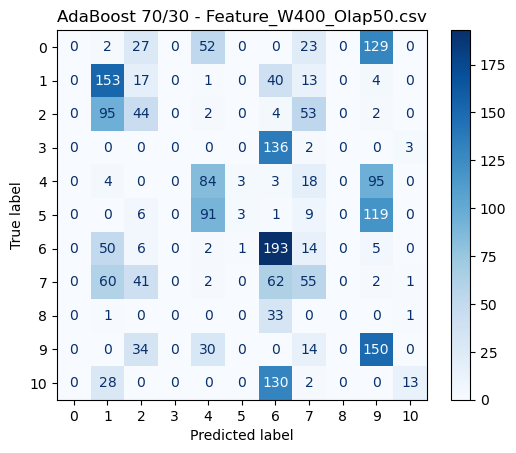

KFold Cross-Validation Scores (80/20 model): [0.34394464 0.27474048 0.31764706 0.29896194 0.37716263]
KFold Mean Accuracy (80/20 model): 32.25%
KFold Std Deviation (80/20 model): 0.0355

KFold Cross-Validation Scores (70/30 model): [0.34394464 0.27474048 0.31764706 0.29896194 0.37716263]
KFold Mean Accuracy (70/30 model): 32.25%
KFold Std Deviation (70/30 model): 0.0355
Processing file 9/10: Feature_W500_Olap0.csv

 AdaBoost on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W500_Olap0.csv...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
              precision    recall  f1-score   support

           0       0.34      0.35      0.35        62
           1       0.40      0.75      0.52        61
           2       0.32      0.39      0.35        54
           3       0.00      0.00      0.00        38
           4       0.30      0.59      0.40        56
           5       1.00      0.02      0.03        61
           6       0.38      0.71      0.50        73


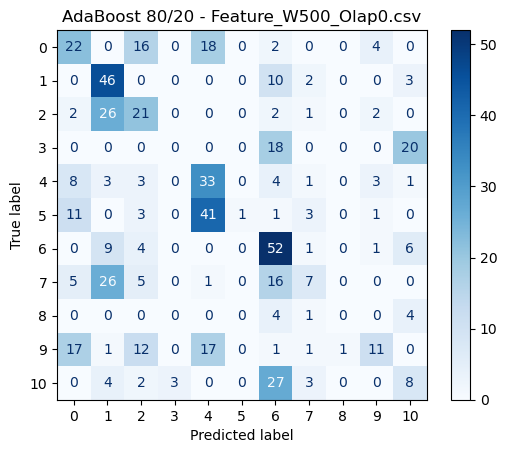

Fitting 5 folds for each of 9 candidates, totalling 45 fits
              precision    recall  f1-score   support

           0       0.25      0.94      0.40        93
           1       0.47      0.28      0.35        92
           2       0.28      0.72      0.40        81
           3       0.00      0.00      0.00        56
           4       0.33      0.01      0.02        84
           5       0.00      0.00      0.00        92
           6       0.51      0.38      0.43       109
           7       0.33      0.02      0.04        90
           8       0.00      0.00      0.00        14
           9       0.00      0.00      0.00        92
          10       0.30      0.76      0.43        70

    accuracy                           0.31       873
   macro avg       0.23      0.28      0.19       873
weighted avg       0.26      0.31      0.21       873

Accuracy: 30.70%
Precision: 25.67%
Recall: 30.70%
F1 Score: 21.22%
ROC AUC: 59.14%


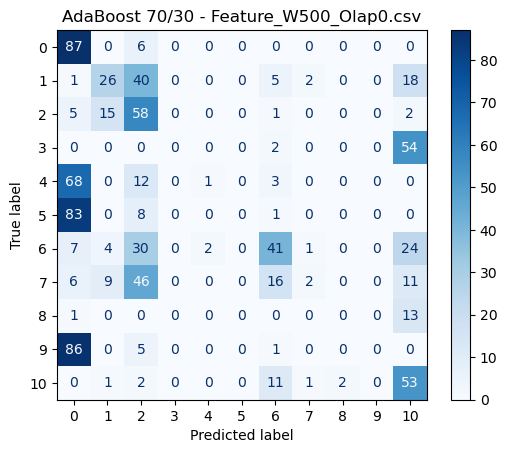

KFold Cross-Validation Scores (80/20 model): [0.28865979 0.25945017 0.28055077 0.30464716 0.22203098]
KFold Mean Accuracy (80/20 model): 27.11%
KFold Std Deviation (80/20 model): 0.0285

KFold Cross-Validation Scores (70/30 model): [0.23195876 0.28006873 0.23752151 0.26333907 0.31325301]
KFold Mean Accuracy (70/30 model): 26.52%
KFold Std Deviation (70/30 model): 0.0297
Processing file 10/10: Feature_W500_Olap50.csv

 AdaBoost on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W500_Olap50.csv...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
              precision    recall  f1-score   support

           0       0.67      0.02      0.03       124
           1       0.39      0.50      0.44       121
           2       0.33      0.24      0.27       106
           3       0.00      0.00      0.00        74
           4       0.32      0.27      0.30       110
           5       0.35      0.50      0.41       121
           6       0.47      0.79      0.59       1

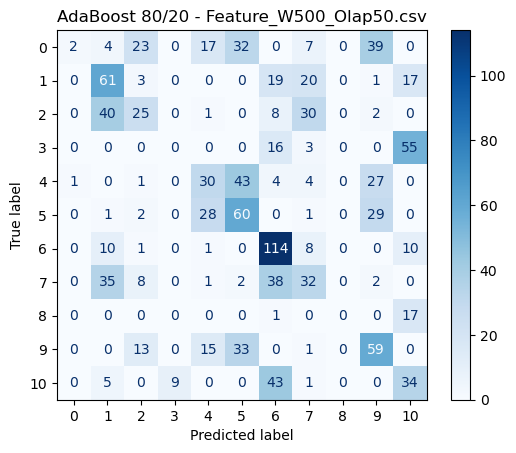

Fitting 5 folds for each of 9 candidates, totalling 45 fits
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       185
           1       0.34      0.47      0.39       182
           2       0.42      0.50      0.45       159
           3       0.00      0.00      0.00       111
           4       0.41      0.29      0.34       165
           5       0.55      0.29      0.38       182
           6       0.57      0.64      0.61       216
           7       0.38      0.20      0.26       177
           8       1.00      0.04      0.07        27
           9       0.31      0.77      0.45       182
          10       0.44      0.90      0.59       138

    accuracy                           0.41      1724
   macro avg       0.40      0.37      0.32      1724
weighted avg       0.37      0.41      0.35      1724

Accuracy: 40.89%
Precision: 36.58%
Recall: 40.89%
F1 Score: 35.40%
ROC AUC: 87.99%


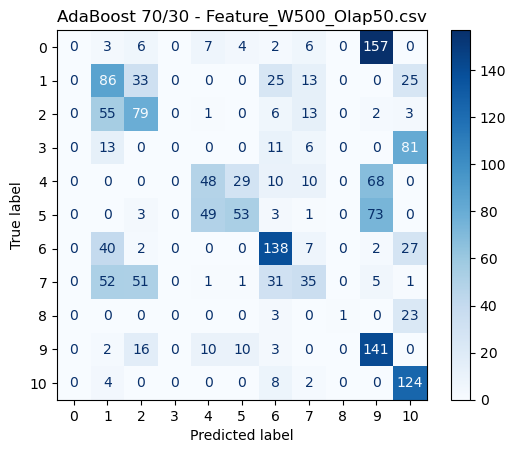

KFold Cross-Validation Scores (80/20 model): [0.33333333 0.36553525 0.30722367 0.37859008 0.32752613]
KFold Mean Accuracy (80/20 model): 34.24%
KFold Std Deviation (80/20 model): 0.0260

KFold Cross-Validation Scores (70/30 model): [0.33333333 0.36553525 0.30722367 0.37859008 0.32752613]
KFold Mean Accuracy (70/30 model): 34.24%
KFold Std Deviation (70/30 model): 0.0260

Final Results:


,Feature File,Model,Split,Accuracy,Precision,Recall,F1-Score,ROC_AUC,CV Mean Accuracy,CV Std Accuracy,Best Params
0,Feature_W100_Olap0.csv,AdaBoost,80/20,0.369080,0.365082,0.369080,0.344581,0.829991,0.364781,0.027604,"{'n_estimators': 200, 'learning_rate': 0.1}"
1,Feature_W100_Olap0.csv,AdaBoost,70/30,0.381232,0.395577,0.381232,0.362855,0.829085,0.364781,0.027604,"{'n_estimators': 200, 'learning_rate': 0.1}"
2,Feature_W100_Olap50.csv,AdaBoost,80/20,0.351755,0.338971,0.351755,0.315016,0.831952,0.361688,0.009627,"{'n_estimators': 200, 'learning_rate': 0.1}"
3,Feature_W100_Olap50.csv,AdaBoost,70/30,0.368629,0.400208,0.368629,0.337375,0.834413,0.361688,0.009627,"{'n_estimators': 200, 'learning_rate': 0.1}"
4,Feature_W200_Olap0.csv,AdaBoost,80/20,0.371176,0.337815,0.371176,0.336749,0.845870,0.356541,0.016142,"{'n_estimators': 200, 'learning_rate': 0.1}"
5,Feature_W200_Olap0.csv,AdaBoost,70/30,0.374717,0.362881,0.374717,0.331800,0.841525,0.356541,0.016142,"{'n_estimators': 200, 'learning_rate': 0.1}"
6,Feature_W200_Olap50.csv,AdaBoost,80/20,0.362116,0.384255,0.362116,0.313678,0.848784,0.365605,0.009998,"{'n_estimators': 200, 'learning_rate': 0.1}"
7,Feature_W200_Olap50.csv,AdaBoost,70/30,0.342662,0.356260,0.342662,0.294226,0.844720,0.365605,0.009998,"{'n_estimators': 200, 'learning_rate': 0.1}"
8,Feature_W300_Olap0.csv,AdaBoost,80/20,0.349028,0.353511,0.349028,0.296342,0.854136,0.324810,0.043712,"{'n_estimators': 200, 'learning_rate': 0.1}"
9,Feature_W300_Olap0.csv,AdaBoost,70/30,0.354266,0.364744,0.354266,0.306051,0.856944,0.324810,0.043712,"{'n_estimators': 200, 'learning_rate': 0.1}"


In [6]:
ada_params = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1]
}

ada_results = []

# for file_path in fileList:
for i, file_path in enumerate(fileList):
    print(f"Processing file {i+1}/{len(fileList)}: {os.path.basename(file_path)}")
    print(f"\n AdaBoost on {file_path}...")

    df = pd.read_csv(file_path)
    X = df.drop(columns=['exp_Name'])
    y = df['exp_Name']
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # 80/20 Split
    X_train_80, X_test_20, y_train_80, y_test_20 = train_test_split(
        X_scaled, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
    )

    ada_80 = AdaBoostClassifier(random_state=42)
    ada_search_80 = RandomizedSearchCV(
        ada_80, param_distributions=ada_params, n_iter=10, cv=5,
        random_state=42, verbose=2, n_jobs=-1
    )
    ada_search_80.fit(X_train_80, y_train_80)
    best_ada_80 = ada_search_80.best_estimator_

    acc80, prec80, rec80, f180, roc_auc80 = evaluate_model(best_ada_80, X_test_20, y_test_20)
    plot_confusion(best_ada_80, X_test_20, y_test_20, title=f"AdaBoost 80/20 - {os.path.basename(file_path)}")

    # 70/30 Split
    X_train_70, X_test_30, y_train_70, y_test_30 = train_test_split(
        X_scaled, y_encoded, test_size=0.3, random_state=42, stratify=y_encoded
    )

    ada_70 = AdaBoostClassifier(random_state=42)
    ada_search_70 = RandomizedSearchCV(
        ada_70, param_distributions=ada_params, n_iter=10, cv=5,
        random_state=42, verbose=2, n_jobs=-1
    )
    ada_search_70.fit(X_train_70, y_train_70)
    best_ada_70 = ada_search_70.best_estimator_

    acc70, prec70, rec70, f170, roc_auc70 = evaluate_model(best_ada_70, X_test_30, y_test_30)
    plot_confusion(best_ada_70, X_test_30, y_test_30, title=f"AdaBoost 70/30 - {os.path.basename(file_path)}")

    # KFold Cross-validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    # For 80/20
    kf_scores_80 = cross_val_score(best_ada_80, X_scaled, y_encoded, cv=kf, scoring='accuracy', n_jobs=-1)
    print("KFold Cross-Validation Scores (80/20 model):", kf_scores_80)
    print("KFold Mean Accuracy (80/20 model): {:.2f}%".format(kf_scores_80.mean() * 100))
    print("KFold Std Deviation (80/20 model): {:.4f}".format(kf_scores_80.std()))

    # For 70/30
    kf_scores_70 = cross_val_score(best_ada_70, X_scaled, y_encoded, cv=kf, scoring='accuracy', n_jobs=-1)
    print("\nKFold Cross-Validation Scores (70/30 model):", kf_scores_70)
    print("KFold Mean Accuracy (70/30 model): {:.2f}%".format(kf_scores_70.mean() * 100))
    print("KFold Std Deviation (70/30 model): {:.4f}".format(kf_scores_70.std()))

    # Save results
    ada_results.append([
        os.path.basename(file_path), "AdaBoost", "80/20", acc80, prec80, rec80, f180, roc_auc80,
        kf_scores_80.mean(), kf_scores_80.std(), ada_search_80.best_params_
    ])
    ada_results.append([
        os.path.basename(file_path), "AdaBoost", "70/30", acc70, prec70, rec70, f170, roc_auc70,
        kf_scores_70.mean(), kf_scores_70.std(), ada_search_70.best_params_
    ])

# Create final dataframe
ada_results_df = pd.DataFrame(
    ada_results,
    columns=[
        "Feature File", "Model", "Split", "Accuracy", "Precision", "Recall", "F1-Score", "ROC_AUC",
        "CV Mean Accuracy", "CV Std Accuracy", "Best Params"
    ]
)

# Save results to CSV
ada_results_df.to_csv('results_adaboost.csv', index=False)

# Display results
print("\nFinal Results:")
display(ada_results_df)

### Gradient Boosting (K-Fold)

Processing file 1/10: Feature_W100_Olap0.csv

 Gradient Boosting on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W100_Olap0.csv...

Running RandomizedSearchCV for GradientBoosting on first file...
Fitting 5 folds for each of 5 candidates, totalling 25 fits

Best Hyperparameters Found: {'n_estimators': 100, 'max_depth': 5, 'learning_rate': 0.1}
              precision    recall  f1-score   support

           0       0.76      0.81      0.79       316
           1       0.50      0.54      0.52       311
           2       0.61      0.65      0.63       273
           3       0.86      0.85      0.85       194
           4       0.84      0.84      0.84       282
           5       0.91      0.90      0.91       311
           6       0.62      0.58      0.60       368
           7       0.68      0.60      0.64       305
           8       0.51      0.37      0.43        49
           9       0.84      0.85      0.85       310
          10       0.82      0.85      0.84    

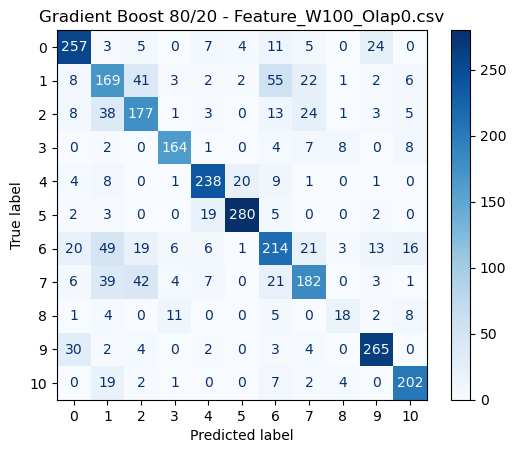

              precision    recall  f1-score   support

           0       0.78      0.79      0.79       474
           1       0.54      0.55      0.54       466
           2       0.59      0.67      0.63       409
           3       0.85      0.86      0.86       291
           4       0.79      0.84      0.81       422
           5       0.90      0.89      0.89       467
           6       0.61      0.61      0.61       551
           7       0.69      0.56      0.62       458
           8       0.57      0.38      0.46        73
           9       0.84      0.88      0.86       466
          10       0.83      0.83      0.83       356

    accuracy                           0.73      4433
   macro avg       0.73      0.71      0.72      4433
weighted avg       0.73      0.73      0.73      4433

Accuracy: 73.31%
Precision: 73.27%
Recall: 73.31%
F1 Score: 73.16%
ROC AUC: 96.12%


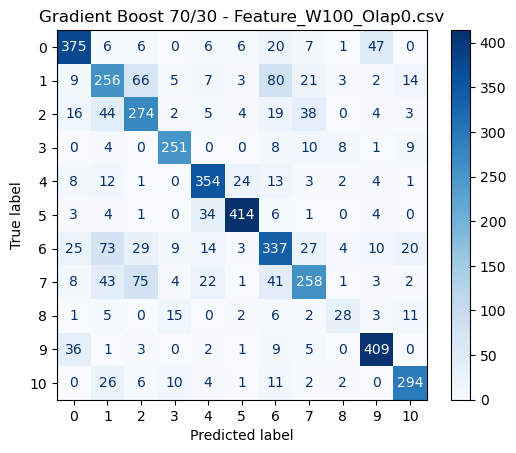

KFold Cross-Validation Scores (80/20 model): [0.74560217 0.73502538 0.72419628 0.74551607 0.7323181 ]
KFold Mean Accuracy (80/20 model): 73.65%
KFold Std Deviation (80/20 model): 0.0082

KFold Cross-Validation Scores (70/30 model): [0.74560217 0.73502538 0.72419628 0.74551607 0.7323181 ]
KFold Mean Accuracy (70/30 model): 73.65%
KFold Std Deviation (70/30 model): 0.0082
Processing file 2/10: Feature_W100_Olap50.csv

 Gradient Boosting on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W100_Olap50.csv...
              precision    recall  f1-score   support

           0       0.83      0.84      0.83       631
           1       0.57      0.60      0.59       621
           2       0.67      0.69      0.68       545
           3       0.88      0.86      0.87       387
           4       0.86      0.83      0.85       562
           5       0.91      0.92      0.91       621
           6       0.69      0.67      0.68       734
           7       0.72      0.68      0.70      

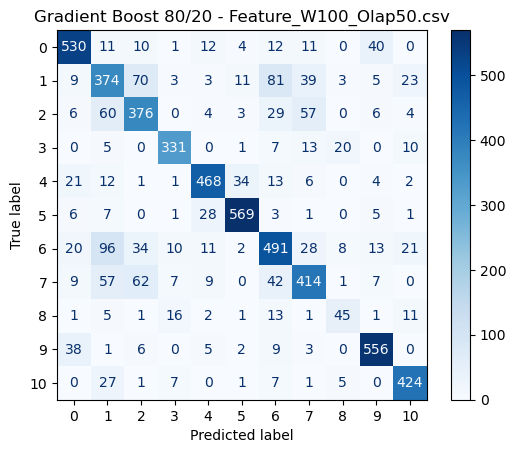

              precision    recall  f1-score   support

           0       0.82      0.85      0.84       946
           1       0.57      0.61      0.59       932
           2       0.67      0.69      0.68       817
           3       0.89      0.85      0.87       580
           4       0.84      0.83      0.84       843
           5       0.91      0.91      0.91       932
           6       0.69      0.67      0.68      1102
           7       0.72      0.67      0.69       912
           8       0.57      0.49      0.53       146
           9       0.87      0.89      0.88       929
          10       0.85      0.88      0.86       710

    accuracy                           0.77      8849
   macro avg       0.76      0.76      0.76      8849
weighted avg       0.77      0.77      0.77      8849

Accuracy: 77.26%
Precision: 77.31%
Recall: 77.26%
F1 Score: 77.25%
ROC AUC: 97.26%


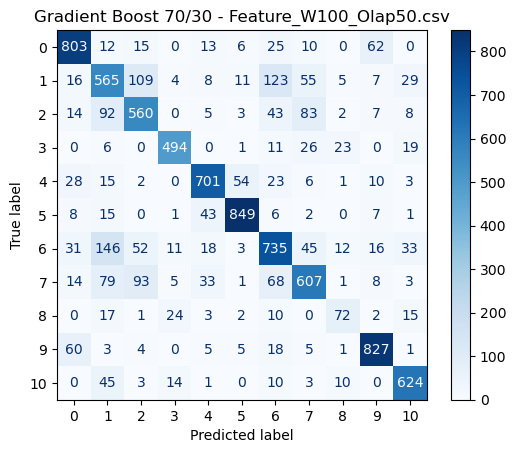

KFold Cross-Validation Scores (80/20 model): [0.77504662 0.7765723  0.7748771  0.77521614 0.78640448]
KFold Mean Accuracy (80/20 model): 77.76%
KFold Std Deviation (80/20 model): 0.0044

KFold Cross-Validation Scores (70/30 model): [0.77504662 0.7765723  0.7748771  0.77521614 0.78640448]
KFold Mean Accuracy (70/30 model): 77.76%
KFold Std Deviation (70/30 model): 0.0044
Processing file 3/10: Feature_W200_Olap0.csv

 Gradient Boosting on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W200_Olap0.csv...
              precision    recall  f1-score   support

           0       0.80      0.78      0.79       157
           1       0.57      0.62      0.59       155
           2       0.58      0.62      0.60       136
           3       0.84      0.80      0.82        96
           4       0.79      0.81      0.80       140
           5       0.88      0.89      0.89       155
           6       0.73      0.71      0.72       183
           7       0.69      0.63      0.66       1

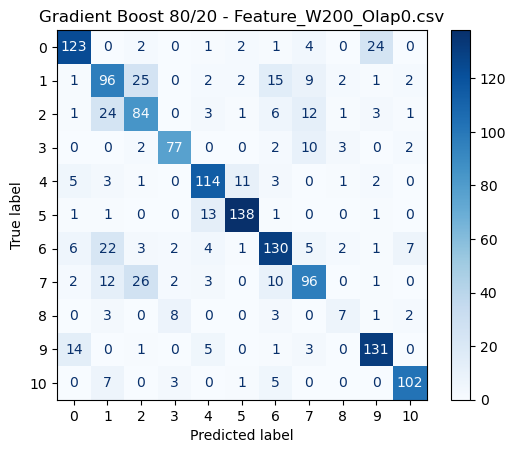

              precision    recall  f1-score   support

           0       0.80      0.77      0.79       236
           1       0.53      0.59      0.56       232
           2       0.61      0.65      0.63       204
           3       0.88      0.82      0.85       145
           4       0.79      0.78      0.79       210
           5       0.84      0.91      0.88       232
           6       0.72      0.69      0.71       275
           7       0.68      0.62      0.65       228
           8       0.48      0.33      0.39        36
           9       0.81      0.85      0.83       232
          10       0.88      0.87      0.87       177

    accuracy                           0.74      2207
   macro avg       0.73      0.72      0.72      2207
weighted avg       0.74      0.74      0.74      2207

Accuracy: 74.22%
Precision: 74.32%
Recall: 74.22%
F1 Score: 74.18%
ROC AUC: 96.29%


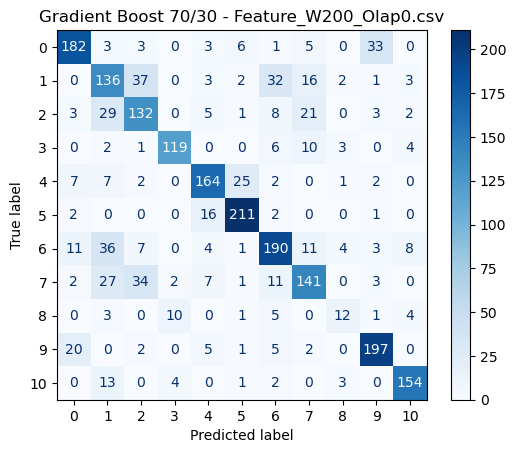

KFold Cross-Validation Scores (80/20 model): [0.75118967 0.74303195 0.75662814 0.76410605 0.7585034 ]
KFold Mean Accuracy (80/20 model): 75.47%
KFold Std Deviation (80/20 model): 0.0071

KFold Cross-Validation Scores (70/30 model): [0.75118967 0.74303195 0.75662814 0.76410605 0.7585034 ]
KFold Mean Accuracy (70/30 model): 75.47%
KFold Std Deviation (70/30 model): 0.0071
Processing file 4/10: Feature_W200_Olap50.csv

 Gradient Boosting on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W200_Olap50.csv...
              precision    recall  f1-score   support

           0       0.83      0.85      0.84       313
           1       0.65      0.71      0.68       308
           2       0.72      0.72      0.72       271
           3       0.91      0.89      0.90       192
           4       0.85      0.87      0.86       279
           5       0.89      0.92      0.90       309
           6       0.78      0.75      0.77       365
           7       0.76      0.73      0.74      

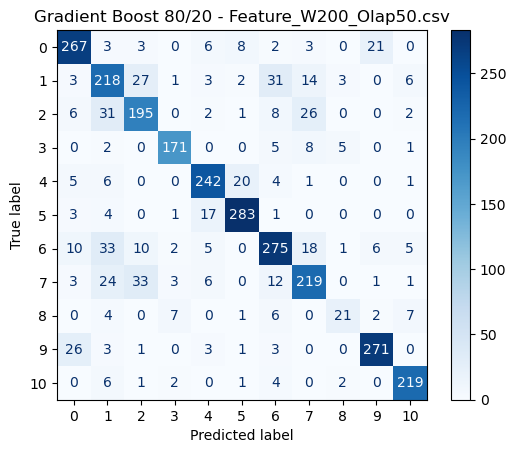

              precision    recall  f1-score   support

           0       0.85      0.83      0.84       470
           1       0.63      0.69      0.65       463
           2       0.70      0.71      0.71       406
           3       0.92      0.89      0.90       287
           4       0.85      0.86      0.85       419
           5       0.89      0.90      0.89       463
           6       0.74      0.72      0.73       548
           7       0.76      0.72      0.74       453
           8       0.68      0.54      0.60        72
           9       0.87      0.89      0.88       462
          10       0.90      0.90      0.90       352

    accuracy                           0.80      4395
   macro avg       0.80      0.79      0.79      4395
weighted avg       0.80      0.80      0.80      4395

Accuracy: 80.09%
Precision: 80.19%
Recall: 80.09%
F1 Score: 80.10%
ROC AUC: 97.90%


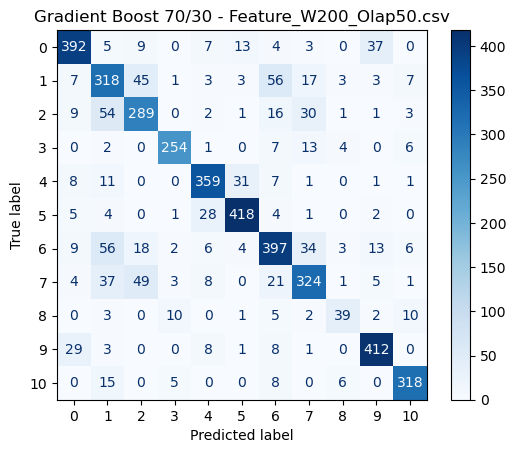

KFold Cross-Validation Scores (80/20 model): [0.8112628  0.80238908 0.79754182 0.8197337  0.79788324]
KFold Mean Accuracy (80/20 model): 80.58%
KFold Std Deviation (80/20 model): 0.0086

KFold Cross-Validation Scores (70/30 model): [0.8112628  0.80238908 0.79754182 0.8197337  0.79788324]
KFold Mean Accuracy (70/30 model): 80.58%
KFold Std Deviation (70/30 model): 0.0086
Processing file 5/10: Feature_W300_Olap0.csv

 Gradient Boosting on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W300_Olap0.csv...
              precision    recall  f1-score   support

           0       0.75      0.87      0.80       105
           1       0.57      0.68      0.62       103
           2       0.67      0.73      0.70        90
           3       0.89      0.88      0.88        64
           4       0.82      0.84      0.83        93
           5       0.91      0.92      0.92       102
           6       0.77      0.76      0.77       122
           7       0.69      0.54      0.61       1

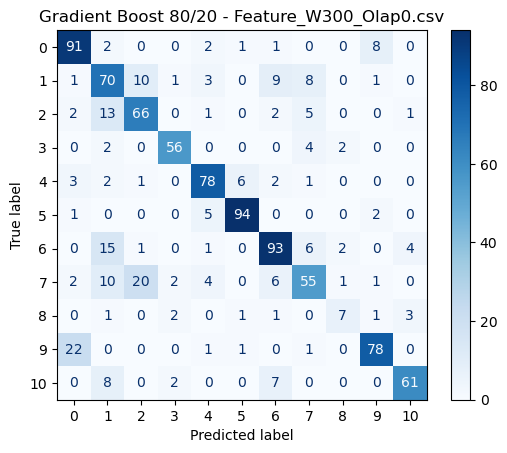

              precision    recall  f1-score   support

           0       0.80      0.86      0.83       157
           1       0.58      0.68      0.62       154
           2       0.66      0.67      0.67       135
           3       0.92      0.84      0.88        96
           4       0.80      0.79      0.80       139
           5       0.86      0.91      0.89       154
           6       0.74      0.72      0.73       183
           7       0.69      0.62      0.65       151
           8       0.65      0.46      0.54        24
           9       0.87      0.85      0.86       155
          10       0.86      0.81      0.83       117

    accuracy                           0.77      1465
   macro avg       0.77      0.75      0.75      1465
weighted avg       0.77      0.77      0.77      1465

Accuracy: 76.72%
Precision: 76.98%
Recall: 76.72%
F1 Score: 76.73%
ROC AUC: 96.53%


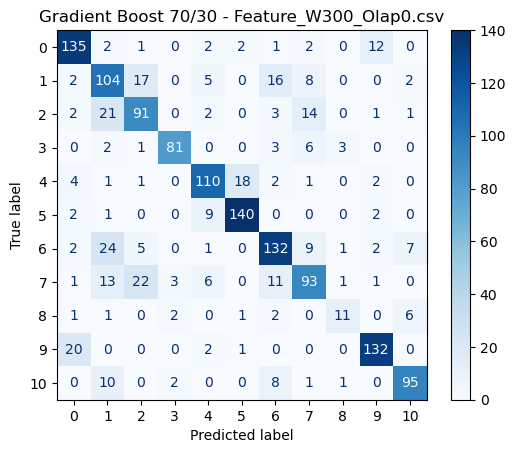

KFold Cross-Validation Scores (80/20 model): [0.7727738  0.76970317 0.75127943 0.76434426 0.77561475]
KFold Mean Accuracy (80/20 model): 76.67%
KFold Std Deviation (80/20 model): 0.0086

KFold Cross-Validation Scores (70/30 model): [0.7727738  0.76970317 0.75127943 0.76434426 0.77561475]
KFold Mean Accuracy (70/30 model): 76.67%
KFold Std Deviation (70/30 model): 0.0086
Processing file 6/10: Feature_W300_Olap50.csv

 Gradient Boosting on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W300_Olap50.csv...
              precision    recall  f1-score   support

           0       0.85      0.87      0.86       208
           1       0.69      0.76      0.72       205
           2       0.73      0.74      0.74       179
           3       0.93      0.91      0.92       127
           4       0.88      0.87      0.88       185
           5       0.92      0.94      0.93       204
           6       0.79      0.75      0.77       243
           7       0.81      0.77      0.79      

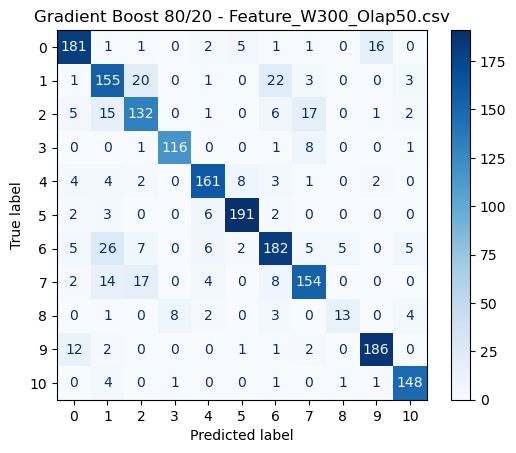

              precision    recall  f1-score   support

           0       0.84      0.88      0.86       312
           1       0.67      0.79      0.73       307
           2       0.75      0.74      0.74       269
           3       0.90      0.91      0.91       190
           4       0.87      0.86      0.86       278
           5       0.93      0.91      0.92       307
           6       0.81      0.75      0.78       364
           7       0.78      0.73      0.75       299
           8       0.70      0.35      0.46        46
           9       0.89      0.90      0.89       307
          10       0.92      0.92      0.92       233

    accuracy                           0.83      2912
   macro avg       0.82      0.79      0.80      2912
weighted avg       0.83      0.83      0.83      2912

Accuracy: 82.66%
Precision: 82.84%
Recall: 82.66%
F1 Score: 82.56%
ROC AUC: 98.33%


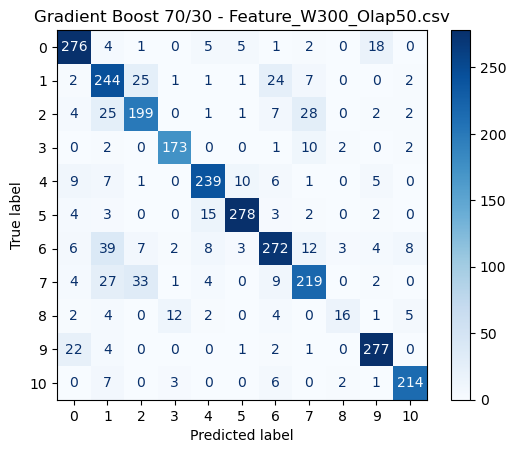

KFold Cross-Validation Scores (80/20 model): [0.83513653 0.83204534 0.82792375 0.82586296 0.83204534]
KFold Mean Accuracy (80/20 model): 83.06%
KFold Std Deviation (80/20 model): 0.0033

KFold Cross-Validation Scores (70/30 model): [0.83513653 0.83204534 0.82792375 0.82586296 0.83204534]
KFold Mean Accuracy (70/30 model): 83.06%
KFold Std Deviation (70/30 model): 0.0033
Processing file 7/10: Feature_W400_Olap0.csv

 Gradient Boosting on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W400_Olap0.csv...
              precision    recall  f1-score   support

           0       0.73      0.82      0.77        78
           1       0.62      0.58      0.60        77
           2       0.66      0.67      0.67        67
           3       0.90      0.94      0.92        48
           4       0.80      0.83      0.81        69
           5       0.88      0.79      0.84        77
           6       0.76      0.80      0.78        91
           7       0.72      0.67      0.69        

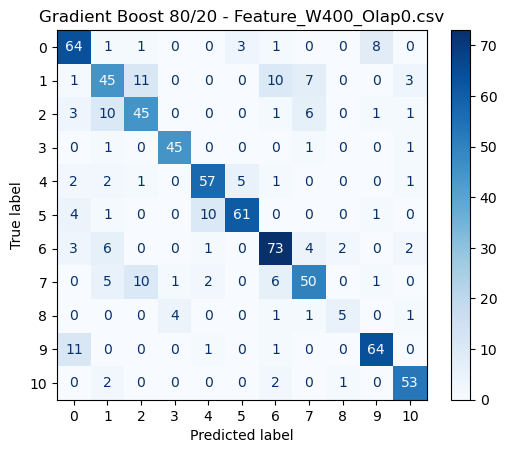

              precision    recall  f1-score   support

           0       0.70      0.79      0.74       117
           1       0.63      0.67      0.65       115
           2       0.66      0.65      0.66       101
           3       0.92      0.97      0.95        72
           4       0.74      0.78      0.76       104
           5       0.85      0.79      0.82       115
           6       0.77      0.78      0.78       136
           7       0.72      0.62      0.67       113
           8       0.64      0.50      0.56        18
           9       0.82      0.77      0.79       115
          10       0.84      0.88      0.86        88

    accuracy                           0.76      1094
   macro avg       0.75      0.75      0.75      1094
weighted avg       0.76      0.76      0.76      1094

Accuracy: 75.69%
Precision: 75.78%
Recall: 75.69%
F1 Score: 75.60%
ROC AUC: 97.28%


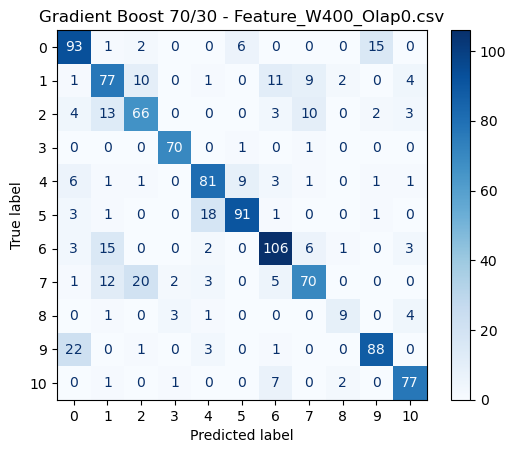

KFold Cross-Validation Scores (80/20 model): [0.78052126 0.77366255 0.77229081 0.7654321  0.77197802]
KFold Mean Accuracy (80/20 model): 77.28%
KFold Std Deviation (80/20 model): 0.0048

KFold Cross-Validation Scores (70/30 model): [0.78052126 0.77366255 0.77229081 0.7654321  0.77197802]
KFold Mean Accuracy (70/30 model): 77.28%
KFold Std Deviation (70/30 model): 0.0048
Processing file 8/10: Feature_W400_Olap50.csv

 Gradient Boosting on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W400_Olap50.csv...
              precision    recall  f1-score   support

           0       0.90      0.87      0.89       155
           1       0.74      0.77      0.75       152
           2       0.74      0.83      0.78       134
           3       0.92      0.88      0.90        94
           4       0.86      0.92      0.89       138
           5       0.92      0.93      0.92       152
           6       0.85      0.86      0.85       181
           7       0.80      0.71      0.75      

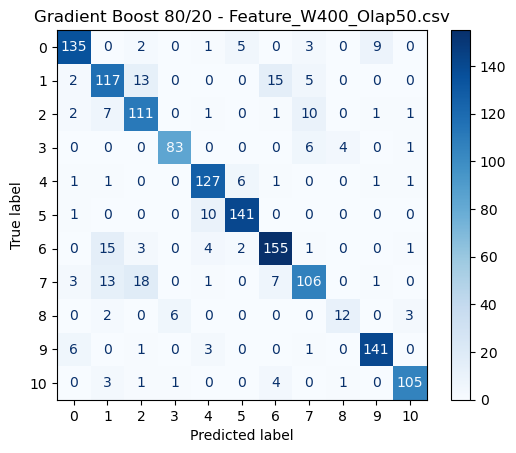

              precision    recall  f1-score   support

           0       0.89      0.89      0.89       233
           1       0.72      0.80      0.76       228
           2       0.76      0.82      0.79       200
           3       0.92      0.93      0.92       141
           4       0.89      0.89      0.89       207
           5       0.91      0.94      0.93       229
           6       0.87      0.87      0.87       271
           7       0.82      0.69      0.75       223
           8       0.74      0.57      0.65        35
           9       0.92      0.92      0.92       228
          10       0.93      0.91      0.92       173

    accuracy                           0.86      2168
   macro avg       0.85      0.84      0.84      2168
weighted avg       0.86      0.86      0.86      2168

Accuracy: 85.75%
Precision: 85.88%
Recall: 85.75%
F1 Score: 85.69%
ROC AUC: 98.57%


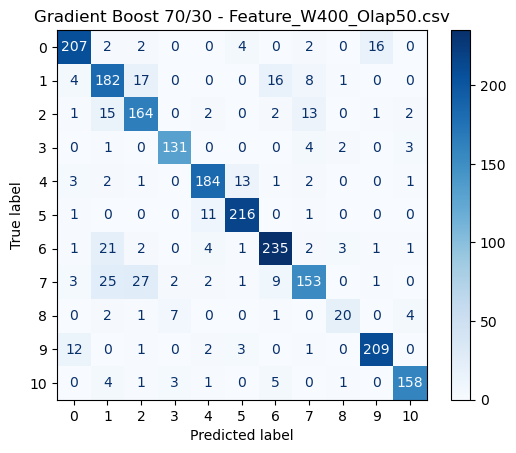

KFold Cross-Validation Scores (80/20 model): [0.84359862 0.83321799 0.84152249 0.8567474  0.84775087]
KFold Mean Accuracy (80/20 model): 84.46%
KFold Std Deviation (80/20 model): 0.0077

KFold Cross-Validation Scores (70/30 model): [0.84359862 0.83321799 0.84152249 0.8567474  0.84775087]
KFold Mean Accuracy (70/30 model): 84.46%
KFold Std Deviation (70/30 model): 0.0077
Processing file 9/10: Feature_W500_Olap0.csv

 Gradient Boosting on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W500_Olap0.csv...
              precision    recall  f1-score   support

           0       0.80      0.77      0.79        62
           1       0.60      0.61      0.60        61
           2       0.67      0.74      0.70        54
           3       0.97      0.89      0.93        38
           4       0.81      0.70      0.75        56
           5       0.85      0.93      0.89        61
           6       0.78      0.79      0.79        73
           7       0.75      0.65      0.70        

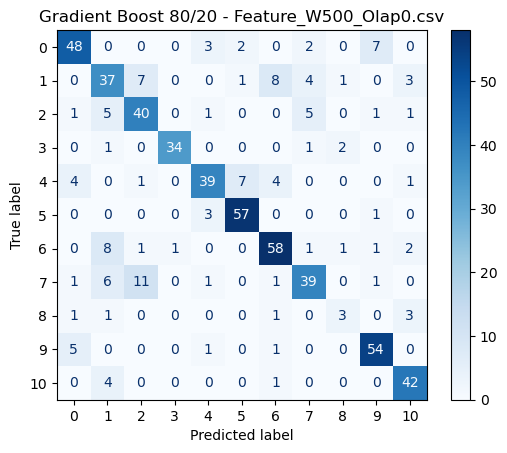

              precision    recall  f1-score   support

           0       0.75      0.77      0.76        93
           1       0.58      0.62      0.60        92
           2       0.68      0.69      0.69        81
           3       0.92      0.86      0.89        56
           4       0.78      0.75      0.76        84
           5       0.86      0.88      0.87        92
           6       0.77      0.79      0.78       109
           7       0.73      0.67      0.70        90
           8       0.29      0.29      0.29        14
           9       0.83      0.82      0.82        92
          10       0.81      0.83      0.82        70

    accuracy                           0.76       873
   macro avg       0.73      0.72      0.73       873
weighted avg       0.76      0.76      0.76       873

Accuracy: 75.60%
Precision: 75.80%
Recall: 75.60%
F1 Score: 75.66%
ROC AUC: 96.52%


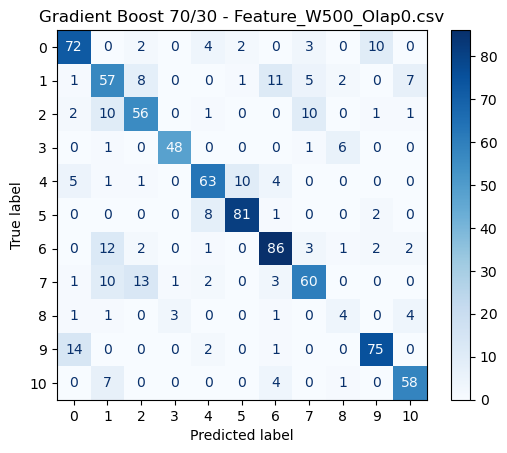

KFold Cross-Validation Scores (80/20 model): [0.76804124 0.75773196 0.77452668 0.79518072 0.76075731]
KFold Mean Accuracy (80/20 model): 77.12%
KFold Std Deviation (80/20 model): 0.0133

KFold Cross-Validation Scores (70/30 model): [0.76804124 0.75773196 0.77452668 0.79518072 0.76075731]
KFold Mean Accuracy (70/30 model): 77.12%
KFold Std Deviation (70/30 model): 0.0133
Processing file 10/10: Feature_W500_Olap50.csv

 Gradient Boosting on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W500_Olap50.csv...
              precision    recall  f1-score   support

           0       0.88      0.90      0.89       124
           1       0.66      0.73      0.69       121
           2       0.73      0.78      0.75       106
           3       0.97      0.84      0.90        74
           4       0.84      0.93      0.88       110
           5       0.96      0.88      0.92       121
           6       0.85      0.86      0.86       144
           7       0.80      0.70      0.75     

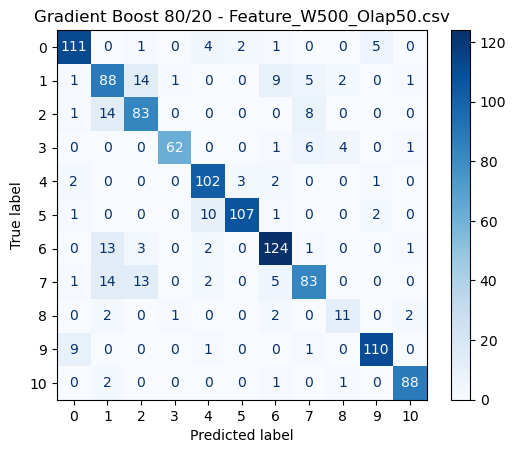

              precision    recall  f1-score   support

           0       0.87      0.85      0.86       185
           1       0.69      0.75      0.72       182
           2       0.74      0.74      0.74       159
           3       0.93      0.84      0.88       111
           4       0.86      0.89      0.88       165
           5       0.93      0.91      0.92       182
           6       0.82      0.84      0.83       216
           7       0.72      0.68      0.70       177
           8       0.60      0.56      0.58        27
           9       0.91      0.89      0.90       182
          10       0.91      0.93      0.92       138

    accuracy                           0.83      1724
   macro avg       0.82      0.81      0.81      1724
weighted avg       0.83      0.83      0.83      1724

Accuracy: 82.77%
Precision: 82.91%
Recall: 82.77%
F1 Score: 82.79%
ROC AUC: 98.44%


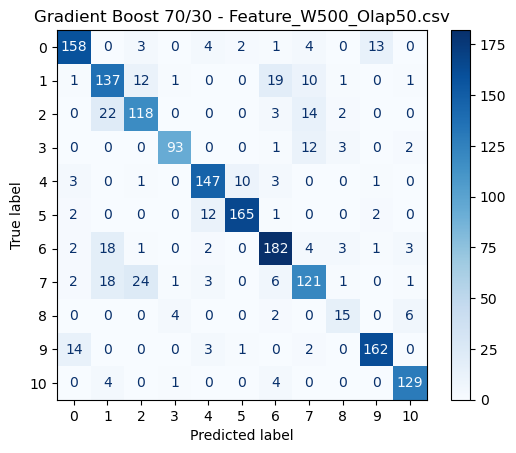

KFold Cross-Validation Scores (80/20 model): [0.86597041 0.83899043 0.84334204 0.83463882 0.86062718]
KFold Mean Accuracy (80/20 model): 84.87%
KFold Std Deviation (80/20 model): 0.0123

KFold Cross-Validation Scores (70/30 model): [0.86597041 0.83899043 0.84334204 0.83463882 0.86062718]
KFold Mean Accuracy (70/30 model): 84.87%
KFold Std Deviation (70/30 model): 0.0123

Final Results:


,Feature File,Model,Split,Accuracy,Precision,Recall,F1-Score,ROC_AUC,CV Mean Accuracy,CV Std Accuracy,Best Params
0,Feature_W100_Olap0.csv,Gradient Boost,80/20,0.732747,0.732460,0.732747,0.731809,0.961941,0.736532,0.008188,"{'n_estimators': 100, 'max_depth': 5, 'learnin..."
1,Feature_W100_Olap0.csv,Gradient Boost,70/30,0.733138,0.732697,0.733138,0.731611,0.961182,0.736532,0.008188,"{'n_estimators': 100, 'max_depth': 5, 'learnin..."
2,Feature_W100_Olap50.csv,Gradient Boost,80/20,0.776064,0.775915,0.776064,0.775684,0.976065,0.777623,0.004431,"{'n_estimators': 100, 'max_depth': 5, 'learnin..."
3,Feature_W100_Olap50.csv,Gradient Boost,70/30,0.772630,0.773051,0.772630,0.772505,0.972630,0.777623,0.004431,"{'n_estimators': 100, 'max_depth': 5, 'learnin..."
4,Feature_W200_Olap0.csv,Gradient Boost,80/20,0.746431,0.746674,0.746431,0.745854,0.965732,0.754692,0.007143,"{'n_estimators': 100, 'max_depth': 5, 'learnin..."
5,Feature_W200_Olap0.csv,Gradient Boost,70/30,0.742184,0.743233,0.742184,0.741784,0.962882,0.754692,0.007143,"{'n_estimators': 100, 'max_depth': 5, 'learnin..."
6,Feature_W200_Olap50.csv,Gradient Boost,80/20,0.812628,0.812609,0.812628,0.811986,0.979121,0.805762,0.008561,"{'n_estimators': 100, 'max_depth': 5, 'learnin..."
7,Feature_W200_Olap50.csv,Gradient Boost,70/30,0.800910,0.801909,0.800910,0.800977,0.978992,0.805762,0.008561,"{'n_estimators': 100, 'max_depth': 5, 'learnin..."
8,Feature_W300_Olap0.csv,Gradient Boost,80/20,0.766633,0.771408,0.766633,0.766282,0.963811,0.766743,0.008587,"{'n_estimators': 100, 'max_depth': 5, 'learnin..."
9,Feature_W300_Olap0.csv,Gradient Boost,70/30,0.767235,0.769790,0.767235,0.767263,0.965257,0.766743,0.008587,"{'n_estimators': 100, 'max_depth': 5, 'learnin..."


In [7]:
gb_params = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7]
}

gb_results = []
best_gb_params = None  # will save best params after first file

# for file_path in fileList:
for i, file_path in enumerate(fileList):
    print(f"Processing file {i+1}/{len(fileList)}: {os.path.basename(file_path)}")
    print(f"\n Gradient Boosting on {file_path}...")

    df = pd.read_csv(file_path)
    X = df.drop(columns=['exp_Name'])
    y = df['exp_Name']
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)

    # Apply StandardScaler
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Train/Test Splits
    X_train_80, X_test_20, y_train_80, y_test_20 = train_test_split(
        X_scaled, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
    )
    X_train_70, X_test_30, y_train_70, y_test_30 = train_test_split(
        X_scaled, y_encoded, test_size=0.3, random_state=42, stratify=y_encoded
    )

    if i == 0:
        # Only on first file: do hyperparameter search
        print("\nRunning RandomizedSearchCV for GradientBoosting on first file...")
        gb_model = GradientBoostingClassifier(random_state=42)
        gb_search = RandomizedSearchCV(
            gb_model, param_distributions=gb_params, n_iter=5,
            cv=5, random_state=42, verbose=2, n_jobs=-1
        )
        gb_search.fit(X_train_80, y_train_80)
        best_gb_params = gb_search.best_params_
        print("\nBest Hyperparameters Found:", best_gb_params)

    # Use saved best_gb_params from first file for all files
    gb_80 = GradientBoostingClassifier(**best_gb_params, random_state=42)
    gb_80.fit(X_train_80, y_train_80)

    acc80, prec80, rec80, f180, roc_auc80 = evaluate_model(gb_80, X_test_20, y_test_20)
    plot_confusion(gb_80, X_test_20, y_test_20, title=f"Gradient Boost 80/20 - {os.path.basename(file_path)}")

    gb_70 = GradientBoostingClassifier(**best_gb_params, random_state=42)
    gb_70.fit(X_train_70, y_train_70)

    acc70, prec70, rec70, f170, roc_auc70 = evaluate_model(gb_70, X_test_30, y_test_30)
    plot_confusion(gb_70, X_test_30, y_test_30, title=f"Gradient Boost 70/30 - {os.path.basename(file_path)}")

    # KFold Cross-validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    # For 80/20 model
    kf_scores_80 = cross_val_score(gb_80, X_scaled, y_encoded, cv=kf, scoring='accuracy', n_jobs=-1)
    print("KFold Cross-Validation Scores (80/20 model):", kf_scores_80)
    print("KFold Mean Accuracy (80/20 model): {:.2f}%".format(kf_scores_80.mean() * 100))
    print("KFold Std Deviation (80/20 model): {:.4f}".format(kf_scores_80.std()))

    # For 70/30 model
    kf_scores_70 = cross_val_score(gb_70, X_scaled, y_encoded, cv=kf, scoring='accuracy', n_jobs=-1)
    print("\nKFold Cross-Validation Scores (70/30 model):", kf_scores_70)
    print("KFold Mean Accuracy (70/30 model): {:.2f}%".format(kf_scores_70.mean() * 100))
    print("KFold Std Deviation (70/30 model): {:.4f}".format(kf_scores_70.std()))

    # Save both splits results including CV Mean, CV Std, Best Params
    gb_results.append([
        os.path.basename(file_path), "Gradient Boost", "80/20", acc80, prec80, rec80, f180, roc_auc80,
        kf_scores_80.mean(), kf_scores_80.std(), best_gb_params
    ])
    gb_results.append([
        os.path.basename(file_path), "Gradient Boost", "70/30", acc70, prec70, rec70, f170, roc_auc70,
        kf_scores_70.mean(), kf_scores_70.std(), best_gb_params
    ])

# Create final dataframe
gb_results_df = pd.DataFrame(
    gb_results,
    columns=[
        "Feature File", "Model", "Split", "Accuracy", "Precision", "Recall", "F1-Score", "ROC_AUC",
        "CV Mean Accuracy", "CV Std Accuracy", "Best Params"
    ]
)

# Save results to CSV
gb_results_df.to_csv('results_gradient_boost.csv', index=False)

# Display results
print("\nFinal Results:")
display(gb_results_df)

### XGBoost (K-Fold)

Processing file 1/10: Feature_W100_Olap0.csv

 XGBoost on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W100_Olap0.csv...

Running RandomizedSearchCV for XGBoost on first file...
Fitting 5 folds for each of 10 candidates, totalling 50 fits

Best Hyperparameters Found: {'subsample': 0.8, 'n_estimators': 200, 'max_depth': 5, 'learning_rate': 0.3, 'colsample_bytree': 0.8}
              precision    recall  f1-score   support

           0       0.78      0.80      0.79       316
           1       0.56      0.56      0.56       311
           2       0.65      0.66      0.65       273
           3       0.86      0.86      0.86       194
           4       0.86      0.85      0.86       282
           5       0.93      0.90      0.92       311
           6       0.64      0.65      0.64       368
           7       0.67      0.66      0.67       305
           8       0.85      0.35      0.49        49
           9       0.84      0.88      0.86       310
          10       0.8

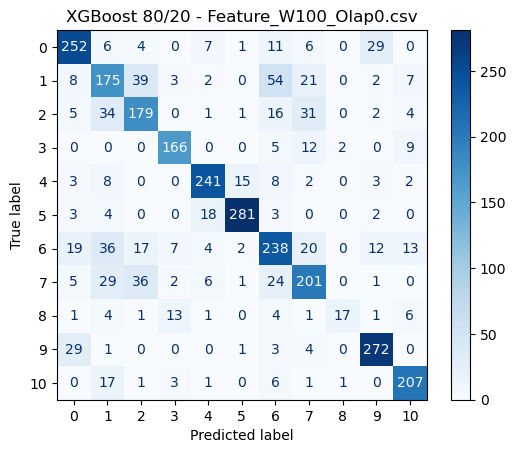

              precision    recall  f1-score   support

           0       0.80      0.81      0.81       474
           1       0.56      0.59      0.57       466
           2       0.63      0.65      0.64       409
           3       0.87      0.87      0.87       291
           4       0.82      0.85      0.83       422
           5       0.92      0.88      0.90       467
           6       0.64      0.66      0.65       551
           7       0.67      0.61      0.64       458
           8       0.75      0.37      0.50        73
           9       0.85      0.87      0.86       466
          10       0.84      0.84      0.84       356

    accuracy                           0.75      4433
   macro avg       0.76      0.73      0.74      4433
weighted avg       0.75      0.75      0.75      4433

Accuracy: 75.07%
Precision: 75.20%
Recall: 75.07%
F1 Score: 75.00%
ROC AUC: 96.79%


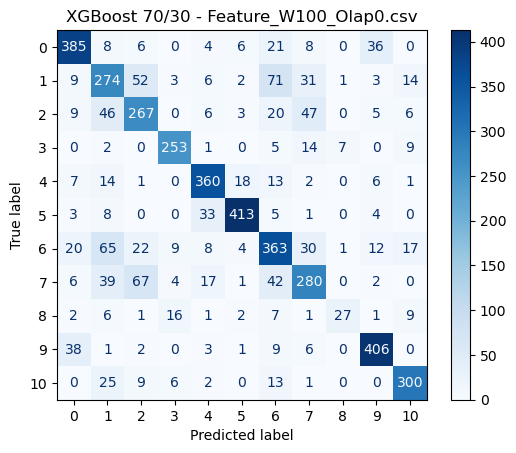

KFold Cross-Validation Scores (80/20 model): [0.75811908 0.75262267 0.7394247  0.76446701 0.75837563]
KFold Mean Accuracy (80/20 model): 75.46%
KFold Std Deviation (80/20 model): 0.0085

KFold Cross-Validation Scores (70/30 model): [0.75811908 0.75262267 0.7394247  0.76446701 0.75837563]
KFold Mean Accuracy (70/30 model): 75.46%
KFold Std Deviation (70/30 model): 0.0085
Processing file 2/10: Feature_W100_Olap50.csv

 XGBoost on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W100_Olap50.csv...
              precision    recall  f1-score   support

           0       0.86      0.87      0.86       631
           1       0.63      0.67      0.65       621
           2       0.71      0.75      0.73       545
           3       0.93      0.90      0.92       387
           4       0.89      0.88      0.88       562
           5       0.94      0.94      0.94       621
           6       0.72      0.72      0.72       734
           7       0.77      0.72      0.74       608
     

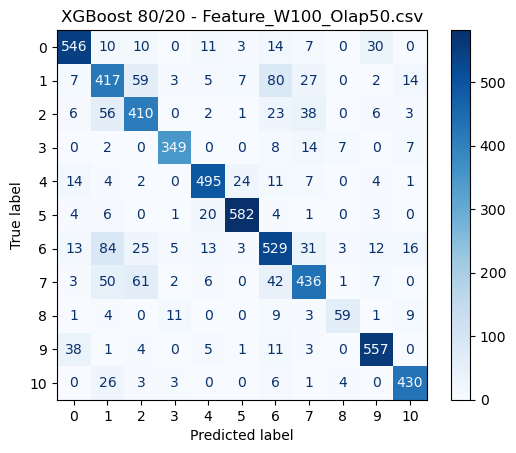

              precision    recall  f1-score   support

           0       0.85      0.87      0.86       946
           1       0.62      0.66      0.64       932
           2       0.69      0.71      0.70       817
           3       0.91      0.87      0.89       580
           4       0.88      0.88      0.88       843
           5       0.95      0.93      0.94       932
           6       0.73      0.72      0.72      1102
           7       0.74      0.73      0.73       912
           8       0.77      0.51      0.61       146
           9       0.89      0.90      0.90       929
          10       0.89      0.89      0.89       710

    accuracy                           0.81      8849
   macro avg       0.81      0.79      0.80      8849
weighted avg       0.81      0.81      0.81      8849

Accuracy: 80.55%
Precision: 80.72%
Recall: 80.55%
F1 Score: 80.57%
ROC AUC: 98.05%


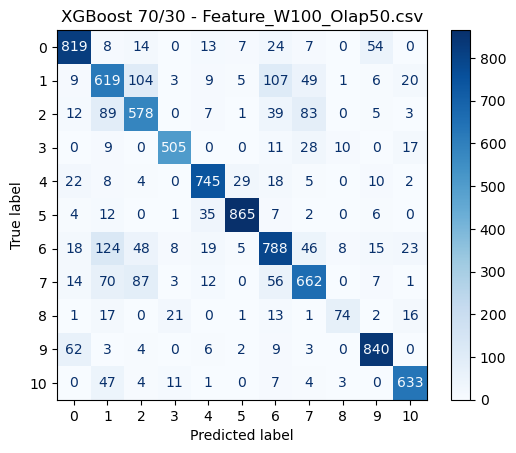

KFold Cross-Validation Scores (80/20 model): [0.81640956 0.80776403 0.81776572 0.80522122 0.81437532]
KFold Mean Accuracy (80/20 model): 81.23%
KFold Std Deviation (80/20 model): 0.0049

KFold Cross-Validation Scores (70/30 model): [0.81640956 0.80776403 0.81776572 0.80522122 0.81437532]
KFold Mean Accuracy (70/30 model): 81.23%
KFold Std Deviation (70/30 model): 0.0049
Processing file 3/10: Feature_W200_Olap0.csv

 XGBoost on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W200_Olap0.csv...
              precision    recall  f1-score   support

           0       0.77      0.83      0.80       157
           1       0.59      0.65      0.62       155
           2       0.62      0.65      0.64       136
           3       0.89      0.79      0.84        96
           4       0.83      0.80      0.81       140
           5       0.86      0.90      0.88       155
           6       0.75      0.74      0.75       183
           7       0.77      0.66      0.71       152
       

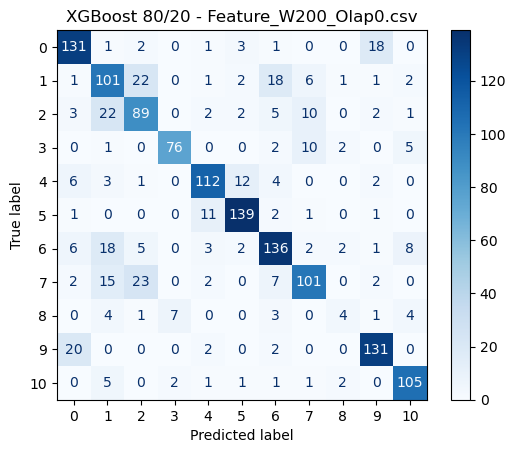

              precision    recall  f1-score   support

           0       0.83      0.78      0.80       236
           1       0.60      0.67      0.63       232
           2       0.62      0.66      0.64       204
           3       0.86      0.83      0.85       145
           4       0.82      0.81      0.81       210
           5       0.86      0.91      0.88       232
           6       0.75      0.70      0.73       275
           7       0.72      0.64      0.68       228
           8       0.52      0.31      0.39        36
           9       0.82      0.88      0.85       232
          10       0.89      0.90      0.90       177

    accuracy                           0.77      2207
   macro avg       0.75      0.74      0.74      2207
weighted avg       0.77      0.77      0.77      2207

Accuracy: 76.62%
Precision: 76.65%
Recall: 76.62%
F1 Score: 76.50%
ROC AUC: 97.07%


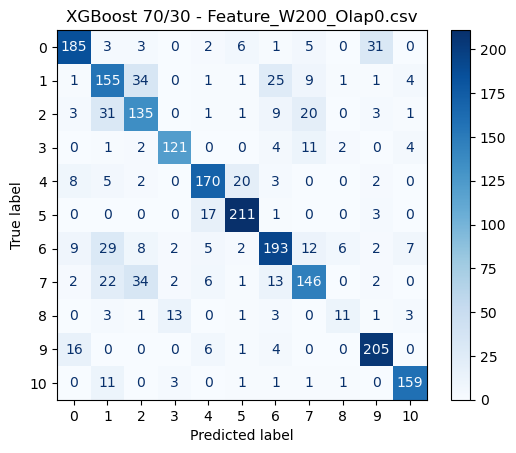

KFold Cross-Validation Scores (80/20 model): [0.78042148 0.76478586 0.77702243 0.77770224 0.77278912]
KFold Mean Accuracy (80/20 model): 77.45%
KFold Std Deviation (80/20 model): 0.0055

KFold Cross-Validation Scores (70/30 model): [0.78042148 0.76478586 0.77702243 0.77770224 0.77278912]
KFold Mean Accuracy (70/30 model): 77.45%
KFold Std Deviation (70/30 model): 0.0055
Processing file 4/10: Feature_W200_Olap50.csv

 XGBoost on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W200_Olap50.csv...
              precision    recall  f1-score   support

           0       0.88      0.89      0.88       313
           1       0.69      0.78      0.73       308
           2       0.75      0.75      0.75       271
           3       0.90      0.91      0.91       192
           4       0.91      0.88      0.89       279
           5       0.91      0.94      0.92       309
           6       0.80      0.78      0.79       365
           7       0.81      0.76      0.78       302
     

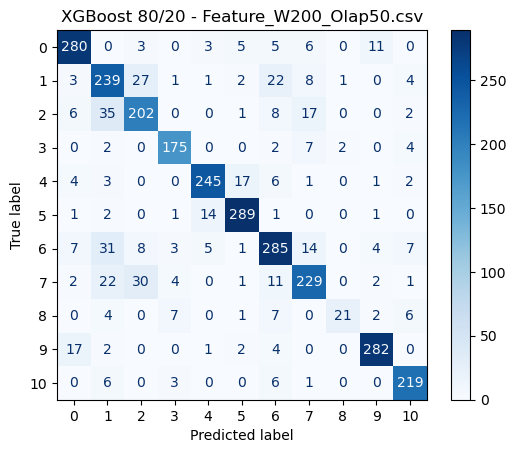

              precision    recall  f1-score   support

           0       0.86      0.88      0.87       470
           1       0.68      0.73      0.70       463
           2       0.74      0.76      0.75       406
           3       0.92      0.92      0.92       287
           4       0.89      0.88      0.89       419
           5       0.92      0.94      0.93       463
           6       0.75      0.74      0.74       548
           7       0.80      0.75      0.77       453
           8       0.82      0.57      0.67        72
           9       0.89      0.89      0.89       462
          10       0.91      0.91      0.91       352

    accuracy                           0.83      4395
   macro avg       0.83      0.81      0.82      4395
weighted avg       0.83      0.83      0.83      4395

Accuracy: 82.80%
Precision: 82.87%
Recall: 82.80%
F1 Score: 82.78%
ROC AUC: 98.39%


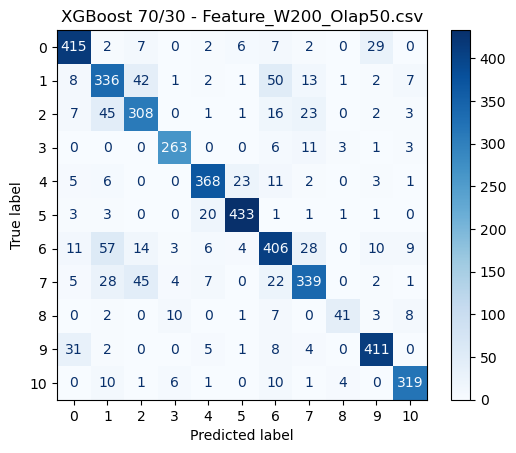

KFold Cross-Validation Scores (80/20 model): [0.84641638 0.83788396 0.83441448 0.83885285 0.832366  ]
KFold Mean Accuracy (80/20 model): 83.80%
KFold Std Deviation (80/20 model): 0.0048

KFold Cross-Validation Scores (70/30 model): [0.84641638 0.83788396 0.83441448 0.83885285 0.832366  ]
KFold Mean Accuracy (70/30 model): 83.80%
KFold Std Deviation (70/30 model): 0.0048
Processing file 5/10: Feature_W300_Olap0.csv

 XGBoost on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W300_Olap0.csv...
              precision    recall  f1-score   support

           0       0.79      0.89      0.83       105
           1       0.61      0.66      0.64       103
           2       0.66      0.72      0.69        90
           3       0.92      0.88      0.90        64
           4       0.86      0.88      0.87        93
           5       0.92      0.95      0.94       102
           6       0.79      0.79      0.79       122
           7       0.70      0.61      0.66       101
       

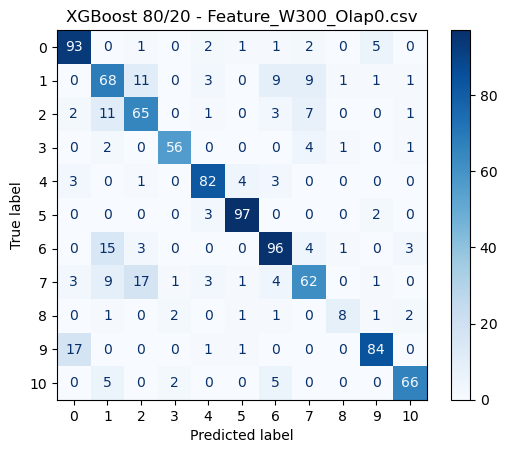

              precision    recall  f1-score   support

           0       0.76      0.83      0.79       157
           1       0.60      0.68      0.63       154
           2       0.68      0.67      0.68       135
           3       0.90      0.90      0.90        96
           4       0.86      0.85      0.86       139
           5       0.89      0.91      0.90       154
           6       0.75      0.73      0.74       183
           7       0.68      0.60      0.64       151
           8       0.71      0.42      0.53        24
           9       0.85      0.85      0.85       155
          10       0.87      0.86      0.87       117

    accuracy                           0.77      1465
   macro avg       0.78      0.75      0.76      1465
weighted avg       0.78      0.77      0.77      1465

Accuracy: 77.47%
Precision: 77.56%
Recall: 77.47%
F1 Score: 77.38%
ROC AUC: 97.15%


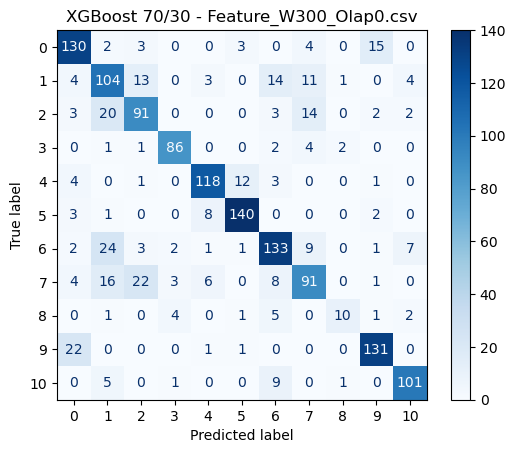

KFold Cross-Validation Scores (80/20 model): [0.79631525 0.78607984 0.77072671 0.77971311 0.77971311]
KFold Mean Accuracy (80/20 model): 78.25%
KFold Std Deviation (80/20 model): 0.0085

KFold Cross-Validation Scores (70/30 model): [0.79631525 0.78607984 0.77072671 0.77971311 0.77971311]
KFold Mean Accuracy (70/30 model): 78.25%
KFold Std Deviation (70/30 model): 0.0085
Processing file 6/10: Feature_W300_Olap50.csv

 XGBoost on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W300_Olap50.csv...
              precision    recall  f1-score   support

           0       0.86      0.91      0.88       208
           1       0.75      0.80      0.78       205
           2       0.80      0.72      0.76       179
           3       0.93      0.89      0.91       127
           4       0.90      0.88      0.89       185
           5       0.94      0.96      0.95       204
           6       0.82      0.81      0.81       243
           7       0.84      0.84      0.84       199
     

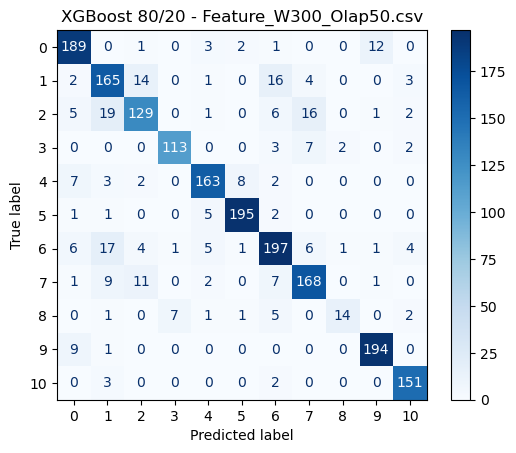

              precision    recall  f1-score   support

           0       0.85      0.89      0.87       312
           1       0.74      0.77      0.75       307
           2       0.77      0.75      0.76       269
           3       0.95      0.92      0.94       190
           4       0.89      0.89      0.89       278
           5       0.91      0.93      0.92       307
           6       0.81      0.80      0.80       364
           7       0.80      0.81      0.80       299
           8       0.88      0.48      0.62        46
           9       0.91      0.91      0.91       307
          10       0.93      0.95      0.94       233

    accuracy                           0.85      2912
   macro avg       0.86      0.83      0.84      2912
weighted avg       0.85      0.85      0.85      2912

Accuracy: 85.16%
Precision: 85.19%
Recall: 85.16%
F1 Score: 85.07%
ROC AUC: 98.76%


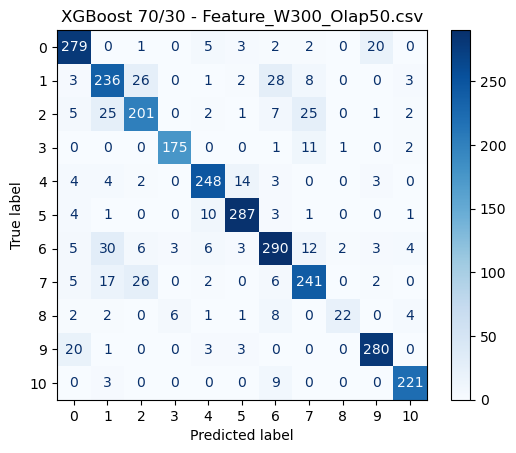

KFold Cross-Validation Scores (80/20 model): [0.86244204 0.85780526 0.85059248 0.86295724 0.85316847]
KFold Mean Accuracy (80/20 model): 85.74%
KFold Std Deviation (80/20 model): 0.0049

KFold Cross-Validation Scores (70/30 model): [0.86244204 0.85780526 0.85059248 0.86295724 0.85316847]
KFold Mean Accuracy (70/30 model): 85.74%
KFold Std Deviation (70/30 model): 0.0049
Processing file 7/10: Feature_W400_Olap0.csv

 XGBoost on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W400_Olap0.csv...
              precision    recall  f1-score   support

           0       0.71      0.77      0.74        78
           1       0.61      0.61      0.61        77
           2       0.64      0.70      0.67        67
           3       0.88      0.96      0.92        48
           4       0.80      0.83      0.81        69
           5       0.88      0.82      0.85        77
           6       0.79      0.75      0.77        91
           7       0.71      0.68      0.69        75
       

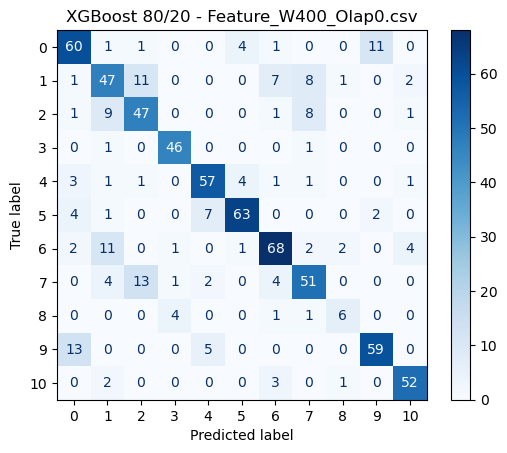

              precision    recall  f1-score   support

           0       0.73      0.80      0.76       117
           1       0.62      0.64      0.63       115
           2       0.69      0.70      0.70       101
           3       0.89      0.94      0.92        72
           4       0.79      0.79      0.79       104
           5       0.82      0.84      0.83       115
           6       0.77      0.75      0.76       136
           7       0.72      0.69      0.70       113
           8       0.64      0.50      0.56        18
           9       0.87      0.74      0.80       115
          10       0.88      0.91      0.89        88

    accuracy                           0.77      1094
   macro avg       0.77      0.76      0.76      1094
weighted avg       0.77      0.77      0.77      1094

Accuracy: 76.78%
Precision: 76.89%
Recall: 76.78%
F1 Score: 76.73%
ROC AUC: 97.74%


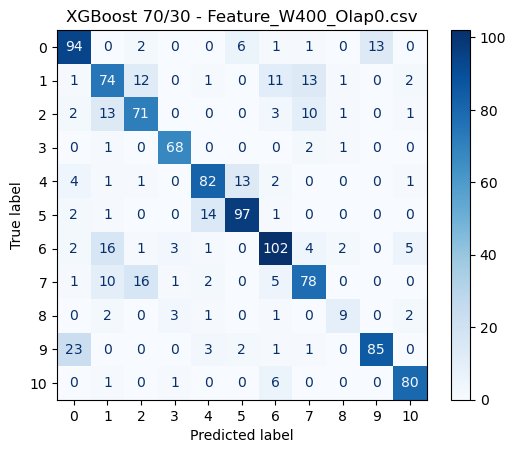

KFold Cross-Validation Scores (80/20 model): [0.7914952  0.76680384 0.76817558 0.79286694 0.78159341]
KFold Mean Accuracy (80/20 model): 78.02%
KFold Std Deviation (80/20 model): 0.0111

KFold Cross-Validation Scores (70/30 model): [0.7914952  0.76680384 0.76817558 0.79286694 0.78159341]
KFold Mean Accuracy (70/30 model): 78.02%
KFold Std Deviation (70/30 model): 0.0111
Processing file 8/10: Feature_W400_Olap50.csv

 XGBoost on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W400_Olap50.csv...
              precision    recall  f1-score   support

           0       0.90      0.92      0.91       155
           1       0.77      0.79      0.78       152
           2       0.79      0.81      0.80       134
           3       0.92      0.94      0.93        94
           4       0.91      0.91      0.91       138
           5       0.93      0.97      0.95       152
           6       0.85      0.87      0.86       181
           7       0.83      0.75      0.79       149
     

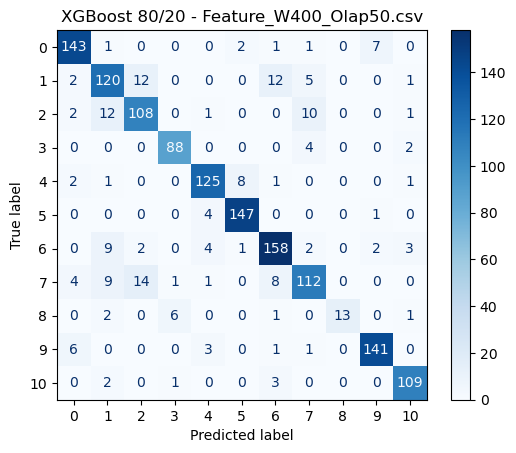

              precision    recall  f1-score   support

           0       0.88      0.88      0.88       233
           1       0.72      0.82      0.77       228
           2       0.77      0.82      0.80       200
           3       0.92      0.94      0.93       141
           4       0.89      0.89      0.89       207
           5       0.92      0.95      0.93       229
           6       0.89      0.85      0.87       271
           7       0.84      0.72      0.78       223
           8       0.95      0.57      0.71        35
           9       0.91      0.92      0.91       228
          10       0.93      0.94      0.93       173

    accuracy                           0.86      2168
   macro avg       0.88      0.85      0.86      2168
weighted avg       0.87      0.86      0.86      2168

Accuracy: 86.44%
Precision: 86.69%
Recall: 86.44%
F1 Score: 86.39%
ROC AUC: 99.06%


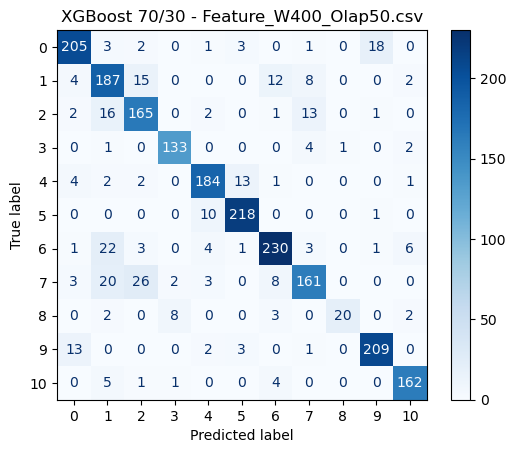

KFold Cross-Validation Scores (80/20 model): [0.86851211 0.85259516 0.87474048 0.86989619 0.87889273]
KFold Mean Accuracy (80/20 model): 86.89%
KFold Std Deviation (80/20 model): 0.0090

KFold Cross-Validation Scores (70/30 model): [0.86851211 0.85259516 0.87474048 0.86989619 0.87889273]
KFold Mean Accuracy (70/30 model): 86.89%
KFold Std Deviation (70/30 model): 0.0090
Processing file 9/10: Feature_W500_Olap0.csv

 XGBoost on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W500_Olap0.csv...
              precision    recall  f1-score   support

           0       0.76      0.77      0.77        62
           1       0.65      0.61      0.63        61
           2       0.71      0.76      0.73        54
           3       0.95      0.95      0.95        38
           4       0.84      0.64      0.73        56
           5       0.84      0.95      0.89        61
           6       0.73      0.79      0.76        73
           7       0.73      0.63      0.68        60
       

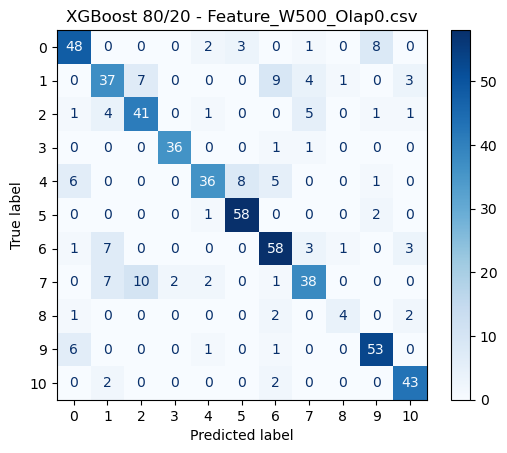

              precision    recall  f1-score   support

           0       0.73      0.74      0.73        93
           1       0.68      0.59      0.63        92
           2       0.69      0.70      0.70        81
           3       0.94      0.89      0.92        56
           4       0.79      0.73      0.76        84
           5       0.84      0.86      0.85        92
           6       0.76      0.80      0.78       109
           7       0.67      0.63      0.65        90
           8       0.64      0.64      0.64        14
           9       0.76      0.84      0.80        92
          10       0.81      0.89      0.84        70

    accuracy                           0.76       873
   macro avg       0.76      0.76      0.75       873
weighted avg       0.76      0.76      0.76       873

Accuracy: 75.83%
Precision: 75.72%
Recall: 75.83%
F1 Score: 75.67%
ROC AUC: 97.13%


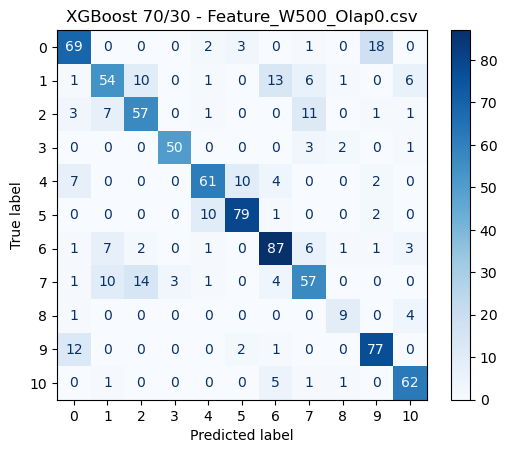

KFold Cross-Validation Scores (80/20 model): [0.7766323  0.78865979 0.77108434 0.8020654  0.78141136]
KFold Mean Accuracy (80/20 model): 78.40%
KFold Std Deviation (80/20 model): 0.0107

KFold Cross-Validation Scores (70/30 model): [0.7766323  0.78865979 0.77108434 0.8020654  0.78141136]
KFold Mean Accuracy (70/30 model): 78.40%
KFold Std Deviation (70/30 model): 0.0107
Processing file 10/10: Feature_W500_Olap50.csv

 XGBoost on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W500_Olap50.csv...
              precision    recall  f1-score   support

           0       0.90      0.90      0.90       124
           1       0.75      0.76      0.75       121
           2       0.80      0.80      0.80       106
           3       0.93      0.92      0.93        74
           4       0.86      0.93      0.89       110
           5       0.93      0.89      0.91       121
           6       0.86      0.89      0.88       144
           7       0.80      0.76      0.78       118
    

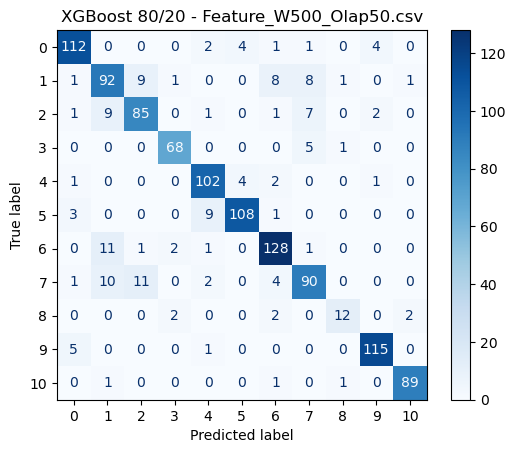

              precision    recall  f1-score   support

           0       0.86      0.86      0.86       185
           1       0.77      0.77      0.77       182
           2       0.77      0.77      0.77       159
           3       0.95      0.87      0.91       111
           4       0.85      0.89      0.87       165
           5       0.90      0.91      0.90       182
           6       0.87      0.88      0.88       216
           7       0.79      0.76      0.77       177
           8       0.72      0.78      0.75        27
           9       0.91      0.91      0.91       182
          10       0.96      0.97      0.96       138

    accuracy                           0.86      1724
   macro avg       0.85      0.85      0.85      1724
weighted avg       0.86      0.86      0.86      1724

Accuracy: 85.61%
Precision: 85.65%
Recall: 85.61%
F1 Score: 85.61%
ROC AUC: 98.98%


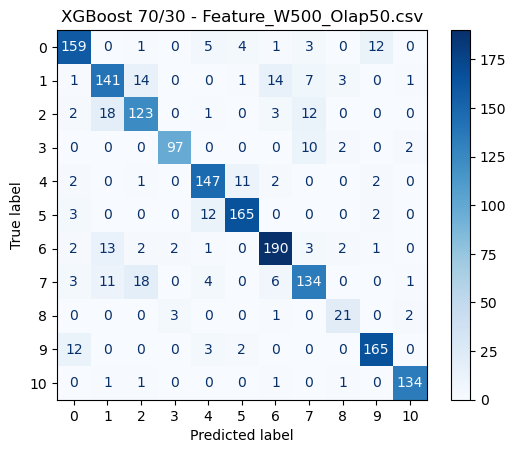

KFold Cross-Validation Scores (80/20 model): [0.88163621 0.84943429 0.85726719 0.87206266 0.88937282]
KFold Mean Accuracy (80/20 model): 87.00%
KFold Std Deviation (80/20 model): 0.0148

KFold Cross-Validation Scores (70/30 model): [0.88163621 0.84943429 0.85726719 0.87206266 0.88937282]
KFold Mean Accuracy (70/30 model): 87.00%
KFold Std Deviation (70/30 model): 0.0148

Final Results:


,Feature File,Model,Split,Accuracy,Precision,Recall,F1-Score,ROC_AUC,CV Mean Accuracy,CV Std Accuracy,Best Params
0,Feature_W100_Olap0.csv,XGBoost,80/20,0.754060,0.755137,0.754060,0.752716,0.968409,0.754602,0.008464,"{'subsample': 0.8, 'n_estimators': 200, 'max_d..."
1,Feature_W100_Olap0.csv,XGBoost,70/30,0.750733,0.752007,0.750733,0.750029,0.967934,0.754602,0.008464,"{'subsample': 0.8, 'n_estimators': 200, 'max_d..."
2,Feature_W100_Olap50.csv,XGBoost,80/20,0.815392,0.816949,0.815392,0.815740,0.982844,0.812307,0.004935,"{'subsample': 0.8, 'n_estimators': 200, 'max_d..."
3,Feature_W100_Olap50.csv,XGBoost,70/30,0.805515,0.807219,0.805515,0.805723,0.980529,0.812307,0.004935,"{'subsample': 0.8, 'n_estimators': 200, 'max_d..."
4,Feature_W200_Olap0.csv,XGBoost,80/20,0.764786,0.763945,0.764786,0.762711,0.973738,0.774544,0.005458,"{'subsample': 0.8, 'n_estimators': 200, 'max_d..."
5,Feature_W200_Olap0.csv,XGBoost,70/30,0.766198,0.766534,0.766198,0.765023,0.970688,0.774544,0.005458,"{'subsample': 0.8, 'n_estimators': 200, 'max_d..."
6,Feature_W200_Olap50.csv,XGBoost,80/20,0.841638,0.843377,0.841638,0.840851,0.985647,0.837987,0.004820,"{'subsample': 0.8, 'n_estimators': 200, 'max_d..."
7,Feature_W200_Olap50.csv,XGBoost,70/30,0.827986,0.828676,0.827986,0.827761,0.983887,0.837987,0.004820,"{'subsample': 0.8, 'n_estimators': 200, 'max_d..."
8,Feature_W300_Olap0.csv,XGBoost,80/20,0.795292,0.797553,0.795292,0.794940,0.973036,0.782510,0.008460,"{'subsample': 0.8, 'n_estimators': 200, 'max_d..."
9,Feature_W300_Olap0.csv,XGBoost,70/30,0.774744,0.775600,0.774744,0.773791,0.971486,0.782510,0.008460,"{'subsample': 0.8, 'n_estimators': 200, 'max_d..."


In [8]:
xgb_params = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.1, 0.3],
    'max_depth': [3, 5, 7],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0]
}

xgb_results = []
best_xgb_params = None  # Save best params from first file

# for file_path in fileList:
for i, file_path in enumerate(fileList):
    print(f"Processing file {i+1}/{len(fileList)}: {os.path.basename(file_path)}")
    print(f"\n XGBoost on {file_path}...")

    df = pd.read_csv(file_path)
    X = df.drop(columns=['exp_Name'])
    y = df['exp_Name']
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Train/Test splits
    X_train_80, X_test_20, y_train_80, y_test_20 = train_test_split(
        X_scaled, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
    )
    X_train_70, X_test_30, y_train_70, y_test_30 = train_test_split(
        X_scaled, y_encoded, test_size=0.3, random_state=42, stratify=y_encoded
    )

    if i == 0:
        print("\nRunning RandomizedSearchCV for XGBoost on first file...")
        xgb_model = XGBClassifier(
            tree_method='gpu_hist', 
            predictor='gpu_predictor',
            use_label_encoder=False,
            eval_metric='mlogloss',
            random_state=42
        )
        xgb_search = RandomizedSearchCV(
            xgb_model, param_distributions=xgb_params, n_iter=10,
            cv=5, random_state=42, verbose=2, n_jobs=-1
        )
        xgb_search.fit(X_train_80, y_train_80)
        best_xgb_params = xgb_search.best_params_
        print("\nBest Hyperparameters Found:", best_xgb_params)

    # Use best_xgb_params for all files
    xgb_80 = XGBClassifier(
        **best_xgb_params,
        tree_method='gpu_hist',
        predictor='gpu_predictor',
        use_label_encoder=False,
        eval_metric='mlogloss',
        random_state=42
    )
    xgb_80.fit(X_train_80, y_train_80)

    acc80, prec80, rec80, f180, roc_auc80 = evaluate_model(xgb_80, X_test_20, y_test_20)
    plot_confusion(xgb_80, X_test_20, y_test_20, title=f"XGBoost 80/20 - {os.path.basename(file_path)}")

    xgb_70 = XGBClassifier(
        **best_xgb_params,
        tree_method='gpu_hist',
        predictor='gpu_predictor',
        use_label_encoder=False,
        eval_metric='mlogloss',
        random_state=42
    )
    xgb_70.fit(X_train_70, y_train_70)

    acc70, prec70, rec70, f170, roc_auc70 = evaluate_model(xgb_70, X_test_30, y_test_30)
    plot_confusion(xgb_70, X_test_30, y_test_30, title=f"XGBoost 70/30 - {os.path.basename(file_path)}")

    # KFold Cross-validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    kf_scores_80 = cross_val_score(xgb_80, X_scaled, y_encoded, cv=kf, scoring='accuracy', n_jobs=-1)
    print("KFold Cross-Validation Scores (80/20 model):", kf_scores_80)
    print("KFold Mean Accuracy (80/20 model): {:.2f}%".format(kf_scores_80.mean() * 100))
    print("KFold Std Deviation (80/20 model): {:.4f}".format(kf_scores_80.std()))

    kf_scores_70 = cross_val_score(xgb_70, X_scaled, y_encoded, cv=kf, scoring='accuracy', n_jobs=-1)
    print("\nKFold Cross-Validation Scores (70/30 model):", kf_scores_70)
    print("KFold Mean Accuracy (70/30 model): {:.2f}%".format(kf_scores_70.mean() * 100))
    print("KFold Std Deviation (70/30 model): {:.4f}".format(kf_scores_70.std()))

    # Save both splits' results
    xgb_results.append([
        os.path.basename(file_path), "XGBoost", "80/20", acc80, prec80, rec80, f180, roc_auc80,
        kf_scores_80.mean(), kf_scores_80.std(), best_xgb_params
    ])
    xgb_results.append([
        os.path.basename(file_path), "XGBoost", "70/30", acc70, prec70, rec70, f170, roc_auc70,
        kf_scores_70.mean(), kf_scores_70.std(), best_xgb_params
    ])

# Final dataframe
xgb_results_df = pd.DataFrame(
    xgb_results,
    columns=[
        "Feature File", "Model", "Split", "Accuracy", "Precision", "Recall", "F1-Score", "ROC_AUC",
        "CV Mean Accuracy", "CV Std Accuracy", "Best Params"
    ]
)

# Save results
xgb_results_df.to_csv('results_xgboost.csv', index=False)

# Display results
print("\nFinal Results:")
display(xgb_results_df)

### Artificial Neural Network (MLPClassifier) (K-Fold)

Processing file 1/10: Feature_W100_Olap0.csv

 ANN (MLPClassifier) on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W100_Olap0.csv...

Running RandomizedSearchCV for MLPClassifier on first file...
Fitting 5 folds for each of 10 candidates, totalling 50 fits

Best Hyperparameters Found: {'solver': 'adam', 'learning_rate': 'adaptive', 'hidden_layer_sizes': (100, 50), 'alpha': 0.0001, 'activation': 'relu'}
              precision    recall  f1-score   support

           0       0.69      0.69      0.69       316
           1       0.55      0.52      0.54       311
           2       0.59      0.65      0.62       273
           3       0.86      0.79      0.83       194
           4       0.76      0.73      0.75       282
           5       0.78      0.92      0.84       311
           6       0.55      0.60      0.57       368
           7       0.68      0.51      0.58       305
           8       0.63      0.35      0.45        49
           9       0.72      0.78      0.

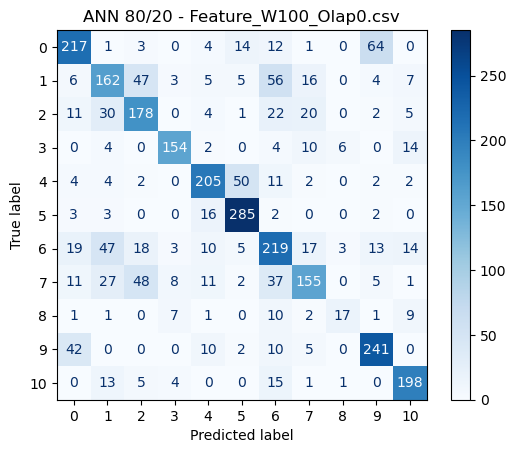

              precision    recall  f1-score   support

           0       0.63      0.76      0.69       474
           1       0.55      0.58      0.56       466
           2       0.63      0.53      0.57       409
           3       0.85      0.80      0.83       291
           4       0.76      0.75      0.75       422
           5       0.81      0.90      0.85       467
           6       0.61      0.60      0.61       551
           7       0.59      0.63      0.61       458
           8       0.39      0.34      0.36        73
           9       0.79      0.61      0.69       466
          10       0.81      0.82      0.82       356

    accuracy                           0.69      4433
   macro avg       0.68      0.67      0.67      4433
weighted avg       0.69      0.69      0.69      4433

Accuracy: 68.62%
Precision: 68.92%
Recall: 68.62%
F1 Score: 68.50%
ROC AUC: 95.51%


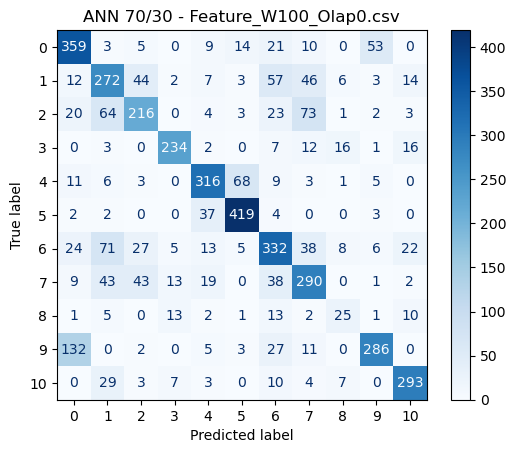

KFold Cross-Validation Scores (80/20 model): [0.70500677 0.69441624 0.68967851 0.68426396 0.68967851]
KFold Mean Accuracy (80/20 model): 69.26%
KFold Std Deviation (80/20 model): 0.0070

KFold Cross-Validation Scores (70/30 model): [0.70500677 0.69441624 0.68967851 0.68426396 0.68967851]
KFold Mean Accuracy (70/30 model): 69.26%
KFold Std Deviation (70/30 model): 0.0070
Processing file 2/10: Feature_W100_Olap50.csv

 ANN (MLPClassifier) on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W100_Olap50.csv...
              precision    recall  f1-score   support

           0       0.66      0.77      0.71       631
           1       0.59      0.57      0.58       621
           2       0.65      0.61      0.63       545
           3       0.90      0.85      0.88       387
           4       0.79      0.75      0.77       562
           5       0.82      0.91      0.86       621
           6       0.64      0.66      0.65       734
           7       0.65      0.67      0.66    

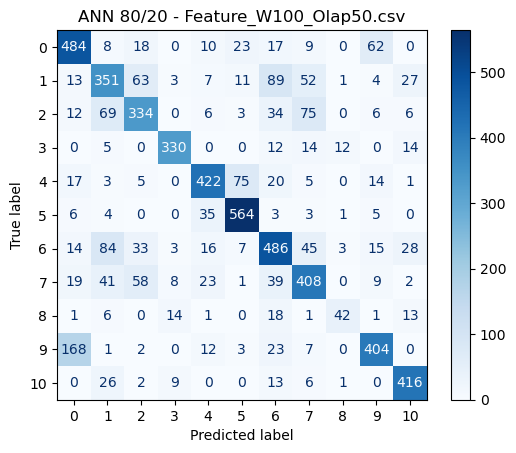

              precision    recall  f1-score   support

           0       0.64      0.73      0.68       946
           1       0.57      0.60      0.59       932
           2       0.62      0.59      0.61       817
           3       0.90      0.83      0.86       580
           4       0.75      0.81      0.78       843
           5       0.86      0.86      0.86       932
           6       0.64      0.64      0.64      1102
           7       0.68      0.59      0.63       912
           8       0.56      0.42      0.48       146
           9       0.76      0.68      0.71       929
          10       0.80      0.90      0.85       710

    accuracy                           0.71      8849
   macro avg       0.71      0.70      0.70      8849
weighted avg       0.71      0.71      0.71      8849

Accuracy: 70.95%
Precision: 70.98%
Recall: 70.95%
F1 Score: 70.81%
ROC AUC: 96.29%


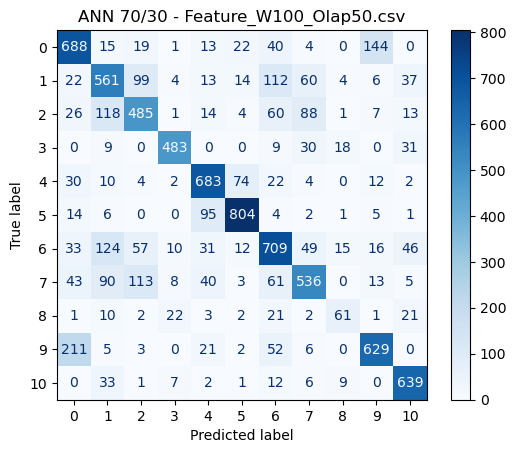

KFold Cross-Validation Scores (80/20 model): [0.73283607 0.73843024 0.73131039 0.72944567 0.74402441]
KFold Mean Accuracy (80/20 model): 73.52%
KFold Std Deviation (80/20 model): 0.0053

KFold Cross-Validation Scores (70/30 model): [0.73283607 0.73843024 0.73131039 0.72944567 0.74402441]
KFold Mean Accuracy (70/30 model): 73.52%
KFold Std Deviation (70/30 model): 0.0053
Processing file 3/10: Feature_W200_Olap0.csv

 ANN (MLPClassifier) on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W200_Olap0.csv...
              precision    recall  f1-score   support

           0       0.62      0.64      0.63       157
           1       0.61      0.57      0.59       155
           2       0.57      0.64      0.60       136
           3       0.91      0.66      0.76        96
           4       0.74      0.78      0.76       140
           5       0.80      0.88      0.83       155
           6       0.66      0.65      0.65       183
           7       0.66      0.59      0.62      

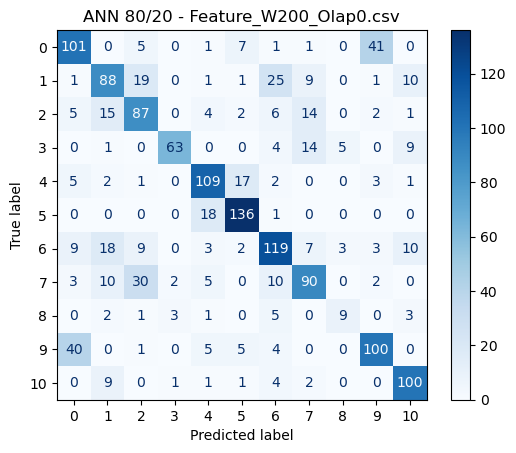

              precision    recall  f1-score   support

           0       0.65      0.69      0.67       236
           1       0.60      0.60      0.60       232
           2       0.58      0.58      0.58       204
           3       0.83      0.77      0.80       145
           4       0.74      0.78      0.76       210
           5       0.81      0.88      0.84       232
           6       0.69      0.64      0.67       275
           7       0.63      0.62      0.63       228
           8       0.29      0.14      0.19        36
           9       0.71      0.65      0.68       232
          10       0.74      0.86      0.79       177

    accuracy                           0.69      2207
   macro avg       0.66      0.65      0.65      2207
weighted avg       0.69      0.69      0.69      2207

Accuracy: 69.05%
Precision: 68.64%
Recall: 69.05%
F1 Score: 68.70%
ROC AUC: 95.92%


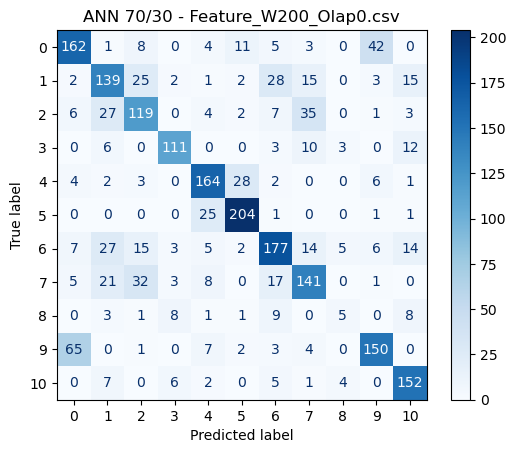

KFold Cross-Validation Scores (80/20 model): [0.67165194 0.7110809  0.64989803 0.70020394 0.70272109]
KFold Mean Accuracy (80/20 model): 68.71%
KFold Std Deviation (80/20 model): 0.0229

KFold Cross-Validation Scores (70/30 model): [0.67165194 0.7110809  0.64989803 0.70020394 0.70272109]
KFold Mean Accuracy (70/30 model): 68.71%
KFold Std Deviation (70/30 model): 0.0229
Processing file 4/10: Feature_W200_Olap50.csv

 ANN (MLPClassifier) on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W200_Olap50.csv...
              precision    recall  f1-score   support

           0       0.63      0.70      0.66       313
           1       0.57      0.65      0.61       308
           2       0.63      0.71      0.67       271
           3       0.85      0.90      0.87       192
           4       0.74      0.85      0.79       279
           5       0.86      0.83      0.84       309
           6       0.77      0.62      0.69       365
           7       0.71      0.61      0.66    

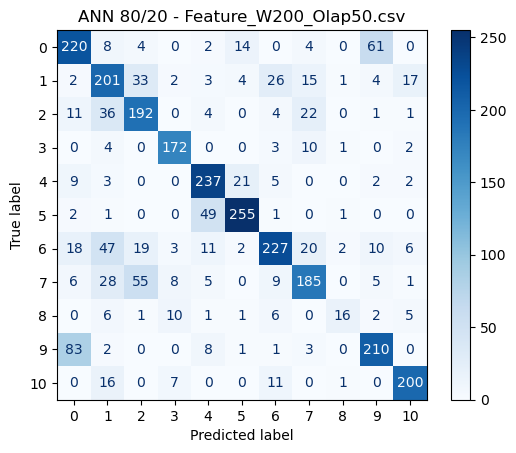

              precision    recall  f1-score   support

           0       0.80      0.63      0.70       470
           1       0.63      0.59      0.61       463
           2       0.70      0.65      0.67       406
           3       0.88      0.90      0.89       287
           4       0.81      0.81      0.81       419
           5       0.86      0.89      0.88       463
           6       0.68      0.71      0.70       548
           7       0.65      0.70      0.67       453
           8       0.73      0.49      0.58        72
           9       0.73      0.85      0.78       462
          10       0.83      0.89      0.86       352

    accuracy                           0.75      4395
   macro avg       0.75      0.74      0.74      4395
weighted avg       0.75      0.75      0.75      4395

Accuracy: 74.74%
Precision: 74.78%
Recall: 74.74%
F1 Score: 74.53%
ROC AUC: 96.91%


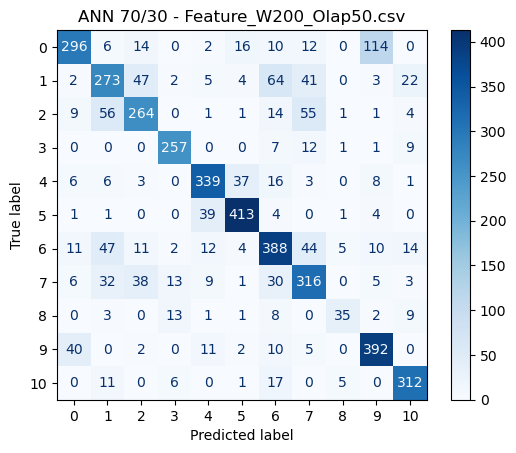

KFold Cross-Validation Scores (80/20 model): [0.74334471 0.75938567 0.72925913 0.75520656 0.7384773 ]
KFold Mean Accuracy (80/20 model): 74.51%
KFold Std Deviation (80/20 model): 0.0110

KFold Cross-Validation Scores (70/30 model): [0.74334471 0.75938567 0.72925913 0.75520656 0.7384773 ]
KFold Mean Accuracy (70/30 model): 74.51%
KFold Std Deviation (70/30 model): 0.0110
Processing file 5/10: Feature_W300_Olap0.csv

 ANN (MLPClassifier) on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W300_Olap0.csv...
              precision    recall  f1-score   support

           0       0.79      0.56      0.66       105
           1       0.69      0.54      0.61       103
           2       0.58      0.66      0.62        90
           3       0.87      0.81      0.84        64
           4       0.69      0.87      0.77        93
           5       0.89      0.76      0.82       102
           6       0.69      0.78      0.73       122
           7       0.58      0.50      0.54      

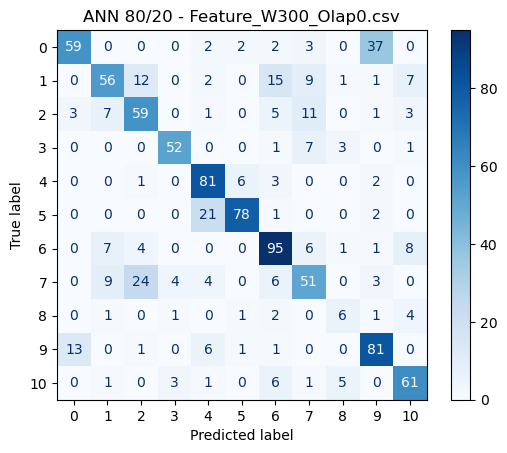

              precision    recall  f1-score   support

           0       0.73      0.53      0.61       157
           1       0.55      0.67      0.60       154
           2       0.69      0.59      0.64       135
           3       0.84      0.83      0.84        96
           4       0.80      0.79      0.80       139
           5       0.81      0.90      0.85       154
           6       0.74      0.72      0.73       183
           7       0.61      0.55      0.58       151
           8       0.44      0.29      0.35        24
           9       0.61      0.81      0.70       155
          10       0.80      0.77      0.79       117

    accuracy                           0.70      1465
   macro avg       0.69      0.68      0.68      1465
weighted avg       0.71      0.70      0.70      1465

Accuracy: 70.38%
Precision: 70.83%
Recall: 70.38%
F1 Score: 70.11%
ROC AUC: 95.82%


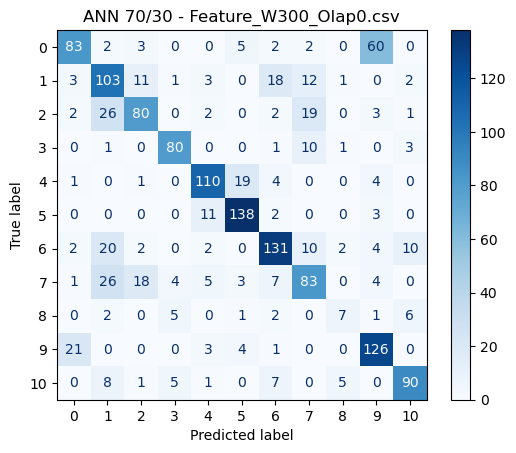

KFold Cross-Validation Scores (80/20 model): [0.69293756 0.63561924 0.67963153 0.6977459  0.68442623]
KFold Mean Accuracy (80/20 model): 67.81%
KFold Std Deviation (80/20 model): 0.0221

KFold Cross-Validation Scores (70/30 model): [0.69293756 0.63561924 0.67963153 0.6977459  0.68442623]
KFold Mean Accuracy (70/30 model): 67.81%
KFold Std Deviation (70/30 model): 0.0221
Processing file 6/10: Feature_W300_Olap50.csv

 ANN (MLPClassifier) on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W300_Olap50.csv...
              precision    recall  f1-score   support

           0       0.71      0.59      0.65       208
           1       0.66      0.63      0.65       205
           2       0.76      0.61      0.68       179
           3       0.92      0.83      0.87       127
           4       0.82      0.74      0.78       185
           5       0.82      0.93      0.87       204
           6       0.80      0.76      0.78       243
           7       0.68      0.79      0.73    

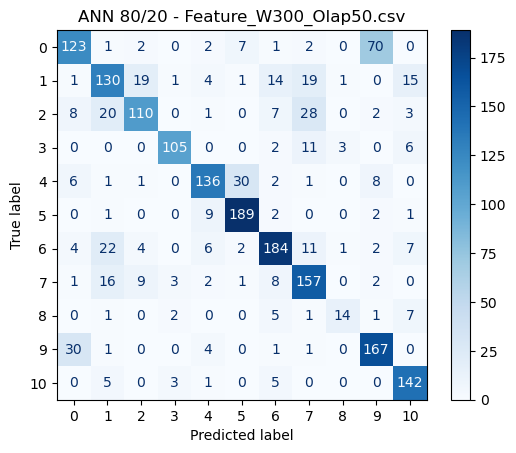

              precision    recall  f1-score   support

           0       0.68      0.77      0.72       312
           1       0.64      0.61      0.62       307
           2       0.71      0.64      0.67       269
           3       0.88      0.91      0.89       190
           4       0.81      0.80      0.81       278
           5       0.85      0.92      0.88       307
           6       0.77      0.74      0.76       364
           7       0.67      0.71      0.69       299
           8       0.67      0.57      0.61        46
           9       0.76      0.71      0.73       307
          10       0.89      0.89      0.89       233

    accuracy                           0.76      2912
   macro avg       0.76      0.75      0.75      2912
weighted avg       0.76      0.76      0.76      2912

Accuracy: 75.82%
Precision: 75.75%
Recall: 75.82%
F1 Score: 75.69%
ROC AUC: 97.51%


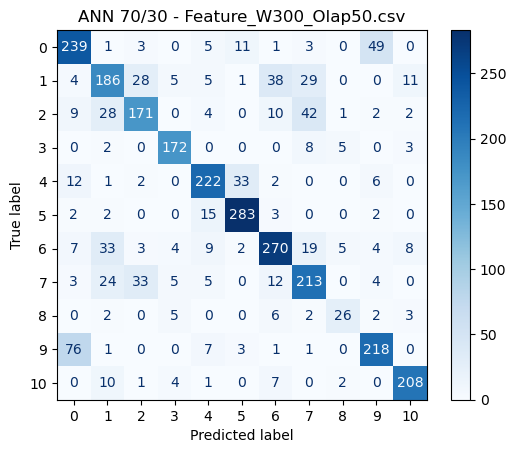

KFold Cross-Validation Scores (80/20 model): [0.77125193 0.76043277 0.75425039 0.74600721 0.76403916]
KFold Mean Accuracy (80/20 model): 75.92%
KFold Std Deviation (80/20 model): 0.0086

KFold Cross-Validation Scores (70/30 model): [0.77125193 0.76043277 0.75425039 0.74600721 0.76403916]
KFold Mean Accuracy (70/30 model): 75.92%
KFold Std Deviation (70/30 model): 0.0086
Processing file 7/10: Feature_W400_Olap0.csv

 ANN (MLPClassifier) on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W400_Olap0.csv...
              precision    recall  f1-score   support

           0       0.53      0.42      0.47        78
           1       0.61      0.61      0.61        77
           2       0.65      0.73      0.69        67
           3       0.85      0.83      0.84        48
           4       0.78      0.67      0.72        69
           5       0.73      0.83      0.78        77
           6       0.74      0.71      0.73        91
           7       0.62      0.61      0.62      

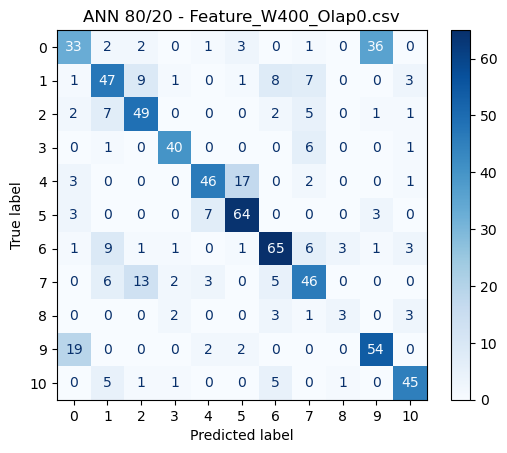

              precision    recall  f1-score   support

           0       0.59      0.68      0.63       117
           1       0.61      0.55      0.58       115
           2       0.68      0.70      0.69       101
           3       0.84      0.93      0.88        72
           4       0.74      0.81      0.77       104
           5       0.80      0.79      0.79       115
           6       0.76      0.76      0.76       136
           7       0.62      0.63      0.63       113
           8       0.50      0.39      0.44        18
           9       0.66      0.52      0.58       115
          10       0.80      0.81      0.80        88

    accuracy                           0.70      1094
   macro avg       0.69      0.69      0.69      1094
weighted avg       0.70      0.70      0.70      1094

Accuracy: 70.11%
Precision: 69.90%
Recall: 70.11%
F1 Score: 69.83%
ROC AUC: 96.28%


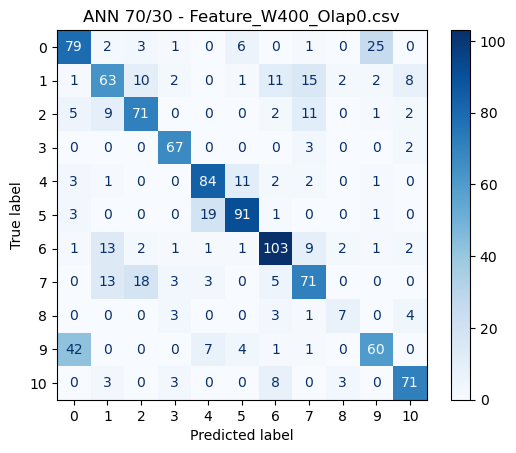

KFold Cross-Validation Scores (80/20 model): [0.68175583 0.67901235 0.71056241 0.71056241 0.68681319]
KFold Mean Accuracy (80/20 model): 69.37%
KFold Std Deviation (80/20 model): 0.0140

KFold Cross-Validation Scores (70/30 model): [0.68175583 0.67901235 0.71056241 0.71056241 0.68681319]
KFold Mean Accuracy (70/30 model): 69.37%
KFold Std Deviation (70/30 model): 0.0140
Processing file 8/10: Feature_W400_Olap50.csv

 ANN (MLPClassifier) on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W400_Olap50.csv...
              precision    recall  f1-score   support

           0       0.63      0.74      0.68       155
           1       0.72      0.72      0.72       152
           2       0.69      0.61      0.65       134
           3       0.90      0.87      0.89        94
           4       0.82      0.62      0.71       138
           5       0.72      0.91      0.81       152
           6       0.82      0.83      0.83       181
           7       0.66      0.70      0.68    

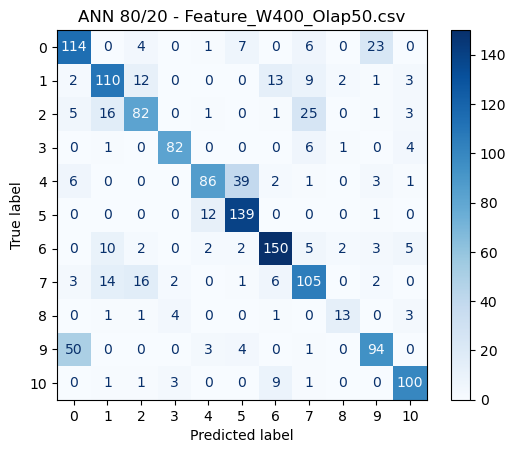

              precision    recall  f1-score   support

           0       0.65      0.75      0.70       233
           1       0.69      0.72      0.71       228
           2       0.71      0.67      0.69       200
           3       0.88      0.92      0.90       141
           4       0.80      0.78      0.79       207
           5       0.80      0.91      0.85       229
           6       0.83      0.85      0.84       271
           7       0.70      0.67      0.68       223
           8       0.75      0.60      0.67        35
           9       0.76      0.63      0.69       228
          10       0.89      0.84      0.86       173

    accuracy                           0.77      2168
   macro avg       0.77      0.76      0.76      2168
weighted avg       0.77      0.77      0.76      2168

Accuracy: 76.57%
Precision: 76.67%
Recall: 76.57%
F1 Score: 76.44%
ROC AUC: 97.59%


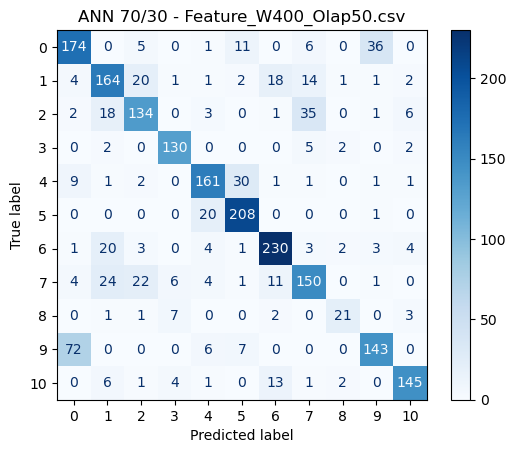

KFold Cross-Validation Scores (80/20 model): [0.74394464 0.72802768 0.76262976 0.72733564 0.75155709]
KFold Mean Accuracy (80/20 model): 74.27%
KFold Std Deviation (80/20 model): 0.0136

KFold Cross-Validation Scores (70/30 model): [0.74394464 0.72802768 0.76262976 0.72733564 0.75155709]
KFold Mean Accuracy (70/30 model): 74.27%
KFold Std Deviation (70/30 model): 0.0136
Processing file 9/10: Feature_W500_Olap0.csv

 ANN (MLPClassifier) on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W500_Olap0.csv...
              precision    recall  f1-score   support

           0       0.60      0.84      0.70        62
           1       0.52      0.52      0.52        61
           2       0.64      0.70      0.67        54
           3       0.89      0.84      0.86        38
           4       0.83      0.61      0.70        56
           5       0.81      0.90      0.85        61
           6       0.78      0.79      0.79        73
           7       0.59      0.58      0.59      

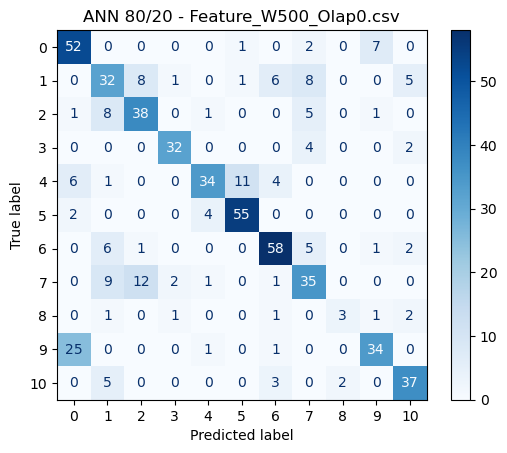

              precision    recall  f1-score   support

           0       0.55      0.61      0.58        93
           1       0.46      0.43      0.45        92
           2       0.56      0.63      0.59        81
           3       0.83      0.89      0.86        56
           4       0.68      0.60      0.63        84
           5       0.69      0.75      0.72        92
           6       0.68      0.76      0.72       109
           7       0.55      0.51      0.53        90
           8       0.29      0.29      0.29        14
           9       0.61      0.60      0.60        92
          10       0.83      0.57      0.68        70

    accuracy                           0.62       873
   macro avg       0.61      0.60      0.60       873
weighted avg       0.63      0.62      0.62       873

Accuracy: 62.43%
Precision: 62.78%
Recall: 62.43%
F1 Score: 62.29%
ROC AUC: 94.91%


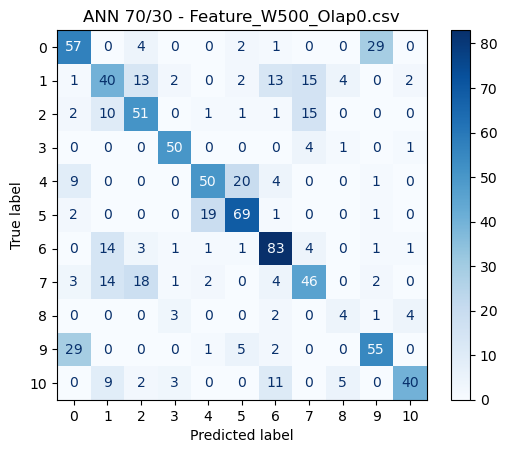

KFold Cross-Validation Scores (80/20 model): [0.66323024 0.69243986 0.65060241 0.75043029 0.67125645]
KFold Mean Accuracy (80/20 model): 68.56%
KFold Std Deviation (80/20 model): 0.0352

KFold Cross-Validation Scores (70/30 model): [0.66323024 0.69243986 0.65060241 0.75043029 0.67125645]
KFold Mean Accuracy (70/30 model): 68.56%
KFold Std Deviation (70/30 model): 0.0352
Processing file 10/10: Feature_W500_Olap50.csv

 ANN (MLPClassifier) on c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Feature_W500_Olap50.csv...
              precision    recall  f1-score   support

           0       0.71      0.77      0.74       124
           1       0.61      0.64      0.62       121
           2       0.75      0.72      0.73       106
           3       0.93      0.85      0.89        74
           4       0.81      0.90      0.85       110
           5       0.94      0.83      0.88       121
           6       0.83      0.84      0.83       144
           7       0.71      0.74      0.72   

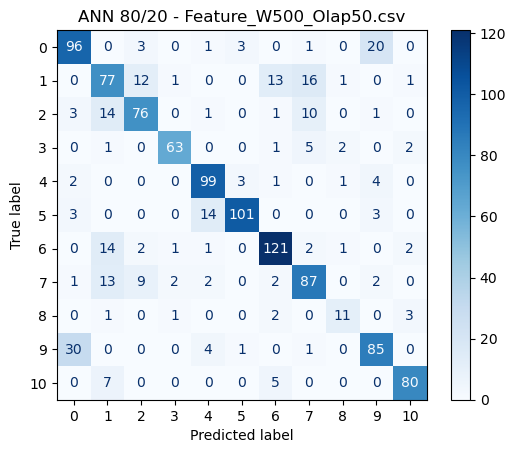

              precision    recall  f1-score   support

           0       0.73      0.68      0.70       185
           1       0.64      0.73      0.68       182
           2       0.76      0.74      0.75       159
           3       0.93      0.88      0.91       111
           4       0.81      0.88      0.84       165
           5       0.83      0.92      0.87       182
           6       0.83      0.88      0.85       216
           7       0.81      0.68      0.74       177
           8       0.83      0.74      0.78        27
           9       0.72      0.66      0.69       182
          10       0.91      0.88      0.89       138

    accuracy                           0.79      1724
   macro avg       0.80      0.79      0.79      1724
weighted avg       0.79      0.79      0.79      1724

Accuracy: 78.77%
Precision: 78.90%
Recall: 78.77%
F1 Score: 78.68%
ROC AUC: 97.91%


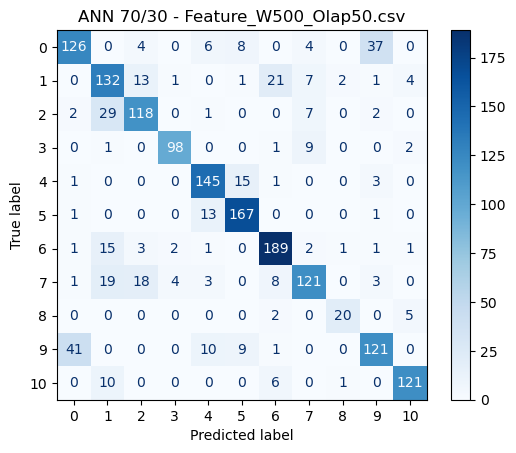

KFold Cross-Validation Scores (80/20 model): [0.79895561 0.73803307 0.76936466 0.77023499 0.79965157]
KFold Mean Accuracy (80/20 model): 77.52%
KFold Std Deviation (80/20 model): 0.0228

KFold Cross-Validation Scores (70/30 model): [0.79895561 0.73803307 0.76936466 0.77023499 0.79965157]
KFold Mean Accuracy (70/30 model): 77.52%
KFold Std Deviation (70/30 model): 0.0228

Final Results:


,Feature File,Model,Split,Accuracy,Precision,Recall,F1-Score,ROC_AUC,CV Mean Accuracy,CV Std Accuracy,Best Params
0,Feature_W100_Olap0.csv,ANN (MLP),80/20,0.687077,0.686622,0.687077,0.683789,0.954467,0.692609,0.006983,"{'solver': 'adam', 'learning_rate': 'adaptive'..."
1,Feature_W100_Olap0.csv,ANN (MLP),70/30,0.686217,0.689226,0.686217,0.685048,0.955055,0.692609,0.006983,"{'solver': 'adam', 'learning_rate': 'adaptive'..."
2,Feature_W100_Olap50.csv,ANN (MLP),80/20,0.718935,0.719671,0.718935,0.717269,0.964276,0.735209,0.005332,"{'solver': 'adam', 'learning_rate': 'adaptive'..."
3,Feature_W100_Olap50.csv,ANN (MLP),70/30,0.709459,0.709829,0.709459,0.708139,0.962854,0.735209,0.005332,"{'solver': 'adam', 'learning_rate': 'adaptive'..."
4,Feature_W200_Olap0.csv,ANN (MLP),80/20,0.681169,0.683232,0.681169,0.679612,0.957443,0.687111,0.022862,"{'solver': 'adam', 'learning_rate': 'adaptive'..."
5,Feature_W200_Olap0.csv,ANN (MLP),70/30,0.690530,0.686383,0.690530,0.686991,0.959244,0.687111,0.022862,"{'solver': 'adam', 'learning_rate': 'adaptive'..."
6,Feature_W200_Olap50.csv,ANN (MLP),80/20,0.721843,0.727393,0.721843,0.720799,0.965687,0.745135,0.010992,"{'solver': 'adam', 'learning_rate': 'adaptive'..."
7,Feature_W200_Olap50.csv,ANN (MLP),70/30,0.747440,0.747821,0.747440,0.745314,0.969091,0.745135,0.010992,"{'solver': 'adam', 'learning_rate': 'adaptive'..."
8,Feature_W300_Olap0.csv,ANN (MLP),80/20,0.694985,0.702711,0.694985,0.692557,0.956580,0.678072,0.022150,"{'solver': 'adam', 'learning_rate': 'adaptive'..."
9,Feature_W300_Olap0.csv,ANN (MLP),70/30,0.703754,0.708283,0.703754,0.701112,0.958163,0.678072,0.022150,"{'solver': 'adam', 'learning_rate': 'adaptive'..."


In [9]:
mlp_params = {
    'hidden_layer_sizes': [(50,), (100,), (100, 50)],
    'activation': ['relu', 'tanh', 'logistic'],
    'solver': ['adam', 'sgd'],
    'alpha': [0.0001, 0.001, 0.01],
    'learning_rate': ['constant', 'adaptive']
}

mlp_results = []
best_mlp_params = None  # Save best params here

# for file_path in fileList:
for i, file_path in enumerate(fileList):
    print(f"Processing file {i+1}/{len(fileList)}: {os.path.basename(file_path)}")
    print(f"\n ANN (MLPClassifier) on {file_path}...")

    df = pd.read_csv(file_path)
    X = df.drop(columns=['exp_Name'])
    y = df['exp_Name']
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Splits
    X_train_80, X_test_20, y_train_80, y_test_20 = train_test_split(
        X_scaled, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
    )
    X_train_70, X_test_30, y_train_70, y_test_30 = train_test_split(
        X_scaled, y_encoded, test_size=0.3, random_state=42, stratify=y_encoded
    )

    if i == 0:
        print("\nRunning RandomizedSearchCV for MLPClassifier on first file...")
        mlp_model = MLPClassifier(max_iter=300, random_state=42)
        mlp_search = RandomizedSearchCV(
            mlp_model, param_distributions=mlp_params, n_iter=10,
            cv=5, random_state=42, verbose=2, n_jobs=-1
        )
        mlp_search.fit(X_train_80, y_train_80)
        best_mlp_params = mlp_search.best_params_
        print("\nBest Hyperparameters Found:", best_mlp_params)

    # Use best_mlp_params
    mlp_80 = MLPClassifier(**best_mlp_params, max_iter=300, random_state=42, early_stopping=True)
    mlp_80.fit(X_train_80, y_train_80)

    acc80, prec80, rec80, f180, roc_auc80 = evaluate_model(mlp_80, X_test_20, y_test_20)
    plot_confusion(mlp_80, X_test_20, y_test_20, title=f"ANN 80/20 - {os.path.basename(file_path)}")

    mlp_70 = MLPClassifier(**best_mlp_params, max_iter=300, random_state=42, early_stopping=True)
    mlp_70.fit(X_train_70, y_train_70)

    acc70, prec70, rec70, f170, roc_auc70 = evaluate_model(mlp_70, X_test_30, y_test_30)
    plot_confusion(mlp_70, X_test_30, y_test_30, title=f"ANN 70/30 - {os.path.basename(file_path)}")

    # KFold Cross-validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    kf_scores_80 = cross_val_score(mlp_80, X_scaled, y_encoded, cv=kf, scoring='accuracy', n_jobs=-1)
    print("KFold Cross-Validation Scores (80/20 model):", kf_scores_80)
    print("KFold Mean Accuracy (80/20 model): {:.2f}%".format(kf_scores_80.mean() * 100))
    print("KFold Std Deviation (80/20 model): {:.4f}".format(kf_scores_80.std()))

    kf_scores_70 = cross_val_score(mlp_70, X_scaled, y_encoded, cv=kf, scoring='accuracy', n_jobs=-1)
    print("\nKFold Cross-Validation Scores (70/30 model):", kf_scores_70)
    print("KFold Mean Accuracy (70/30 model): {:.2f}%".format(kf_scores_70.mean() * 100))
    print("KFold Std Deviation (70/30 model): {:.4f}".format(kf_scores_70.std()))

    # Save results
    mlp_results.append([
        os.path.basename(file_path), "ANN (MLP)", "80/20", acc80, prec80, rec80, f180, roc_auc80,
        kf_scores_80.mean(), kf_scores_80.std(), best_mlp_params
    ])
    mlp_results.append([
        os.path.basename(file_path), "ANN (MLP)", "70/30", acc70, prec70, rec70, f170, roc_auc70,
        kf_scores_70.mean(), kf_scores_70.std(), best_mlp_params
    ])

# Create final dataframe
mlp_results_df = pd.DataFrame(
    mlp_results,
    columns=[
        "Feature File", "Model", "Split", "Accuracy", "Precision", "Recall", "F1-Score", "ROC_AUC",
        "CV Mean Accuracy", "CV Std Accuracy", "Best Params"
    ]
)

# Save results to CSV
mlp_results_df.to_csv('results_ann_mlp.csv', index=False)

# Display results
print("\nFinal Results:")
display(mlp_results_df)

### Final Results Merge

In [10]:
import pandas as pd

# Load each model's CSV file into a dataframe
logistic_results_df = pd.read_csv('results_logistic_regression.csv')
dt_results_df = pd.read_csv('results_decision_tree.csv')
rf_results_df = pd.read_csv('results_random_forest.csv')
nb_results_df = pd.read_csv('results_gaussian_nb.csv')
svm_results_df = pd.read_csv('results_svm.csv')
knn_results_df = pd.read_csv('results_knn.csv')
ada_results_df = pd.read_csv('results_adaboost.csv')
gb_results_df = pd.read_csv('results_gradient_boost.csv')
xgb_results_df = pd.read_csv('results_xgboost.csv')
mlp_results_df = pd.read_csv('results_ann_mlp.csv')

# Concatenate them into a final dataframe
final_results = pd.concat([
    logistic_results_df,
    dt_results_df,
    rf_results_df,
    nb_results_df,
    svm_results_df,
    knn_results_df,
    ada_results_df,
    gb_results_df,
    xgb_results_df,
    mlp_results_df
], ignore_index=True)

# Sort and save
final_results.sort_values(by=["Feature File", "Model", "Split"], inplace=True)
final_results.to_csv("Final_Project_All_Results.csv", index=False)

# Optionally display
# final_results.head()

display(final_results)

,Feature File,Model,Split,Accuracy,Precision,Recall,F1-Score,ROC_AUC,CV Mean Accuracy,CV Std Accuracy,Best Params
181,Feature_W100_Olap0.csv,ANN (MLP),70/30,0.686217,0.689226,0.686217,0.685048,0.955055,0.692609,0.006983,"{'solver': 'adam', 'learning_rate': 'adaptive'..."
180,Feature_W100_Olap0.csv,ANN (MLP),80/20,0.687077,0.686622,0.687077,0.683789,0.954467,0.692609,0.006983,"{'solver': 'adam', 'learning_rate': 'adaptive'..."
121,Feature_W100_Olap0.csv,AdaBoost,70/30,0.381232,0.395577,0.381232,0.362855,0.829085,0.364781,0.027604,"{'n_estimators': 200, 'learning_rate': 0.1}"
120,Feature_W100_Olap0.csv,AdaBoost,80/20,0.369080,0.365082,0.369080,0.344581,0.829991,0.364781,0.027604,"{'n_estimators': 200, 'learning_rate': 0.1}"
21,Feature_W100_Olap0.csv,Decision Tree,70/30,0.624408,0.623999,0.624408,0.623504,0.833826,0.621751,0.008703,"{'min_samples_split': 10, 'min_samples_leaf': ..."
...,...,...,...,...,...,...,...,...,...,...,...
58,Feature_W500_Olap50.csv,Random Forest,80/20,0.859878,0.862260,0.859878,0.860135,0.989573,0.864556,0.011023,"{'n_estimators': 100, 'min_samples_split': 2, ..."
99,Feature_W500_Olap50.csv,SVM,70/30,0.796404,0.800510,0.796404,0.797289,0.975172,0.805364,0.007848,"{'kernel': 'poly', 'gamma': 0.1, 'C': 100}"
98,Feature_W500_Olap50.csv,SVM,80/20,0.797215,0.804848,0.797215,0.798531,0.974842,0.807453,0.008713,"{'kernel': 'poly', 'gamma': 0.1, 'C': 1}"
179,Feature_W500_Olap50.csv,XGBoost,70/30,0.856148,0.856531,0.856148,0.856120,0.989847,0.869955,0.014833,"{'subsample': 0.8, 'n_estimators': 200, 'max_d..."


### Combining and Saving Results

In [38]:
# Combine all results into one CSV
import pandas as pd
import glob

all_results = []

# Glob all model result csvs
for file in glob.glob("results_*.csv"):
    df = pd.read_csv(file)
    all_results.append(df)

final_results = pd.concat(all_results, ignore_index=True)

# Nicely sorted
final_results.sort_values(by=["Feature File", "Model", "Split"], inplace=True)
final_results

# Save to CSV
final_results.to_csv("Final_Project_All_Results.csv", index=False)


## Plots

#### Nonspecific Breakdown

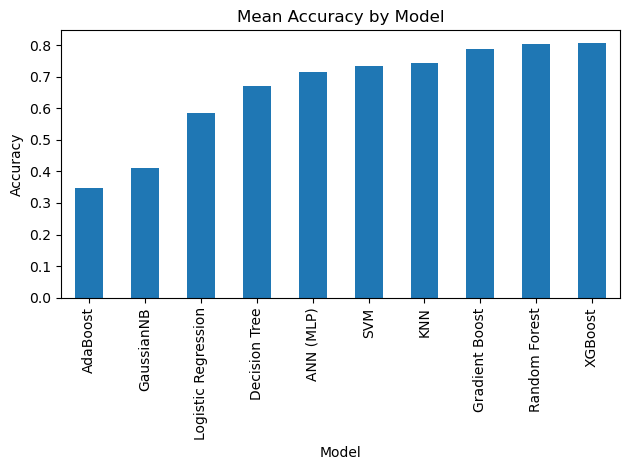

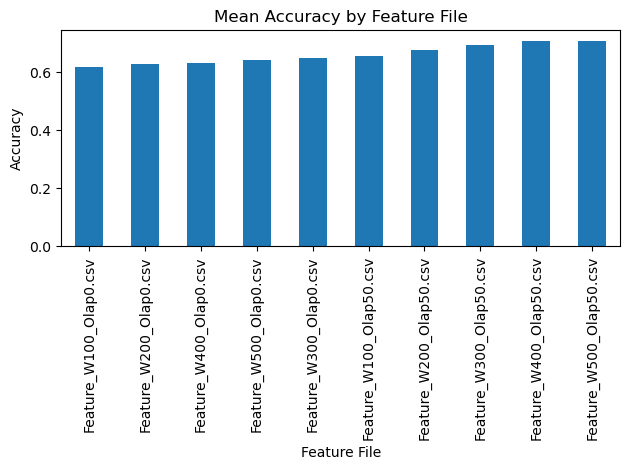

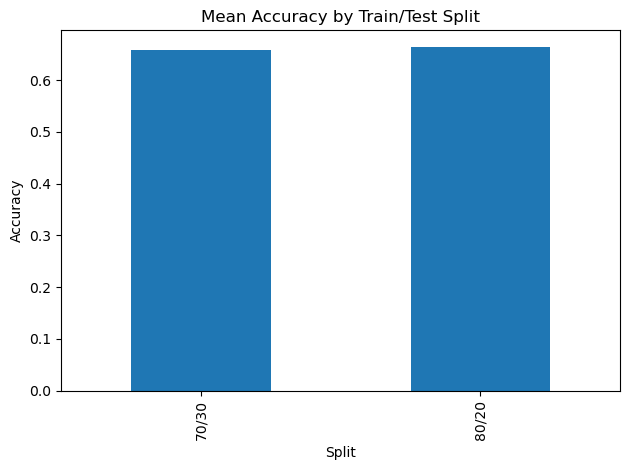

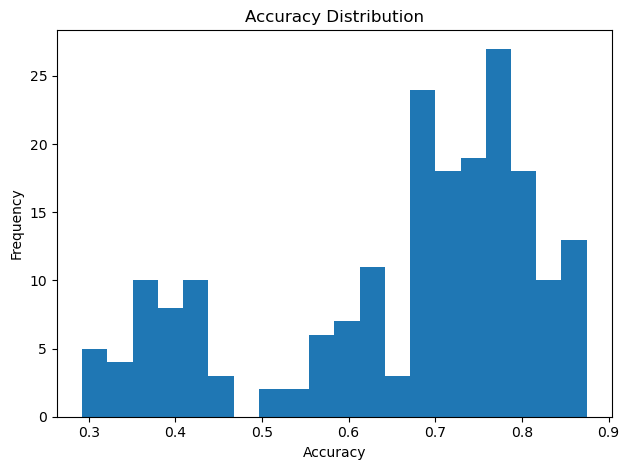

In [39]:
import pandas as pd
import matplotlib.pyplot as plt

# Load only the relevant columns to conserve memory
cols = ['Model', 'Feature File', 'Split', 'Accuracy']
df = pd.read_csv('Final_Project_All_Results.csv', usecols=cols)

# 1. Mean Accuracy by Model
model_means = df.groupby('Model')['Accuracy'].mean().sort_values()
plt.figure()
model_means.plot(kind='bar')
plt.title('Mean Accuracy by Model')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.tight_layout()
plt.show()
plt.close()

# 2. Mean Accuracy by Feature File
feature_means = df.groupby('Feature File')['Accuracy'].mean().sort_values()
plt.figure()
feature_means.plot(kind='bar')
plt.title('Mean Accuracy by Feature File')
plt.xlabel('Feature File')
plt.ylabel('Accuracy')
plt.tight_layout()
plt.show()
plt.close()

# 3. Mean Accuracy by Split
split_means = df.groupby('Split')['Accuracy'].mean()
plt.figure()
split_means.plot(kind='bar')
plt.title('Mean Accuracy by Train/Test Split')
plt.xlabel('Split')
plt.ylabel('Accuracy')
plt.tight_layout()
plt.show()
plt.close()

# 4. Distribution of Accuracy
plt.figure()
plt.hist(df['Accuracy'], bins=20)
plt.title('Accuracy Distribution')
plt.xlabel('Accuracy')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()
plt.close()


#### Feature File by Model by Split

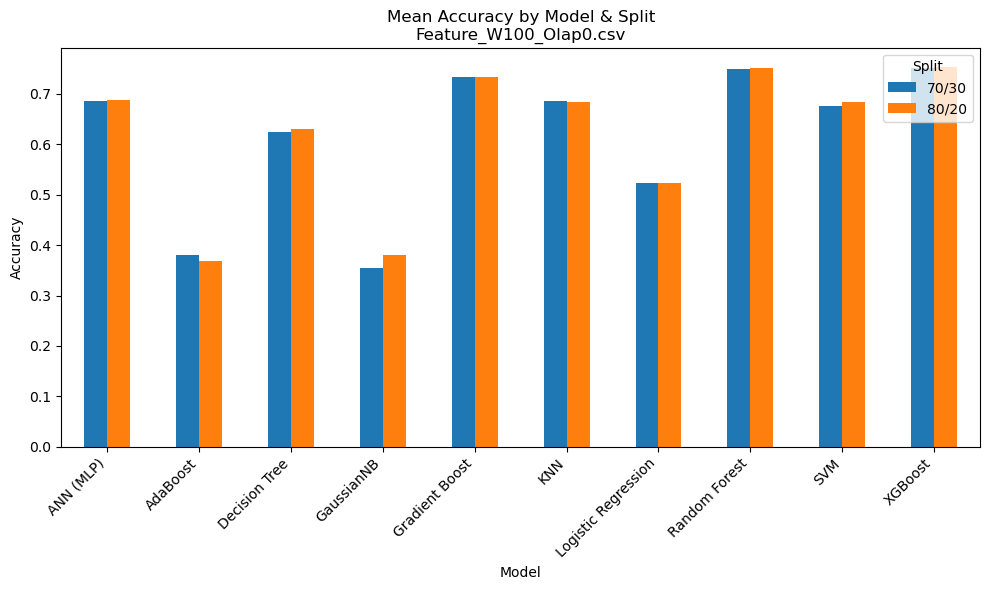

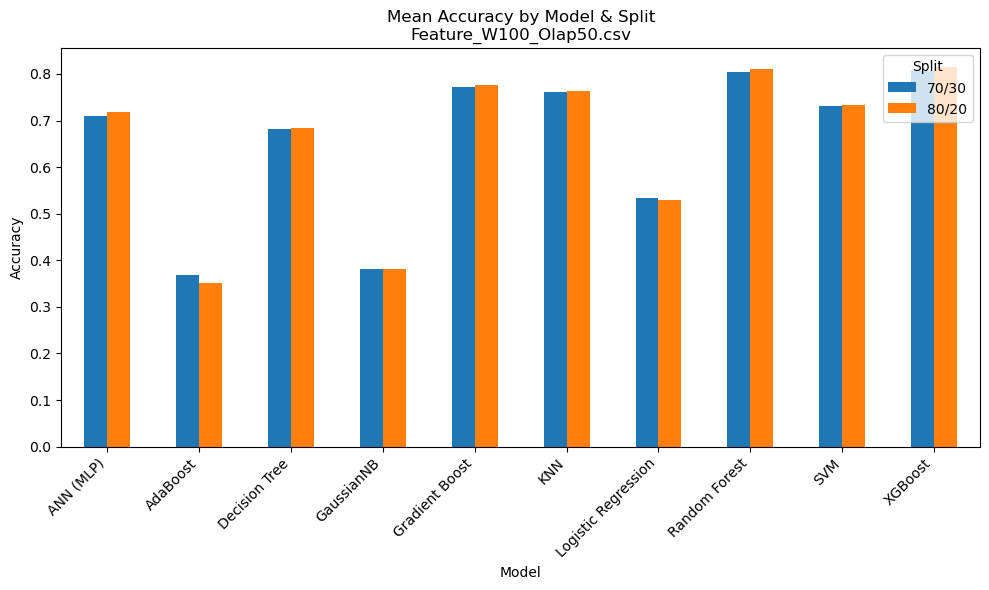

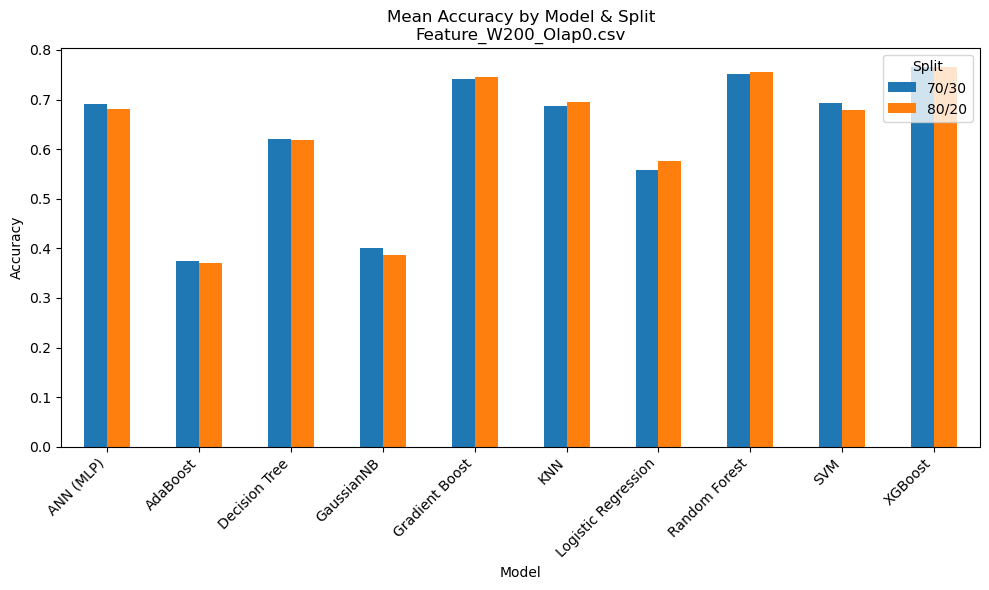

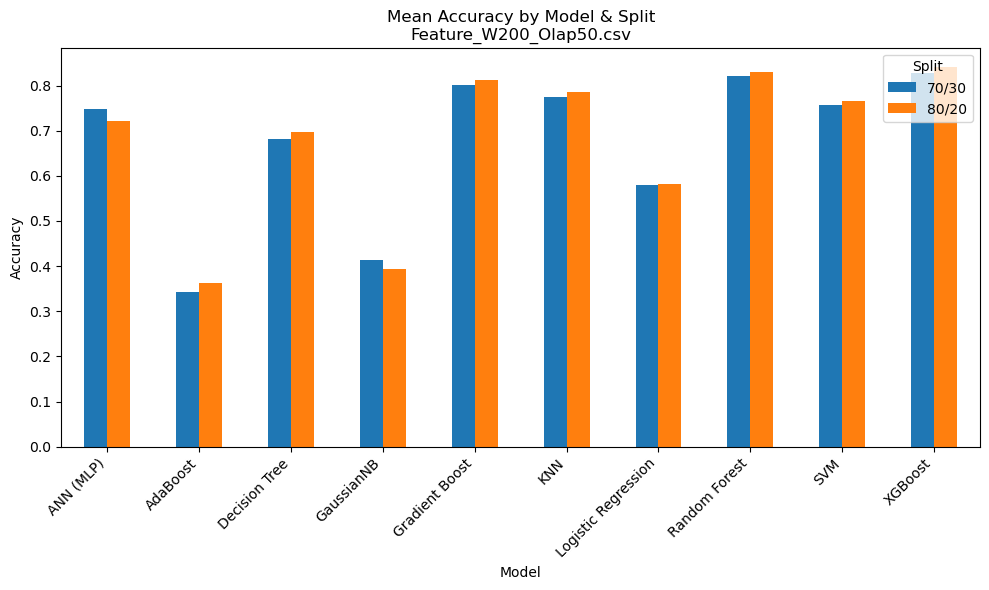

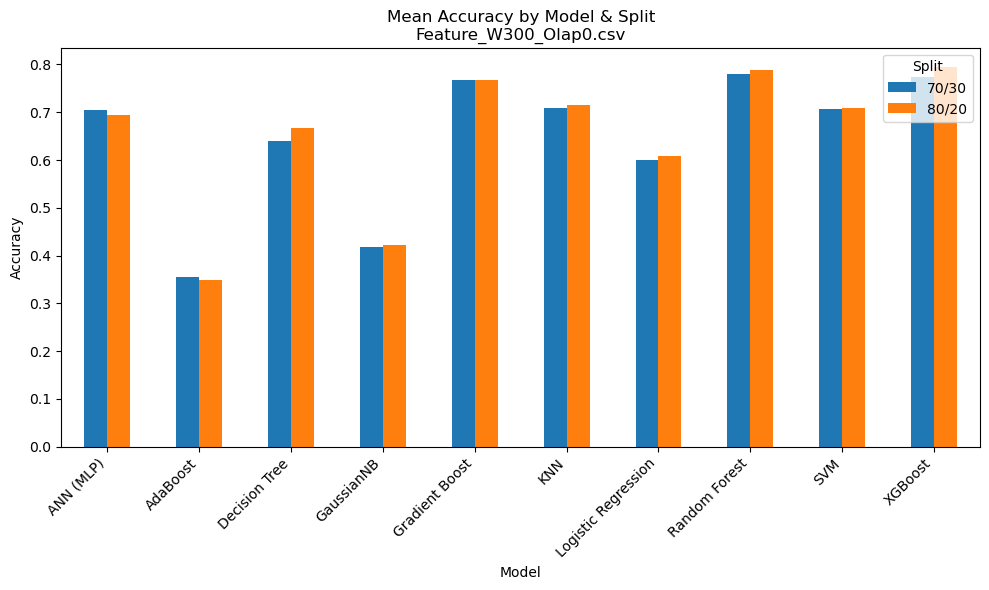

...

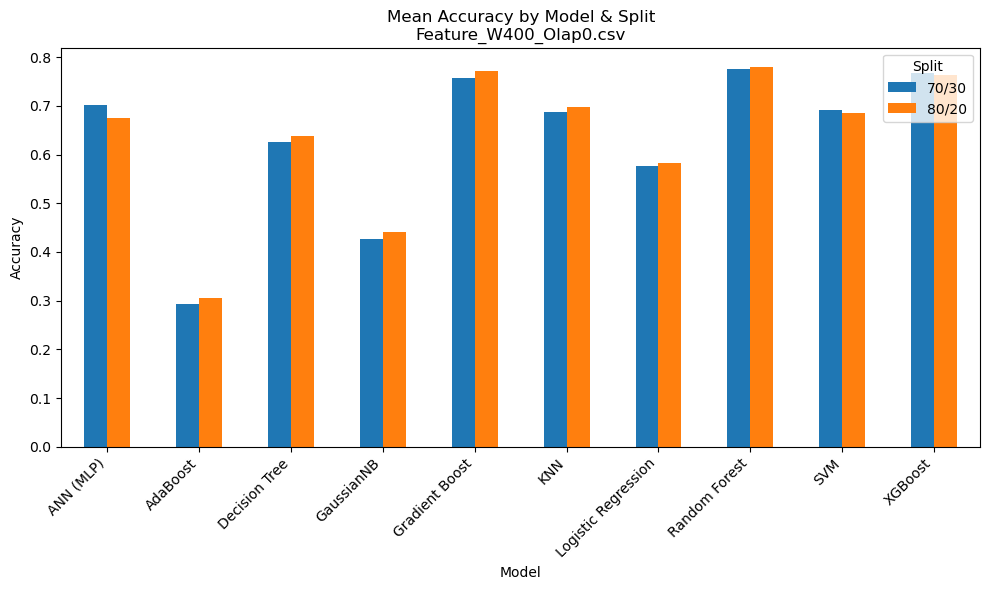

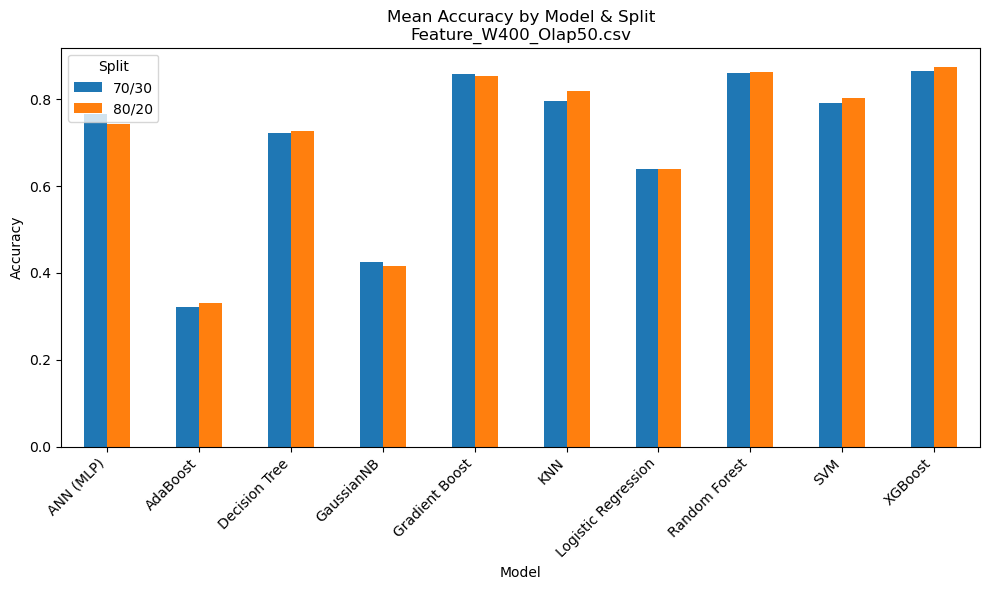

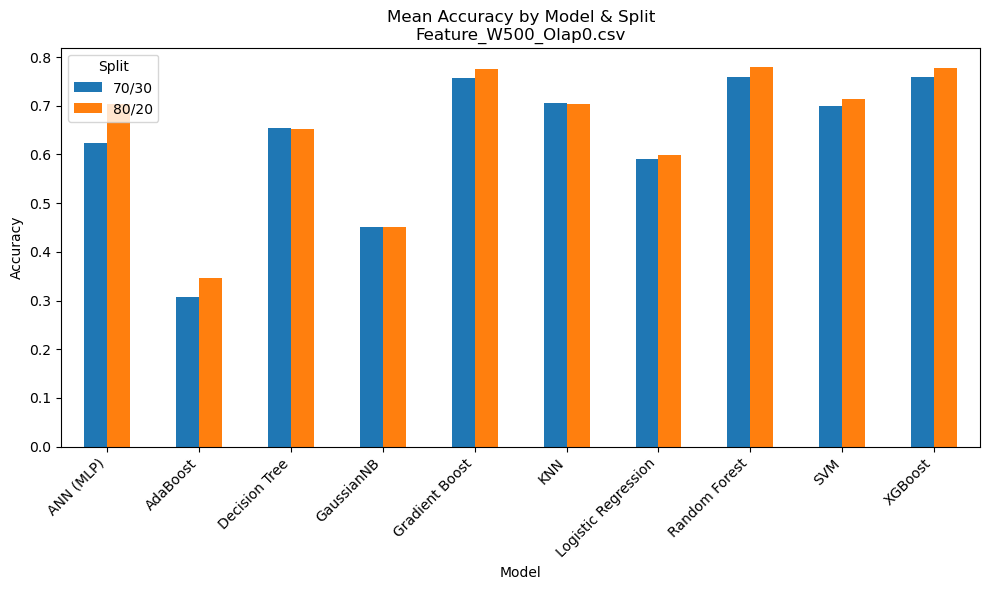

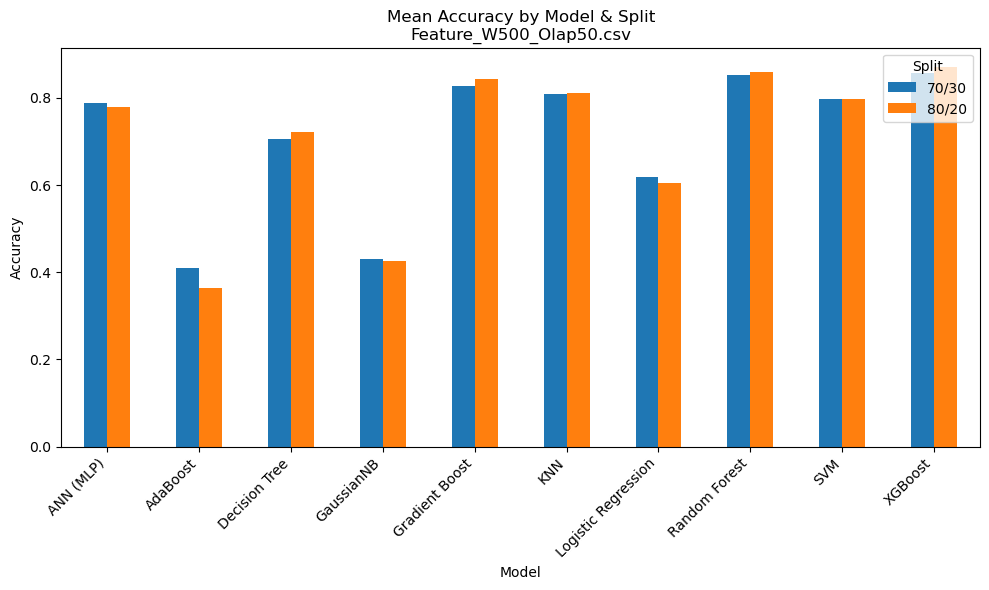

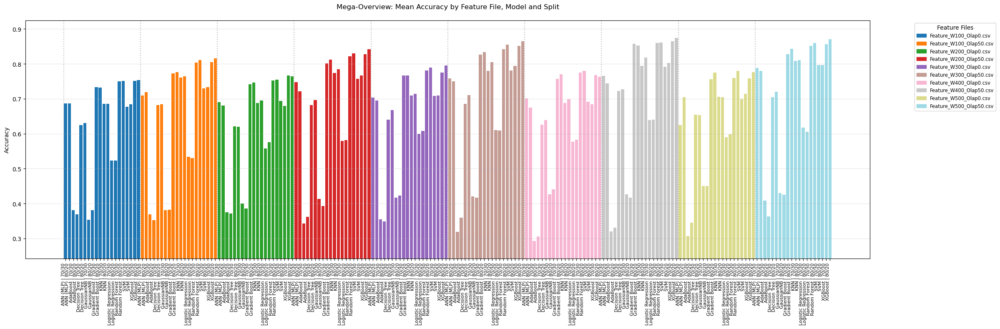

<Figure size 1600x1200 with 0 Axes>

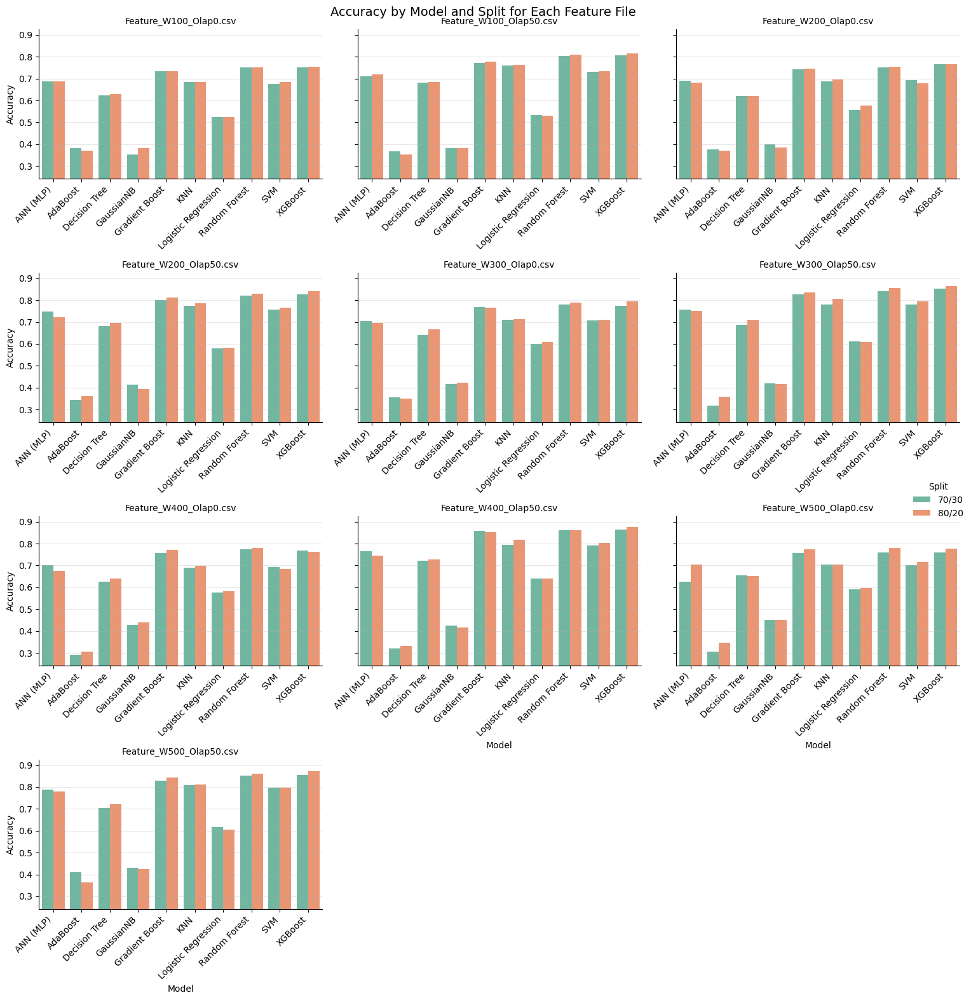

In [40]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1) Load only the columns we need
df = pd.read_csv(
    'Final_Project_All_Results.csv',
    usecols=['Feature File', 'Model', 'Split', 'Accuracy']
)

# 2) Compute mean accuracy for each Feature File → Model → Split
pivot = (
    df
    .groupby(['Feature File', 'Model', 'Split'])['Accuracy']
    .mean()
    .unstack()             # gives two columns: '70/30' & '80/20'
)

# 3) Plot one separate chart per feature file
for feature_file in pivot.index.get_level_values(0).unique():
    data = pivot.loc[feature_file]       # DataFrame: index=Model, cols=['70/30','80/20']
    fig, ax = plt.subplots(figsize=(10,6))
    data.plot(kind='bar', ax=ax)
    ax.set_title(f'Mean Accuracy by Model & Split\n{feature_file}')
    ax.set_xlabel('Model')
    ax.set_ylabel('Accuracy')
    ax.legend(title='Split')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# 4) Improved "Mega-overview" plot
plt.figure(figsize=(24, 8))

# Create flattened and sorted data
flat = (
    df
    .groupby(['Feature File', 'Model', 'Split'])['Accuracy']
    .mean()
    .reset_index()
    .sort_values(['Feature File', 'Model', 'Split'])
    .assign(Combo=lambda x: x['Model'] + " | " + x['Split'])
)

# Color coding by feature file
unique_files = flat['Feature File'].nunique()
palette = plt.cm.get_cmap('tab20', unique_files)
file_colors = {file: palette(i) for i, file in enumerate(flat['Feature File'].unique())}

# Plot bars
bars = plt.bar(
    range(len(flat)),
    flat['Accuracy'],
    width=0.8,
    color=[file_colors[file] for file in flat['Feature File']]
)

# X-axis labels - show Model+Split
plt.xticks(
    range(len(flat)),
    flat['Combo'],
    rotation=90,
    ha='right',
    fontsize=8
)

# Add vertical separators between feature files
current_file = None
for idx, file in enumerate(flat['Feature File']):
    if file != current_file:
        plt.axvline(idx - 0.5, color='gray', linestyle=':', alpha=0.5)
        current_file = file

# Add legend
legend_handles = [
    plt.Rectangle((0,0), 1, 1, color=color, label=file)
    for file, color in file_colors.items()
]
plt.legend(
    handles=legend_handles,
    title='Feature Files',
    bbox_to_anchor=(1.05, 1),
    loc='upper left',
    fontsize='small'
)

# Add grid and labels
plt.grid(axis='y', alpha=0.3)
plt.title('Mega-Overview: Mean Accuracy by Feature File, Model and Split', pad=20)
plt.ylabel('Accuracy')
plt.ylim(max(0, flat['Accuracy'].min() - 0.05), min(1, flat['Accuracy'].max() + 0.05))
plt.tight_layout()
plt.show()

# 5) Corrected Faceted Plot with proper representation of all splits (no data labels)
plt.figure(figsize=(16, 12))

# Create a properly formatted dataframe for visualization
plot_data = (
    df
    .groupby(['Feature File', 'Model', 'Split'])['Accuracy']
    .mean()
    .reset_index()
    .sort_values(['Feature File', 'Model', 'Split'])
)

# Create the faceted plot
g = sns.catplot(
    data=plot_data,
    x='Model',
    y='Accuracy',
    hue='Split',
    col='Feature File',
    kind='bar',
    height=4,
    aspect=1.2,
    col_wrap=3,
    sharey=True,
    sharex=False,
    palette='Set2',
    dodge=True,  # This ensures bars for different splits are side-by-side
    legend_out=True  # Moves legend outside the plots
)

# Customize each subplot
for ax in g.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_xlabel('Model')
    
    # Set y-axis limits to be consistent across all plots
    ax.set_ylim(
        max(0, plot_data['Accuracy'].min() - 0.05), 
        min(1, plot_data['Accuracy'].max() + 0.05)
    )
    
    # Add grid lines for better readability
    ax.grid(axis='y', alpha=0.3)

# Overall formatting
g.set_titles("{col_name}", size=10)
g.fig.subplots_adjust(top=0.94)
g.fig.suptitle('Accuracy by Model and Split for Each Feature File', y=0.98, size=14)
g.set_axis_labels("Model", "Accuracy")
g._legend.set_title('Split')  # Properly set legend title

plt.tight_layout()
plt.show()

#### Organized by Top Accuracy Ranking per Feature File

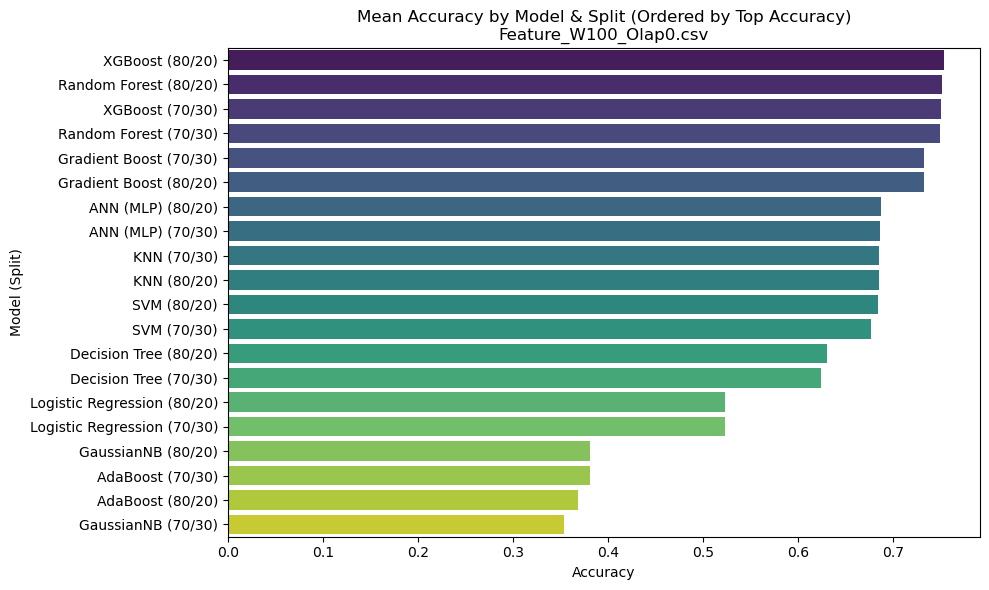

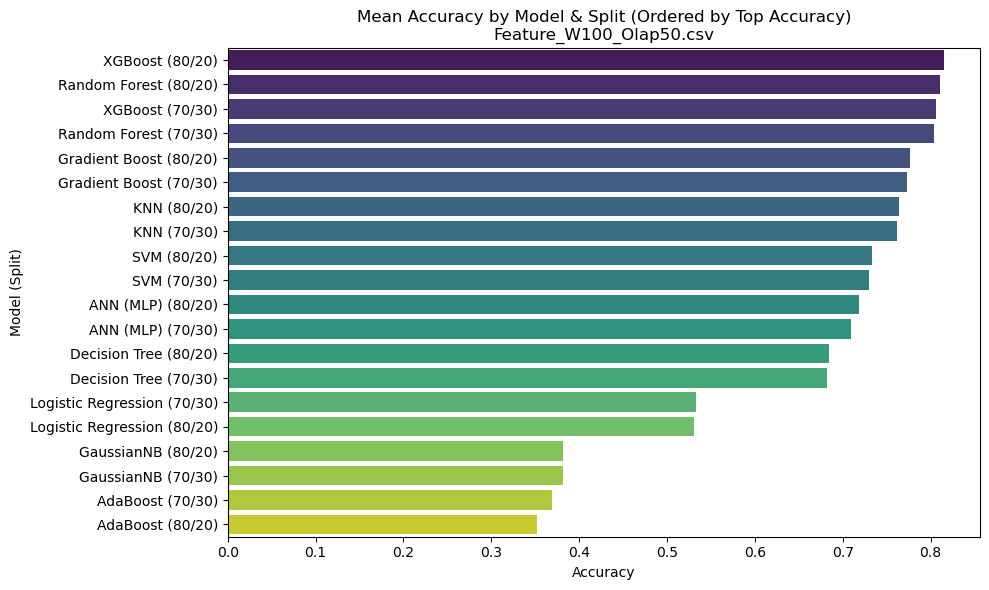

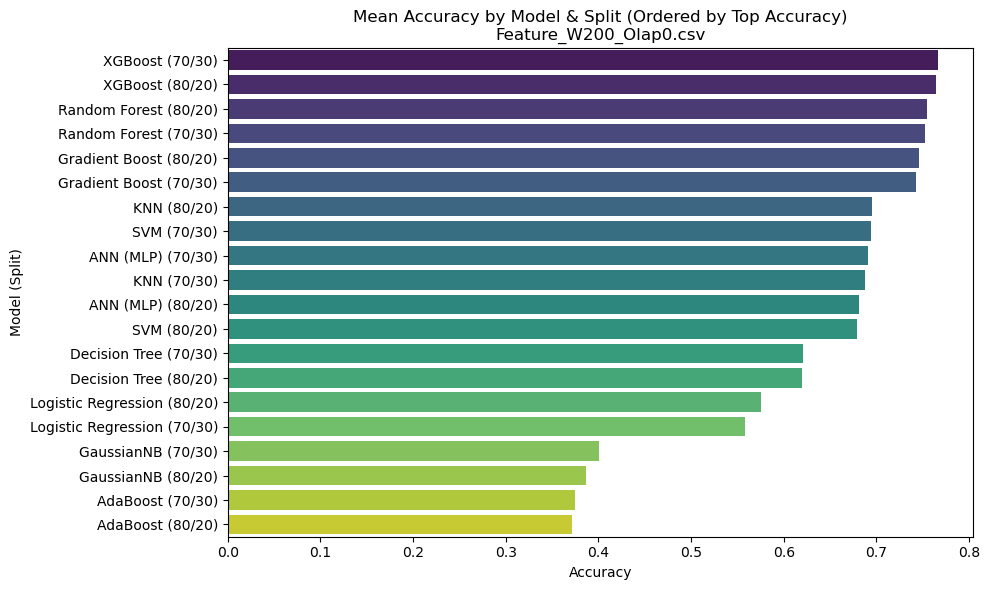

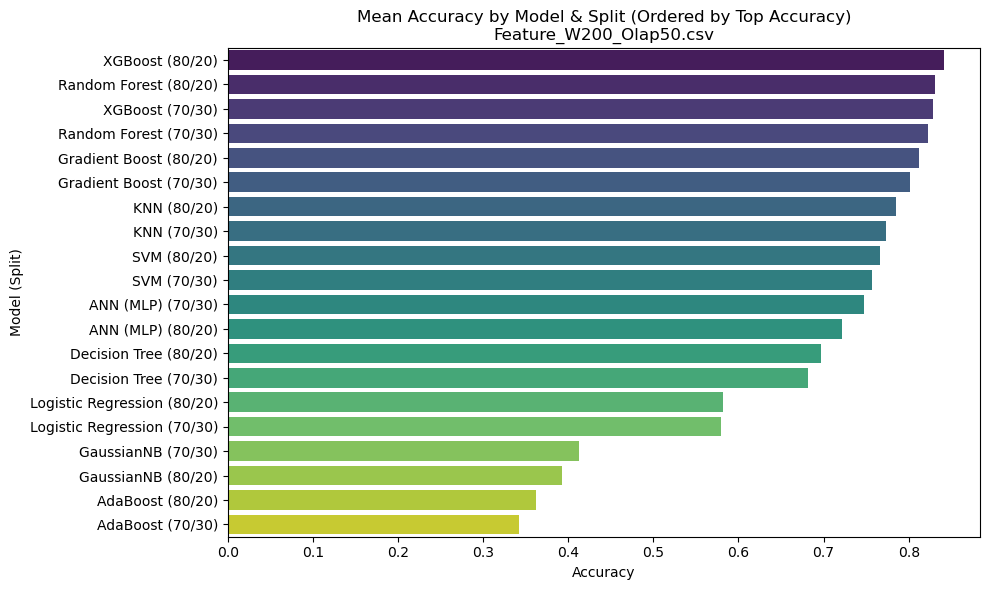

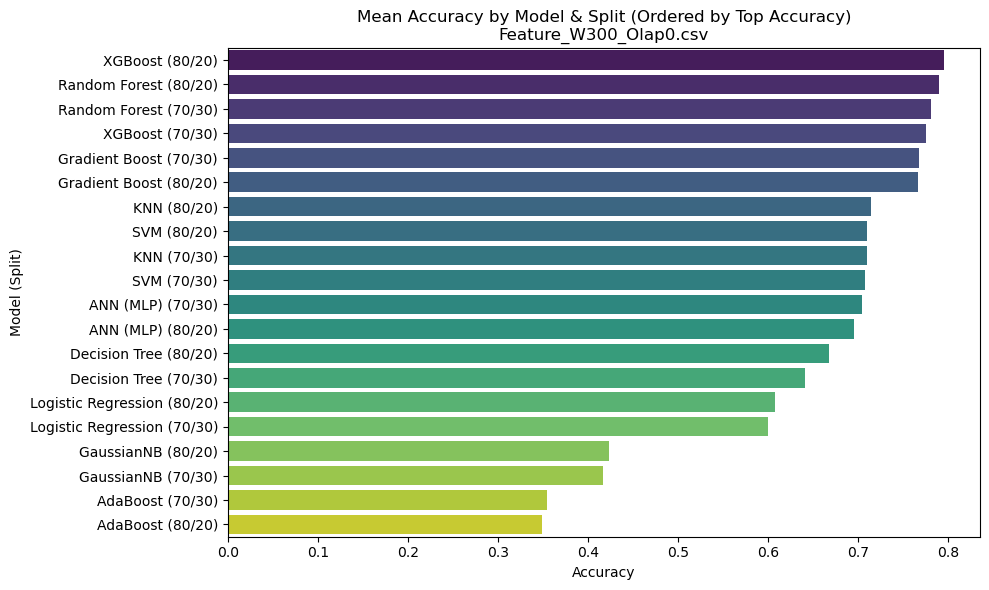

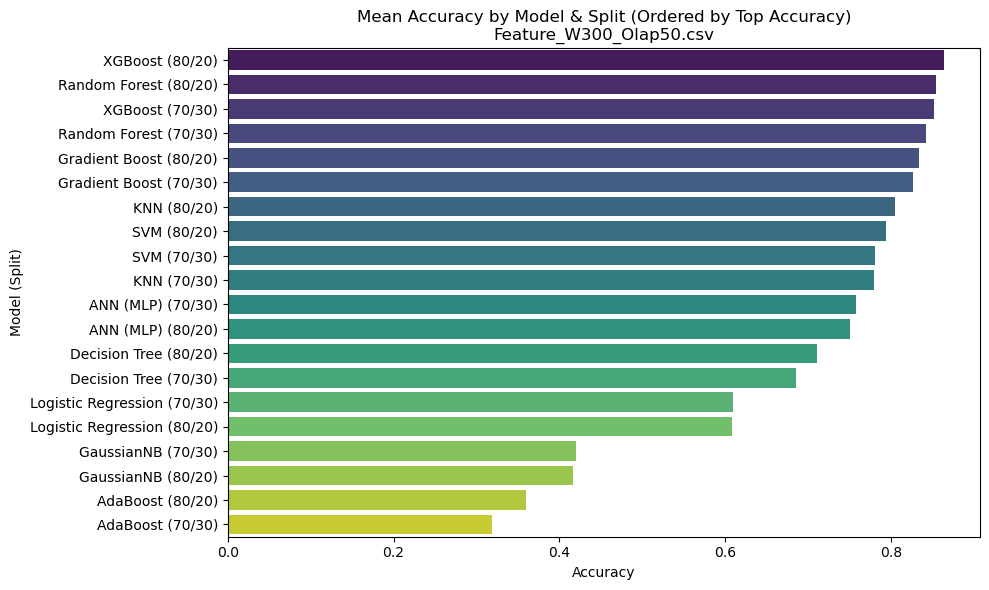

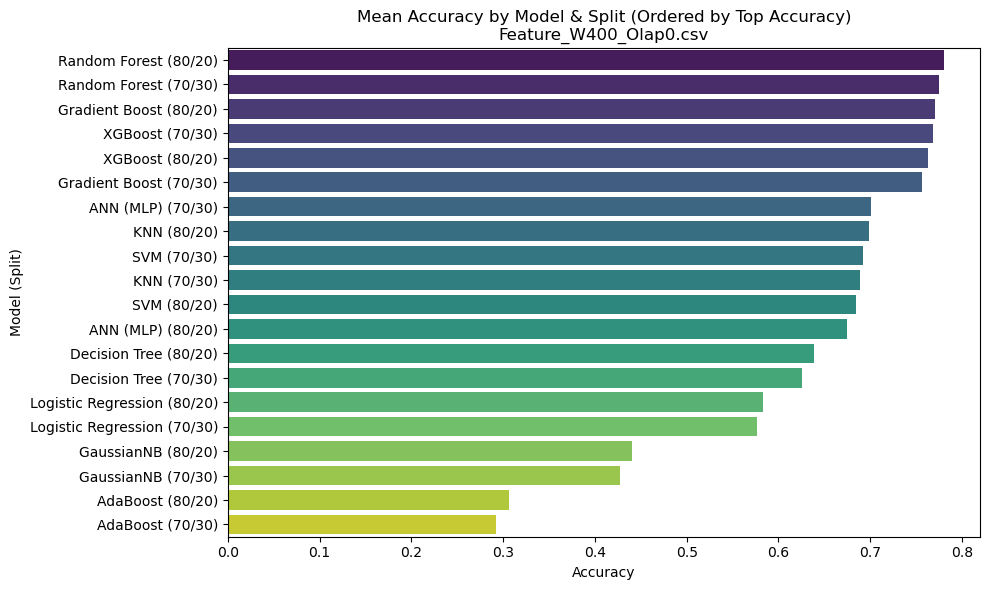

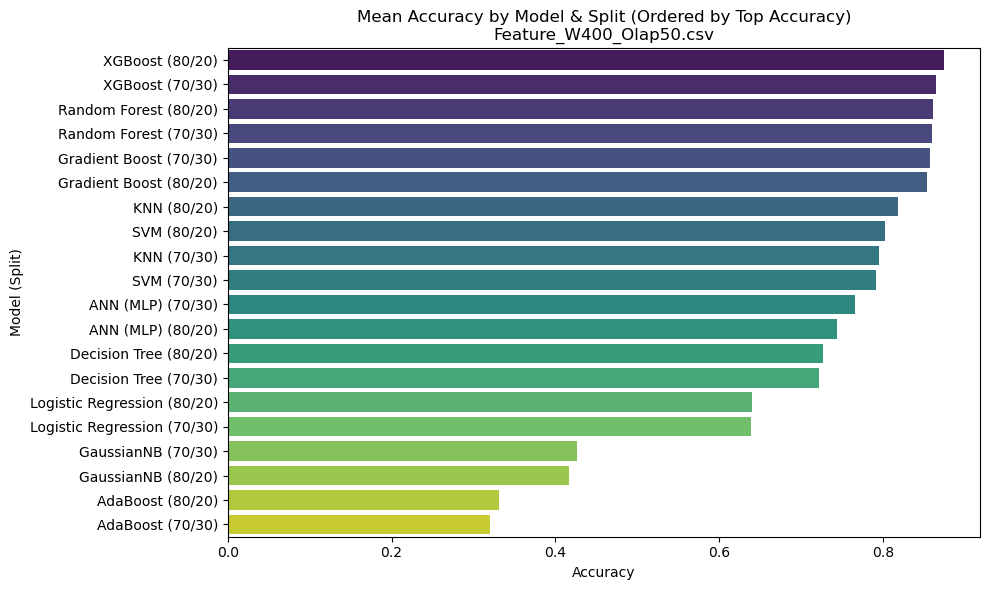

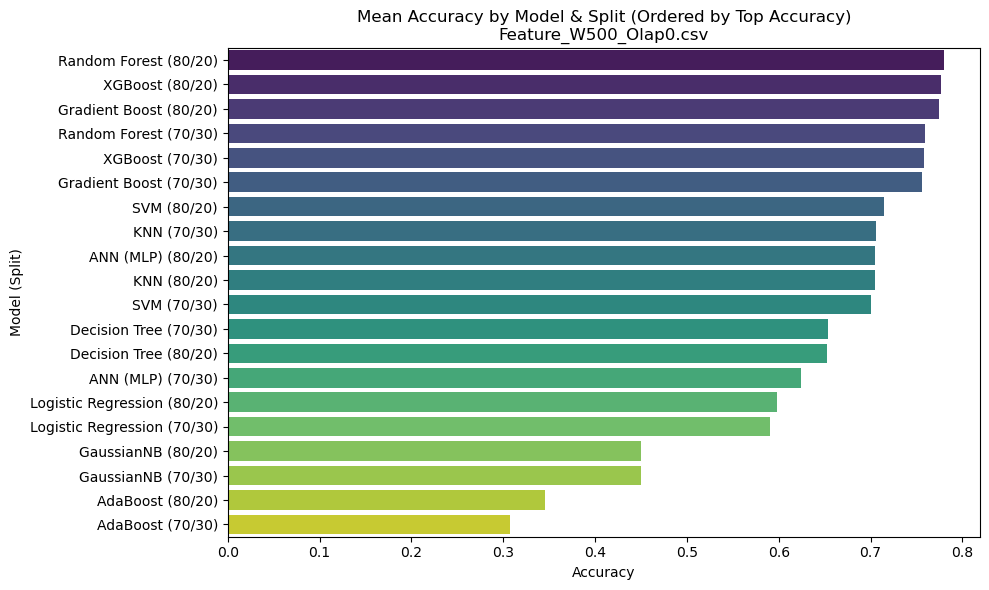

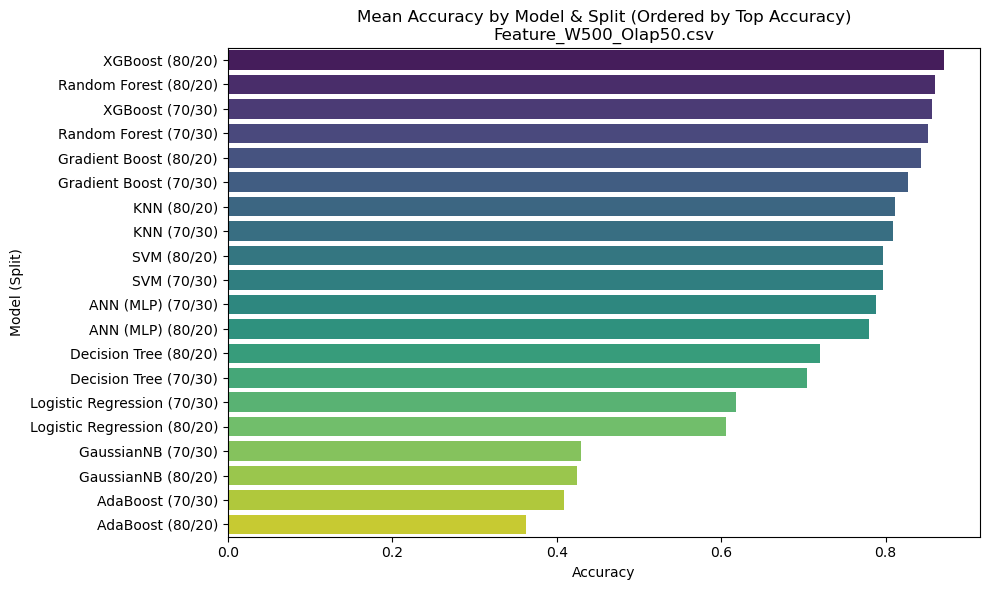

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1) Load only the columns we need
df = pd.read_csv(
    'Final_Project_All_Results.csv',
    usecols=['Feature File', 'Model', 'Split', 'Accuracy']
)

# 2) Compute mean accuracy for each Feature File → Model → Split
pivot = (
    df
    .groupby(['Feature File', 'Model', 'Split'])['Accuracy']
    .mean()
    .unstack()  # gives two columns: '70/30' & '80/20'
)


# --- NEW version: Per Feature File, ordered by best performance (highest mean) ---

# Flatten for sorting
flat = (
    df
    .groupby(['Feature File', 'Model', 'Split'])['Accuracy']
    .mean()
    .reset_index()
)

# Create one chart per feature file
for feature_file in flat['Feature File'].unique():
    subset = flat[flat['Feature File'] == feature_file]

    # Create a combined label to sort easily
    subset['Label'] = subset['Model'] + ' (' + subset['Split'] + ')'
    
    # Sort by Accuracy (highest first)
    subset = subset.sort_values('Accuracy', ascending=False)

    plt.figure(figsize=(10,6))
    sns.barplot(
        data=subset,
        x='Accuracy',
        y='Label',
        palette='viridis'
    )
    plt.title(f'Mean Accuracy by Model & Split (Ordered by Top Accuracy)\n{feature_file}')
    plt.xlabel('Accuracy')
    plt.ylabel('Model (Split)')
    plt.tight_layout()
    plt.show()


#### Full Ranked List across All Feature Files, Models, and Splits

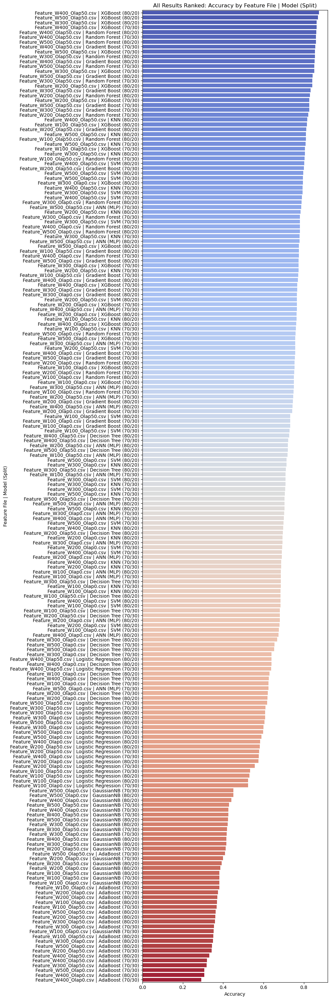

In [42]:
# --- New: Top Accuracies Overall (All Feature Files, All Models, All Splits) ---

# Build combined label for clarity
flat['Full Label'] = (
    flat['Feature File'] + ' | ' + flat['Model'] + ' (' + flat['Split'] + ')'
)

# Sort everything by accuracy
flat_sorted = flat.sort_values('Accuracy', ascending=False)

# Display top 20 (or all if you prefer)
plt.figure(figsize=(10, max(8, len(flat_sorted) * 0.15)))
sns.barplot(
    data=flat_sorted,
    x='Accuracy',
    y='Full Label',
    palette='coolwarm'
)
plt.title('All Results Ranked: Accuracy by Feature File | Model (Split)')
plt.xlabel('Accuracy')
plt.ylabel('Feature File | Model (Split)')
plt.tight_layout()
plt.show()


#### Split Performance Overview (Independent of Model)

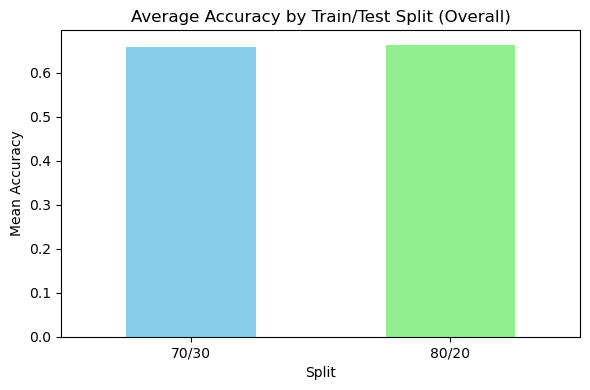

In [43]:
# Split-wise overall comparison
split_mean = df.groupby('Split')['Accuracy'].mean()

plt.figure(figsize=(6,4))
split_mean.plot(kind='bar', color=['skyblue', 'lightgreen'])
plt.title('Average Accuracy by Train/Test Split (Overall)')
plt.ylabel('Mean Accuracy')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


#### Model Performance Across All Feature Files and Splits

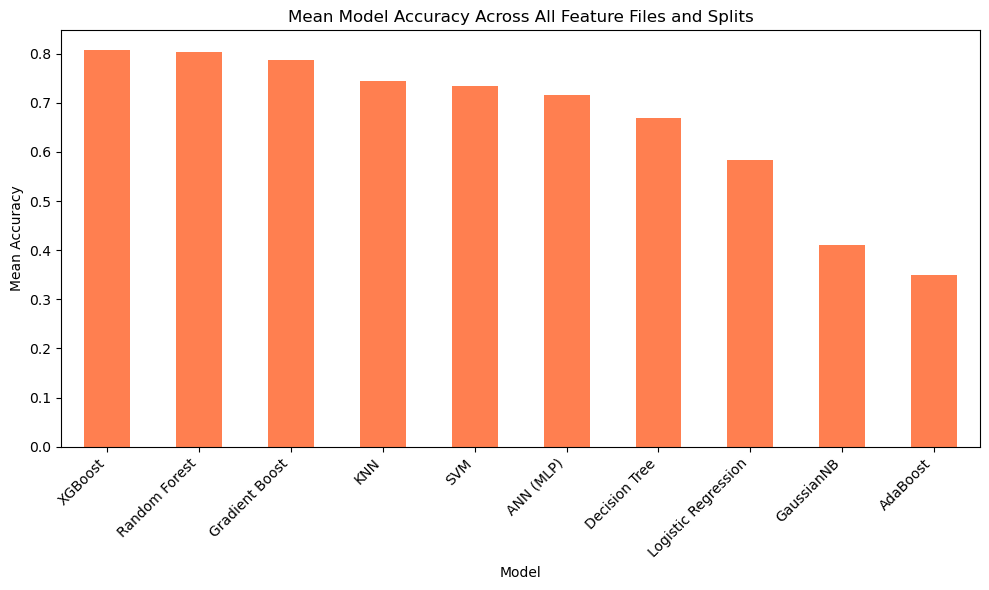

In [44]:
model_mean = df.groupby('Model')['Accuracy'].mean().sort_values(ascending=False)

plt.figure(figsize=(10,6))
model_mean.plot(kind='bar', color='coral')
plt.title('Mean Model Accuracy Across All Feature Files and Splits')
plt.ylabel('Mean Accuracy')
plt.xlabel('Model')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


#### Feature File Performance Overview

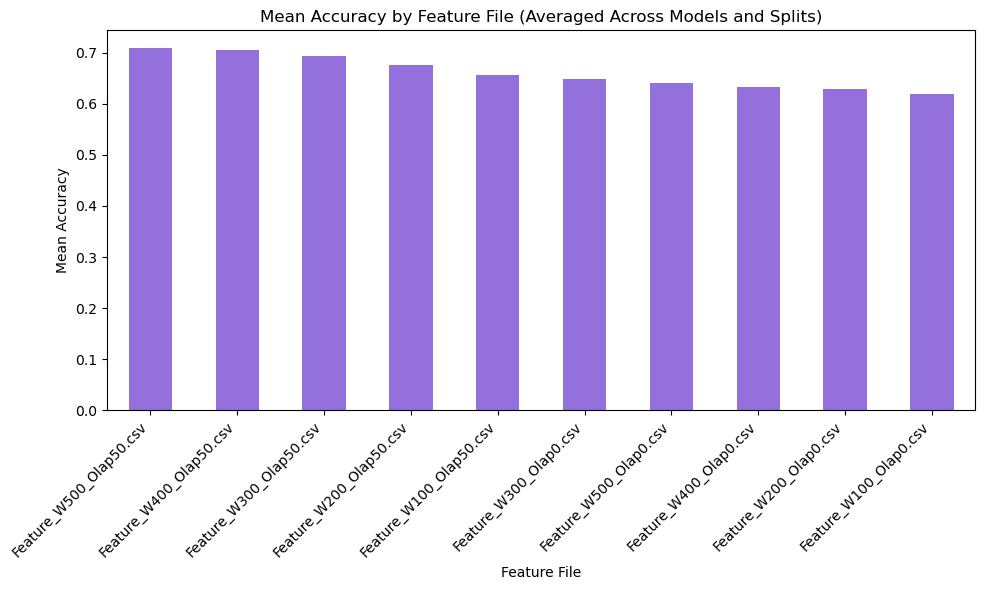

In [45]:
feature_mean = df.groupby('Feature File')['Accuracy'].mean().sort_values(ascending=False)

plt.figure(figsize=(10,6))
feature_mean.plot(kind='bar', color='mediumpurple')
plt.title('Mean Accuracy by Feature File (Averaged Across Models and Splits)')
plt.ylabel('Mean Accuracy')
plt.xlabel('Feature File')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


#### Overall Ranked Table

In [46]:
# Load full stats
df = pd.read_csv('Final_Project_All_Results.csv', usecols=[
    "Feature File", "Model", "Split", "Accuracy", "Precision", "Recall", "F1-Score", "ROC_AUC",
    "CV Mean Accuracy", "CV Std Accuracy", "Best Params"
])

# Full Overall Table (group and only average numeric columns)
overall_table = (
    df
    .groupby(['Feature File', 'Model', 'Split'], as_index=False)
    .mean(numeric_only=True)
    .sort_values(by='Accuracy', ascending=False)
)

# Show
print("\n=== Overall Ranked Performance Table ===")
display(overall_table.head(20))   # Top 20 entries



=== Overall Ranked Performance Table ===


,Feature File,Model,Split,Accuracy,Precision,Recall,F1-Score,ROC_AUC,CV Mean Accuracy,CV Std Accuracy
159,Feature_W400_Olap50.csv,XGBoost,80/20,0.874740,0.875213,0.874740,0.873713,0.991396,0.868927,0.008955
199,Feature_W500_Olap50.csv,XGBoost,80/20,0.871192,0.871188,0.871192,0.870862,0.990464,0.869955,0.014833
119,Feature_W300_Olap50.csv,XGBoost,80/20,0.864503,0.864209,0.864503,0.863013,0.989863,0.857393,0.004914
158,Feature_W400_Olap50.csv,XGBoost,70/30,0.864391,0.866937,0.864391,0.863916,0.990611,0.868927,0.008955
155,Feature_W400_Olap50.csv,Random Forest,80/20,0.861592,0.863118,0.861592,0.860184,0.989870,0.852180,0.007345
154,Feature_W400_Olap50.csv,Random Forest,70/30,0.860240,0.861165,0.860240,0.859395,0.988241,0.856332,0.006011
195,Feature_W500_Olap50.csv,Random Forest,80/20,0.859878,0.862260,0.859878,0.860135,0.989573,0.864556,0.011023
148,Feature_W400_Olap50.csv,Gradient Boost,70/30,0.857472,0.858789,0.857472,0.856928,0.985739,0.844567,0.007714
198,Feature_W500_Olap50.csv,XGBoost,70/30,0.856148,0.856531,0.856148,0.856120,0.989847,0.869955,0.014833
115,Feature_W300_Olap50.csv,Random Forest,80/20,0.855229,0.855541,0.855229,0.853985,0.987514,0.848738,0.007851


#### Mean Accuracy and Stats by Model

In [47]:
# Mean performance per Model
model_mean_table = (
    df
    .groupby('Model')[['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC_AUC', 'CV Mean Accuracy', 'CV Std Accuracy']]
    .mean()
    .sort_values(by='Accuracy', ascending=False)
    .reset_index()
)

# Show
print("\n=== Mean Accuracy by Model ===")
display(model_mean_table)



=== Mean Accuracy by Model ===


,Model,Accuracy,Precision,Recall,F1-Score,ROC_AUC,CV Mean Accuracy,CV Std Accuracy
0,XGBoost,0.807221,0.807906,0.807221,0.806361,0.979822,0.812238,0.008265
1,Random Forest,0.803581,0.805070,0.803581,0.802723,0.978279,0.807554,0.008607
2,Gradient Boost,0.787591,0.788622,0.787591,0.787079,0.974051,0.790926,0.007838
3,KNN,0.743756,0.742047,0.743756,0.740911,0.924140,0.745713,0.008263
4,SVM,0.734551,0.739901,0.734551,0.735001,0.956844,0.741539,0.009555
5,ANN (MLP),0.716609,0.718694,0.716609,0.714733,0.965154,0.719461,0.016247
6,Decision Tree,0.669590,0.672279,0.669590,0.669655,0.832444,0.670495,0.010672
7,Logistic Regression,0.584088,0.588030,0.584088,0.580220,0.931491,0.586839,0.010274
8,GaussianNB,0.411586,0.448166,0.411586,0.397349,0.882249,0.411218,0.009316
9,AdaBoost,0.348846,0.336944,0.348846,0.294047,0.837644,0.335855,0.024162


#### Mean Accuracy and Stats by Feature File

In [48]:
# Mean performance per Feature File
featurefile_mean_table = (
    df
    .groupby('Feature File')[['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC_AUC', 'CV Mean Accuracy', 'CV Std Accuracy']]
    .mean()
    .sort_values(by='Accuracy', ascending=False)
    .reset_index()
)

# Show
print("\n=== Mean Accuracy by Feature File ===")
display(featurefile_mean_table)



=== Mean Accuracy by Feature File ===


,Feature File,Accuracy,Precision,Recall,F1-Score,ROC_AUC,CV Mean Accuracy,CV Std Accuracy
0,Feature_W500_Olap50.csv,0.708325,0.711769,0.708325,0.701197,0.943745,0.713242,0.012636
1,Feature_W400_Olap50.csv,0.705524,0.706884,0.705524,0.695413,0.940791,0.701315,0.012021
2,Feature_W300_Olap50.csv,0.693690,0.699389,0.693690,0.686636,0.935448,0.695131,0.009365
3,Feature_W200_Olap50.csv,0.676815,0.682744,0.676815,0.670307,0.928766,0.679340,0.006719
4,Feature_W100_Olap50.csv,0.655779,0.660943,0.655779,0.649908,0.920897,0.659059,0.006226
5,Feature_W300_Olap0.csv,0.648575,0.656991,0.648575,0.640641,0.922154,0.640028,0.014105
6,Feature_W500_Olap0.csv,0.640321,0.645127,0.640321,0.630094,0.914610,0.641227,0.018692
7,Feature_W400_Olap0.csv,0.632183,0.630763,0.632183,0.619568,0.925843,0.642396,0.012409
8,Feature_W200_Olap0.csv,0.627994,0.630178,0.627994,0.621330,0.916749,0.631289,0.011197
9,Feature_W100_Olap0.csv,0.618213,0.622873,0.618213,0.612988,0.913116,0.618811,0.009831


#### Mean Accuracy and Stats by Split

In [49]:
# Mean performance per Split (70/30 vs 80/20)
split_mean_table = (
    df
    .groupby('Split')[['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC_AUC', 'CV Mean Accuracy', 'CV Std Accuracy']]
    .mean()
    .sort_values(by='Accuracy', ascending=False)
    .reset_index()
)

# Show
print("\n=== Mean Accuracy by Train/Test Split ===")
display(split_mean_table)



=== Mean Accuracy by Train/Test Split ===


,Split,Accuracy,Precision,Recall,F1-Score,ROC_AUC,CV Mean Accuracy,CV Std Accuracy
0,80/20,0.663344,0.667597,0.663344,0.655986,0.927837,0.662568,0.01134
1,70/30,0.658139,0.661935,0.658139,0.649630,0.924587,0.661800,0.01130


#### Additional Overview: Comprehensively Comparing Performance Metrics

In [50]:
# Load the Final Results
import pandas as pd
df = pd.read_csv('Final_Project_All_Results.csv')

# Display a sample
df.head()


,Feature File,Model,Split,Accuracy,Precision,Recall,F1-Score,ROC_AUC,CV Mean Accuracy,CV Std Accuracy,Best Params
0,Feature_W100_Olap0.csv,ANN (MLP),70/30,0.686217,0.689226,0.686217,0.685048,0.955055,0.692609,0.006983,"{'solver': 'adam', 'learning_rate': 'adaptive'..."
1,Feature_W100_Olap0.csv,ANN (MLP),80/20,0.687077,0.686622,0.687077,0.683789,0.954467,0.692609,0.006983,"{'solver': 'adam', 'learning_rate': 'adaptive'..."
2,Feature_W100_Olap0.csv,AdaBoost,70/30,0.381232,0.395577,0.381232,0.362855,0.829085,0.364781,0.027604,"{'n_estimators': 200, 'learning_rate': 0.1}"
3,Feature_W100_Olap0.csv,AdaBoost,80/20,0.369080,0.365082,0.369080,0.344581,0.829991,0.364781,0.027604,"{'n_estimators': 200, 'learning_rate': 0.1}"
4,Feature_W100_Olap0.csv,Decision Tree,70/30,0.624408,0.623999,0.624408,0.623504,0.833826,0.621751,0.008703,"{'min_samples_split': 10, 'min_samples_leaf': ..."


In [51]:
# Group by Feature File, Model, and Split
full_summary = (
    df.groupby(['Feature File', 'Model', 'Split'])
    .mean(numeric_only=True)
    .reset_index()
    .sort_values('Accuracy', ascending=False)
)

# Group by Model
model_summary = (
    df.groupby('Model')[['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC_AUC', 'CV Mean Accuracy', 'CV Std Accuracy']]
    .mean()
    .sort_values('Accuracy', ascending=False)
    .reset_index()
)

# Group by Feature File
feature_summary = (
    df.groupby('Feature File')[['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC_AUC', 'CV Mean Accuracy', 'CV Std Accuracy']]
    .mean()
    .sort_values('Accuracy', ascending=False)
    .reset_index()
)

# Group by Split
split_summary = (
    df.groupby('Split')[['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC_AUC', 'CV Mean Accuracy', 'CV Std Accuracy']]
    .mean()
    .sort_values('Accuracy', ascending=False)
    .reset_index()
)

# Group by Model and Split
model_split_summary = (
    df.groupby(['Model', 'Split'])[['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC_AUC', 'CV Mean Accuracy', 'CV Std Accuracy']]
    .mean()
    .reset_index()
)

# Create a new column combining Model and Split
model_split_summary['Model (Split)'] = model_split_summary['Model'] + ' (' + model_split_summary['Split'] + ')'


#### Accuracy by Model and Split

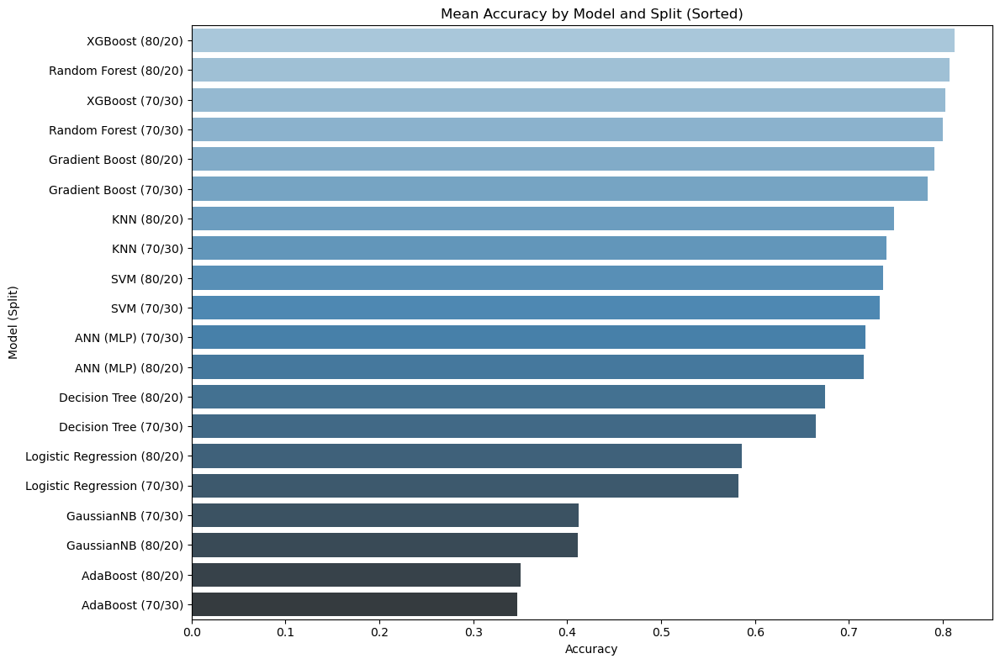

In [52]:
sorted_df = model_split_summary.sort_values('Accuracy', ascending=False)

plt.figure(figsize=(12,8))
sns.barplot(data=sorted_df, x='Accuracy', y='Model (Split)', palette='Blues_d')
plt.title('Mean Accuracy by Model and Split (Sorted)')
plt.xlabel('Accuracy')
plt.ylabel('Model (Split)')
plt.tight_layout()
plt.show()


#### F-1 Score by Model and Split

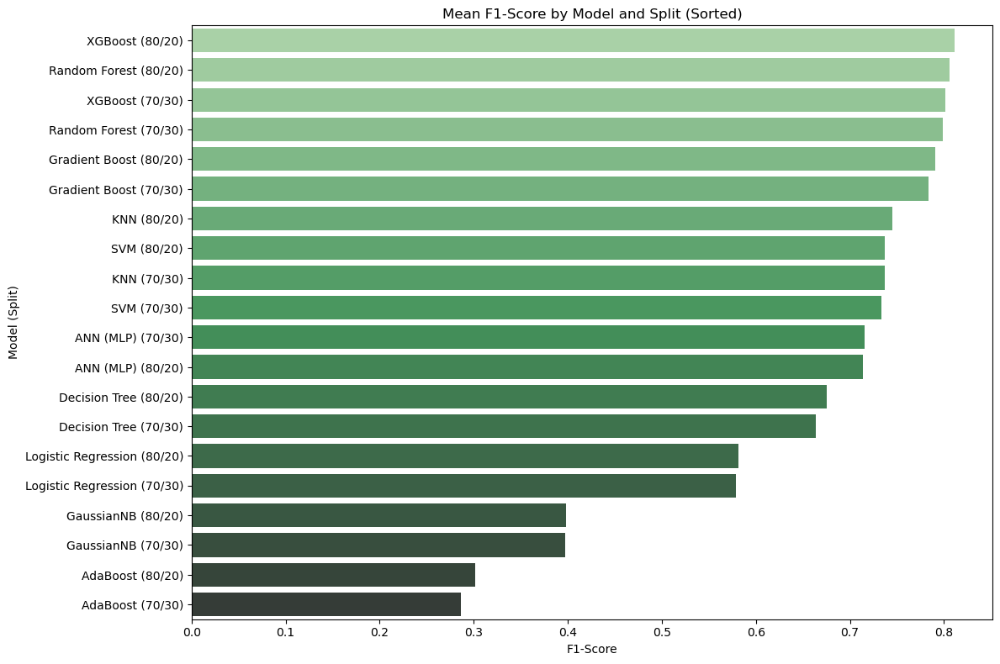

In [53]:
sorted_df = model_split_summary.sort_values('F1-Score', ascending=False)

plt.figure(figsize=(12,8))
sns.barplot(data=sorted_df, x='F1-Score', y='Model (Split)', palette='Greens_d')
plt.title('Mean F1-Score by Model and Split (Sorted)')
plt.xlabel('F1-Score')
plt.ylabel('Model (Split)')
plt.tight_layout()
plt.show()


#### Precision by Model and Split

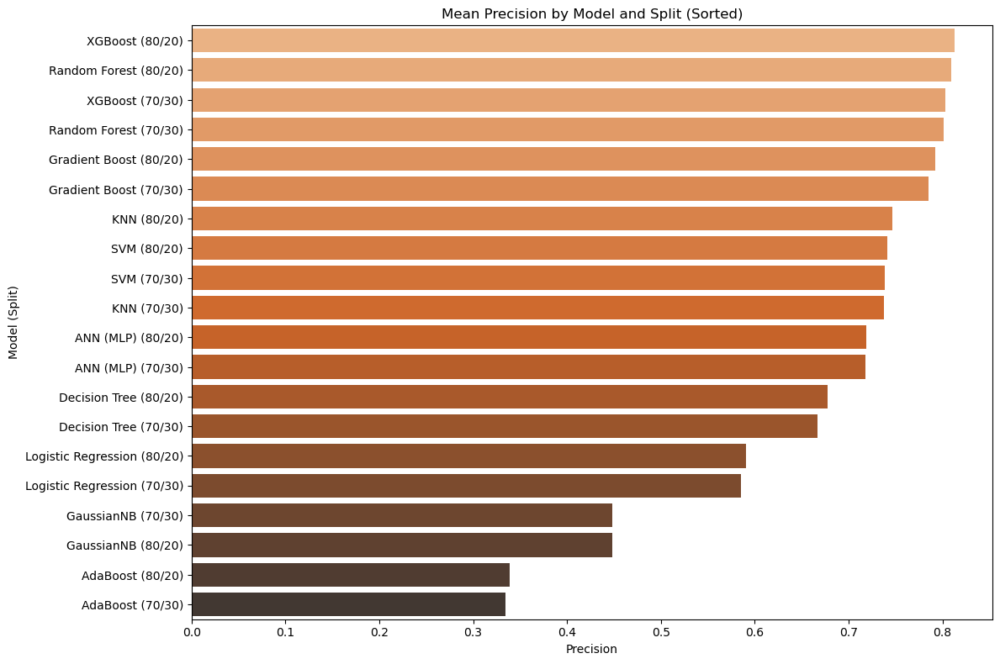

In [54]:
sorted_df = model_split_summary.sort_values('Precision', ascending=False)

plt.figure(figsize=(12,8))
sns.barplot(data=sorted_df, x='Precision', y='Model (Split)', palette='Oranges_d')
plt.title('Mean Precision by Model and Split (Sorted)')
plt.xlabel('Precision')
plt.ylabel('Model (Split)')
plt.tight_layout()
plt.show()


#### Recall by Model and Split

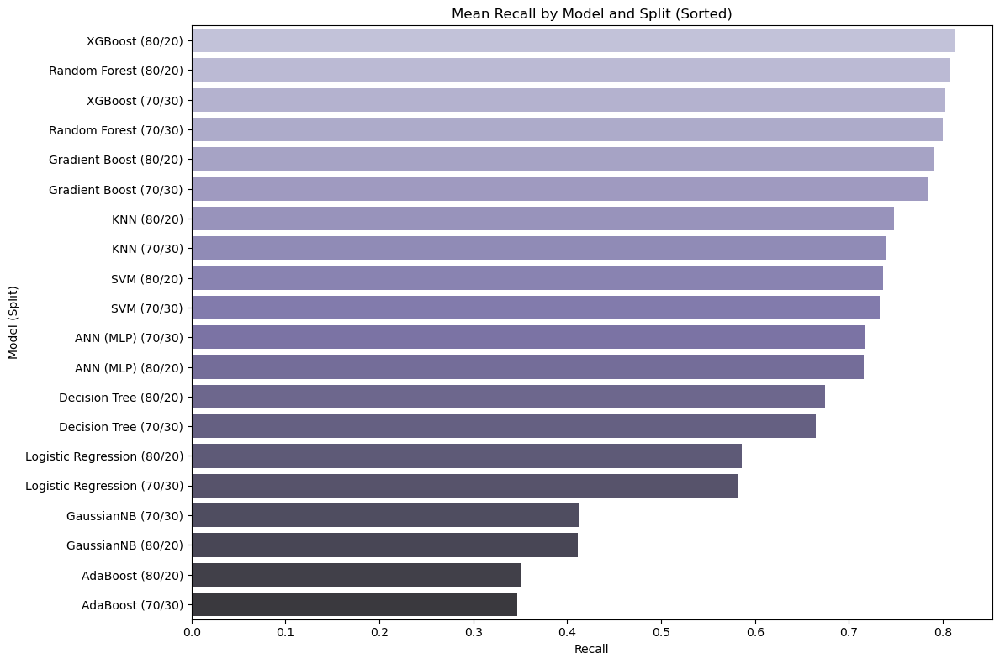

In [55]:
sorted_df = model_split_summary.sort_values('Recall', ascending=False)

plt.figure(figsize=(12,8))
sns.barplot(data=sorted_df, x='Recall', y='Model (Split)', palette='Purples_d')
plt.title('Mean Recall by Model and Split (Sorted)')
plt.xlabel('Recall')
plt.ylabel('Model (Split)')
plt.tight_layout()
plt.show()


#### ROC-AUC by Model and Split

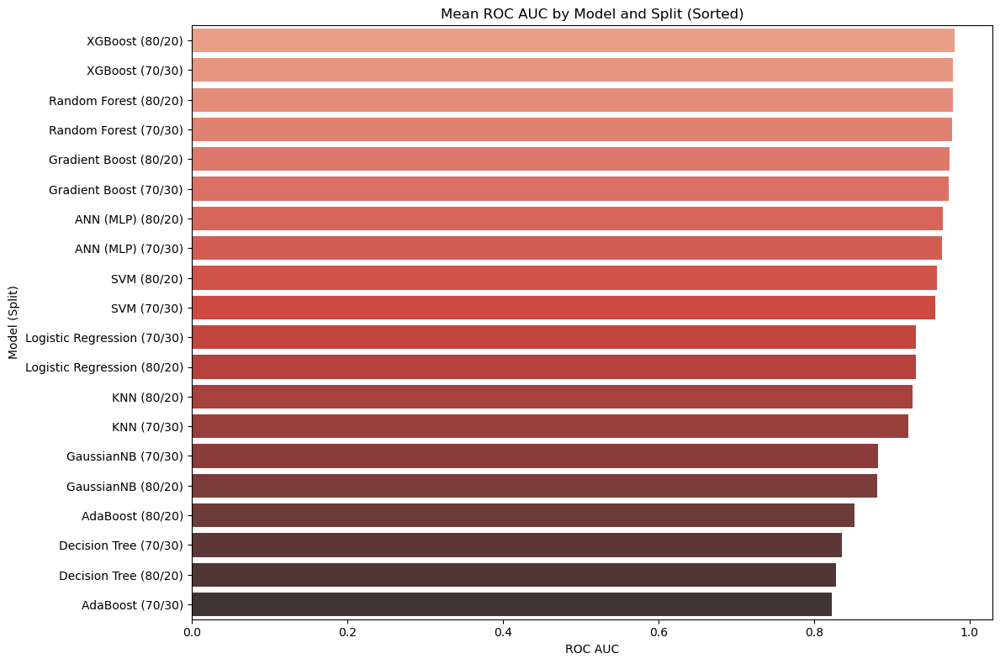

In [56]:
sorted_df = model_split_summary.sort_values('ROC_AUC', ascending=False)

plt.figure(figsize=(12,8))
sns.barplot(data=sorted_df, x='ROC_AUC', y='Model (Split)', palette='Reds_d')
plt.title('Mean ROC AUC by Model and Split (Sorted)')
plt.xlabel('ROC AUC')
plt.ylabel('Model (Split)')
plt.tight_layout()
plt.show()


In [57]:
# Export tables if needed
full_summary.to_csv('Full_Model_Rankings.csv', index=False)
model_summary.to_csv('Model_Summary.csv', index=False)
feature_summary.to_csv('Ft_Summary.csv', index=False)
split_summary.to_csv('Split_Summary.csv', index=False)

# Display
full_summary.head(20)  # Top models
model_summary
feature_summary
split_summary

,Split,Accuracy,Precision,Recall,F1-Score,ROC_AUC,CV Mean Accuracy,CV Std Accuracy
0,80/20,0.663344,0.667597,0.663344,0.655986,0.927837,0.662568,0.01134
1,70/30,0.658139,0.661935,0.658139,0.649630,0.924587,0.661800,0.01130


#### Heatmap of Mean Accuracy

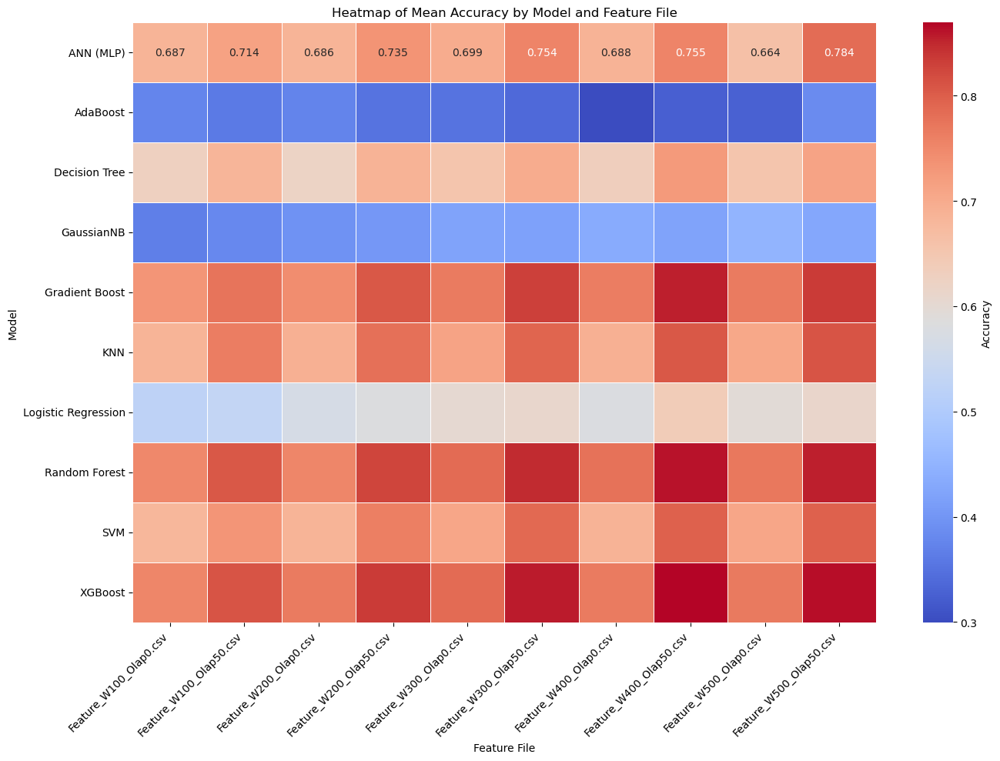

In [58]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('Final_Project_All_Results.csv', usecols=[
    'Feature File', 'Model', 'Split', 'Accuracy'
])

# Create pivot table
pivot_table = df.pivot_table(
    index='Model', 
    columns='Feature File', 
    values='Accuracy', 
    aggfunc='mean'
)

# Plot heatmap with actual accuracy numbers inside the cells
plt.figure(figsize=(14,10))
sns.heatmap(
    pivot_table, 
    annot=True,
    fmt=".3f",
    cmap="coolwarm", 
    linewidths=0.5, 
    cbar_kws={'label': 'Accuracy'}
)
plt.title('Heatmap of Mean Accuracy by Model and Feature File')
plt.ylabel('Model')
plt.xlabel('Feature File')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


## Export to PDF

In [9]:
import pdfkit
import os
notebook_path = os.path.join(current_directory, 'Noah_Emmert_CSE432_FinalReport.ipynb')
print(notebook_path)

c:\Users\npemm\Downloads\cse432_proj\cse432_proj\Noah_Emmert_CSE432_FinalReport.ipynb


In [10]:
config = pdfkit.configuration(wkhtmltopdf=r"C:\Program Files\wkhtmltopdf\bin\wkhtmltopdf.exe")

notebook_html = os.path.join(current_directory, "Noah_Emmert_CSE432_FinalReport.html")
output_pdf = os.path.join(current_directory, "Noah_Emmert_CSE432_FinalReport.pdf")

# Convert HTML to PDF
pdfkit.from_file(notebook_html, output_pdf, configuration=config)


True